this notebook does some spot checking on learned weight patterns in `scripts/training/yuanyuan_8k_a_3day/feature_approximation/local_pcn_recurrent/submit_sep2.py`.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
from thesis_v2 import dir_dict
from thesis_v2.training.training_aux import load_training_results

In [3]:
from sys import path
from os.path import join, exists, dirname
from os import makedirs



In [4]:
folder_to_check = 'scripts/training/yuanyuan_8k_a_3day/feature_approximation/local_pcn_recurrent'
path.insert(0, join(dir_dict['root'], folder_to_check))
from submit_sep2 import param_iterator

In [5]:
from numpy.linalg import norm
import numpy as np

In [6]:
from pickle import load

In [7]:
def load_one_result(filename):
    with open(filename, 'rb') as f:
        return load(f)

In [8]:
# create dir
global_vars = {
    'save_dir': join(dir_dict['analyses'],
                     'yuanyuan_8k_a_3day+feature_approximation+local_pcn_recurrent+submit_sep2',
                    'pca')
}

In [9]:
from math import sqrt
from torchvision.utils import make_grid
from torch import tensor

In [10]:
def do_analysis(label_fname_list):
    for label, fname in label_fname_list:
        print(label)
        data = load_one_result(fname)
        for x, y in data.items():
            print(x, y.dtype, y.shape)
            
        
        # ok. what to show here?
        # first, let's reshape `components`.
        components = data['components']
        assert components.ndim == 2
        n_el_per_filter = components.shape[1]
        kernel_size = round(sqrt(n_el_per_filter))
        assert type(kernel_size) is int and kernel_size**2 == n_el_per_filter
        components = components.reshape(components.shape[0], 1, kernel_size, kernel_size)
        
        # this components is ready to be displayed using pytorch's util
        components_grid = make_grid(tensor(components), nrow=10,normalize=True, scale_each=True)
        components_grid = components_grid.numpy().transpose(1, 2, 0)
        print(np.cumsum(data['explained_variance_ratio'])[:20])
        plt.close('all')
        plt.figure(figsize=(12,10))
        plt.imshow(components_grid,vmin=0.0,vmax=1.0,interpolation='none')
        plt.show()
        

In [11]:
def collect_all():
    save_dir = global_vars['save_dir']
    count = 0
    for idx, data in enumerate(param_iterator()):
        count += 1
        verbose = idx % 10 == 1
        
        
        
        key = data['key_this_original']
        
        if '/k9/' not in key:
            continue
        
        def filename_gen(x):
            return join(save_dir, f'{idx}/unit_norm', f'{x}.pkl')
        
        filename_set = {'ff', 'lateral', 'all'}
        if not all([exists(filename_gen(x)) for x in filename_set]):
            # right now if partially done, the partial results will be fully overwritten.
            continue
            raise RuntimeError('bug!')
        
        if verbose:
            print(key)
            
            # load lateral one
            do_analysis([(x, filename_gen(x)) for x in ['lateral','ff','all']])
        
        
    print(count)


yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx10/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16652614 0.26218302 0.34156297 0.39912135 0.44757692 0.49002535
 0.53090982 0.5652554  0.59532671 0.62227309 0.64667416 0.66969363
 0.69020139 0.70866418 0.72597106 0.74145324 0.75622988 0.77000641
 0.78311576 0.79577403]


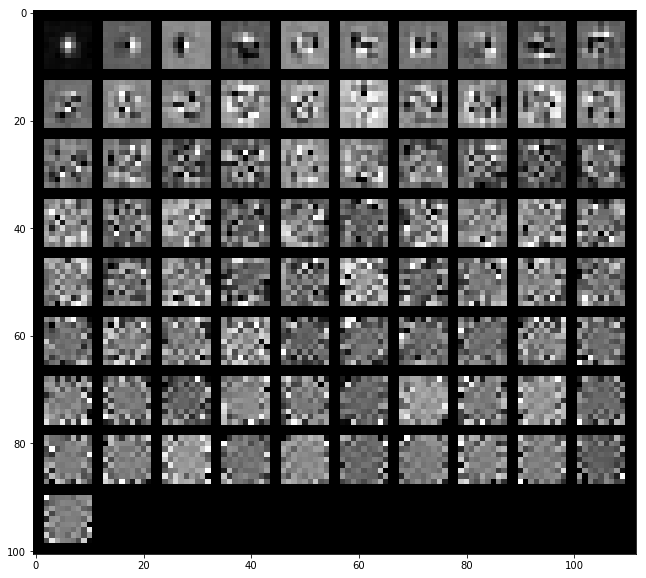

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16529995 0.25423967 0.33622467 0.40305592 0.45379677 0.49890003
 0.53575735 0.56479152 0.59323591 0.62045881 0.64217124 0.66310049
 0.68172205 0.69877427 0.71487054 0.73034225 0.74425693 0.75714474
 0.76967322 0.78138309]


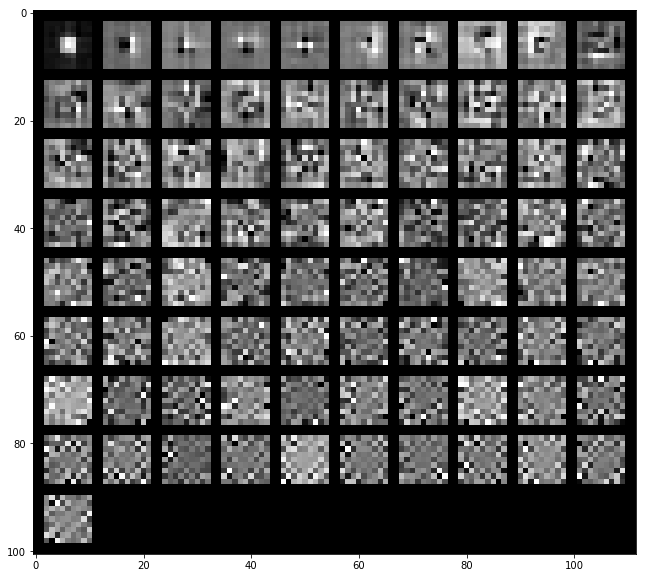

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15995128 0.2498588  0.32692385 0.38478495 0.43106312 0.47212461
 0.50813796 0.54140448 0.5707055  0.59593424 0.61778423 0.63741029
 0.65665664 0.6751343  0.69251375 0.70862994 0.7229691  0.7364801
 0.74990543 0.76237647]


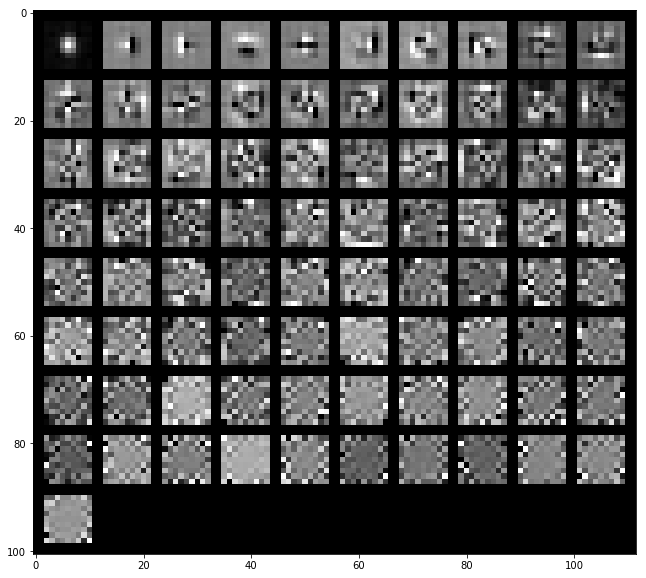

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx11/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15626081 0.24951251 0.33502869 0.39855817 0.44759044 0.48847417
 0.52565615 0.55834856 0.58624215 0.6084044  0.62914107 0.64916689
 0.66672022 0.68327722 0.69892155 0.71369288 0.72764382 0.74088239
 0.75329402 0.76487984]


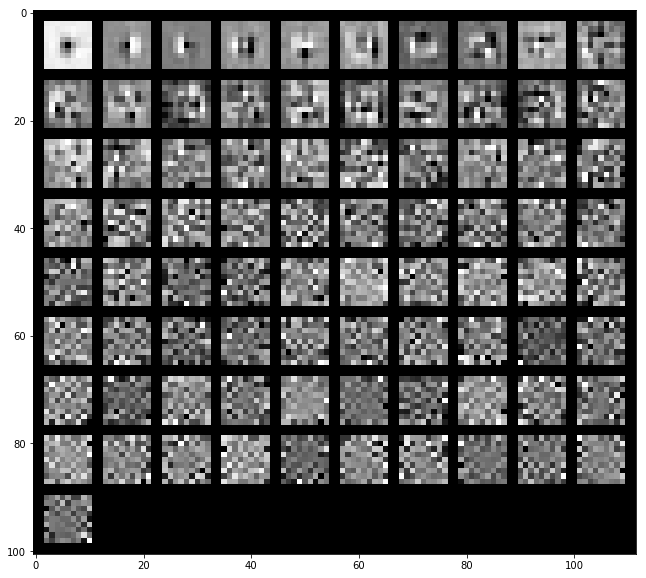

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19297059 0.29425287 0.38888423 0.46828463 0.52857067 0.56882288
 0.6024285  0.62817901 0.6524437  0.67509098 0.69360782 0.71044183
 0.72472079 0.7384687  0.75105432 0.76337076 0.77451881 0.78537355
 0.7957388  0.80516109]


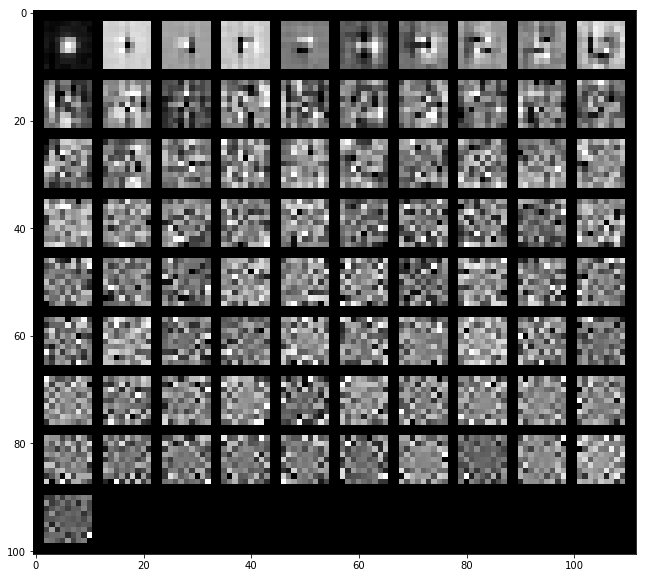

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16934912 0.26525165 0.34822166 0.42195203 0.47224127 0.51029936
 0.54602979 0.57469266 0.59901341 0.62108957 0.64014013 0.65761698
 0.67396112 0.68827339 0.70225476 0.71544577 0.72826878 0.74013521
 0.75077045 0.76109427]


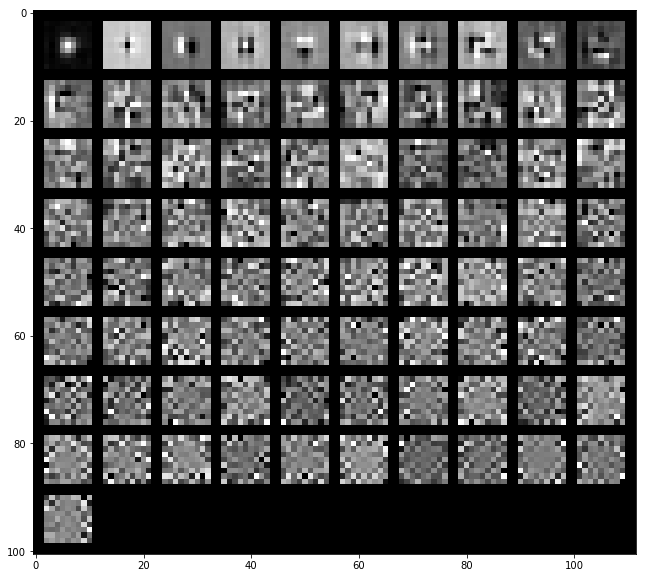

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx22/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.11433774 0.19341204 0.25813258 0.31763769 0.36384917 0.40738311
 0.44514115 0.48116188 0.51629768 0.54741706 0.57641169 0.60285201
 0.6264497  0.64732359 0.66725102 0.68648305 0.70444859 0.72132701
 0.73627043 0.75031622]


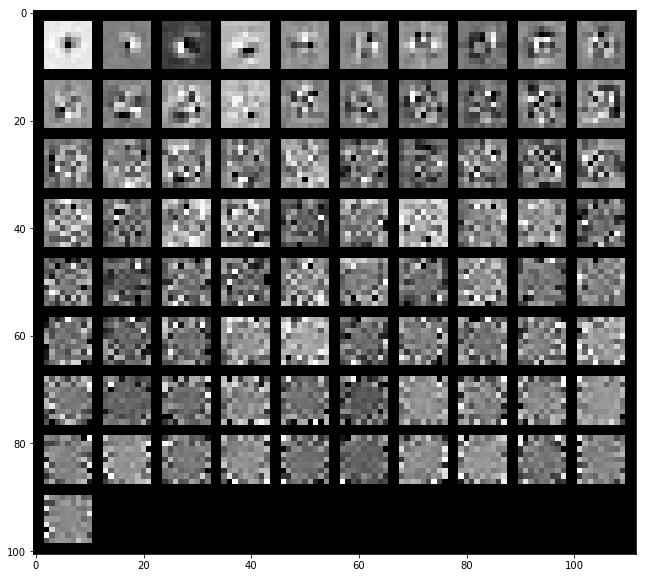

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16914665 0.27485473 0.36018628 0.43585849 0.48823138 0.52986054
 0.56029065 0.58655049 0.6110101  0.63502435 0.65489093 0.67399217
 0.69115754 0.70740196 0.72277056 0.73668089 0.75018619 0.76297356
 0.77462267 0.78589892]


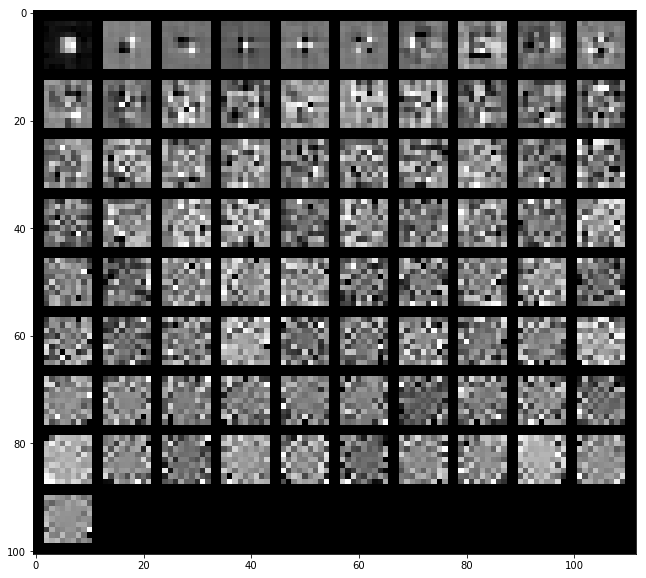

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13592356 0.22222305 0.29625687 0.36154867 0.40815311 0.44690367
 0.48069589 0.51204632 0.54218193 0.56918916 0.59282772 0.61532555
 0.63546031 0.6545584  0.67094833 0.68683791 0.7022463  0.71584598
 0.72879793 0.74123766]


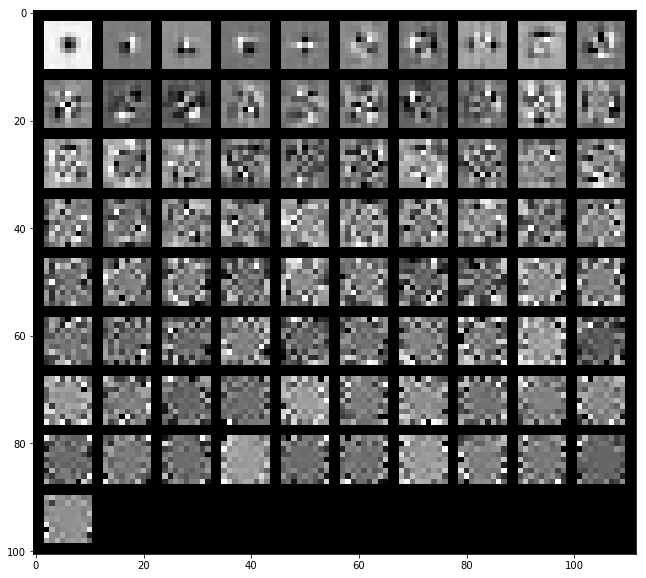

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx23/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14820144 0.23694589 0.31319582 0.38257442 0.43779744 0.48059517
 0.51970178 0.55315611 0.58410362 0.61287896 0.63623957 0.65915394
 0.68040948 0.69955245 0.71760732 0.73363535 0.74814904 0.76213291
 0.7755833  0.78829438]


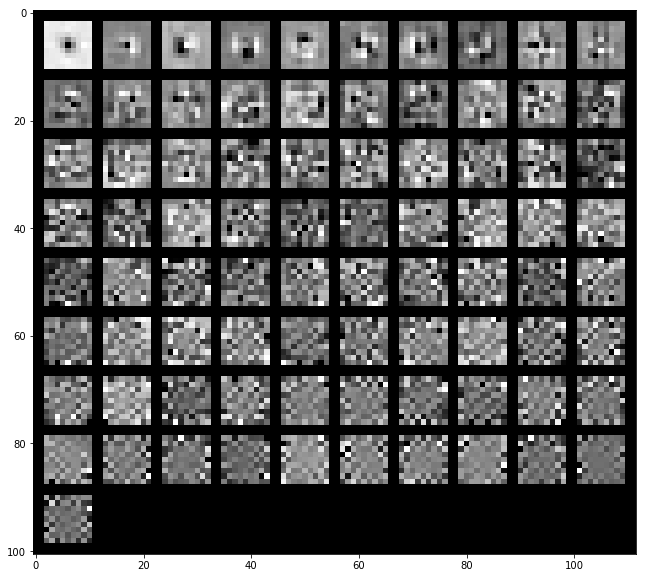

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23959148 0.35698972 0.45747765 0.5412683  0.59393264 0.63273645
 0.66087823 0.68735346 0.70888157 0.72762238 0.74476815 0.76139039
 0.77666613 0.79054582 0.80282111 0.81404812 0.82418204 0.83347521
 0.84259139 0.85155842]


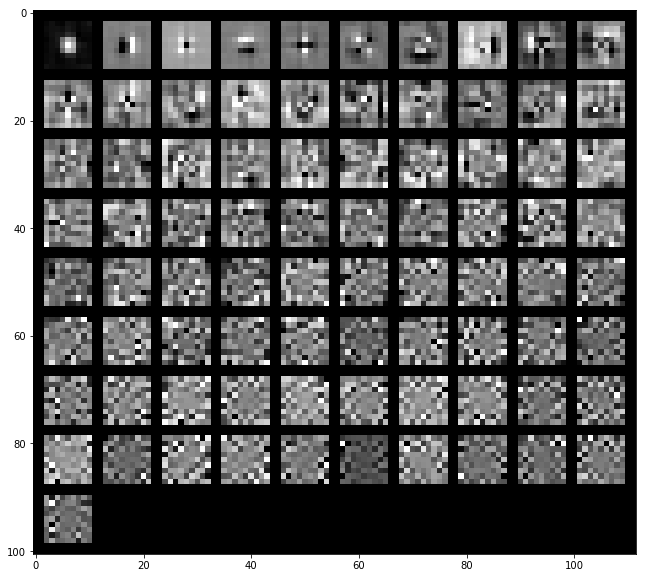

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19101684 0.28925133 0.37794812 0.44343577 0.49489944 0.53440183
 0.56820502 0.59820698 0.6249457  0.64861995 0.66822836 0.68645679
 0.70453225 0.72100769 0.73591966 0.74951684 0.76194124 0.77386225
 0.78509542 0.79589745]


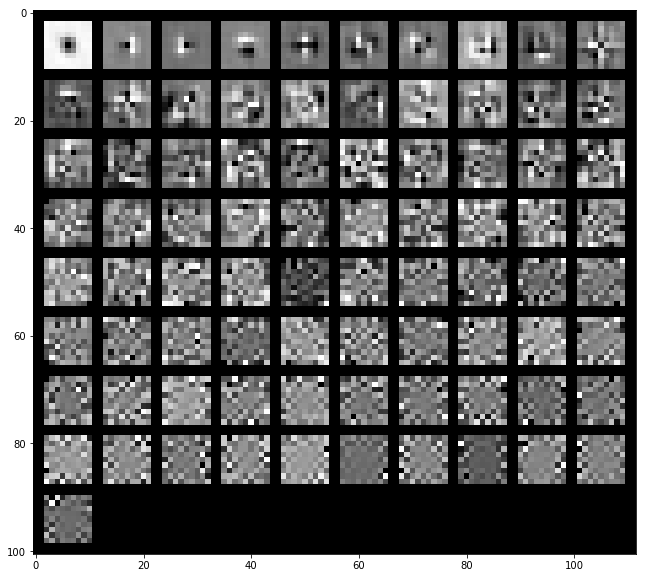

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx35/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18174321 0.27906243 0.36027212 0.43293815 0.48778916 0.53106175
 0.56714957 0.59765792 0.62608817 0.65086064 0.67511505 0.69658184
 0.71730054 0.73560976 0.75294708 0.76793449 0.78246303 0.79624437
 0.80898006 0.82035422]


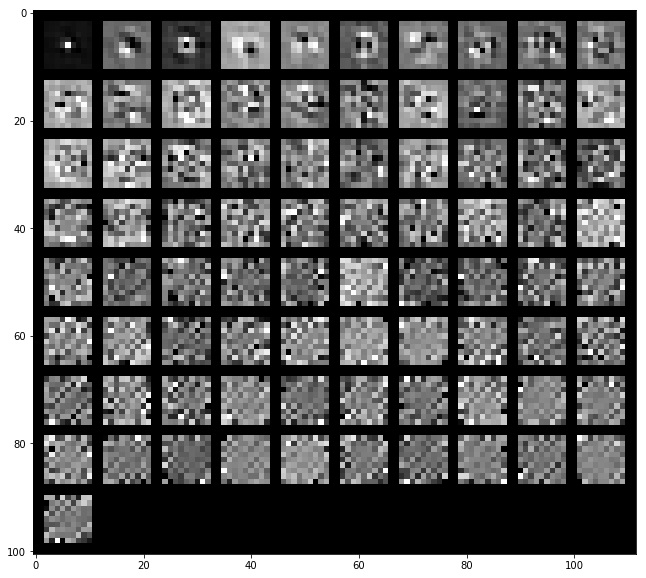

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14510822 0.24693559 0.32271877 0.38708506 0.44287194 0.48497125
 0.52371207 0.55924267 0.58634855 0.61223415 0.63587696 0.65850703
 0.67996048 0.69999118 0.71786745 0.73391963 0.74933174 0.76422594
 0.77739579 0.79023807]


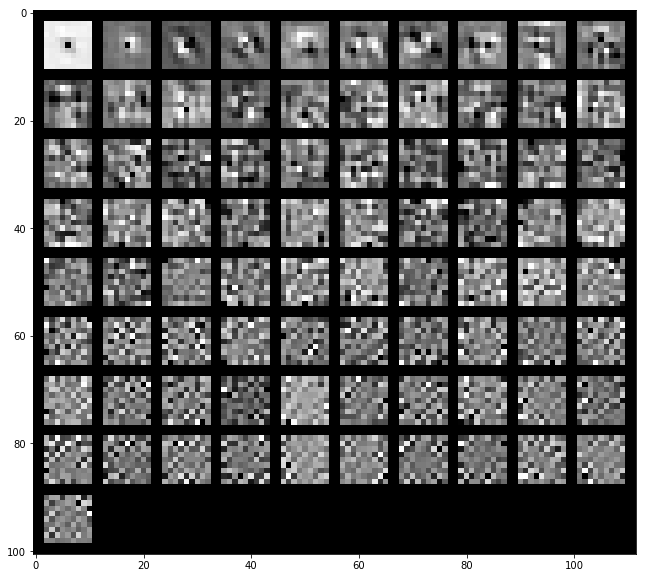

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16304739 0.25296749 0.33300823 0.39426395 0.44902105 0.48948195
 0.52487914 0.55641796 0.58390402 0.60804704 0.63042621 0.65005697
 0.66962559 0.68779854 0.70459556 0.71914258 0.73330933 0.74668532
 0.75986231 0.77208091]


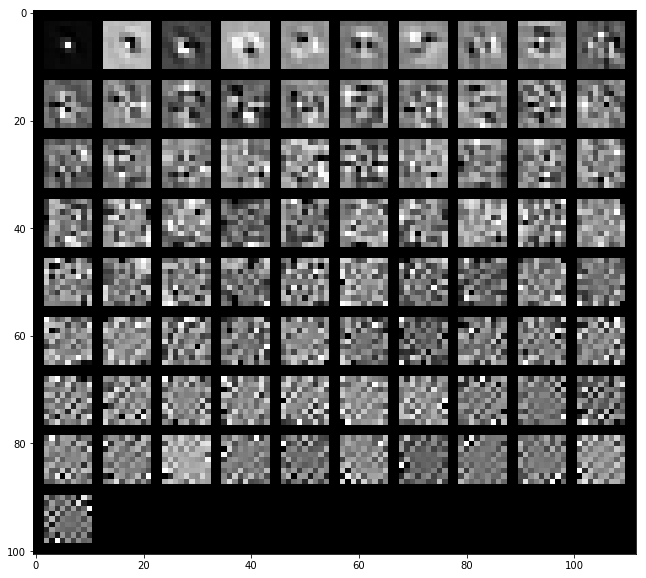

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx46/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1526896  0.24983238 0.32425077 0.38672112 0.43962874 0.48761243
 0.53347994 0.57276147 0.6048751  0.63173933 0.65801895 0.68070974
 0.70147965 0.72146842 0.73969576 0.75540961 0.77062158 0.78453243
 0.79780737 0.80951429]


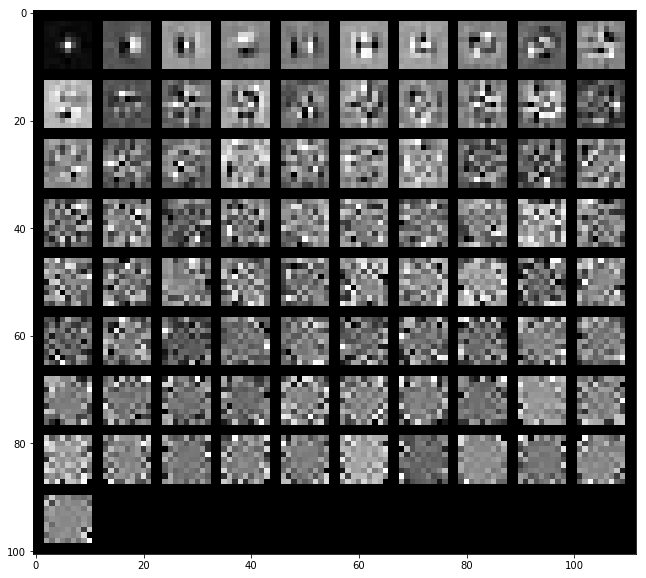

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19935849 0.3045397  0.39183677 0.46489525 0.51382948 0.55613864
 0.59123705 0.61971834 0.64543095 0.66814535 0.68712631 0.70433548
 0.72083809 0.73561071 0.7501709  0.76309362 0.77492357 0.78573102
 0.79645058 0.80687767]


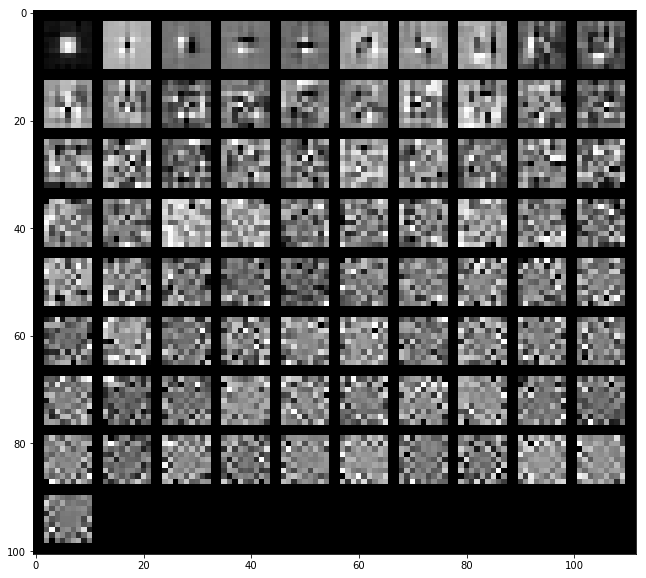

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16701188 0.26532316 0.34930707 0.41359657 0.46147942 0.5063871
 0.54333997 0.57722258 0.60560432 0.63019666 0.65281928 0.67207426
 0.68986495 0.70586706 0.72145822 0.73646709 0.74982938 0.76245732
 0.77457508 0.78591758]


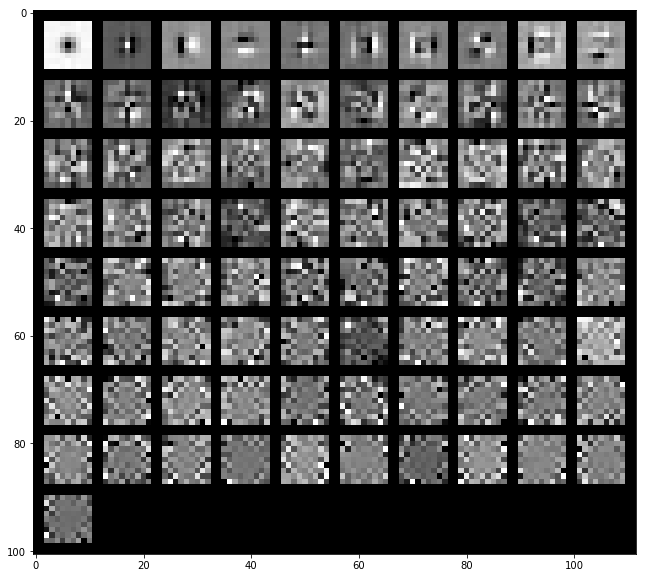

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx47/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14026245 0.24417231 0.34346941 0.40377259 0.45691946 0.50436724
 0.53820275 0.56848889 0.59684985 0.62302917 0.6466589  0.66713109
 0.68665821 0.70481081 0.72186732 0.73845006 0.75436635 0.76758066
 0.78022926 0.79188395]


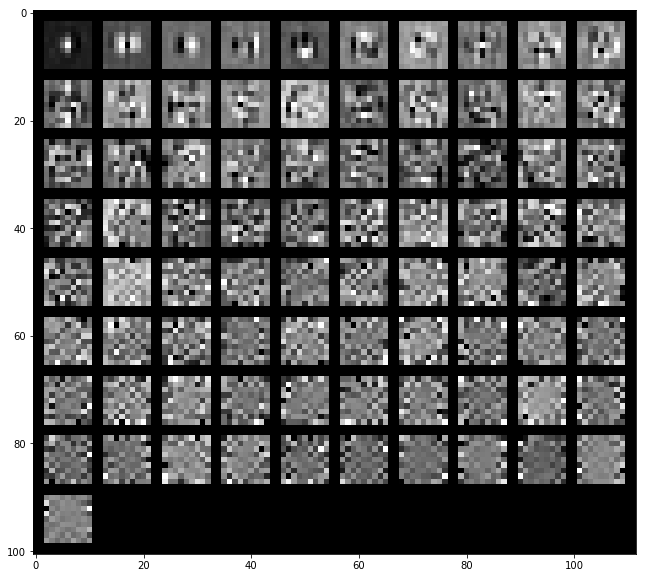

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17940969 0.2735735  0.36009174 0.42612784 0.47212578 0.51336756
 0.55143656 0.58468596 0.61188455 0.6349632  0.65626139 0.67534364
 0.6935256  0.71077639 0.72714206 0.74210609 0.75615398 0.76914932
 0.7812898  0.79269367]


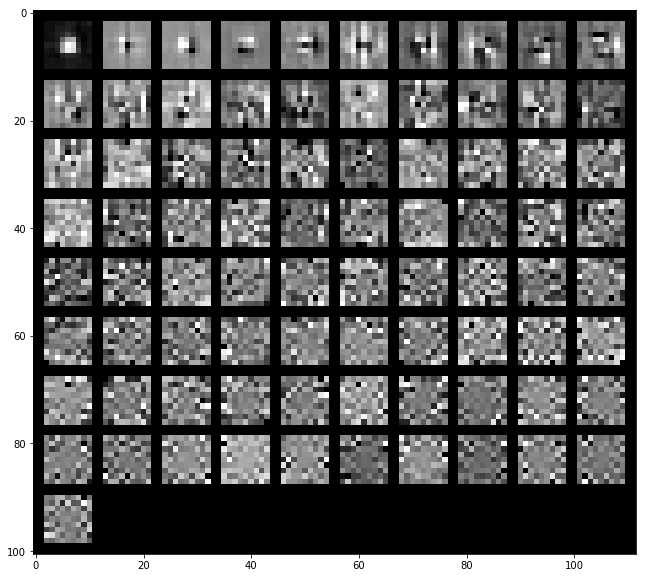

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14945312 0.2501963  0.34086464 0.39825078 0.44626958 0.48655056
 0.52113794 0.55367983 0.58209077 0.60641667 0.62716746 0.64662185
 0.66492935 0.68145791 0.6966807  0.71142392 0.72562789 0.73915443
 0.75232319 0.76438471]


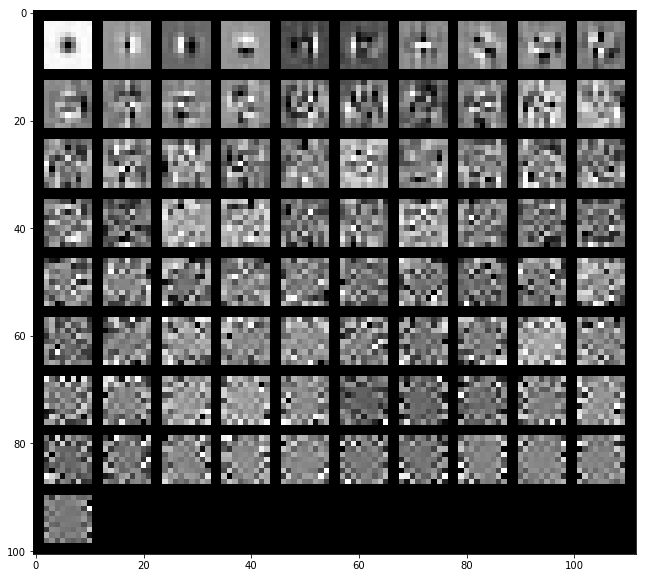

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx58/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16579038 0.26959044 0.35617504 0.42248406 0.47642151 0.52401714
 0.56809725 0.60533754 0.6401739  0.67139797 0.69530639 0.71542697
 0.73398753 0.75089922 0.76662232 0.7805163  0.79379254 0.80620595
 0.81791267 0.82937773]


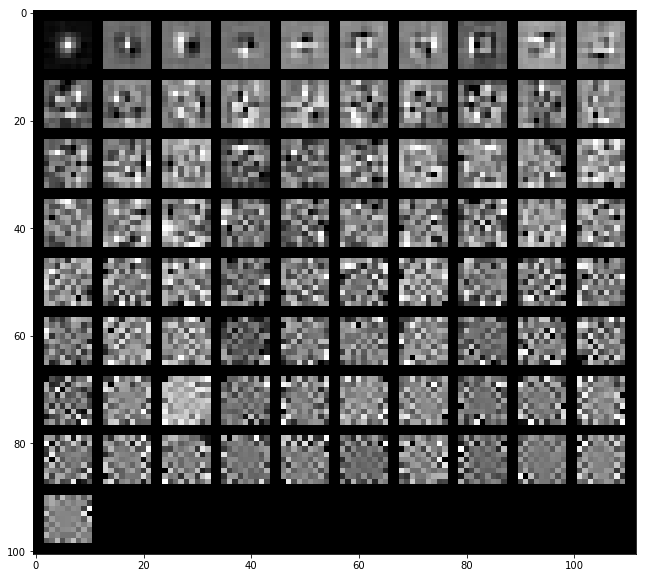

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21421661 0.31342884 0.39587008 0.46168762 0.50570524 0.54908673
 0.58306835 0.61292176 0.63865303 0.66288518 0.68608391 0.70743299
 0.72634586 0.74219162 0.7571648  0.77164052 0.7843035  0.79602391
 0.80710524 0.81767395]


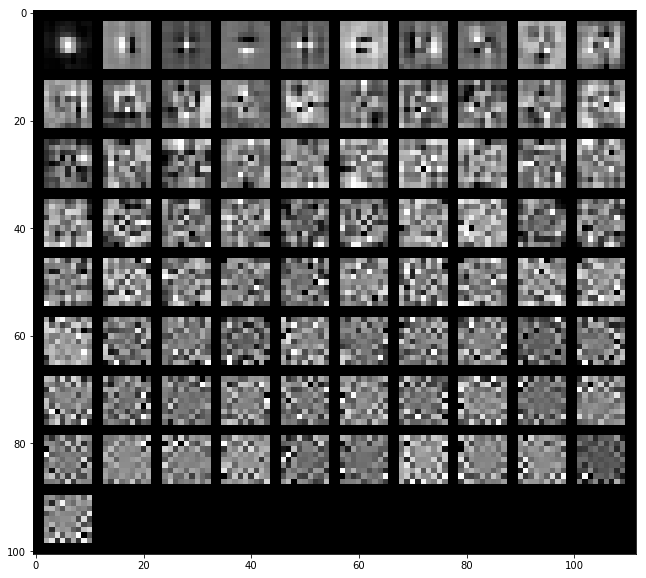

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18516216 0.2773064  0.36478926 0.42766125 0.47728087 0.5195415
 0.55792351 0.59025974 0.61955302 0.64569702 0.66816155 0.68772454
 0.70509205 0.72216729 0.73799248 0.75226104 0.76491622 0.77675995
 0.78780607 0.79825237]


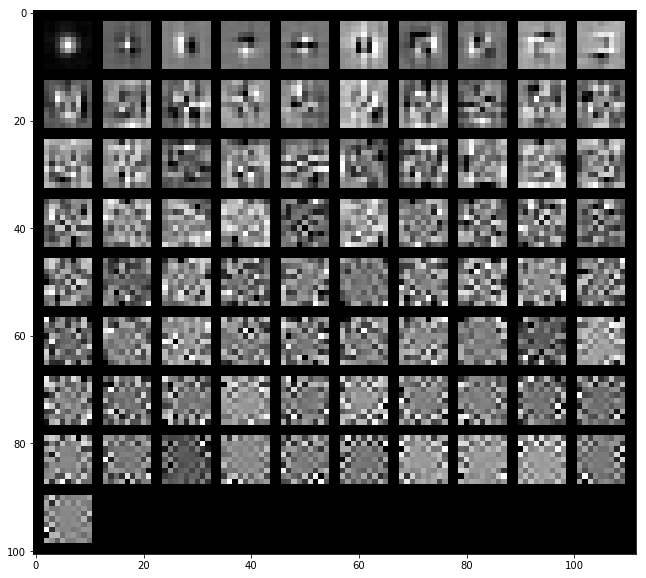

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx70/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16547927 0.24793373 0.30769196 0.36242089 0.41005969 0.44803459
 0.48328374 0.51542004 0.54443859 0.57233275 0.59646844 0.61879668
 0.64018169 0.65995271 0.67870414 0.69613729 0.71245629 0.72843774
 0.74385417 0.75849133]


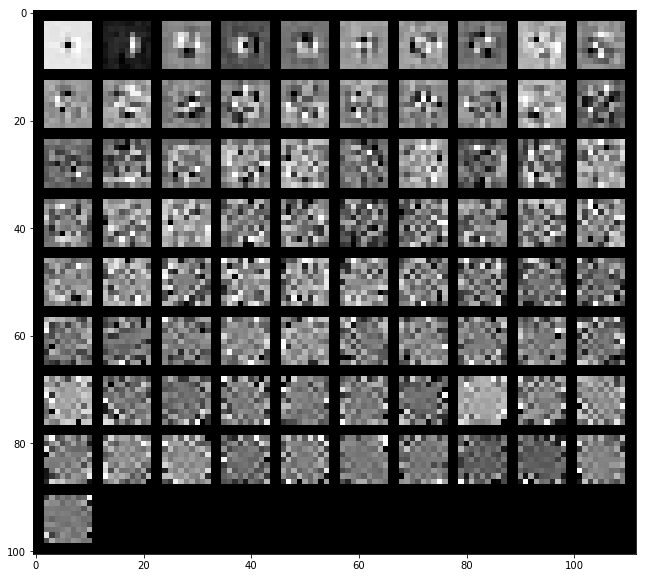

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19458149 0.29209407 0.36520849 0.42795609 0.47237888 0.51187584
 0.54779707 0.57575069 0.60157102 0.62384332 0.64495038 0.66486342
 0.68385674 0.70196243 0.71817663 0.73323624 0.74738869 0.76069533
 0.77374954 0.78571832]


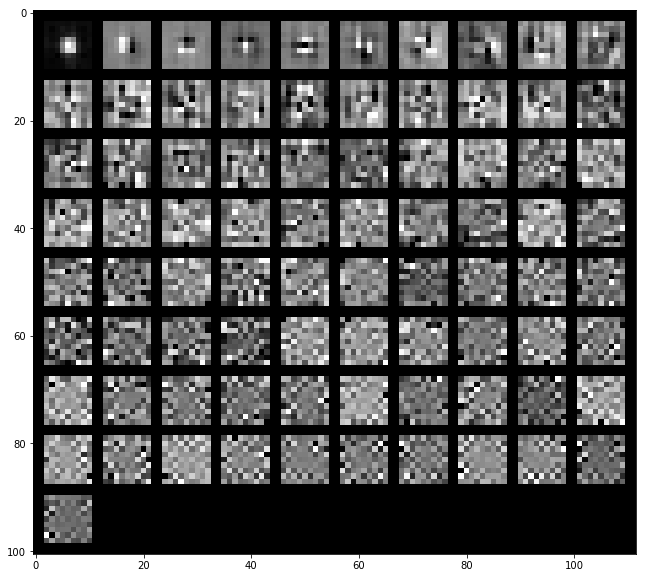

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15715699 0.25266404 0.32315074 0.38150587 0.42724944 0.46369919
 0.49781081 0.5269835  0.5526185  0.57501361 0.59638166 0.61700188
 0.63595574 0.65311913 0.67007482 0.6857846  0.70093603 0.71544443
 0.72916209 0.74227541]


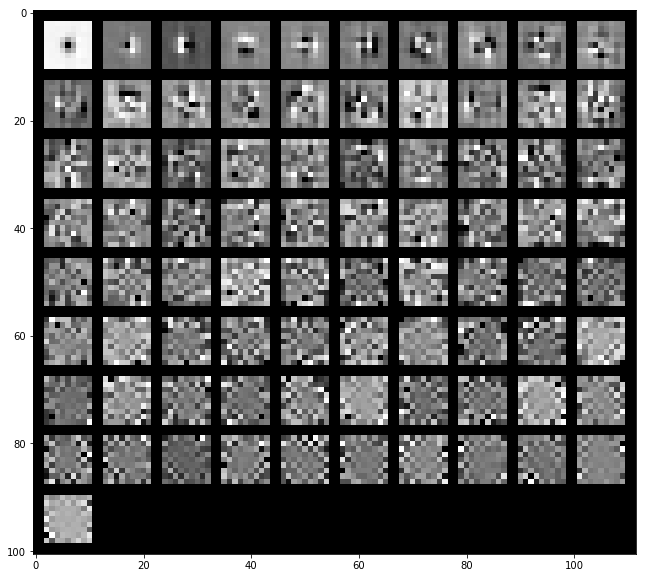

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx71/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16595402 0.29557078 0.36607945 0.41783867 0.46873759 0.51821087
 0.56033203 0.59275607 0.62167297 0.64761067 0.6697119  0.68999262
 0.70892174 0.72655891 0.74350685 0.75775401 0.77115182 0.78418642
 0.79597155 0.80721107]


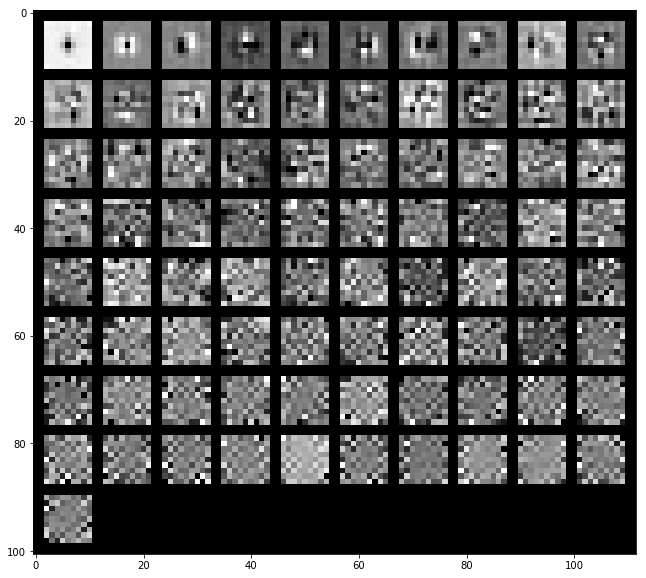

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.25791091 0.34881026 0.42537919 0.49017476 0.54241264 0.5804325
 0.61274005 0.64242602 0.66819803 0.68883778 0.70835518 0.72634998
 0.74180769 0.75565794 0.7688036  0.78093946 0.79276225 0.80394566
 0.81435394 0.8243946 ]


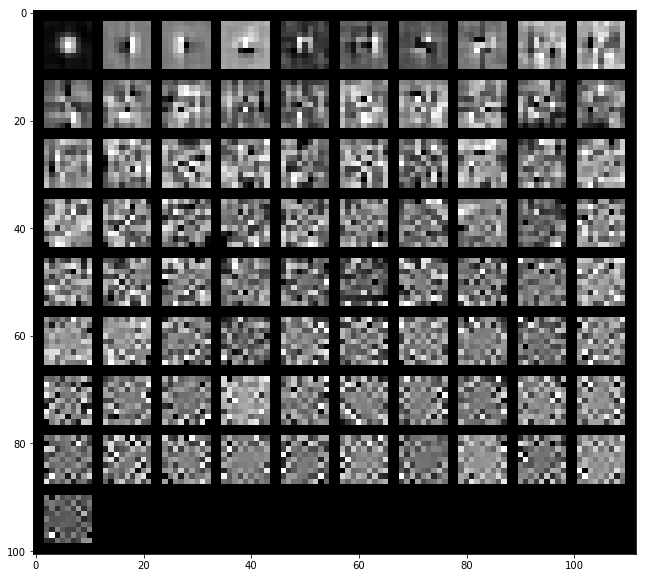

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.2052673  0.31368029 0.38874437 0.44418871 0.49054675 0.53149365
 0.57065899 0.59942771 0.62611825 0.6485648  0.66798486 0.68596582
 0.70352749 0.71894181 0.73394616 0.74710337 0.75943298 0.77092202
 0.78159895 0.79148357]


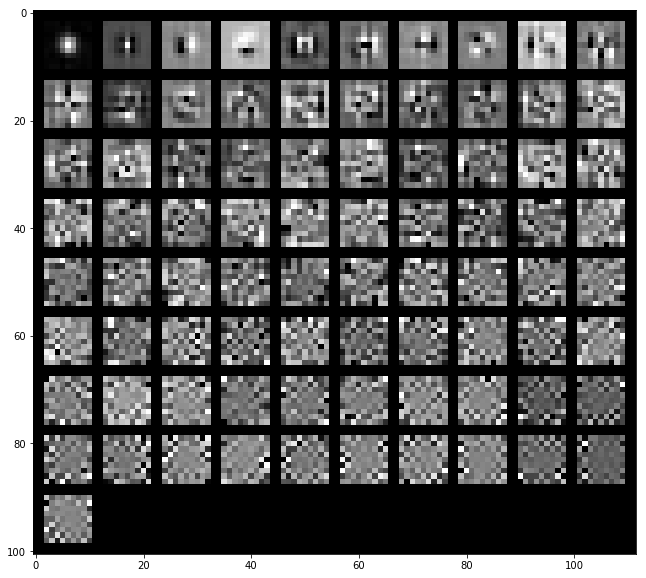

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx82/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23026649 0.31922581 0.3904752  0.45071907 0.50386231 0.54904513
 0.58168958 0.61341126 0.64149411 0.66639124 0.69069133 0.71293832
 0.73265051 0.75034506 0.76688069 0.7812386  0.79514554 0.80812802
 0.81959084 0.8307045 ]


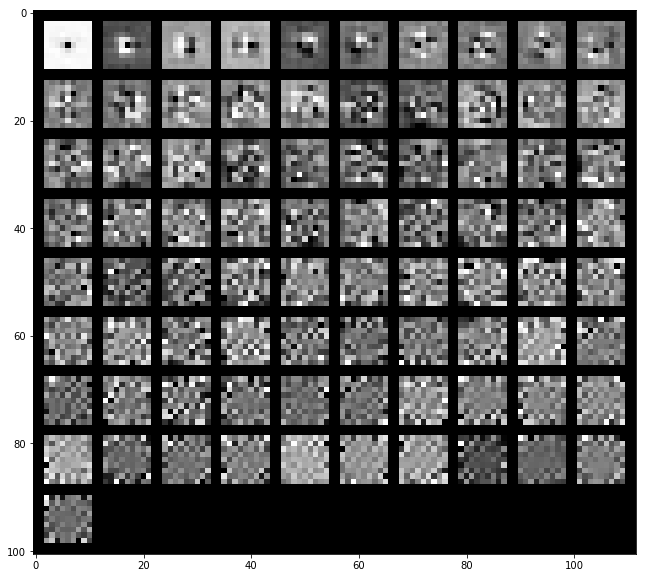

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21199793 0.30845288 0.37376095 0.43791922 0.49416342 0.53632313
 0.57529431 0.60755134 0.63429064 0.65684919 0.67892597 0.69996475
 0.71845362 0.73512661 0.75070986 0.76602505 0.77971051 0.79260855
 0.804956   0.81615884]


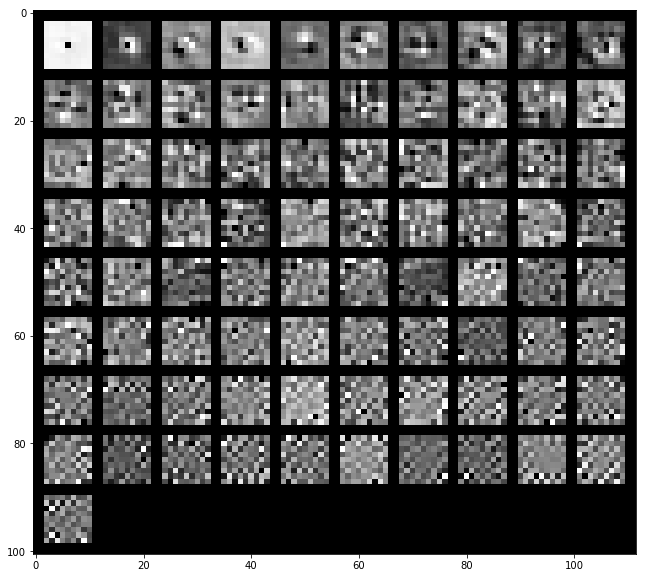

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21623256 0.3026961  0.3686057  0.42211916 0.47400953 0.52073508
 0.55643527 0.58433705 0.61116033 0.63543024 0.65792365 0.67734578
 0.6956429  0.71365123 0.72892745 0.74372306 0.75696636 0.7694317
 0.78128598 0.79285048]


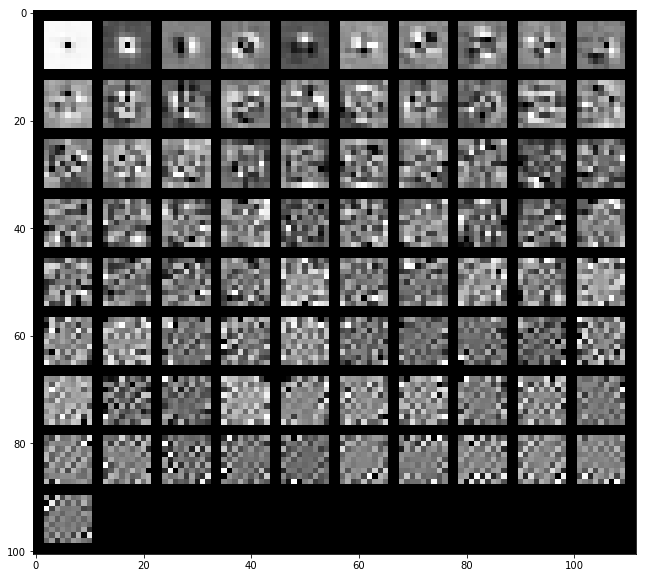

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx83/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19245397 0.27013914 0.33554381 0.39677465 0.45278464 0.50289921
 0.54471958 0.57835631 0.60819921 0.63674914 0.66316943 0.68595289
 0.70687746 0.72628662 0.74367674 0.75957078 0.77489159 0.78992496
 0.80310156 0.81505797]


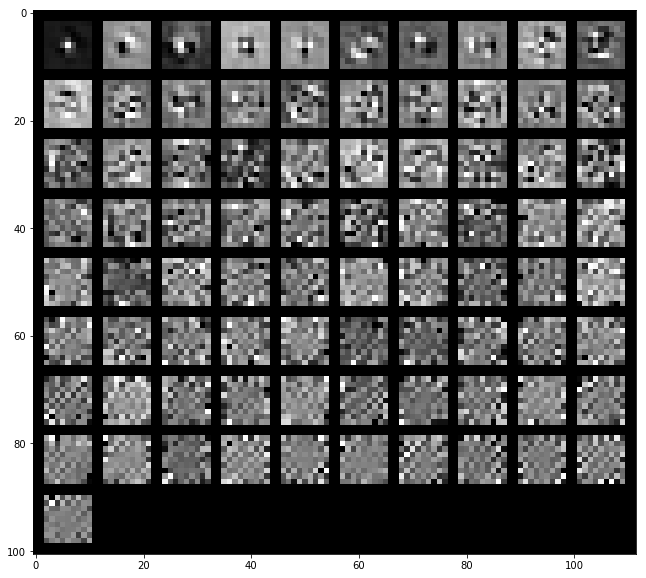

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.24189835 0.35346444 0.42253955 0.48825444 0.52994963 0.56683533
 0.59551417 0.62221477 0.64680944 0.67029682 0.68964532 0.70735912
 0.72441109 0.73979764 0.75495937 0.76893523 0.78162227 0.79404849
 0.80529924 0.81623215]


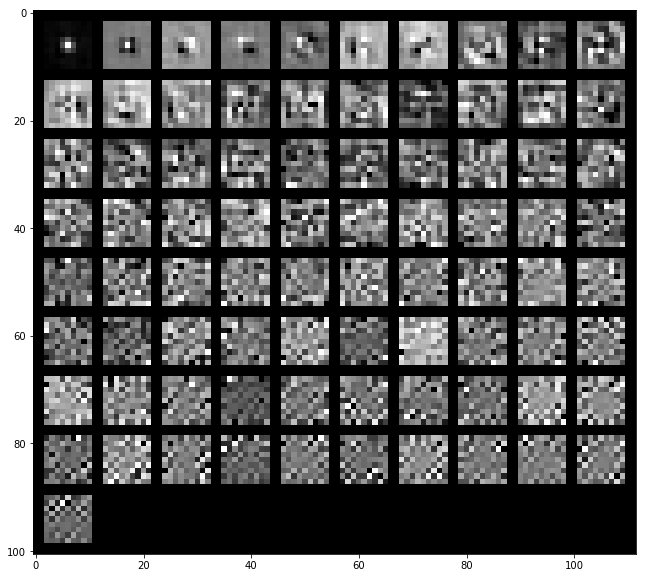

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20991217 0.29715842 0.36596748 0.42628521 0.4745794  0.5145538
 0.55203498 0.58058844 0.60455763 0.62745244 0.64968049 0.66869061
 0.68660477 0.70369865 0.71956933 0.73502714 0.74931399 0.76283071
 0.77466376 0.78621041]


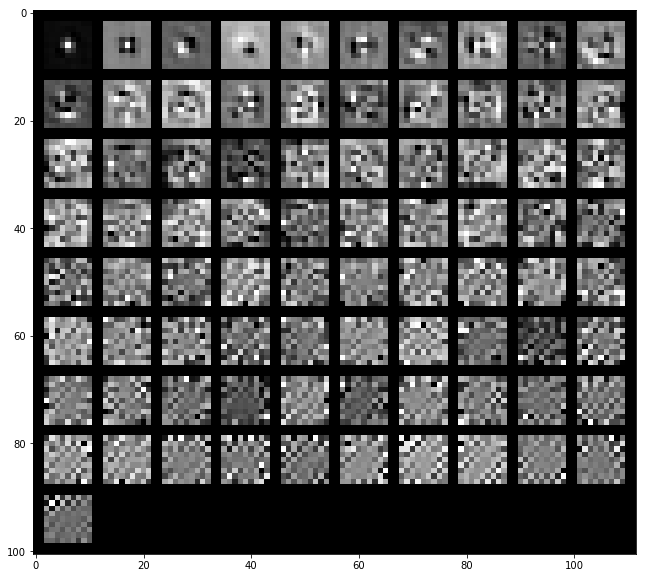

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx95/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16023588 0.25665924 0.33695541 0.39864643 0.45113698 0.50158001
 0.54514905 0.57913085 0.6091025  0.63631428 0.66267557 0.68440858
 0.70504356 0.72369526 0.74010123 0.75553906 0.76927007 0.78257238
 0.79529508 0.80696803]


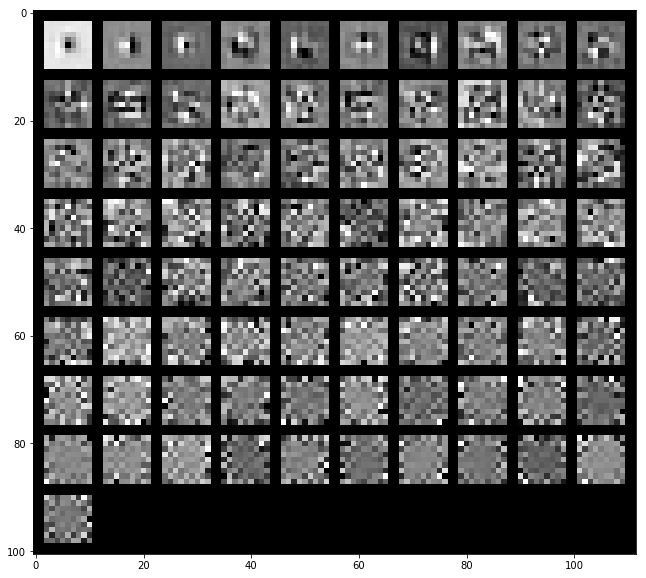

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18510373 0.29692327 0.38616515 0.44888489 0.49775332 0.53531033
 0.56907714 0.59991936 0.62939466 0.65504372 0.67834028 0.69833934
 0.71693328 0.73351975 0.74970114 0.76391252 0.77688607 0.78928424
 0.80056729 0.8108463 ]


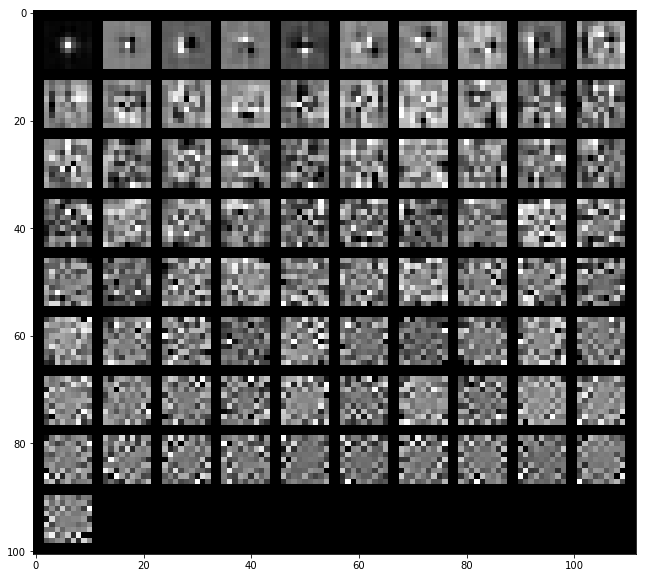

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16918348 0.2687959  0.35452584 0.41165905 0.45875841 0.49846609
 0.53559931 0.5670992  0.59701507 0.62148898 0.64414093 0.66447548
 0.68401053 0.70220039 0.71980607 0.73528948 0.74856722 0.76118134
 0.77321572 0.78463847]


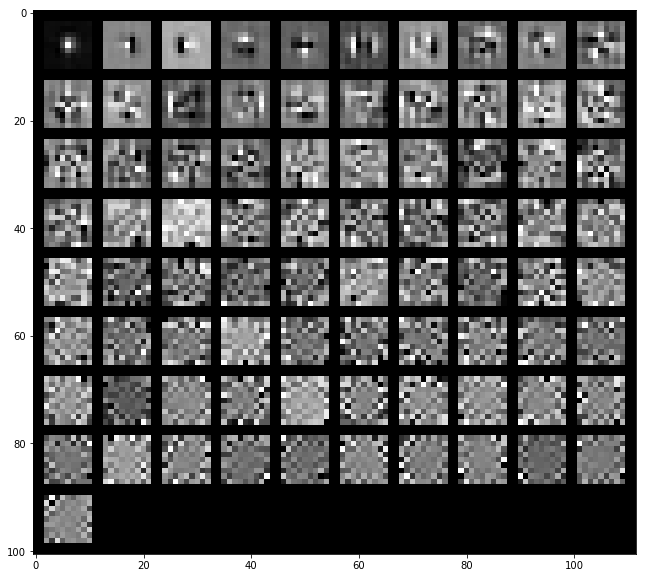

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx202/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.25671145 0.37638699 0.4666494  0.53096111 0.59376796 0.63037839
 0.66476788 0.69144636 0.71407558 0.73523427 0.75486201 0.77360898
 0.78873812 0.80243835 0.81549249 0.82665736 0.83743208 0.84776111
 0.85691597 0.86539866]


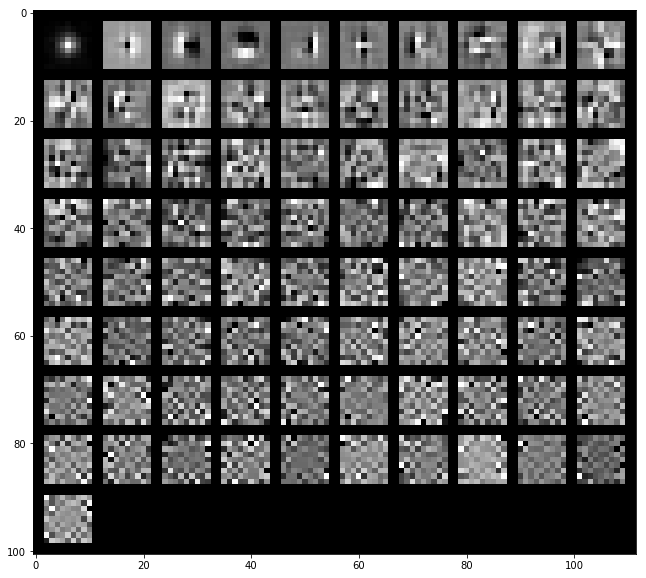

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.2917646  0.41122165 0.4971308  0.55525242 0.60963673 0.64669769
 0.68027725 0.70774742 0.73077136 0.75069035 0.76851786 0.78323203
 0.79759368 0.81057834 0.82264614 0.83432164 0.84550316 0.85556284
 0.86429194 0.87271817]


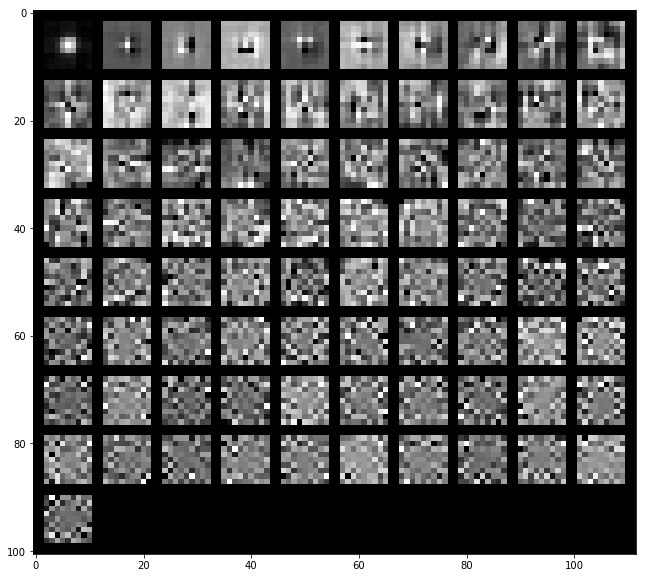

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.26858412 0.38620397 0.46765808 0.52757873 0.58256376 0.61860398
 0.65310362 0.67832839 0.7017125  0.72109681 0.73959076 0.75750501
 0.77393044 0.78804288 0.80095819 0.81342437 0.82388796 0.83391248
 0.84302419 0.8516668 ]


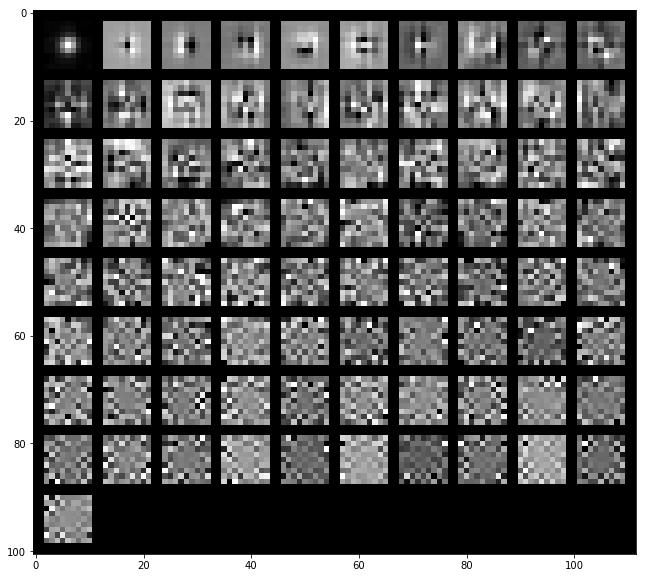

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx203/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1899322  0.30641789 0.38891838 0.4403751  0.48890722 0.52584163
 0.56134024 0.59268171 0.61870484 0.64454396 0.66923204 0.69010958
 0.70946676 0.72725996 0.74219411 0.75650138 0.77036977 0.7829952
 0.79492913 0.80650474]


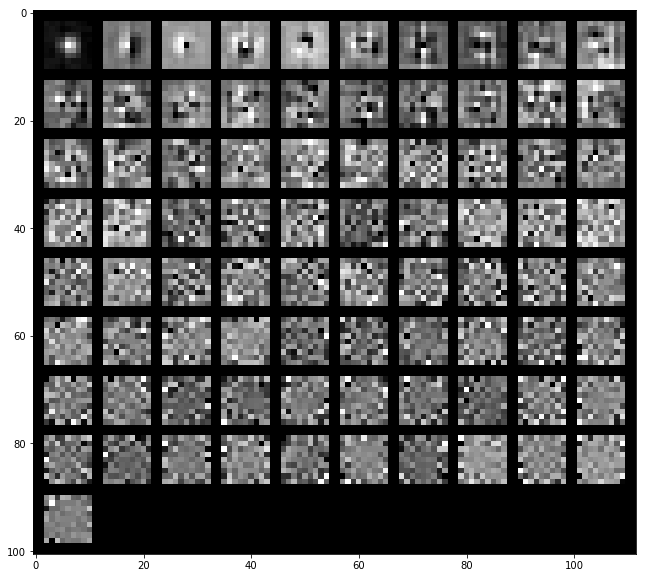

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.24257022 0.36084854 0.43984269 0.50259619 0.55570334 0.59927153
 0.63419971 0.66497008 0.68894873 0.710117   0.72851384 0.74463849
 0.75923976 0.77229931 0.78435598 0.79579441 0.80651884 0.81671464
 0.82642789 0.83552782]


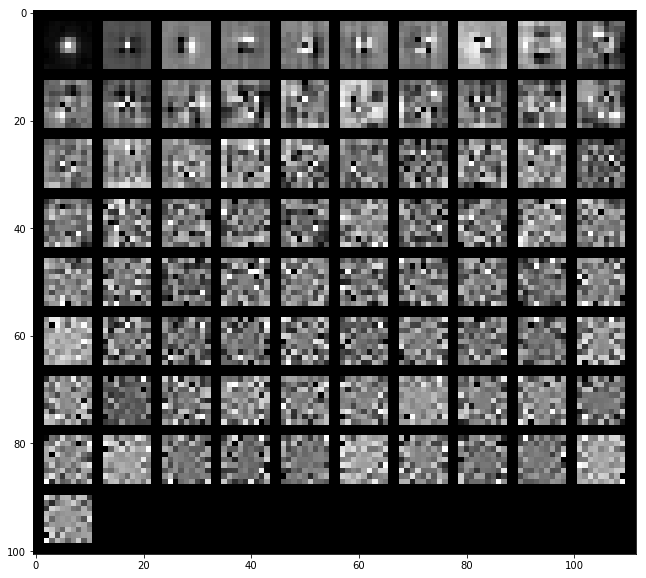

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21258062 0.31940148 0.40426794 0.45790592 0.50697263 0.54422069
 0.57603955 0.6041349  0.62771268 0.65049134 0.67158734 0.6909426
 0.70948032 0.72591102 0.73971823 0.75293618 0.76461816 0.77588657
 0.78614568 0.79633099]


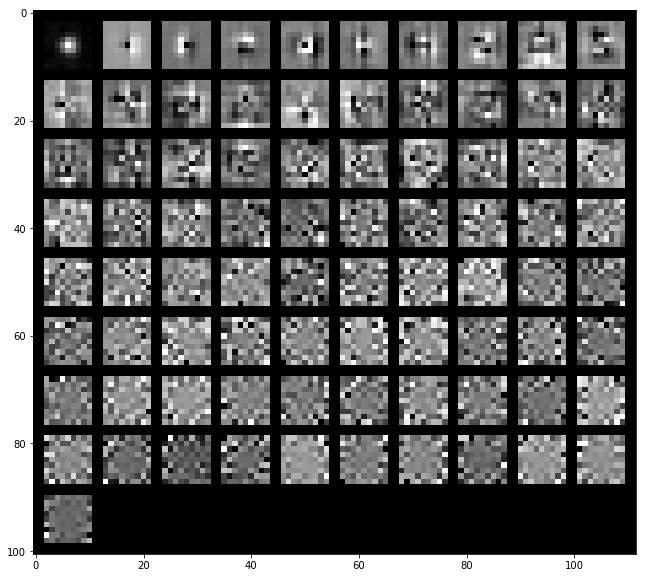

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx214/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18158447 0.29270499 0.37331028 0.44124408 0.50144608 0.54808356
 0.58489647 0.61873061 0.6466306  0.67121558 0.69550018 0.71673958
 0.73575065 0.75361272 0.76932222 0.78333143 0.79654514 0.80855401
 0.8198453  0.83026975]


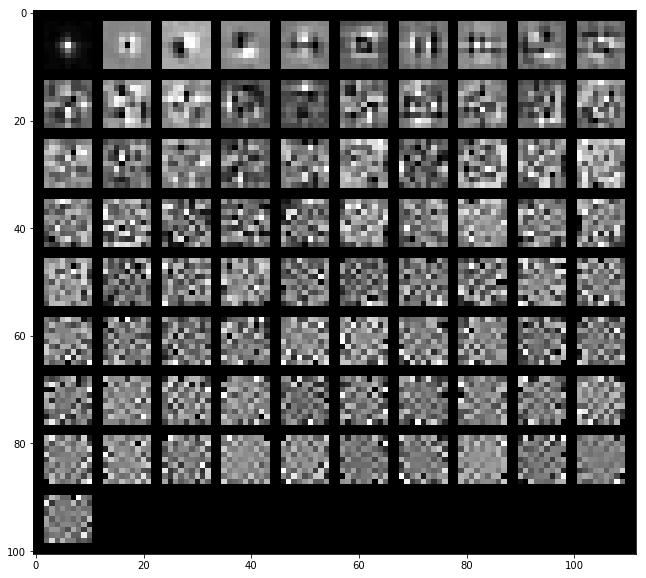

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.29713797 0.40242112 0.48688515 0.5553596  0.59969316 0.63752985
 0.6668516  0.68946915 0.70961932 0.72820917 0.74526061 0.76062672
 0.77436397 0.78758829 0.79969358 0.81046282 0.82110011 0.83105665
 0.84044078 0.84921623]


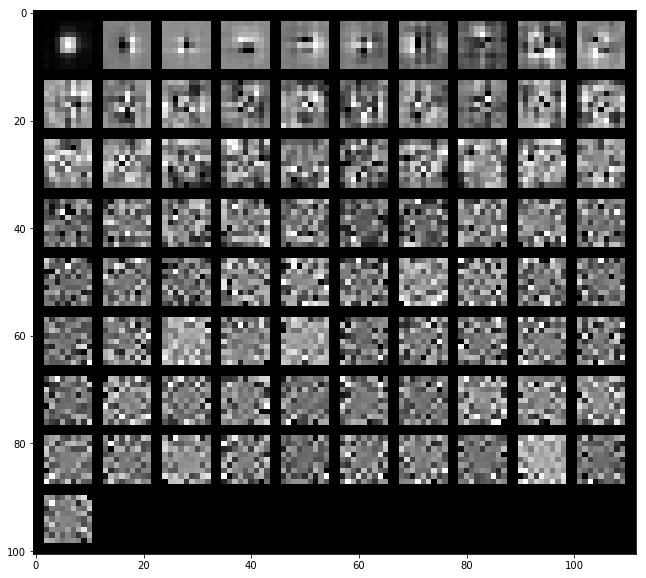

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.2304891  0.33434973 0.418407   0.4834824  0.53170098 0.57087123
 0.60487124 0.633962   0.65798552 0.68076183 0.70127454 0.71842449
 0.73520498 0.74958175 0.76299445 0.77539659 0.78657714 0.79739513
 0.807359   0.81688017]


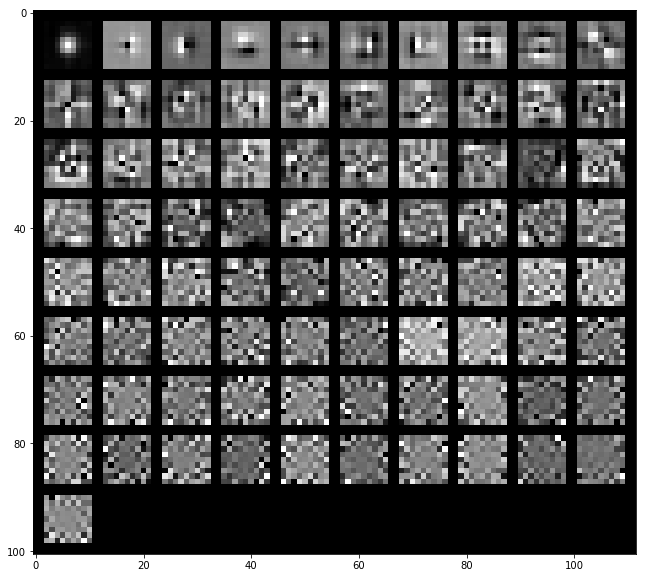

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx226/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18004303 0.2631563  0.34089462 0.39565371 0.44407676 0.48701889
 0.52759815 0.56164147 0.5937134  0.61896976 0.64410135 0.66818902
 0.69148075 0.71146686 0.72948    0.74677238 0.76215318 0.77607585
 0.78916861 0.80169662]


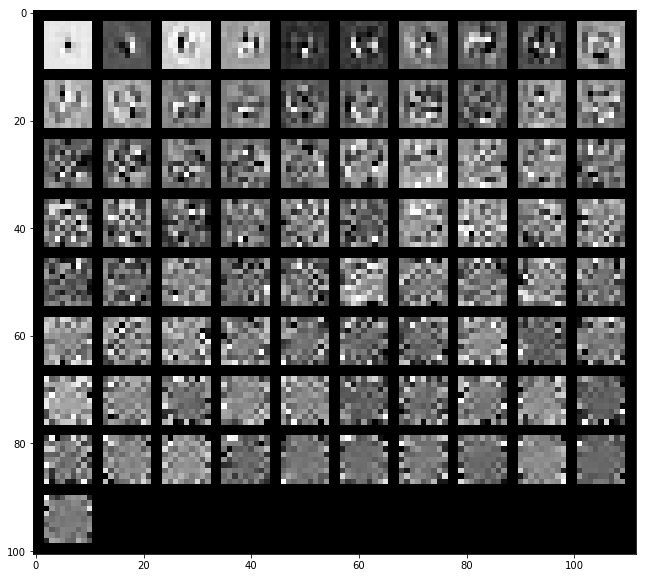

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15752907 0.24618912 0.31613662 0.36838489 0.41544589 0.45947118
 0.4985629  0.53463293 0.56631892 0.5933846  0.62018697 0.6433732
 0.66580993 0.68511194 0.70349766 0.72124802 0.73691714 0.75105777
 0.76415356 0.77651382]


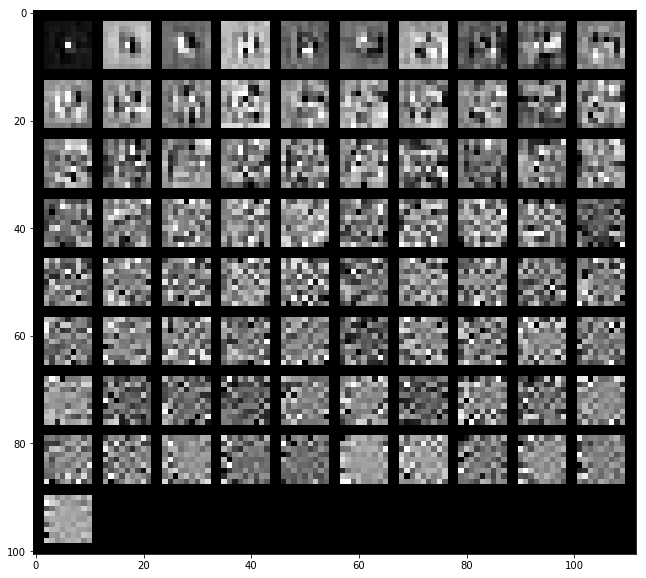

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17143819 0.25127608 0.32063179 0.37194677 0.41713506 0.45764033
 0.49076257 0.52267975 0.55188631 0.57729426 0.60162213 0.62422943
 0.64519681 0.66445171 0.68149107 0.69809005 0.71304799 0.72773024
 0.74133251 0.75429907]


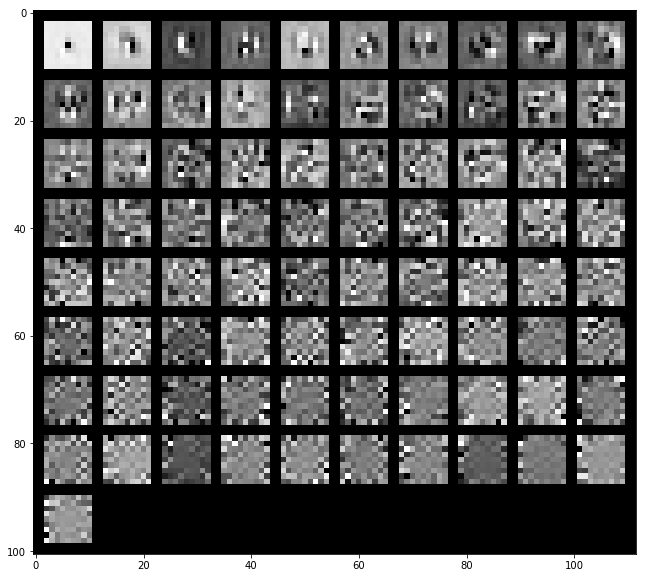

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx227/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18910475 0.29555414 0.36644792 0.42564822 0.47845218 0.52649589
 0.56507864 0.60173806 0.63304145 0.6588809  0.68425056 0.70663484
 0.72635635 0.74478349 0.76248466 0.77834208 0.79202418 0.80474277
 0.81679198 0.82835398]


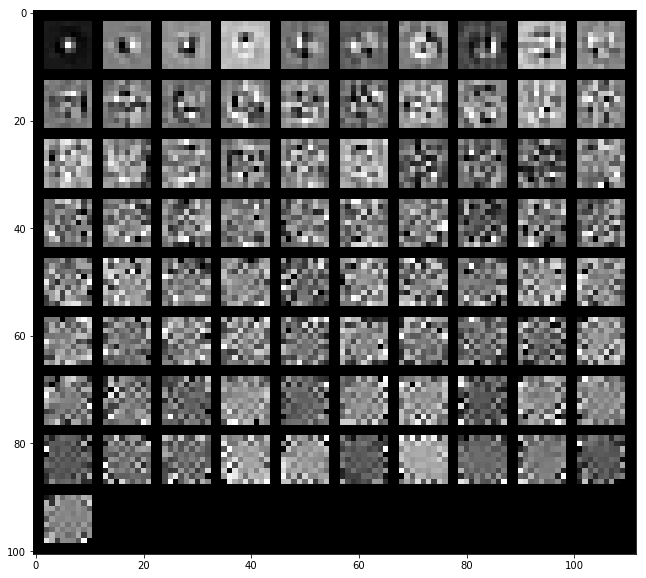

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18338992 0.28707099 0.37623492 0.43763475 0.48815625 0.52846877
 0.56401089 0.5971793  0.62451221 0.64822226 0.6705095  0.69112521
 0.70971633 0.72681286 0.74269903 0.7577672  0.77208202 0.78492051
 0.79614618 0.8062951 ]


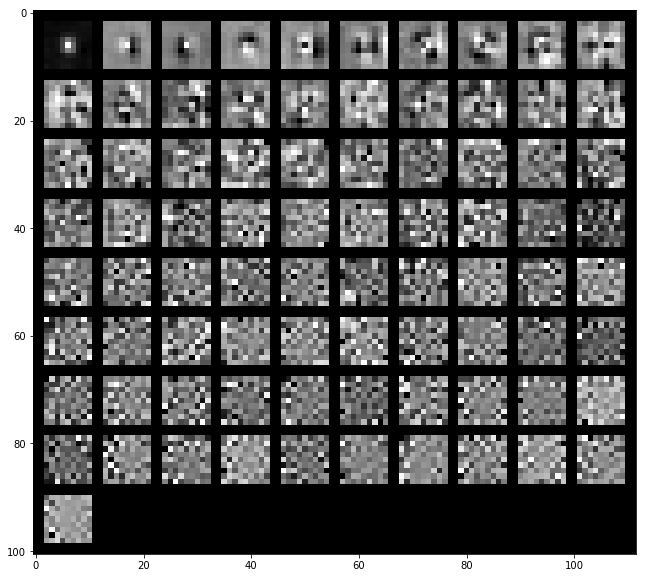

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1791031  0.27457936 0.3543891  0.40947128 0.45542147 0.49528141
 0.53213531 0.56486663 0.59377104 0.62059075 0.64281539 0.66352107
 0.68310462 0.70235468 0.71911611 0.73409923 0.74820808 0.76102566
 0.7730892  0.78402806]


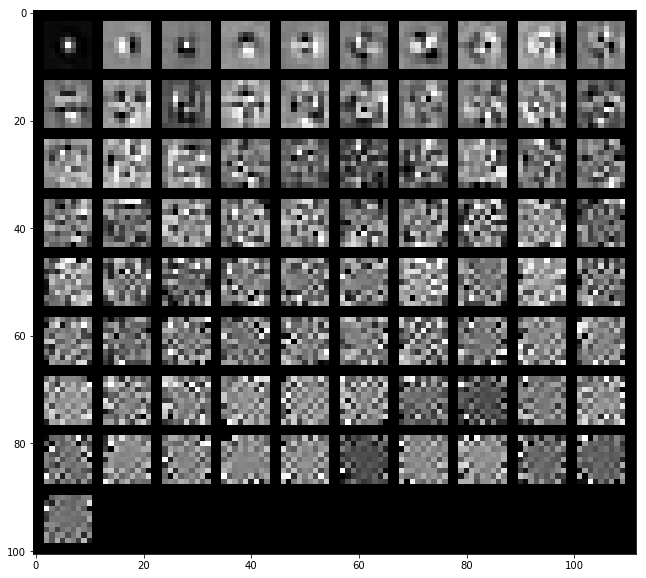

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx238/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17966131 0.29048766 0.37333701 0.43772156 0.49513216 0.53798255
 0.57669601 0.60679047 0.63475744 0.66217529 0.68690827 0.70935842
 0.72830589 0.74611749 0.763238   0.77811228 0.79261999 0.80602366
 0.81820497 0.82899244]


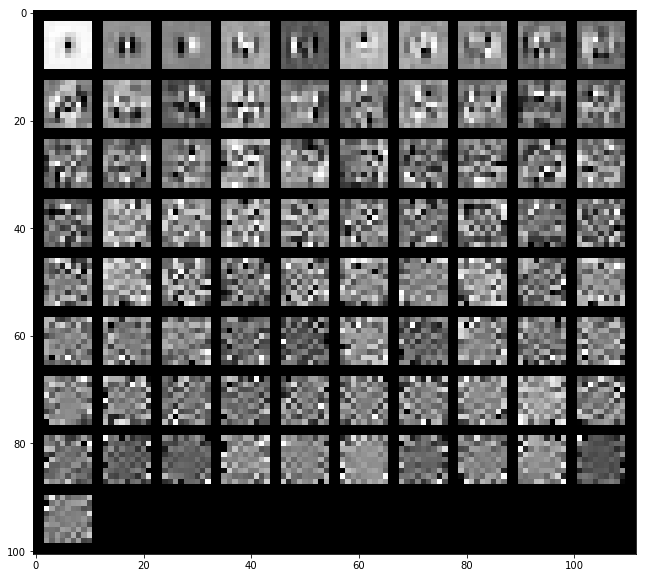

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20195466 0.30449852 0.38198937 0.43739846 0.48850685 0.52688284
 0.5613773  0.59336541 0.6212842  0.64423506 0.66513466 0.68550264
 0.70314585 0.71966879 0.73479471 0.74950717 0.76217505 0.77452593
 0.78587022 0.79700004]


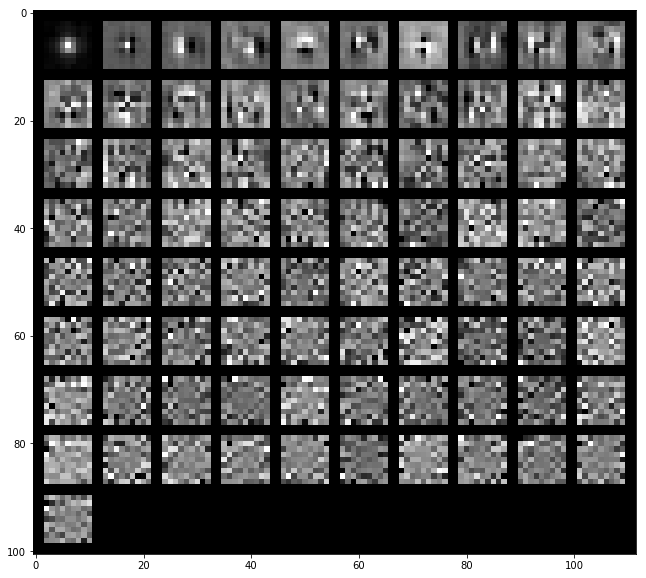

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1845145  0.28960647 0.3683504  0.41905264 0.46537662 0.50604169
 0.54346379 0.57763653 0.60618904 0.63000412 0.65199552 0.67298353
 0.69311425 0.71163435 0.72859739 0.74311929 0.75661151 0.76908698
 0.78035133 0.79108477]


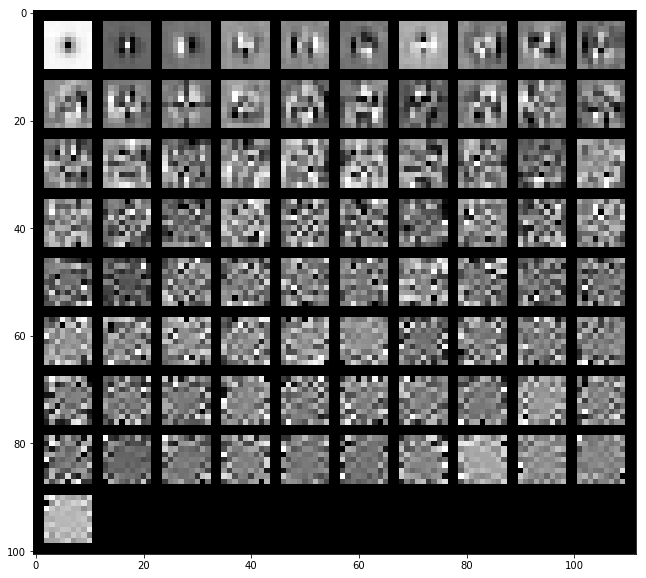

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx239/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22153521 0.33305795 0.41261218 0.47148657 0.51834555 0.556636
 0.59077988 0.62103955 0.64865835 0.67406292 0.69687645 0.71853902
 0.73654695 0.75342578 0.76825147 0.78161527 0.79383084 0.80586877
 0.81749683 0.82785638]


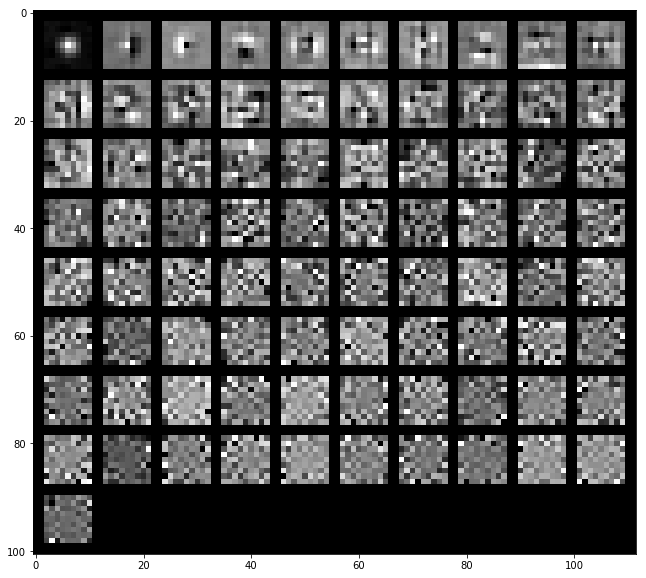

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.27254557 0.39464643 0.4816733  0.5499931  0.59990261 0.64267861
 0.67776794 0.70660212 0.72731025 0.74596076 0.76231255 0.77767195
 0.79182136 0.80401561 0.81501603 0.82548383 0.83508985 0.84445431
 0.85331323 0.8621238 ]


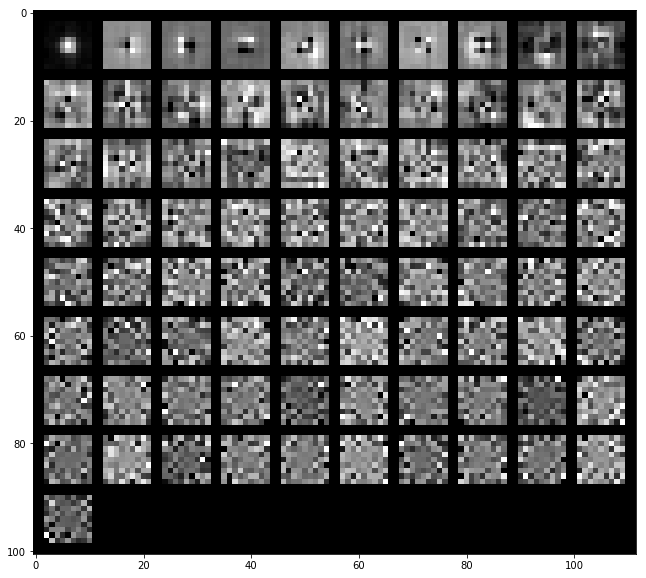

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.24401833 0.35713943 0.43719935 0.49685659 0.54372164 0.57932176
 0.61081809 0.63970661 0.6644954  0.685914   0.70674139 0.72491255
 0.74141659 0.75673481 0.77011025 0.78224179 0.79315981 0.80315204
 0.81293587 0.8220458 ]


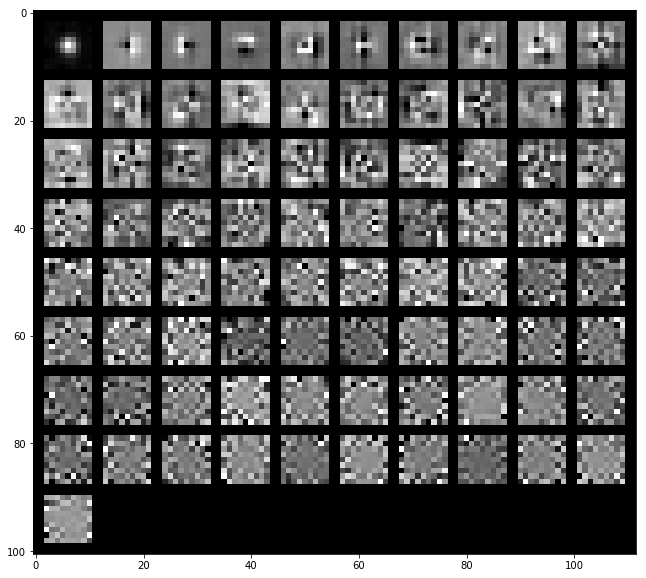

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx251/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16374003 0.27394065 0.34731457 0.40321674 0.45123913 0.49212614
 0.52988292 0.56376526 0.59412389 0.62125945 0.6460629  0.66707789
 0.68667658 0.70509372 0.72247624 0.73946806 0.754818   0.76876221
 0.78154313 0.79410304]


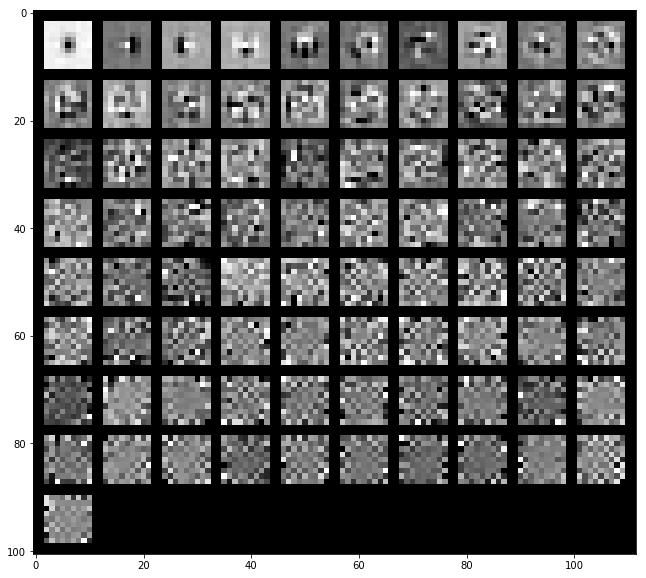

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22651695 0.32180758 0.41241735 0.47504461 0.52358605 0.56186933
 0.5968366  0.62576502 0.65115193 0.67374951 0.69405331 0.71287423
 0.73095711 0.74761175 0.7624389  0.77620531 0.78916176 0.8010408
 0.81246712 0.82309296]


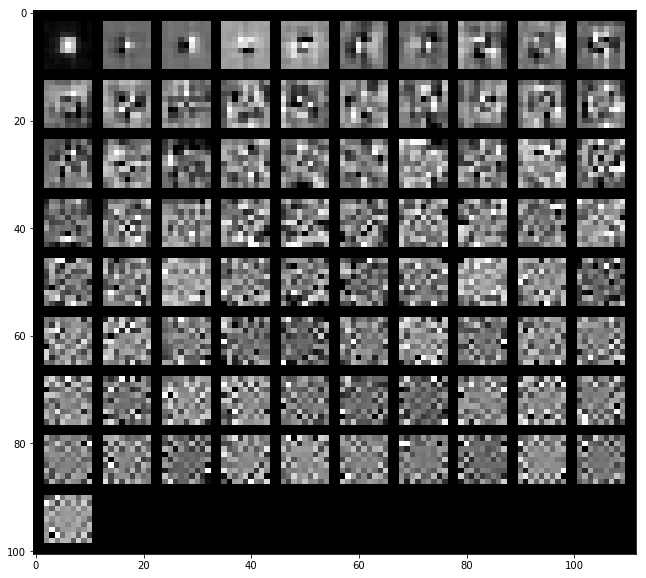

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19040433 0.29025522 0.37356453 0.42958824 0.47619843 0.51147512
 0.54477916 0.57628283 0.60304914 0.6248763  0.64603394 0.66579885
 0.68307818 0.69986038 0.71559564 0.73048782 0.74418559 0.75681242
 0.76938237 0.78131529]


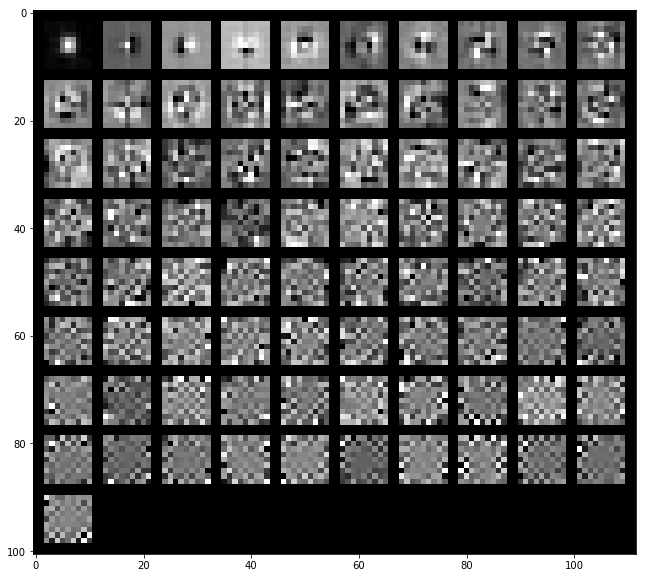

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx262/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13987233 0.22622192 0.30109789 0.35412324 0.40302473 0.44305732
 0.47968827 0.51306386 0.54398222 0.57350574 0.60017117 0.6249416
 0.64638725 0.66695356 0.68474277 0.70211779 0.71892122 0.7340143
 0.74868359 0.76236324]


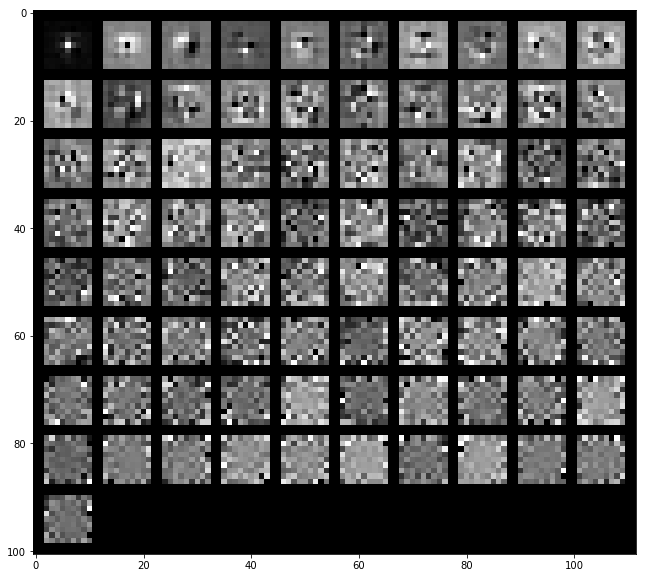

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19247992 0.27783073 0.35004219 0.40433123 0.4515138  0.496218
 0.53203202 0.56338353 0.59015142 0.6154185  0.6366023  0.65743566
 0.67567734 0.69347901 0.71043519 0.72637487 0.74125372 0.75556872
 0.76948897 0.78272499]


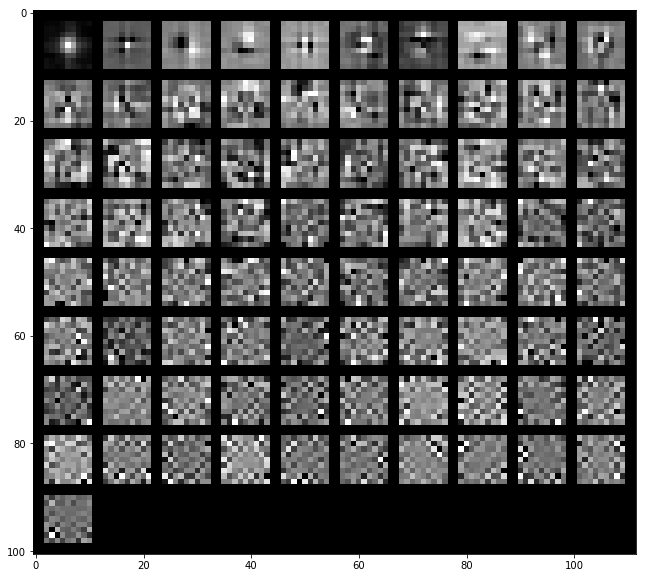

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15750871 0.2468052  0.31771186 0.36622281 0.41279332 0.45112667
 0.48642042 0.51997006 0.54753186 0.57352553 0.59851594 0.62000754
 0.64045951 0.65871829 0.67520814 0.69066108 0.70558688 0.71995229
 0.73298352 0.74561198]


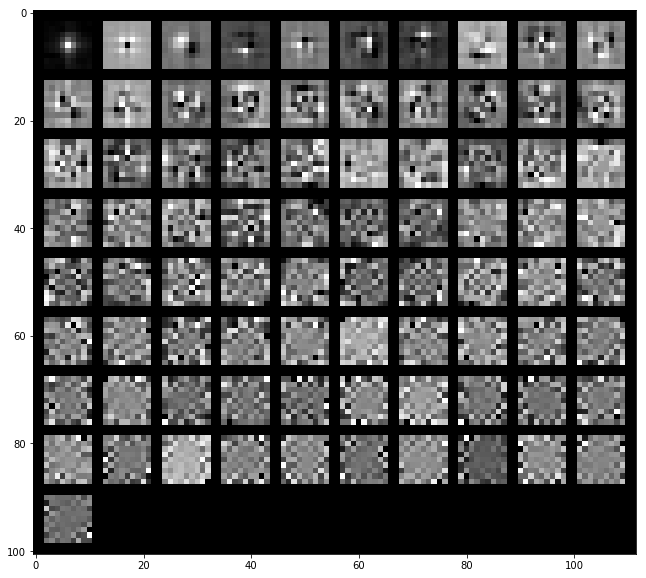

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx263/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14302813 0.25224096 0.32753702 0.38909194 0.44027753 0.48956259
 0.53413277 0.57254461 0.60266805 0.62704833 0.65064624 0.67286284
 0.69355701 0.71269338 0.7300643  0.74588809 0.76097296 0.77480566
 0.78830084 0.80082053]


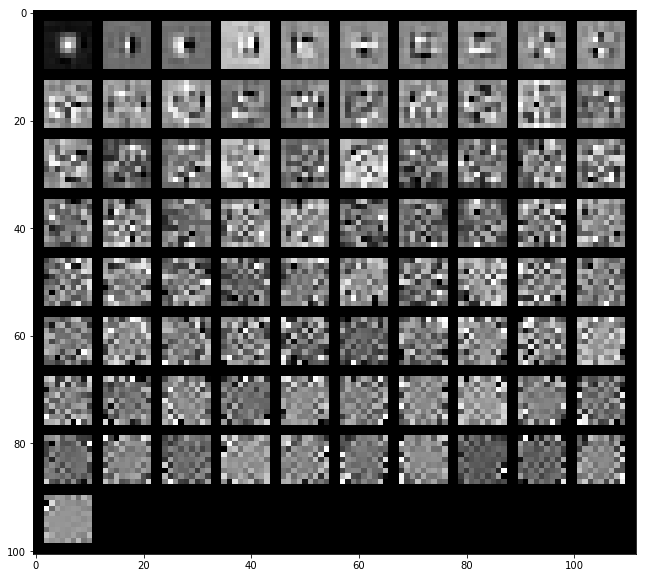

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20677545 0.31514826 0.41044522 0.46731707 0.52001931 0.56316512
 0.59767852 0.62427277 0.64762616 0.66786659 0.6870595  0.70566389
 0.7230087  0.73916734 0.75345524 0.7668881  0.78027046 0.79197106
 0.80350704 0.81446698]


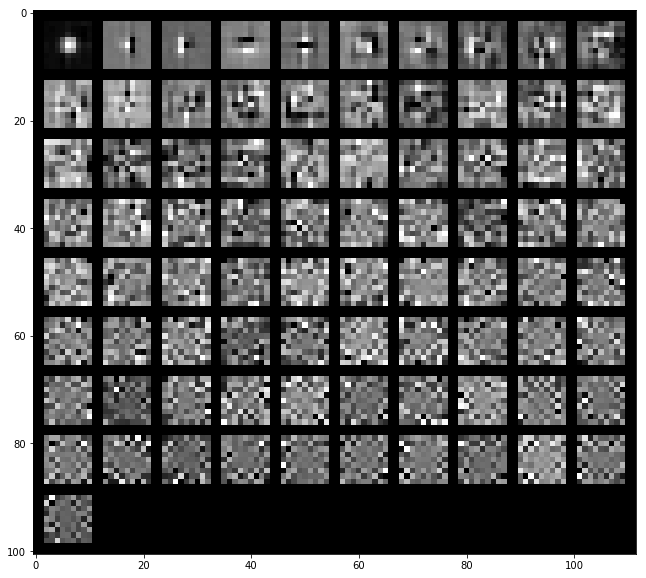

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17181788 0.27808843 0.36131686 0.41299532 0.46273446 0.50856476
 0.54493479 0.57606282 0.60462663 0.62700044 0.6483307  0.6681144
 0.685997   0.70287148 0.71907354 0.73467289 0.74828846 0.76068489
 0.77267109 0.78341385]


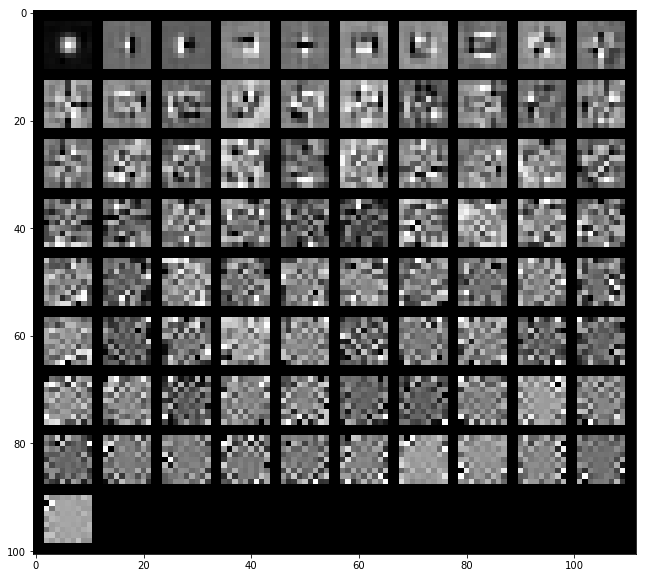

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx274/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17788314 0.26079714 0.33719036 0.39796327 0.45519137 0.50306818
 0.54041546 0.57218576 0.60122384 0.62712099 0.65151167 0.67468566
 0.69576086 0.71476607 0.73180498 0.74738698 0.76245304 0.77710616
 0.78944114 0.80149846]


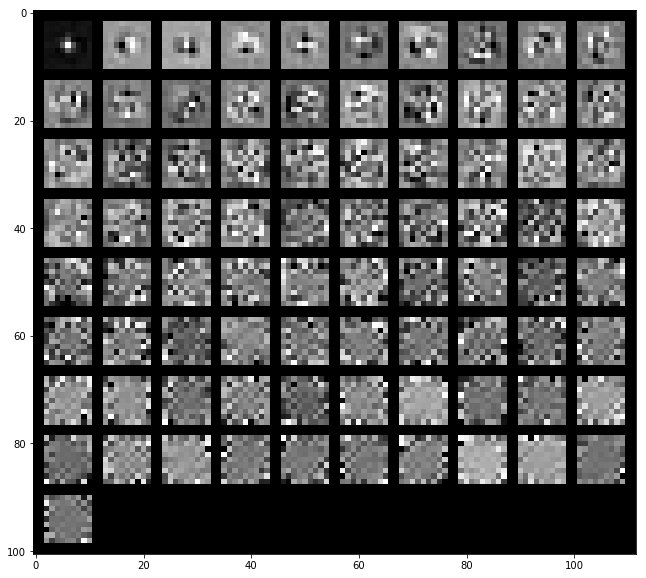

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23241148 0.34356477 0.41085518 0.47111543 0.5213117  0.56378329
 0.59945536 0.62870374 0.65420791 0.67579198 0.69518403 0.71439939
 0.73110741 0.74701022 0.76126579 0.77438478 0.7870025  0.79864147
 0.80996172 0.82086556]


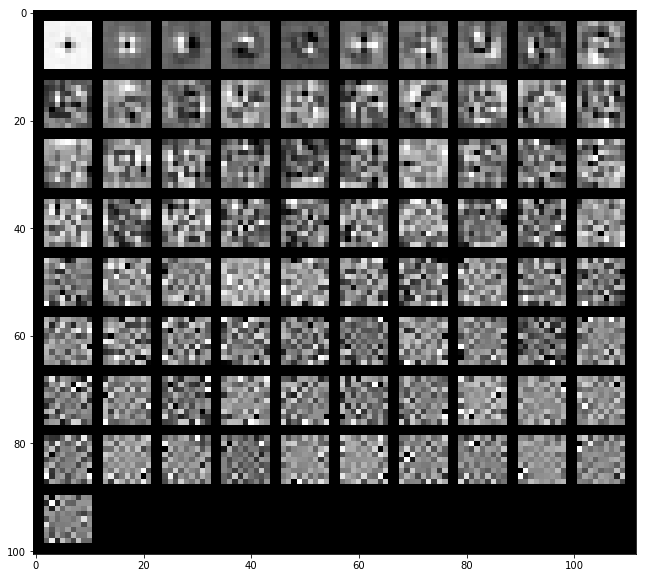

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20242589 0.29242443 0.36382058 0.41932428 0.46825301 0.51475017
 0.54856613 0.57797067 0.60383501 0.62785949 0.64961062 0.66879801
 0.68611275 0.70245933 0.71779999 0.73286304 0.74700921 0.76015407
 0.7721957  0.7833992 ]


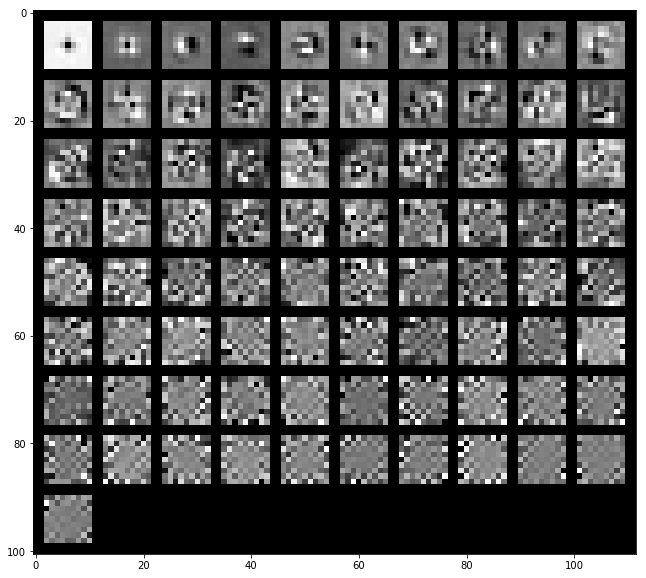

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx286/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13152879 0.23739781 0.32071488 0.38469238 0.43817029 0.48319939
 0.52233666 0.55603823 0.58830356 0.61910644 0.64351912 0.66699933
 0.68846051 0.70733006 0.72533886 0.74222728 0.7566618  0.77020372
 0.78297513 0.79468757]


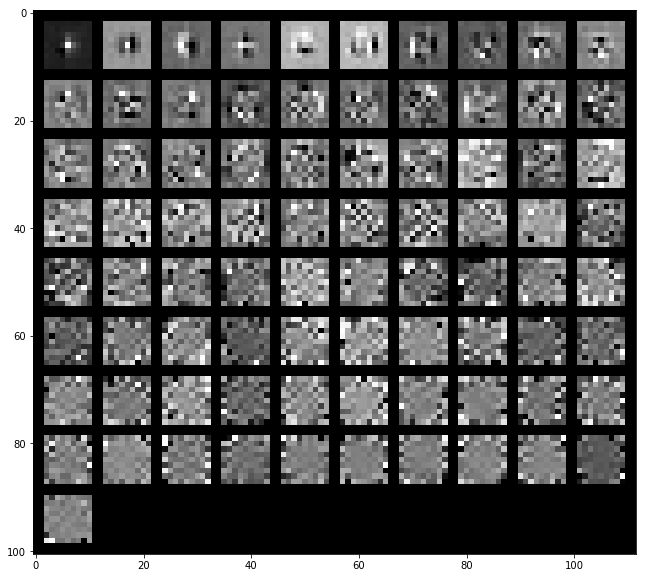

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19972591 0.2958123  0.3788913  0.43156127 0.47519419 0.51547313
 0.54941565 0.57831618 0.60378055 0.62677784 0.64850665 0.66882023
 0.68732205 0.70473223 0.72132009 0.73677047 0.7512117  0.76518109
 0.77862315 0.79051506]


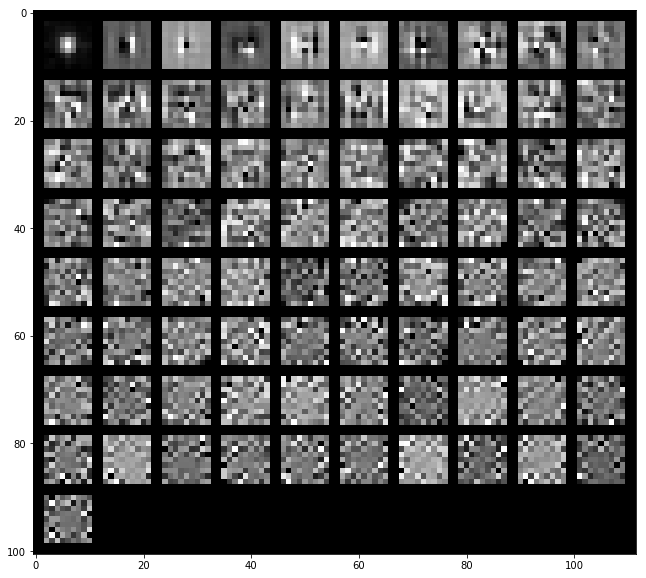

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15751767 0.25629963 0.34182988 0.39327133 0.44295348 0.48453827
 0.52004221 0.54782336 0.57497572 0.60109663 0.62465316 0.64473432
 0.66456466 0.68229647 0.69934728 0.7144421  0.72822468 0.74164773
 0.75361399 0.76553314]


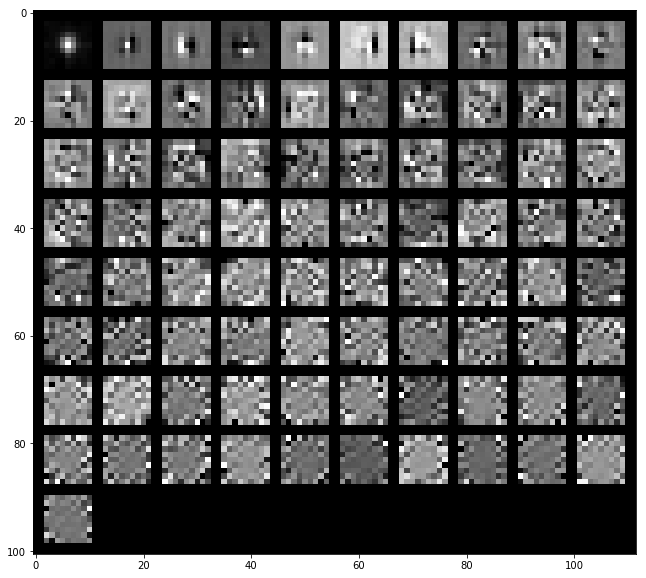

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx287/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16286405 0.27156696 0.35921847 0.40891971 0.45824388 0.50212233
 0.5412205  0.57797814 0.6106692  0.63706874 0.66142165 0.68546755
 0.70692026 0.72515814 0.74203813 0.75787372 0.77266962 0.7867957
 0.79848047 0.80995752]


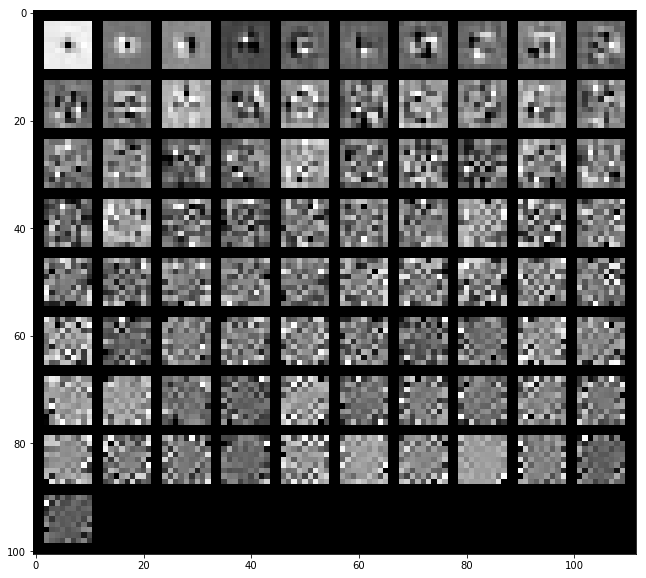

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22415936 0.3433904  0.44415023 0.49534398 0.54268936 0.58026326
 0.61606566 0.64437093 0.66948002 0.69239526 0.71221598 0.72999491
 0.74639565 0.7610536  0.77478482 0.7882301  0.79982363 0.8109907
 0.821878   0.83183635]


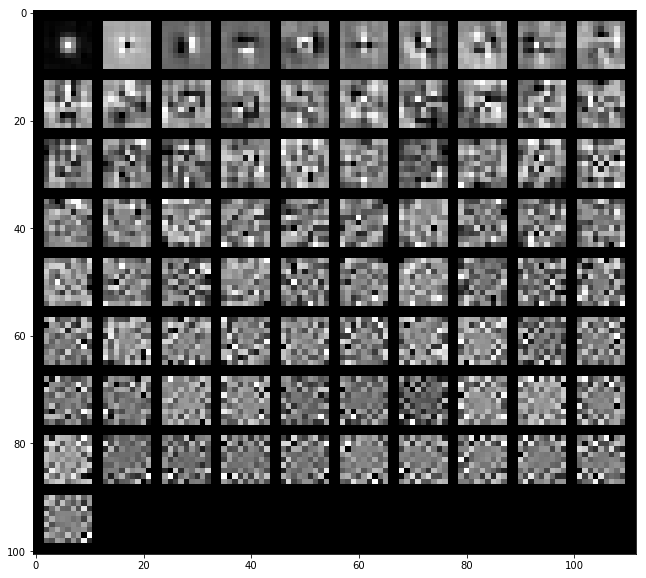

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18672    0.30342831 0.3941143  0.44048495 0.48574748 0.52627385
 0.56058116 0.59184721 0.62048003 0.64302308 0.66510186 0.68515997
 0.70336732 0.71987267 0.73543296 0.74917272 0.76248767 0.77445358
 0.7862546  0.79712696]


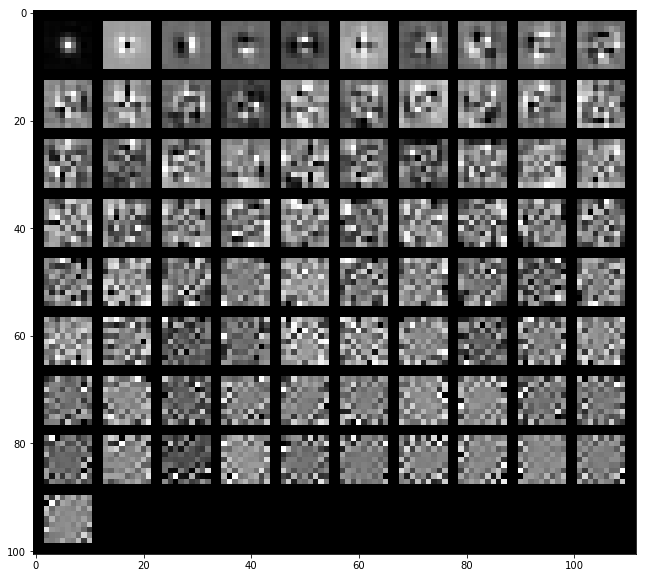

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx394/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13475704 0.24024492 0.31261705 0.37088437 0.42011496 0.46782033
 0.51127148 0.54802824 0.58007073 0.60733909 0.63347686 0.655153
 0.67655904 0.69512746 0.71344941 0.72971894 0.74401823 0.75779036
 0.77091302 0.78387326]


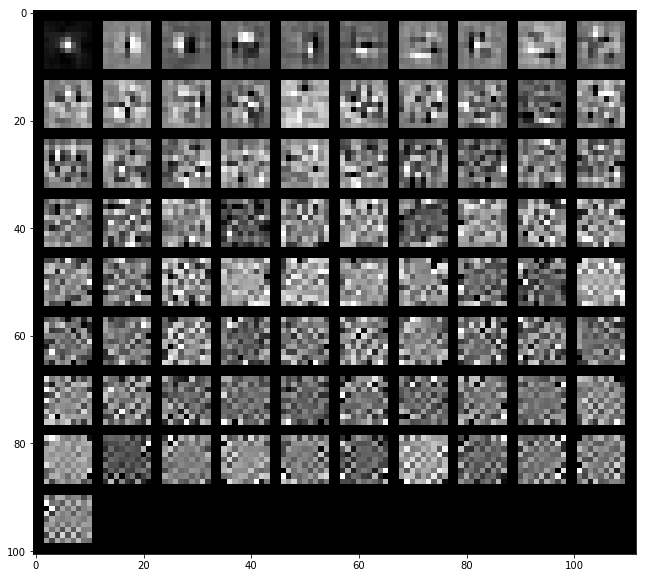

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12746314 0.21556543 0.27716126 0.32931043 0.37397825 0.41748173
 0.45554437 0.49018162 0.51888329 0.54625213 0.57138717 0.59549484
 0.61872972 0.6397334  0.66000114 0.67805407 0.69516458 0.71115533
 0.72677439 0.74119977]


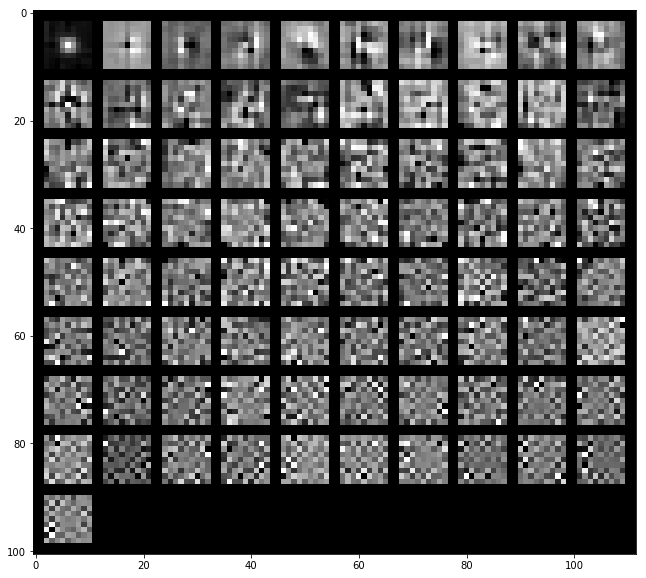

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12781304 0.21978567 0.28396156 0.33395086 0.38103625 0.42394757
 0.46161504 0.49830189 0.52799384 0.55308334 0.57691592 0.59897186
 0.62049214 0.63956752 0.6570722  0.67365432 0.68930693 0.70366848
 0.71793961 0.73045855]


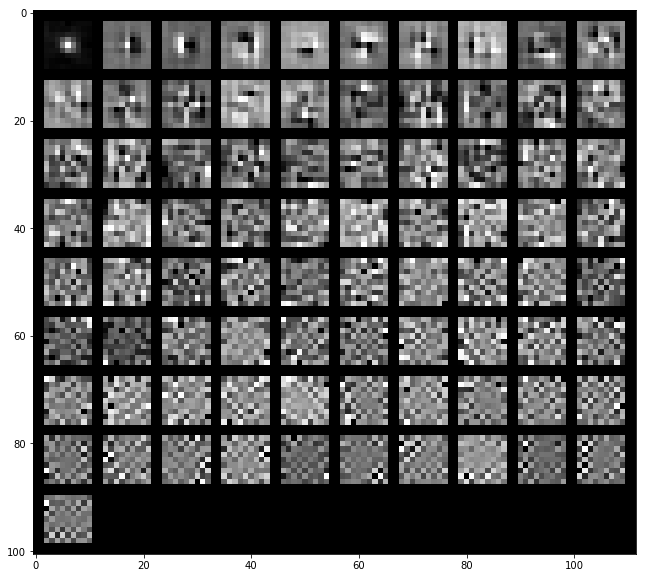

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx395/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17735088 0.27508763 0.36171291 0.42224217 0.47806892 0.51877243
 0.55418667 0.5856392  0.61415078 0.64230242 0.66688345 0.69060038
 0.71259209 0.73207411 0.74949373 0.76450121 0.77826327 0.79057915
 0.80241216 0.81409405]


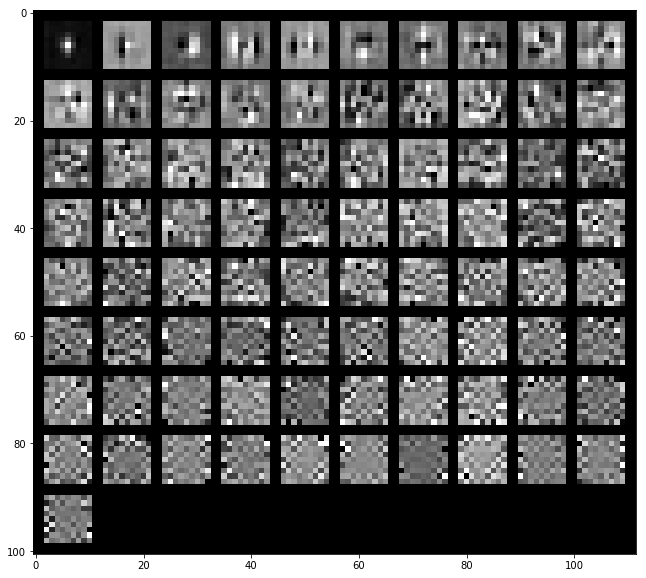

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17730572 0.26682719 0.34119911 0.39680449 0.44630797 0.48540467
 0.52308841 0.5532054  0.57999081 0.60451071 0.62826961 0.65107886
 0.67222536 0.69000113 0.70679633 0.7228122  0.73742217 0.7509529
 0.76346684 0.77574899]


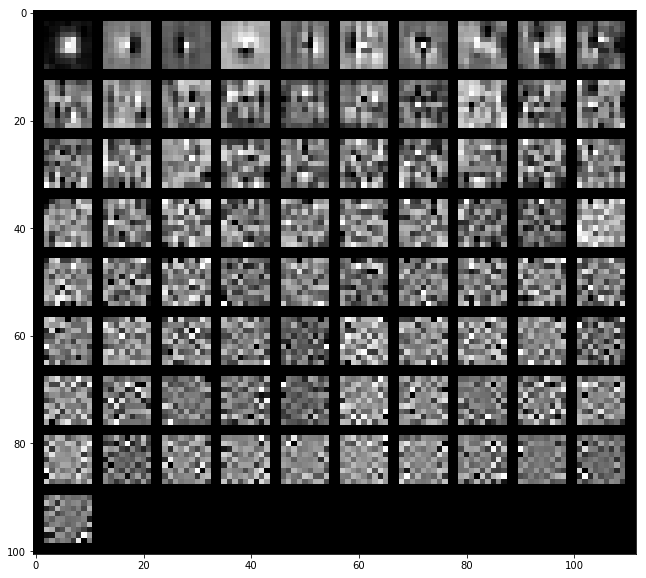

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16394747 0.25902577 0.34497536 0.39764616 0.44413    0.4893611
 0.52379968 0.55066028 0.57673588 0.60131422 0.62410766 0.64493692
 0.66475549 0.68417174 0.70116398 0.71638051 0.73081995 0.74472717
 0.75720676 0.76864935]


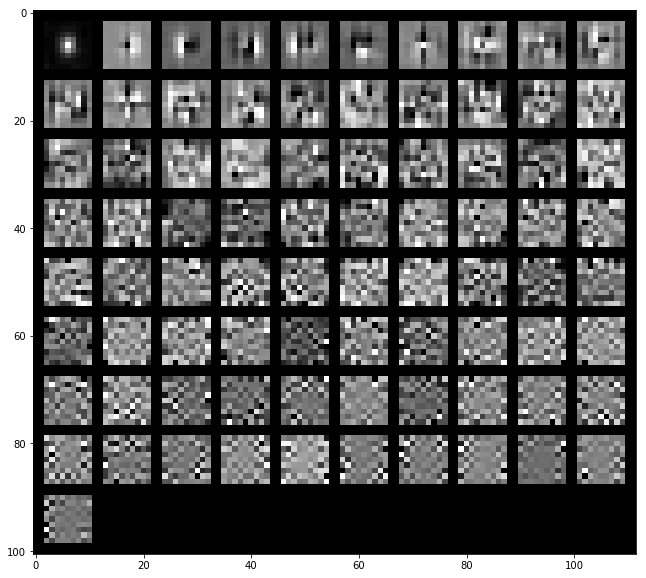

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx407/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13454112 0.23278737 0.31100798 0.37390315 0.42812714 0.46988047
 0.51033169 0.54520053 0.57476702 0.60331436 0.62874807 0.65291781
 0.67511281 0.69612869 0.71424046 0.73132327 0.74634385 0.76056231
 0.7744611  0.78796787]


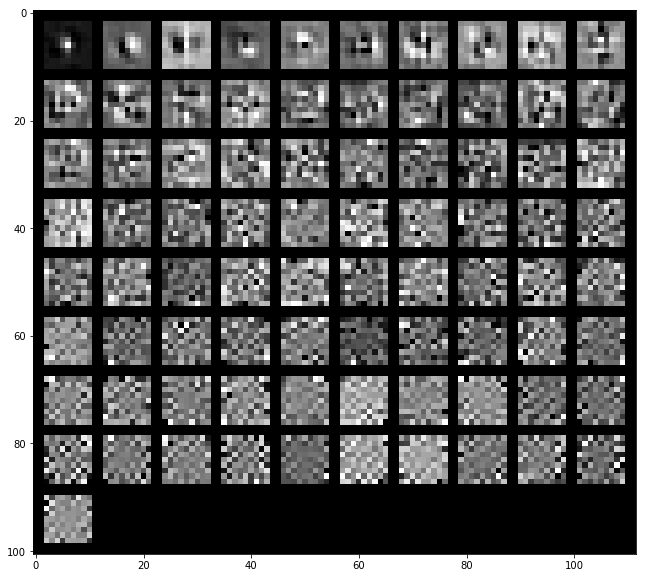

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15410242 0.25716397 0.32777336 0.38353211 0.42556175 0.46176745
 0.49505554 0.52698559 0.55479407 0.58020316 0.60459841 0.62625677
 0.64742184 0.66793251 0.68746535 0.70580778 0.72267505 0.73728918
 0.75153797 0.76488891]


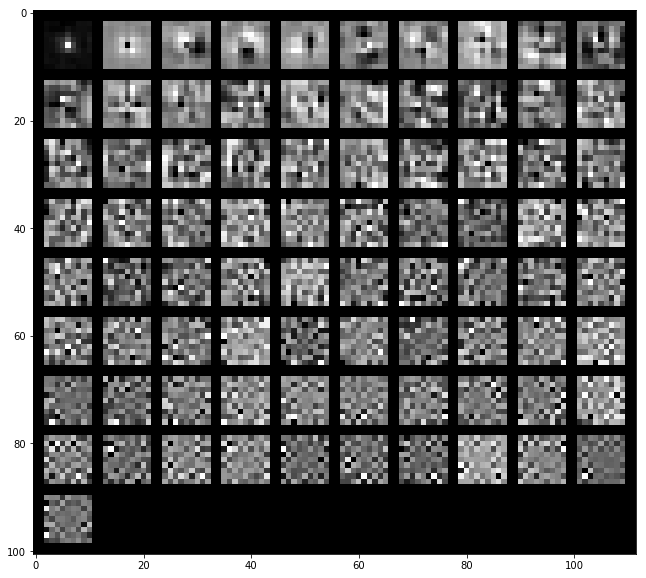

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14299041 0.22904848 0.30158494 0.36071649 0.40891903 0.44757799
 0.48206203 0.51364942 0.54350054 0.56781437 0.59137328 0.61384517
 0.63375619 0.65213193 0.66936868 0.68548106 0.70037925 0.71497359
 0.72901699 0.74262987]


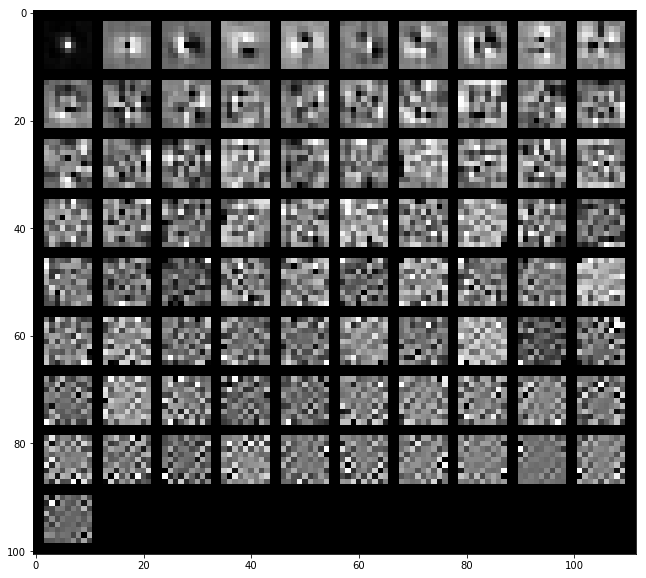

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx418/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21303319 0.36265691 0.48943398 0.55757532 0.61370803 0.65794599
 0.69706564 0.72554169 0.74964301 0.77072773 0.78822141 0.80443899
 0.81987001 0.83367339 0.84686672 0.85958135 0.87068529 0.88162161
 0.88990309 0.89792199]


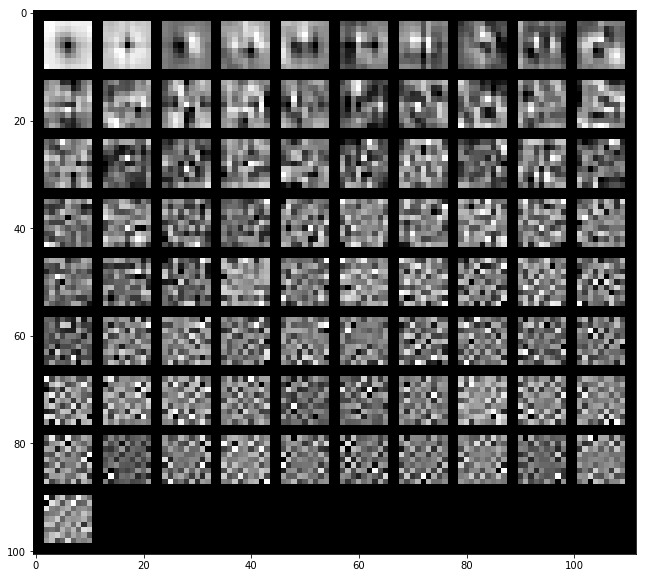

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.28259026 0.4163649  0.49638983 0.54628574 0.58366192 0.61390342
 0.64067425 0.66650003 0.68890979 0.70946179 0.72688599 0.74285676
 0.75755078 0.77120885 0.78340618 0.79501498 0.80543957 0.81546479
 0.82475838 0.83353136]


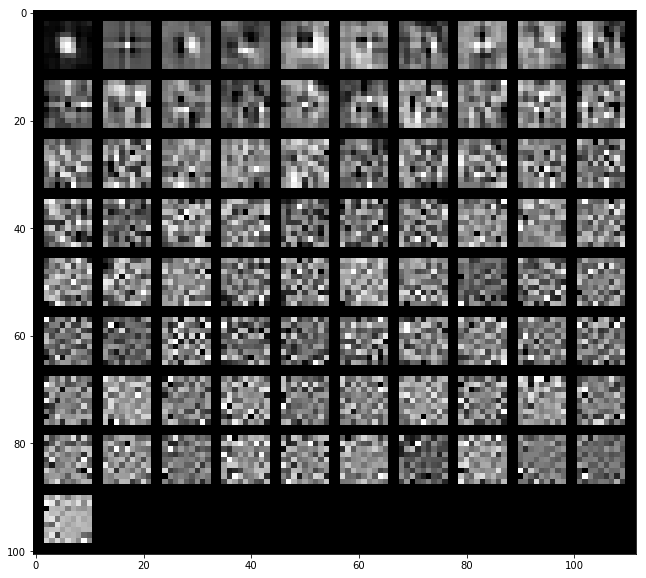

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.27172106 0.39276771 0.49019179 0.5507113  0.59511314 0.63050478
 0.6618004  0.68614314 0.70730233 0.7273538  0.74619928 0.76204609
 0.77580393 0.78865131 0.80128539 0.81312788 0.82316935 0.83259863
 0.84158341 0.84957704]


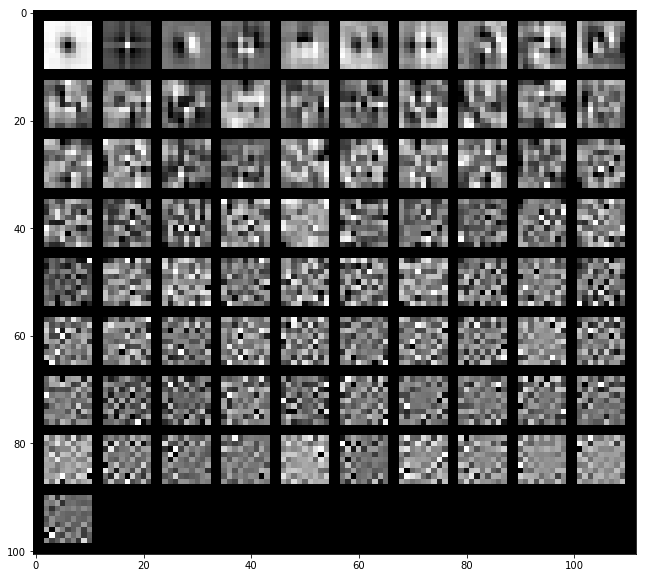

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx419/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19754451 0.27804677 0.34938286 0.40665245 0.45407285 0.49641675
 0.53196863 0.56602667 0.5931314  0.61824135 0.64086661 0.66242025
 0.68212269 0.70094158 0.71918847 0.73597534 0.75177513 0.76645897
 0.78046153 0.79334527]


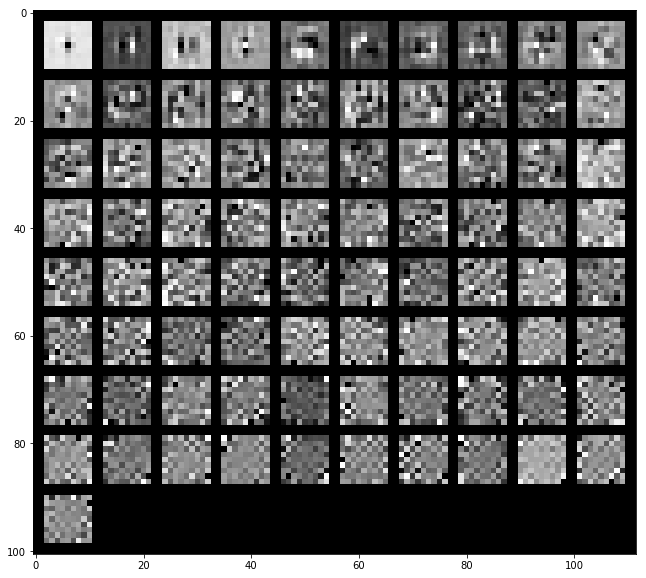

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14146965 0.21649857 0.2880337  0.3481992  0.39139888 0.4289098
 0.46181225 0.49259095 0.52077156 0.5475126  0.57365351 0.59880802
 0.62008497 0.63933364 0.65807999 0.67527849 0.69196301 0.70744524
 0.72254132 0.73701978]


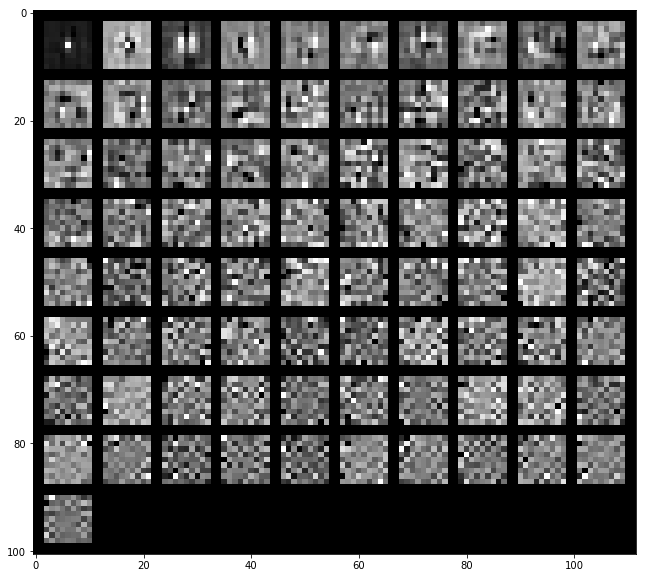

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18286905 0.25284871 0.31429909 0.37423099 0.41378934 0.44863554
 0.47914775 0.50719537 0.53495666 0.56118322 0.58563847 0.60601598
 0.625517   0.64464581 0.6619768  0.67764267 0.69323911 0.70751689
 0.72117604 0.73398509]


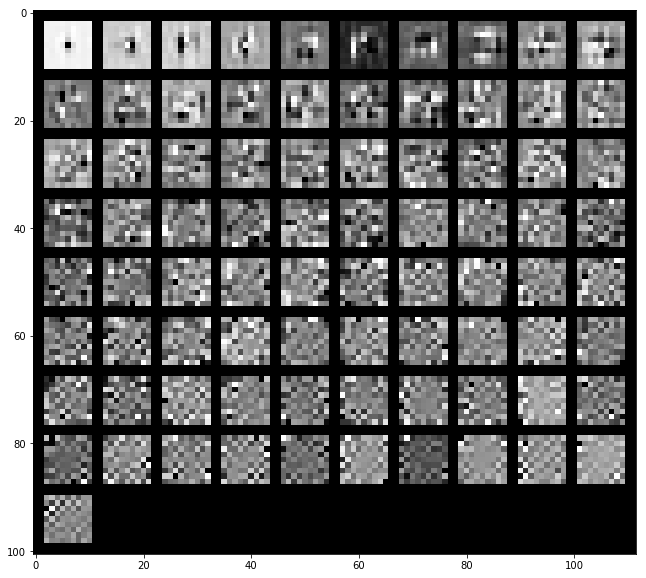

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx430/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16743445 0.27087563 0.33741902 0.39090795 0.43668957 0.47789112
 0.51447722 0.5503668  0.58139132 0.61072629 0.63375081 0.65434548
 0.67467405 0.69349897 0.71069889 0.72673087 0.74218617 0.75647525
 0.77011483 0.78239768]


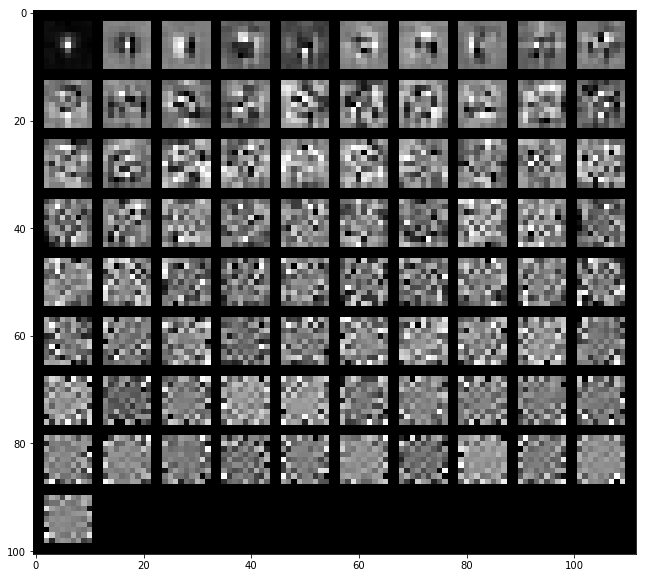

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16069773 0.2722633  0.33993365 0.39125235 0.43958987 0.47984501
 0.51594418 0.54678132 0.57182223 0.59593034 0.61704339 0.63759819
 0.65758851 0.67594383 0.69319726 0.70918278 0.72436764 0.73809134
 0.75137425 0.76350132]


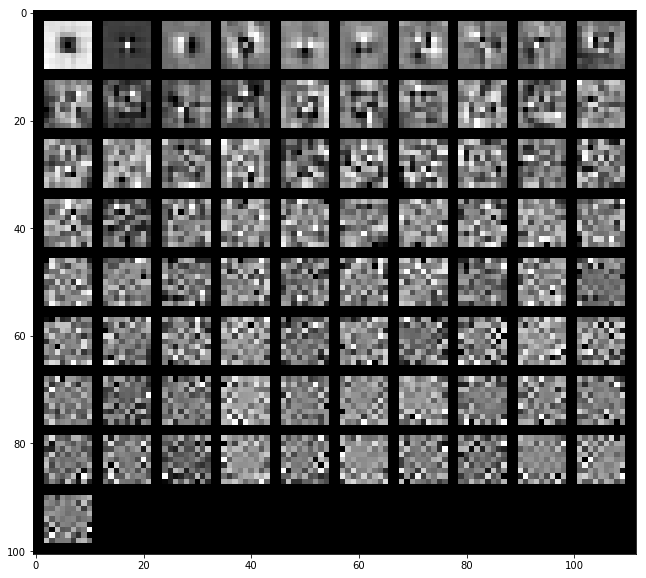

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15737026 0.26575391 0.3301719  0.37608697 0.41937942 0.46088093
 0.49562453 0.52531059 0.55293411 0.57784912 0.60161685 0.62257385
 0.64126659 0.65900995 0.67582614 0.69178011 0.70699347 0.72108509
 0.73433763 0.74656318]


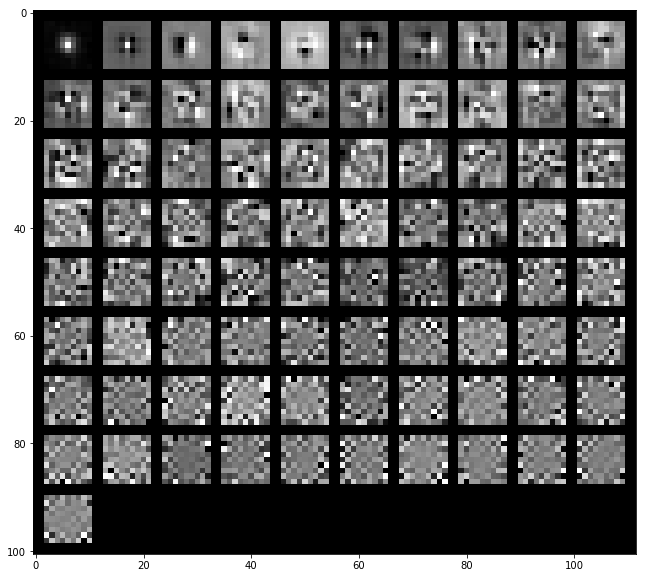

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx442/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15206784 0.2481757  0.31572597 0.36740325 0.41671991 0.4605894
 0.49768093 0.53067929 0.5629969  0.5920061  0.61796586 0.64349648
 0.6663722  0.6856389  0.70378317 0.72076194 0.73698578 0.751642
 0.76576501 0.77949535]


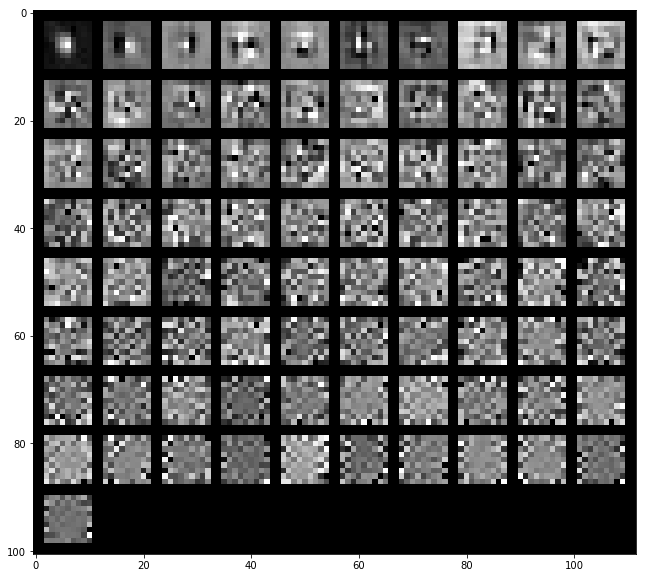

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17095898 0.25781885 0.32810341 0.38042515 0.4311758  0.47274889
 0.50880319 0.53932675 0.56950306 0.59777575 0.62154294 0.64457135
 0.66389127 0.68311321 0.69984291 0.71605705 0.73131681 0.74572038
 0.75923474 0.77235992]


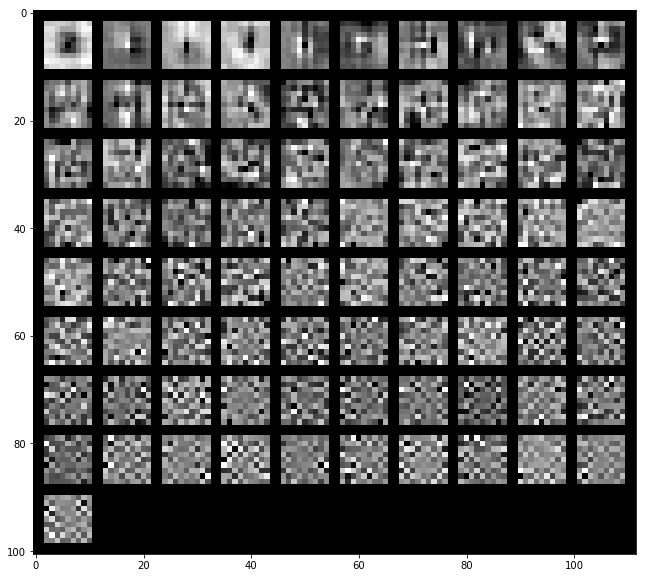

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14591634 0.22587406 0.3008694  0.35364232 0.39995463 0.43682609
 0.47236441 0.50354016 0.5319981  0.55965202 0.58472338 0.60661989
 0.62667191 0.64620267 0.66376216 0.68006375 0.69568649 0.71075769
 0.72511986 0.73903553]


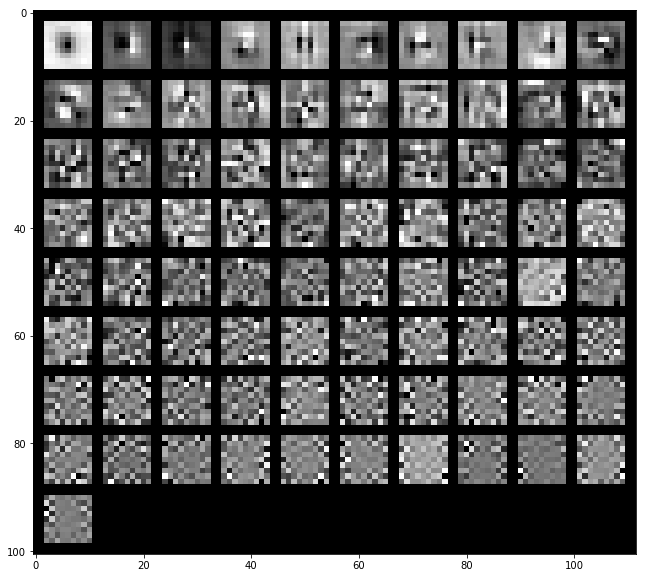

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx443/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17603158 0.27583904 0.35645191 0.41443408 0.46329954 0.50712779
 0.54543802 0.57620519 0.60613425 0.63308446 0.65635509 0.67750725
 0.69779284 0.71609241 0.73379262 0.75065695 0.76656369 0.78097029
 0.7939454  0.8061852 ]


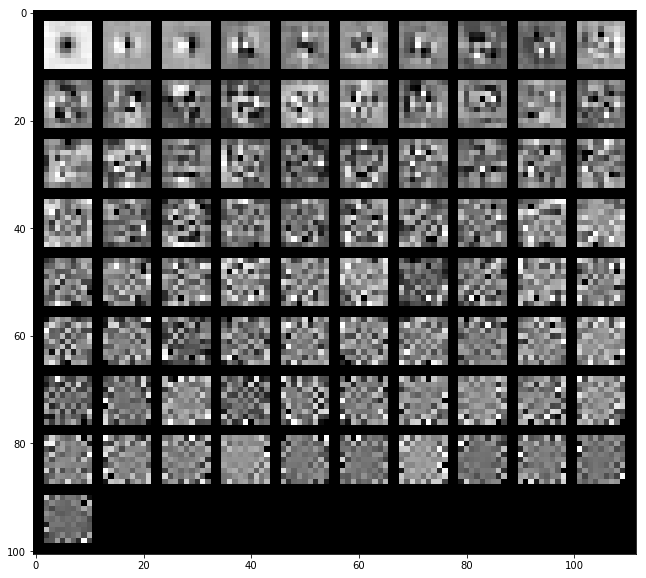

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18680082 0.28212849 0.35247843 0.41388153 0.4686715  0.50775396
 0.54387205 0.57610725 0.60425092 0.63089667 0.65456471 0.67729399
 0.69934378 0.71973787 0.73762698 0.75413688 0.76924124 0.78358686
 0.7969112  0.80872517]


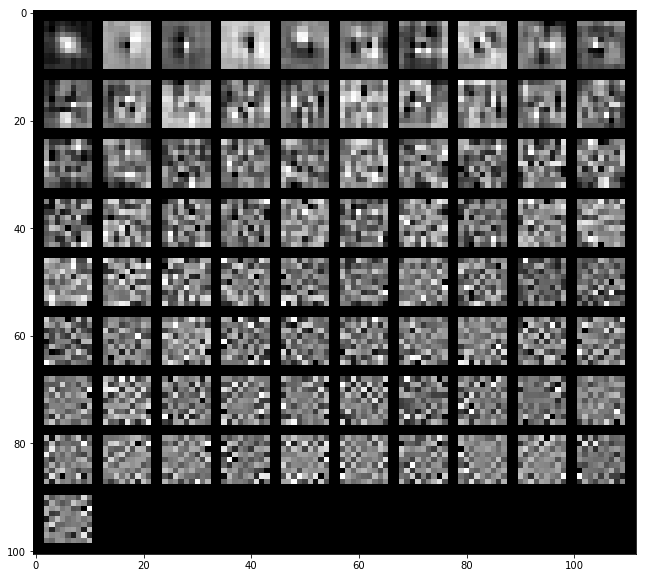

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17596116 0.26624861 0.34081583 0.3931578  0.43821726 0.47999469
 0.514805   0.54731652 0.57402475 0.59814392 0.62131723 0.64307524
 0.66451262 0.68416798 0.70191119 0.71814488 0.73246301 0.74628557
 0.75892946 0.77120724]


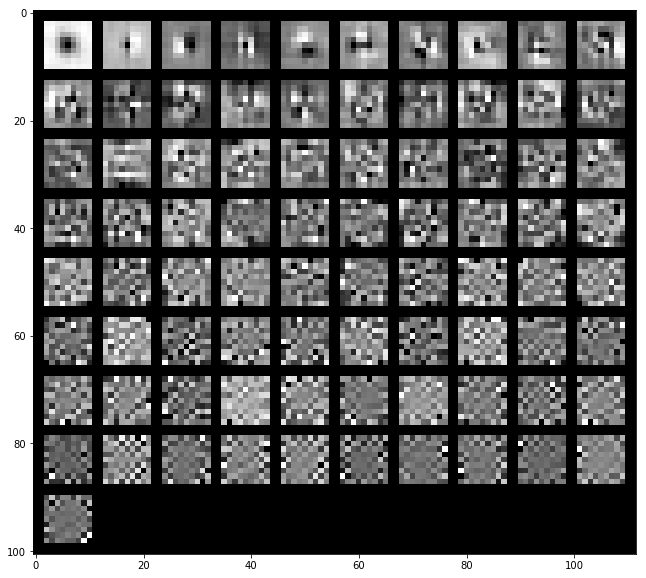

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx454/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14461321 0.22998499 0.29851117 0.35630518 0.40268723 0.44573544
 0.4845277  0.51709389 0.54819139 0.57690628 0.60259392 0.62666748
 0.64956629 0.66953    0.68875705 0.70724801 0.72396125 0.7401218
 0.75549393 0.76929024]


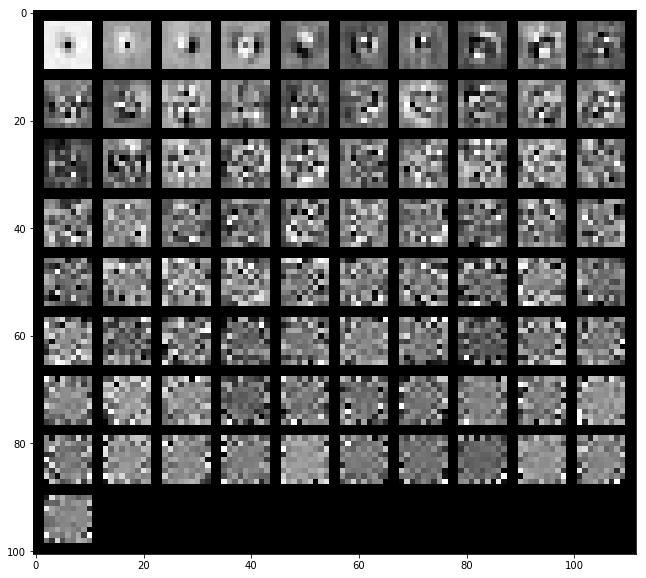

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13228724 0.25204127 0.31600748 0.36781082 0.41341429 0.45489293
 0.48957568 0.52259192 0.55269287 0.57881417 0.60314256 0.62541412
 0.64667963 0.66728033 0.68560318 0.70276778 0.71827973 0.73284947
 0.74713225 0.76010602]


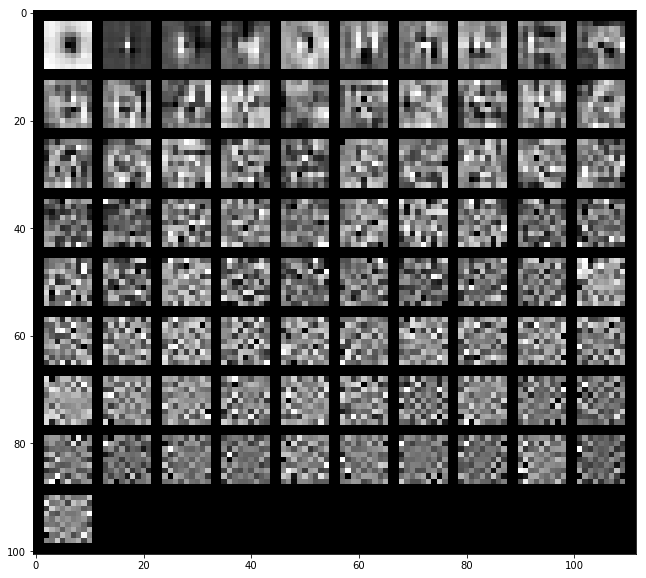

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13547501 0.23373807 0.29599214 0.34614453 0.38978848 0.42676054
 0.46128816 0.49087449 0.51767202 0.54194152 0.5658246  0.58837855
 0.60986822 0.62873646 0.64613432 0.66268241 0.67856351 0.69376403
 0.70782879 0.72141455]


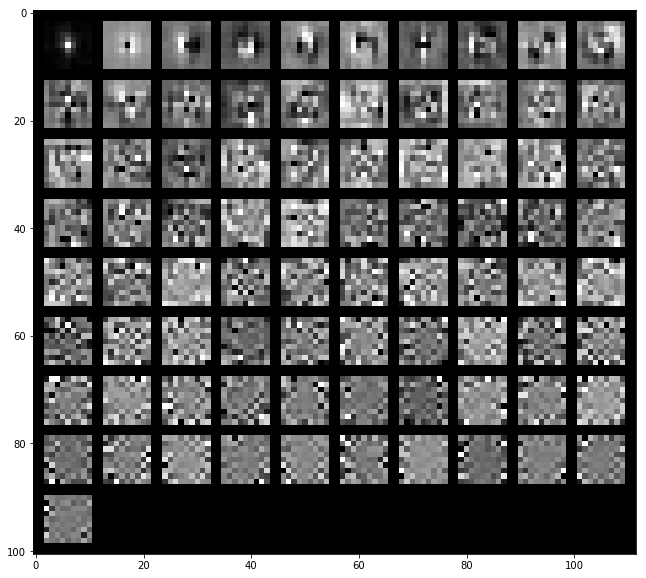

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx455/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18156951 0.28238125 0.37075305 0.43535837 0.48233576 0.5258231
 0.56472028 0.59816175 0.62738421 0.65345677 0.6777246  0.70077789
 0.7219596  0.7414412  0.75882484 0.77471151 0.78971633 0.80342747
 0.81620371 0.82829785]


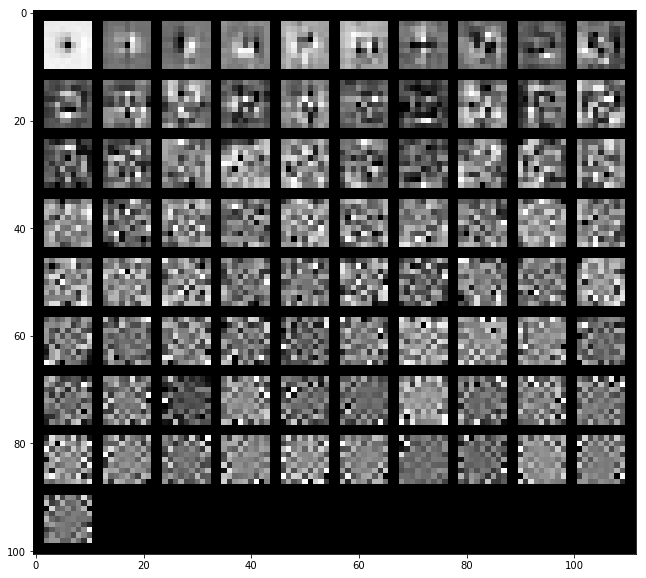

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.2263845  0.35246081 0.43599429 0.49703117 0.55438209 0.59347296
 0.62591411 0.65324936 0.67869726 0.70235527 0.72107408 0.73894423
 0.7553651  0.77061596 0.78516478 0.79818665 0.81014123 0.82067944
 0.8309828  0.83962806]


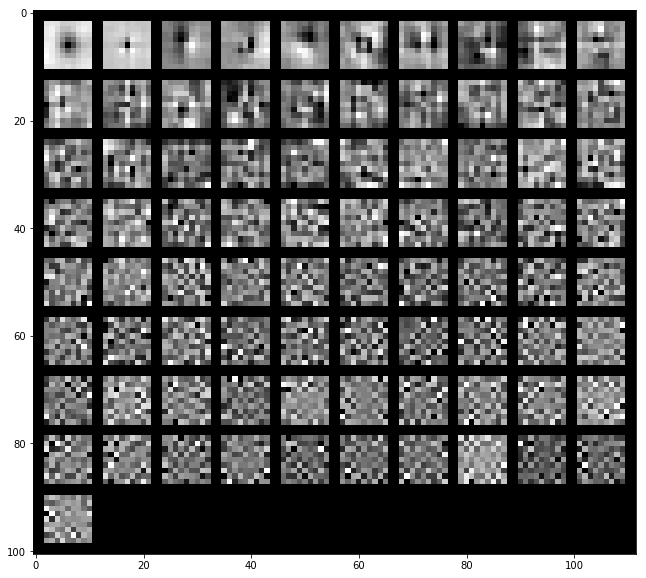

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18949546 0.30472127 0.38592433 0.44256011 0.49384859 0.52992553
 0.5636916  0.59280396 0.62018286 0.64356074 0.66508564 0.68529664
 0.70468686 0.72225254 0.73812506 0.75245572 0.76622701 0.77903241
 0.79139009 0.80233652]


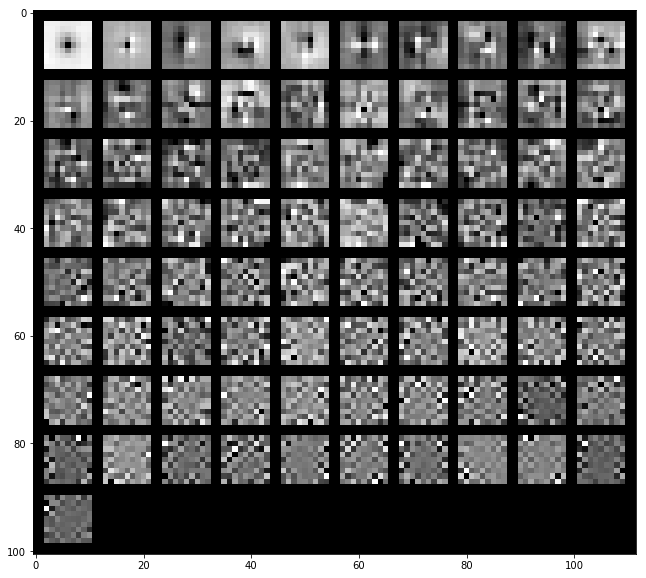

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx467/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19755362 0.28275843 0.35019109 0.4045235  0.45331433 0.49485642
 0.53188072 0.56446762 0.59407552 0.62175142 0.64652075 0.66929235
 0.69085101 0.71064204 0.72962961 0.74738961 0.76316451 0.77721852
 0.79093925 0.80419958]


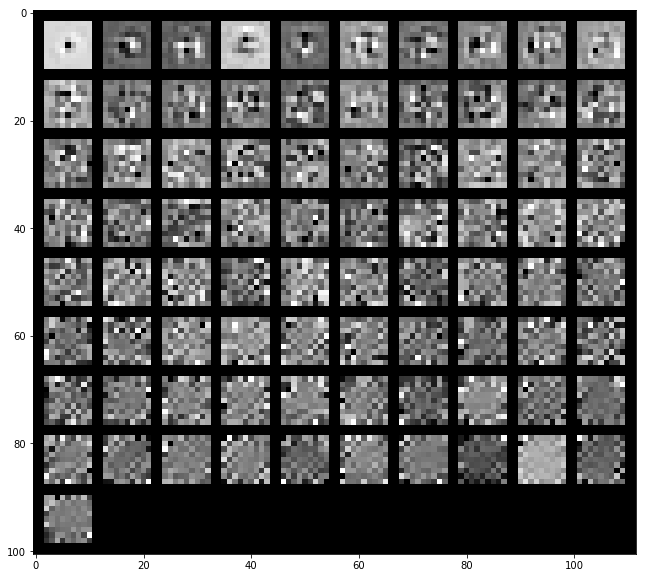

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13988282 0.20312541 0.26376268 0.3158983  0.36199269 0.40136573
 0.43426336 0.46385683 0.49217002 0.51955771 0.5453185  0.56852697
 0.59056322 0.61142406 0.63169973 0.65119924 0.6685411  0.68549128
 0.70176126 0.71735195]


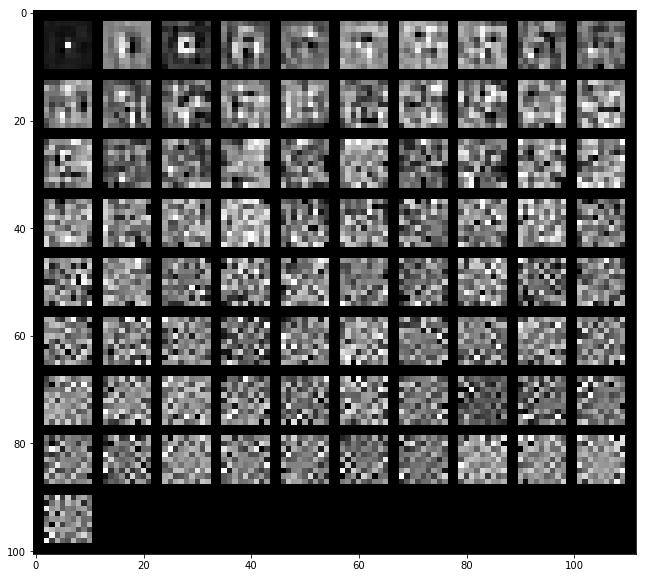

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17645956 0.24083264 0.29535769 0.34817194 0.39044039 0.42933124
 0.45850702 0.48600705 0.51166117 0.53672748 0.56086613 0.5828569
 0.60421267 0.62347027 0.6423819  0.65955324 0.6760799  0.69117328
 0.70553315 0.71954662]


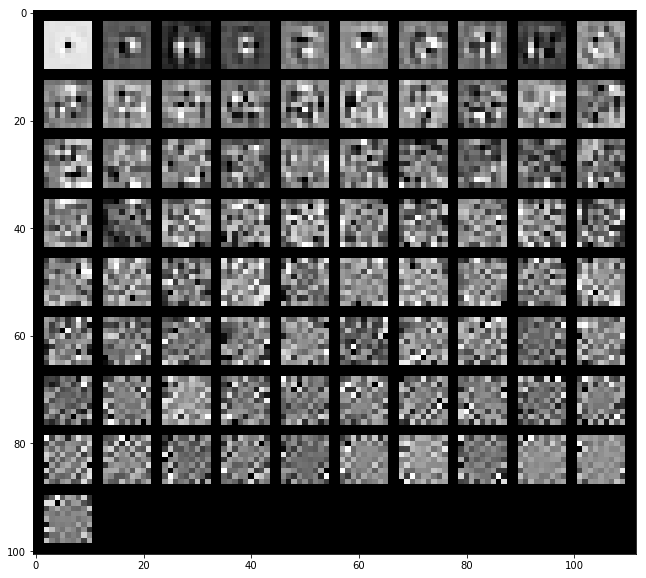

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx478/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13214631 0.21657173 0.28026494 0.33518151 0.3810219  0.42254601
 0.46166629 0.49870394 0.5303113  0.56077491 0.58727147 0.61154501
 0.63448896 0.65714001 0.67719578 0.69674004 0.71459304 0.73120081
 0.74629345 0.76005944]


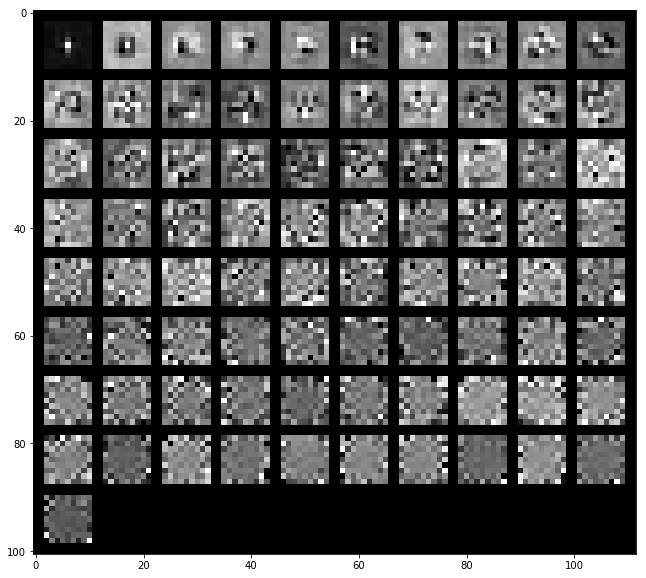

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20773136 0.28393978 0.35316832 0.41263861 0.45795595 0.49201545
 0.52356989 0.55191483 0.5768946  0.60110486 0.62302597 0.64419435
 0.66353548 0.68203474 0.69839959 0.71351042 0.72802589 0.74138344
 0.75421244 0.76622656]


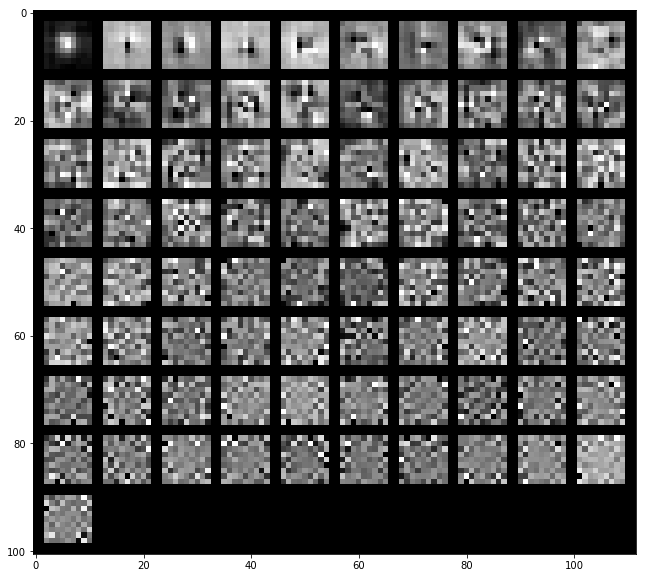

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15412542 0.24250286 0.30540903 0.36049418 0.40519404 0.43967649
 0.47320474 0.50366623 0.53067051 0.55536587 0.57920177 0.59965361
 0.61923595 0.63706915 0.6546272  0.67187081 0.687488   0.70213973
 0.71621546 0.72974845]


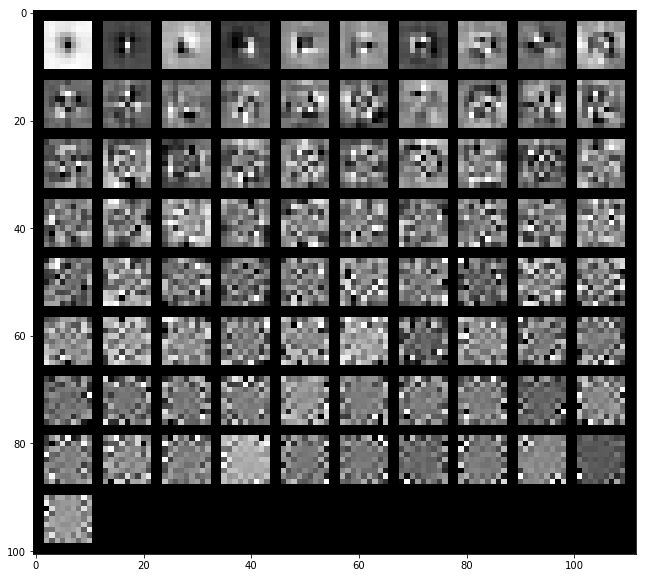

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx479/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1665579  0.26356776 0.35008375 0.4044584  0.44933669 0.49173951
 0.53168434 0.56357814 0.59224337 0.61914764 0.64346601 0.66617099
 0.68688102 0.70643217 0.72388294 0.73977409 0.7547273  0.76893544
 0.78221202 0.79495285]


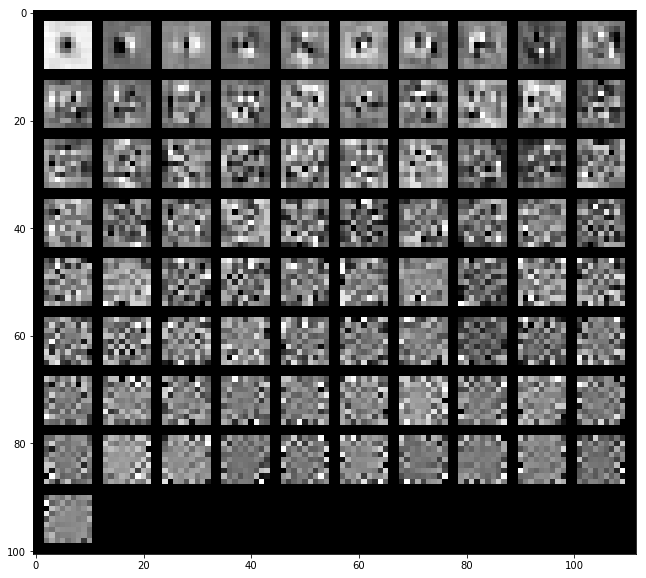

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16457285 0.26249456 0.33161676 0.3903785  0.44274556 0.48331086
 0.51998879 0.5529782  0.58039431 0.60638167 0.63147338 0.65470691
 0.67626438 0.69505905 0.71302048 0.73052521 0.74631244 0.76077783
 0.77423963 0.78721012]


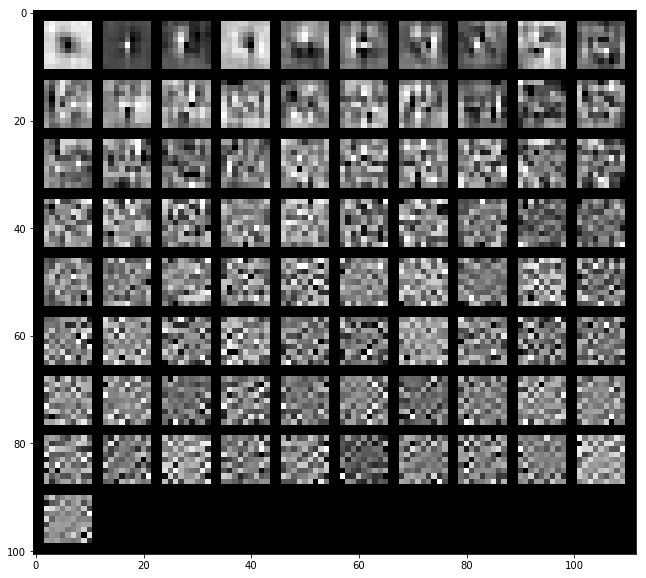

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15956342 0.24945537 0.32410775 0.37466017 0.41950986 0.46127305
 0.4958237  0.52749092 0.55424773 0.57841801 0.60236101 0.62456586
 0.64544678 0.66495261 0.68237827 0.69850183 0.71353172 0.72733565
 0.74072214 0.75381685]


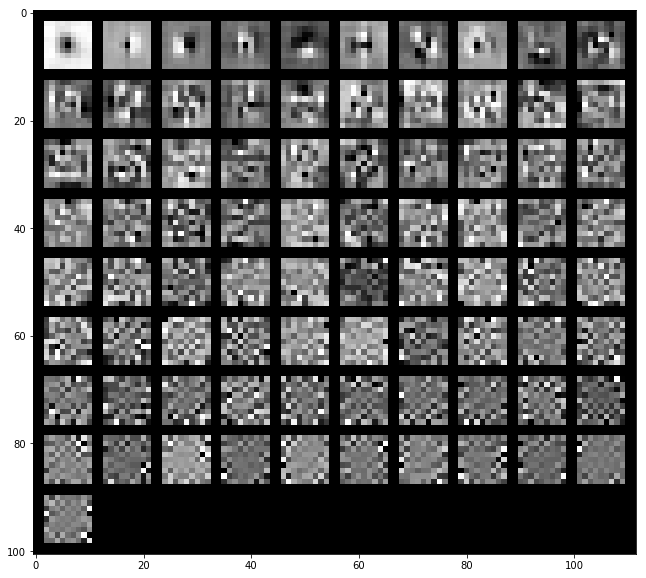

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx586/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13443904 0.2174573  0.28159814 0.33441034 0.38046699 0.42249425
 0.4626375  0.49875137 0.53092425 0.55825126 0.58351732 0.60812042
 0.6311786  0.65374532 0.67268722 0.69042637 0.70765354 0.72408531
 0.74006021 0.75437707]


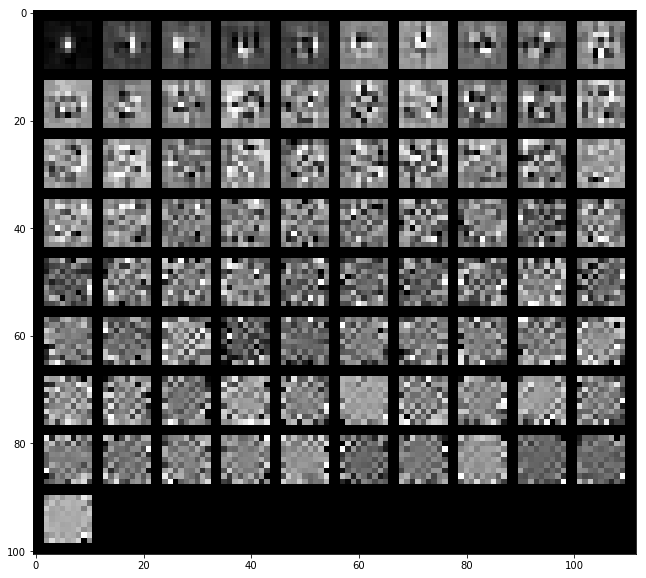

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14646077 0.23229829 0.30775084 0.36423555 0.40641896 0.44508129
 0.47886642 0.51072344 0.53829846 0.5644157  0.58859131 0.6106169
 0.63073606 0.65028733 0.66850003 0.68513831 0.70128882 0.71652097
 0.73166312 0.74575332]


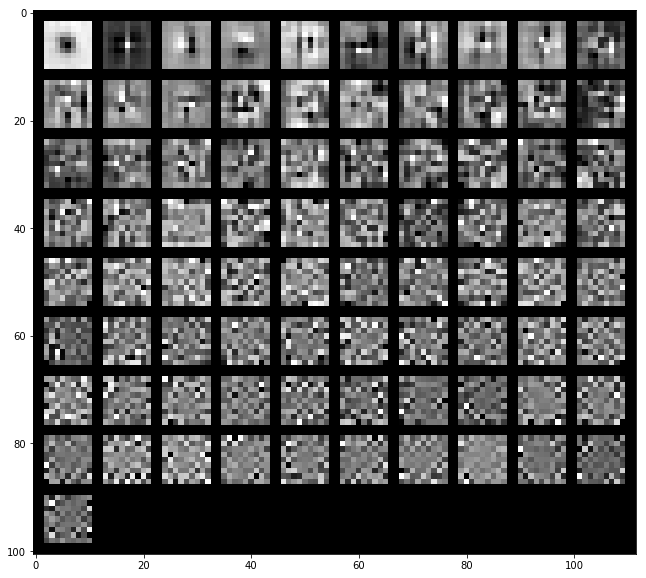

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13298856 0.2129197  0.28228967 0.33339645 0.37469203 0.41074057
 0.44585683 0.47693837 0.50543317 0.53214789 0.55835624 0.58199652
 0.60230255 0.62233194 0.64148982 0.65808997 0.67455171 0.68971979
 0.70430582 0.71828009]


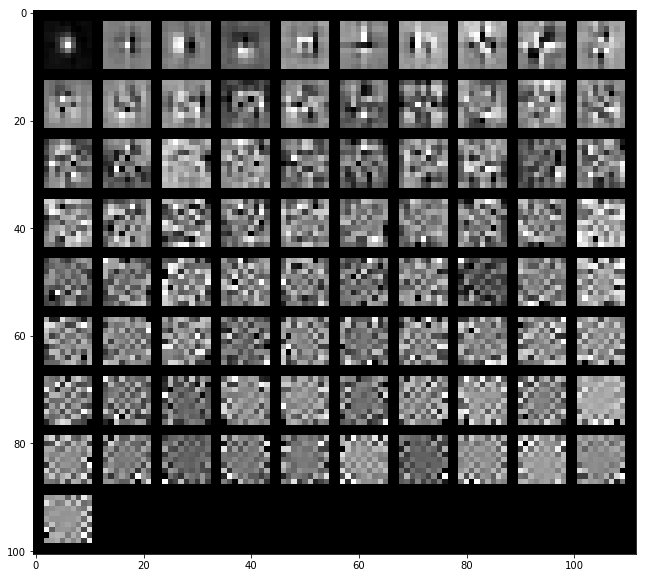

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx598/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18853824 0.29975771 0.38543092 0.44810302 0.50420643 0.55391287
 0.59189952 0.62592993 0.65715832 0.68541241 0.7103421  0.73080953
 0.74958881 0.76700343 0.78242106 0.79579165 0.80874692 0.82067168
 0.83159096 0.84140801]


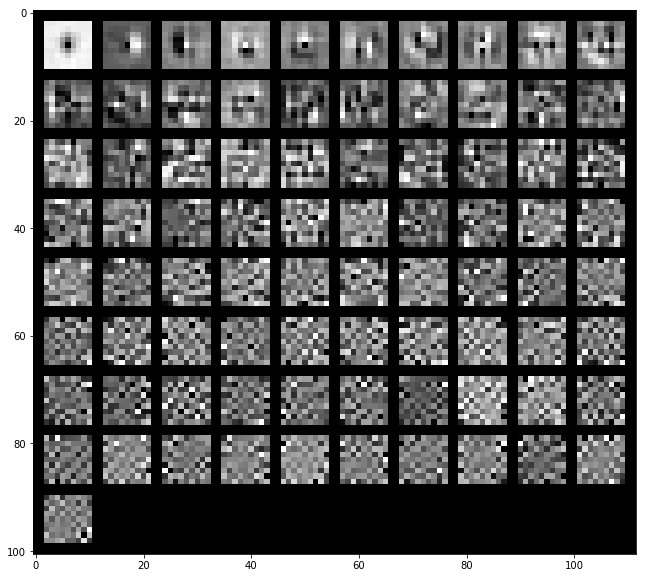

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18307585 0.32487589 0.40370932 0.45861902 0.50695522 0.54981887
 0.58664446 0.61643887 0.64222217 0.66512297 0.68685566 0.70634749
 0.72516112 0.74051594 0.75572881 0.7697337  0.78303944 0.79509813
 0.80663937 0.81677994]


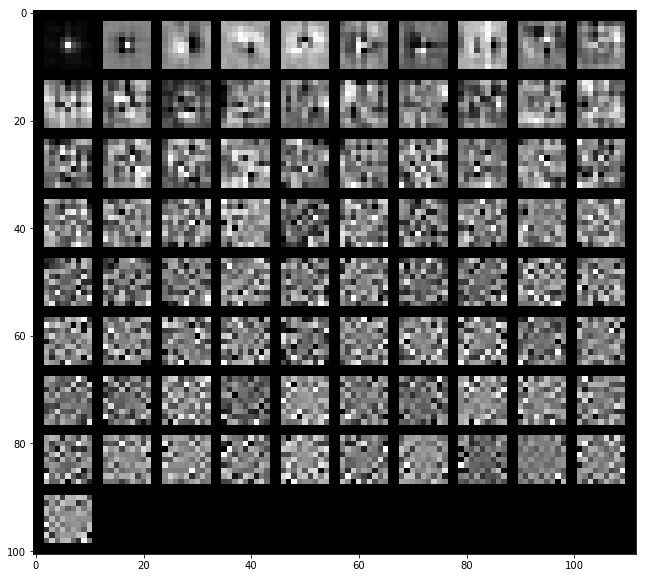

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19424779 0.307544   0.39417668 0.44688553 0.49893139 0.53985284
 0.57647139 0.60777043 0.635898   0.6596366  0.68246615 0.70211045
 0.71970642 0.73623199 0.75023287 0.76371079 0.77579178 0.78734292
 0.79842569 0.80875736]


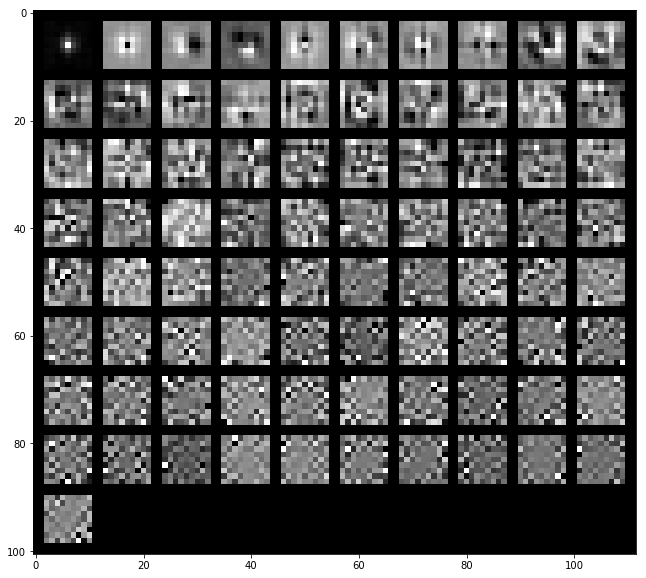

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx599/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13137533 0.21698241 0.29860694 0.35543749 0.40853076 0.45020733
 0.48944231 0.52431879 0.55833299 0.58979234 0.61844535 0.64270018
 0.66487729 0.68503434 0.70511823 0.72271506 0.73972966 0.75502461
 0.76864085 0.78221961]


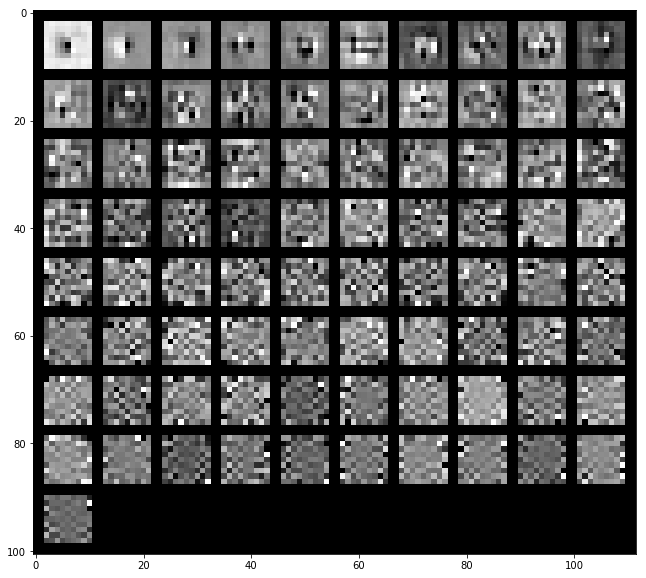

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17356997 0.30328348 0.37618862 0.43146111 0.47954132 0.51309116
 0.54337494 0.57178979 0.59705744 0.61995575 0.64091807 0.66058838
 0.679369   0.69710654 0.71345567 0.72895737 0.74270354 0.75612635
 0.76907974 0.78083211]


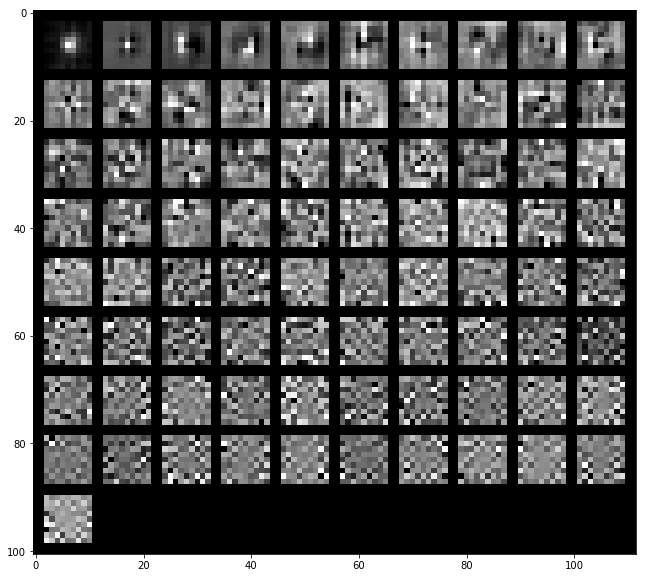

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14316184 0.24643316 0.32414536 0.37748694 0.42227114 0.45894798
 0.49132832 0.52216729 0.54977471 0.57651911 0.60117476 0.62342894
 0.64244024 0.66125183 0.67845862 0.69407535 0.70932365 0.72360508
 0.73711999 0.74958116]


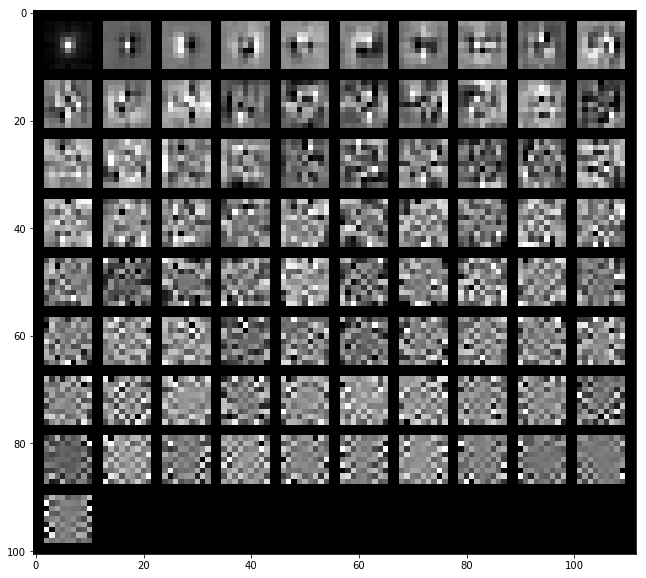

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx610/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22624839 0.31054844 0.38468076 0.44626672 0.49772641 0.53712281
 0.57381817 0.60713531 0.63876503 0.66737538 0.69181531 0.71320954
 0.73253895 0.75070891 0.76851705 0.78567699 0.79998564 0.81361605
 0.82593892 0.83702153]


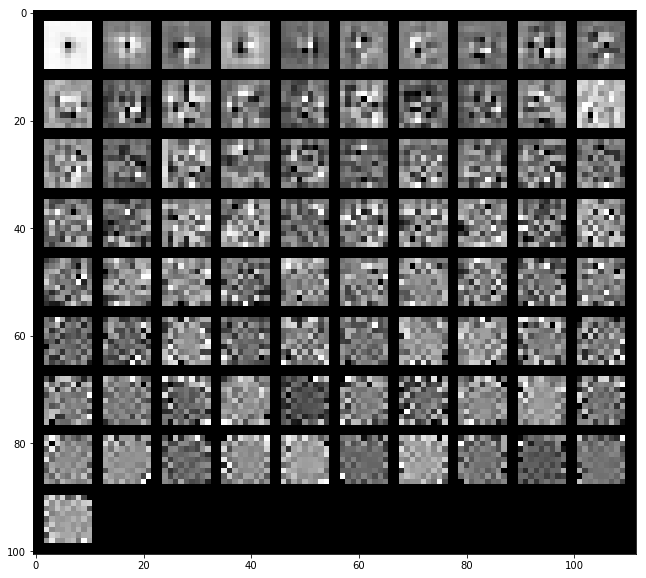

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.24479717 0.32929718 0.39412347 0.44118283 0.48385586 0.51740379
 0.54617576 0.57301941 0.59744625 0.62079529 0.64271352 0.66333944
 0.68172064 0.69923606 0.7156191  0.73138403 0.74635836 0.76017278
 0.77242659 0.78387491]


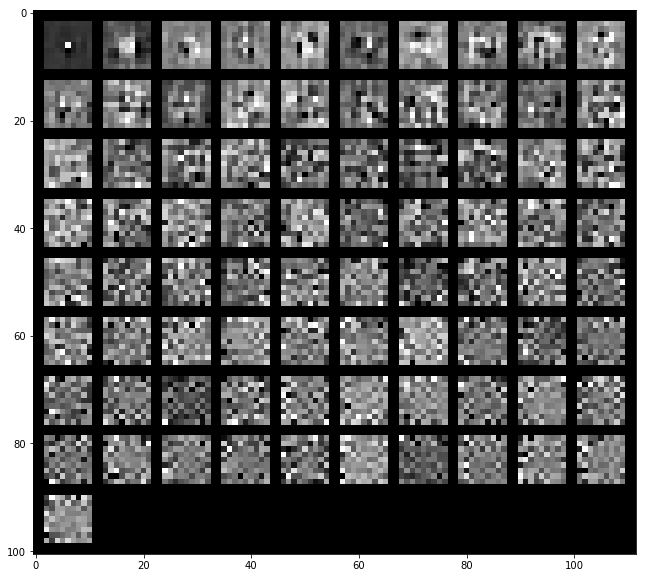

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21537682 0.31359063 0.37016497 0.42060275 0.46446499 0.49705754
 0.52848964 0.55790925 0.58493079 0.61120206 0.63513683 0.65603191
 0.67610985 0.69404595 0.7114861  0.72790453 0.74174822 0.75548374
 0.76814767 0.77968543]


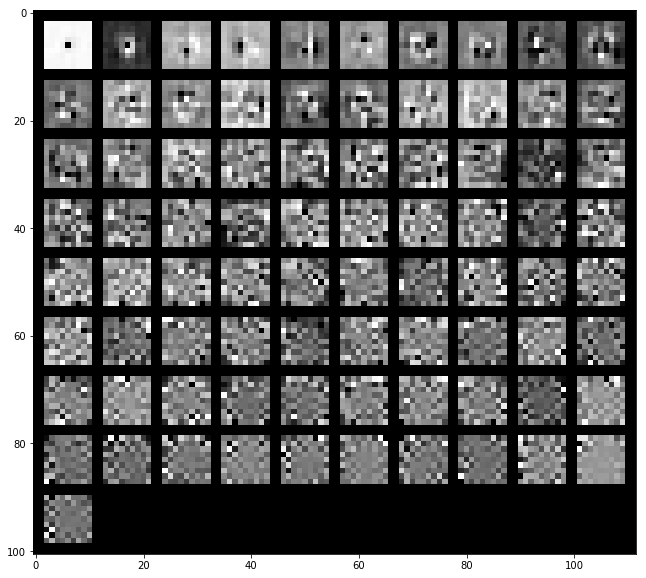

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx611/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12974986 0.19962761 0.26468009 0.31571007 0.36131497 0.40462362
 0.44277973 0.47723528 0.50871582 0.5372603  0.56331436 0.58796514
 0.61055298 0.63298119 0.65301018 0.67213156 0.69032547 0.70812303
 0.72318547 0.73724706]


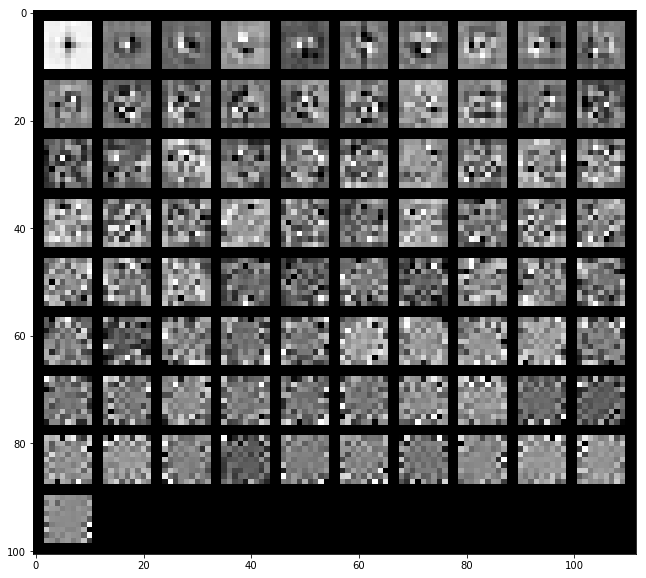

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14523499 0.25160411 0.34375313 0.40308416 0.44499328 0.48532665
 0.51998284 0.54870519 0.57434117 0.59861365 0.62066805 0.64067956
 0.66004682 0.67778287 0.6943974  0.70974068 0.7236344  0.73710283
 0.7501169  0.76216135]


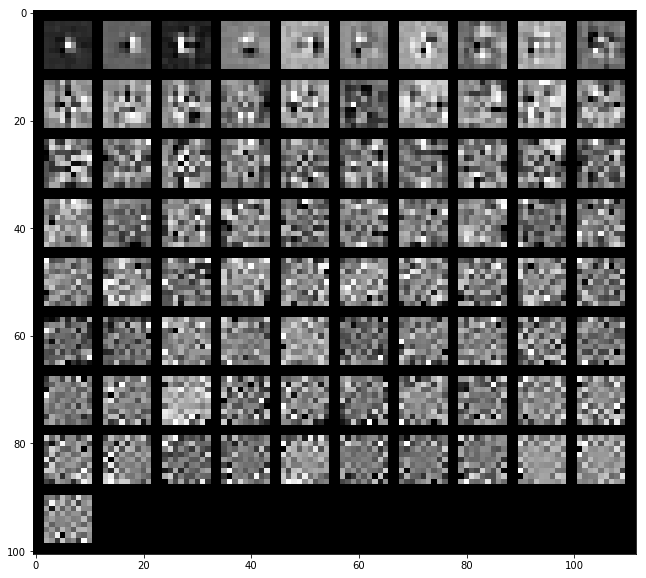

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13287184 0.21525341 0.29025549 0.34167438 0.38147822 0.41900363
 0.45362856 0.48625966 0.51577424 0.54081745 0.56440909 0.58588913
 0.60696538 0.62541153 0.64303725 0.65972501 0.6753441  0.6898477
 0.70378542 0.71679627]


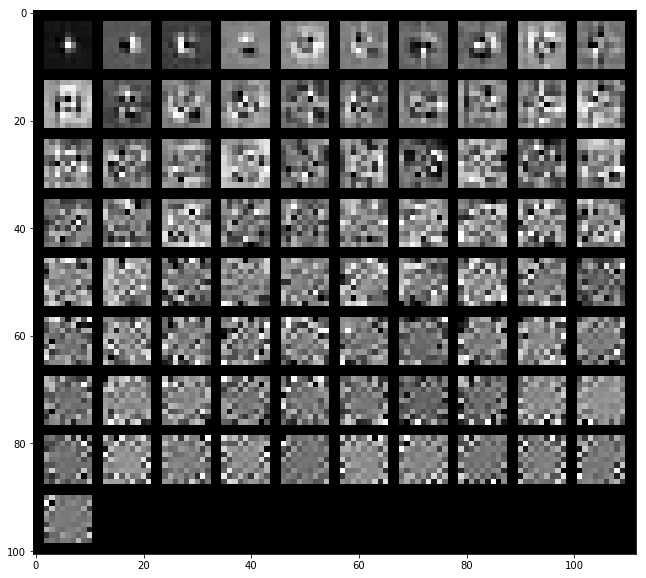

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx623/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12172558 0.19878073 0.2613813  0.31530885 0.3620067  0.40493988
 0.44472068 0.48258996 0.51545433 0.5449929  0.57304322 0.59872915
 0.62342757 0.64587792 0.66697198 0.68514741 0.70318517 0.71926545
 0.73431004 0.74845095]


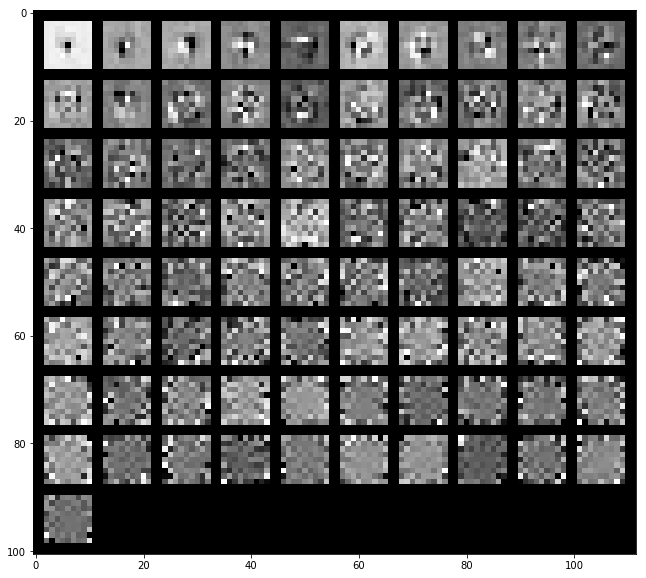

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15592581 0.23688642 0.30464557 0.35969926 0.40987302 0.44906978
 0.48629517 0.51734932 0.54787911 0.57482272 0.59993245 0.62243787
 0.6432902  0.66214891 0.68038294 0.69669914 0.71224022 0.72718096
 0.74123077 0.75473713]


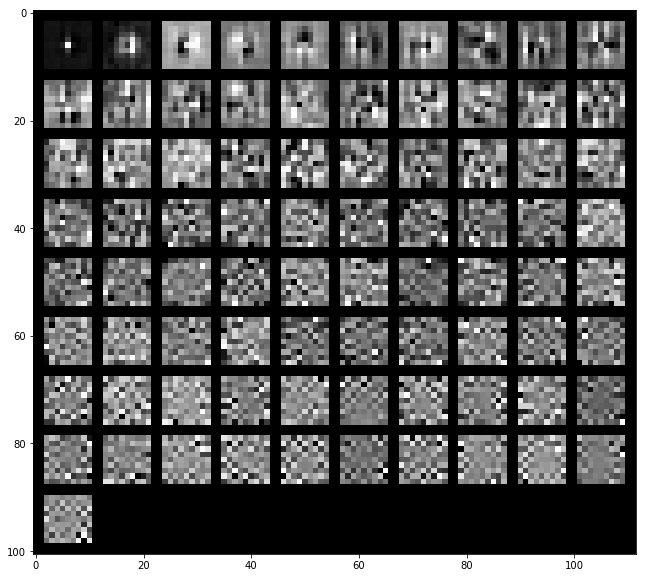

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13658101 0.21134612 0.27453951 0.3210727  0.36642005 0.4064921
 0.44405831 0.47696629 0.50561872 0.53330639 0.5578669  0.58065801
 0.60197748 0.62218865 0.64160365 0.65840284 0.67454123 0.68927409
 0.70290251 0.71637707]


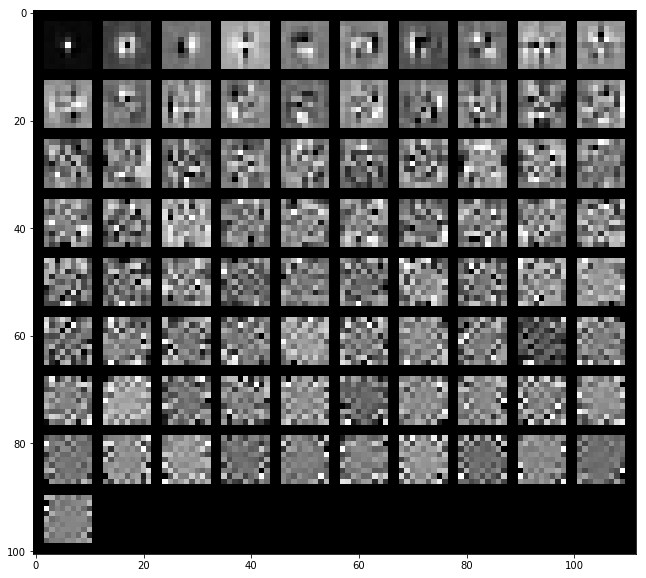

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx634/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12456264 0.20939704 0.28479842 0.34380164 0.39306977 0.43931508
 0.48425258 0.51711135 0.54773539 0.57503361 0.60072838 0.6258992
 0.64850387 0.66906835 0.68865277 0.70668232 0.72367604 0.73921455
 0.75254581 0.76551374]


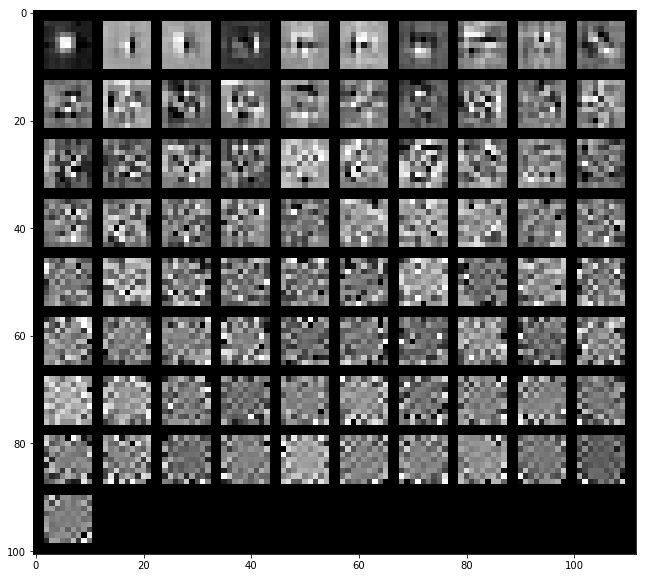

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20051359 0.27852994 0.34712219 0.40536981 0.4509444  0.48967922
 0.52152165 0.54988956 0.5774217  0.6029467  0.62538417 0.64707577
 0.66580563 0.68366834 0.70095721 0.71656878 0.73137052 0.74560169
 0.75866738 0.77074799]


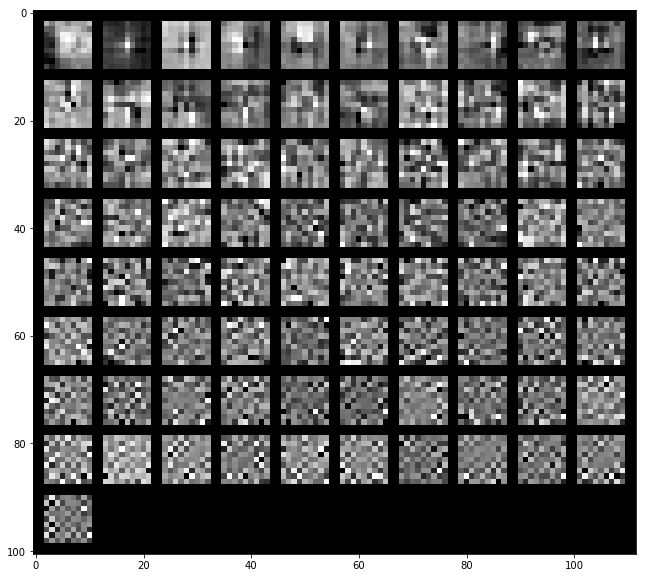

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13509923 0.21321894 0.28058768 0.34481836 0.3905306  0.43077592
 0.46599417 0.49746712 0.52613598 0.55247023 0.57647015 0.59939966
 0.62082316 0.63993573 0.65794238 0.67559143 0.6923439  0.70644012
 0.72031934 0.73316349]


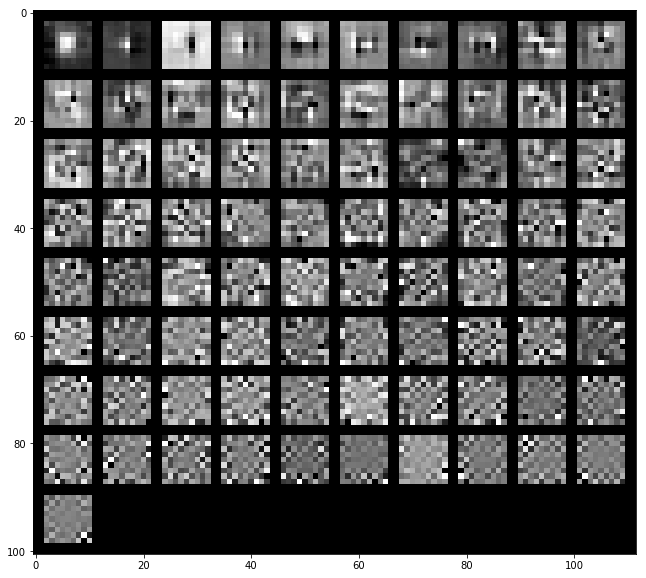

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx635/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13174678 0.21086158 0.27336298 0.32091319 0.36672079 0.40812827
 0.44599913 0.4768027  0.50661708 0.53371653 0.55931718 0.58307315
 0.60596265 0.6281861  0.65003103 0.67014616 0.68804867 0.70552569
 0.72183254 0.73786761]


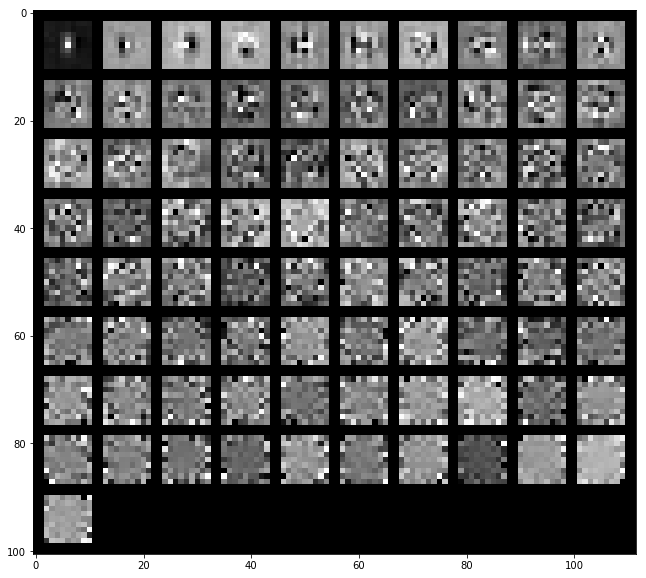

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12917374 0.21878691 0.27581904 0.32651762 0.37049426 0.40954791
 0.44268687 0.47381855 0.5031067  0.52993397 0.55553199 0.57871388
 0.60110518 0.62246633 0.64129137 0.65889153 0.67576609 0.69164733
 0.70717295 0.72158929]


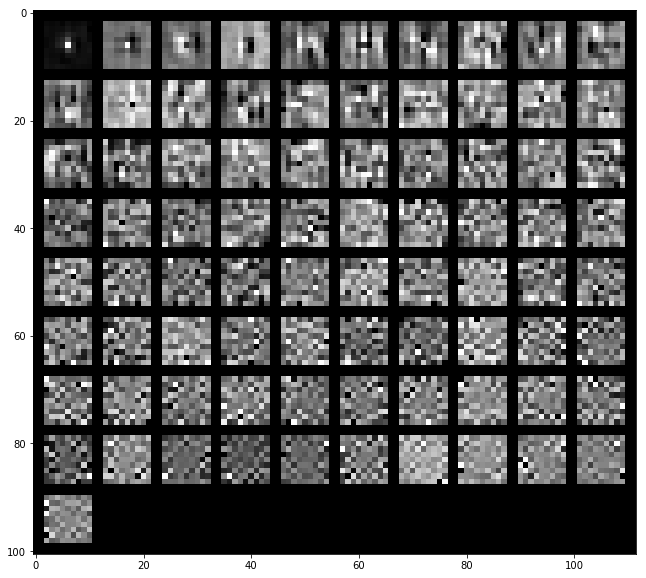

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1283433  0.203322   0.26376638 0.30808644 0.34942263 0.38595118
 0.41865071 0.44914699 0.4755559  0.50024368 0.52429972 0.54744175
 0.56794234 0.58736824 0.60570566 0.62342781 0.64047729 0.6562559
 0.67115825 0.68583723]


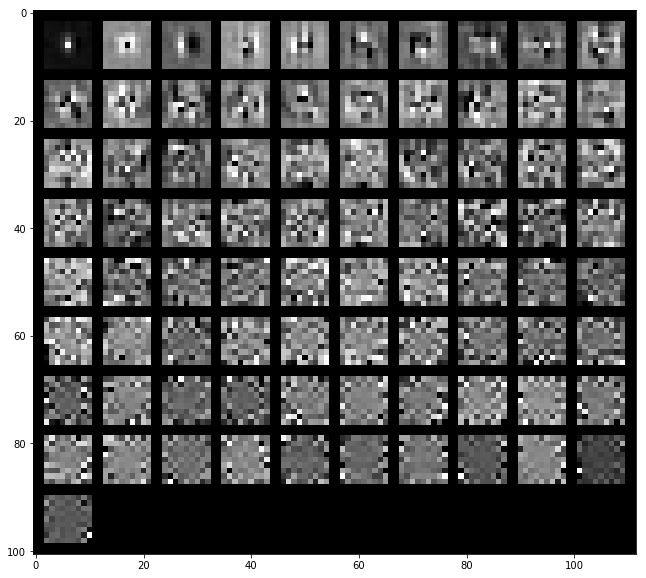

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx646/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19794387 0.28801838 0.36107659 0.42842786 0.47404854 0.51801772
 0.55420336 0.58462797 0.61263461 0.63781144 0.66271376 0.68453181
 0.70491804 0.72187016 0.73834431 0.75437606 0.76864505 0.78242952
 0.79555005 0.80757944]


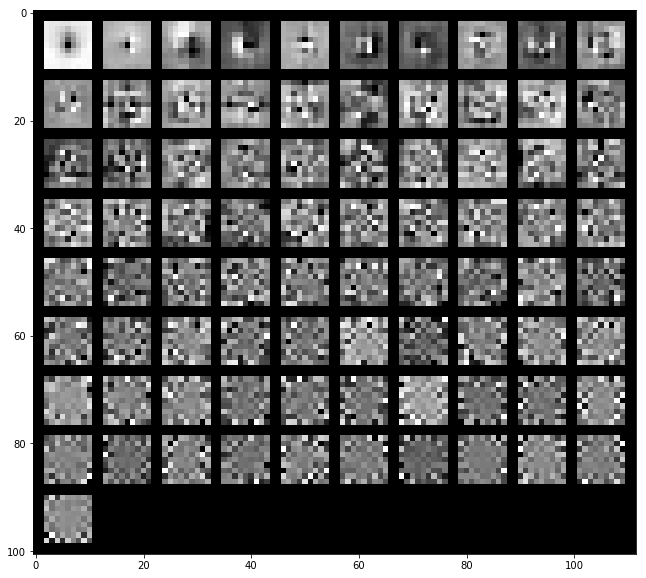

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17225144 0.28880556 0.38256466 0.43752887 0.4864779  0.52486552
 0.56083026 0.59345791 0.61998004 0.64452428 0.66722465 0.68880774
 0.70968955 0.72864053 0.74497908 0.76052547 0.77507491 0.78814298
 0.8000381  0.81090629]


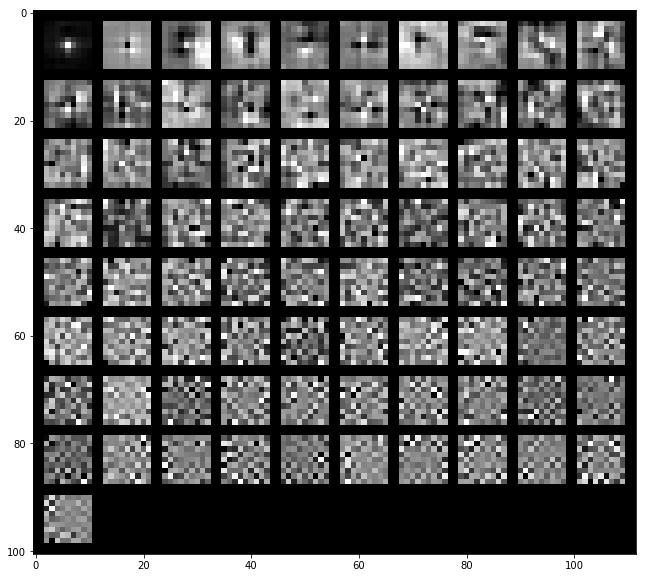

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17735966 0.27751437 0.35216997 0.41056838 0.45517441 0.49471406
 0.53015782 0.56181715 0.5880008  0.61242915 0.63466602 0.65559361
 0.67542832 0.69421008 0.71043394 0.72571318 0.73989728 0.75338511
 0.76601867 0.77808748]


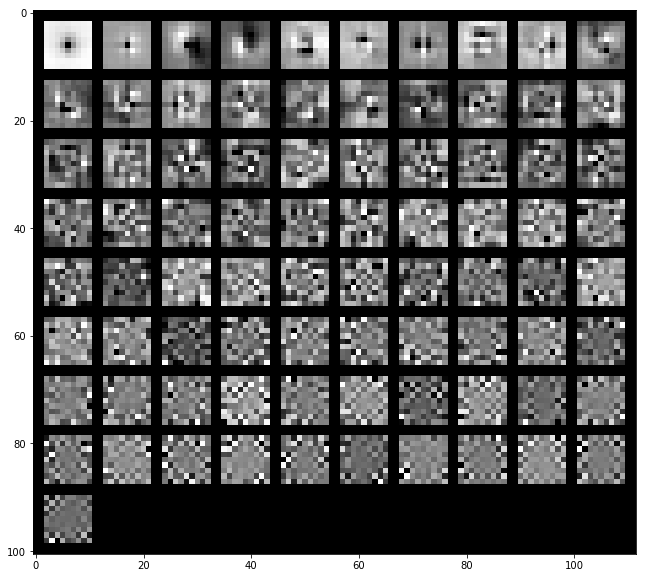

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx658/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16568114 0.24021882 0.30253877 0.3586979  0.40868389 0.45422068
 0.4929306  0.52961883 0.56169888 0.59239827 0.61862483 0.64427849
 0.6666502  0.68751659 0.70710133 0.7243503  0.74037434 0.75551914
 0.76999484 0.78363161]


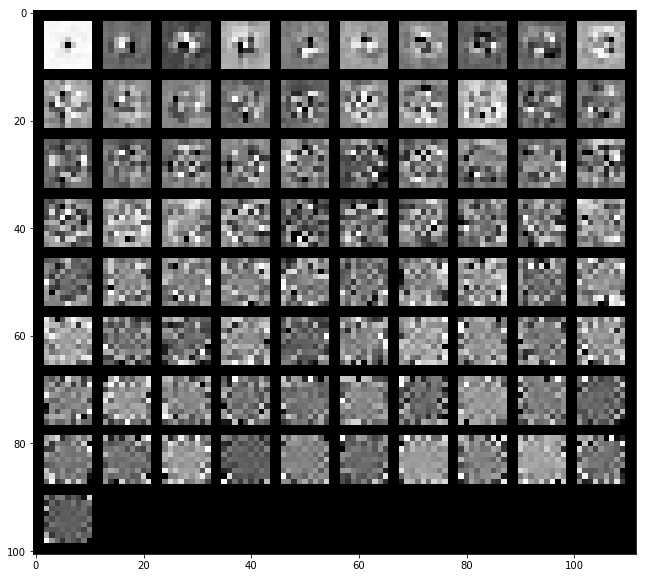

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.27936474 0.36005629 0.40519837 0.44814661 0.48670756 0.51833458
 0.54630688 0.57297325 0.59666385 0.61909297 0.63916463 0.65832796
 0.67475483 0.68991547 0.70434674 0.71790604 0.73117821 0.74382033
 0.75599788 0.76773488]


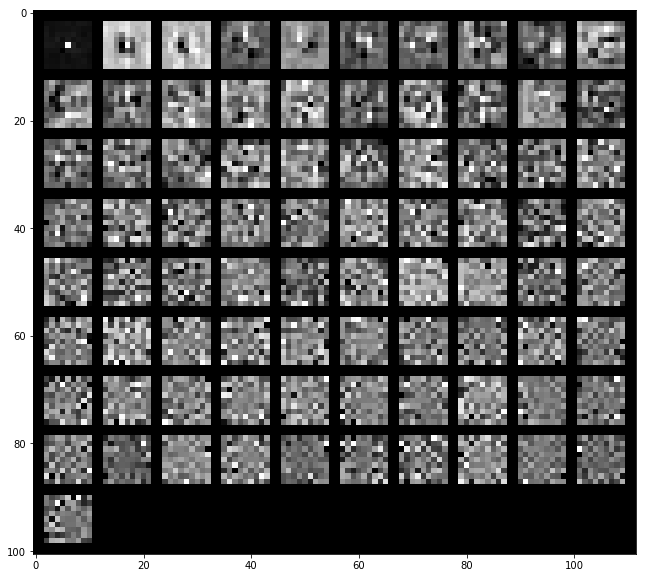

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23924039 0.30717379 0.35816986 0.3991493  0.43486221 0.4669013
 0.49772327 0.52663775 0.55343731 0.57689823 0.59968658 0.62107387
 0.6410065  0.66088744 0.67813476 0.69312025 0.7073761  0.72044459
 0.7331192  0.74507249]


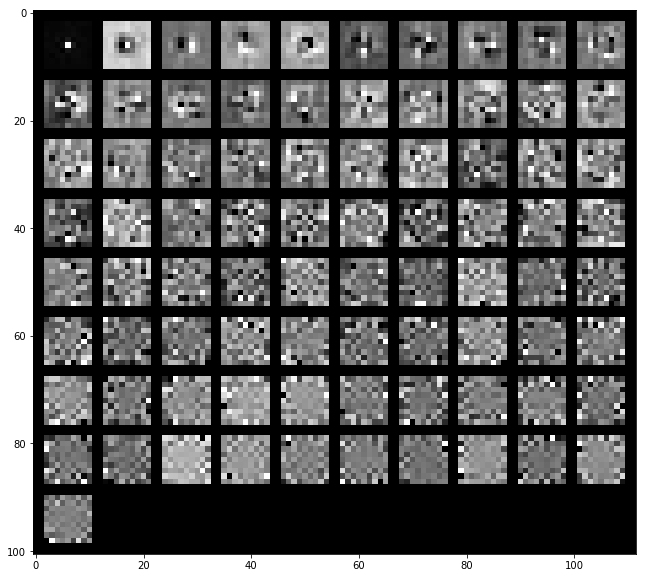

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx659/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.10089233 0.16961636 0.23701657 0.30041783 0.35521599 0.40127124
 0.44170464 0.4761562  0.50973168 0.53904511 0.56783905 0.59403372
 0.61925894 0.64271715 0.66437848 0.6858005  0.70445626 0.72240199
 0.73829463 0.75372109]


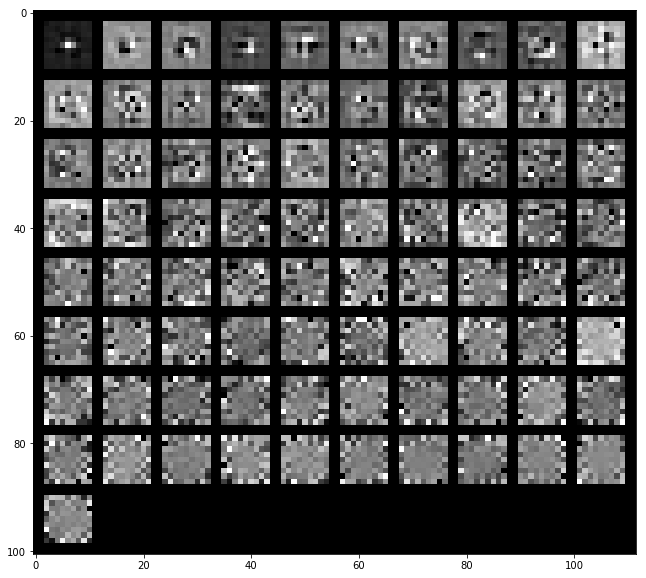

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1291236  0.20463145 0.27495138 0.33192826 0.38855256 0.43266442
 0.4690013  0.5033478  0.53364931 0.56065081 0.58611701 0.61045479
 0.63272644 0.65180452 0.66994351 0.68674739 0.70320658 0.71876347
 0.7336033  0.74761833]


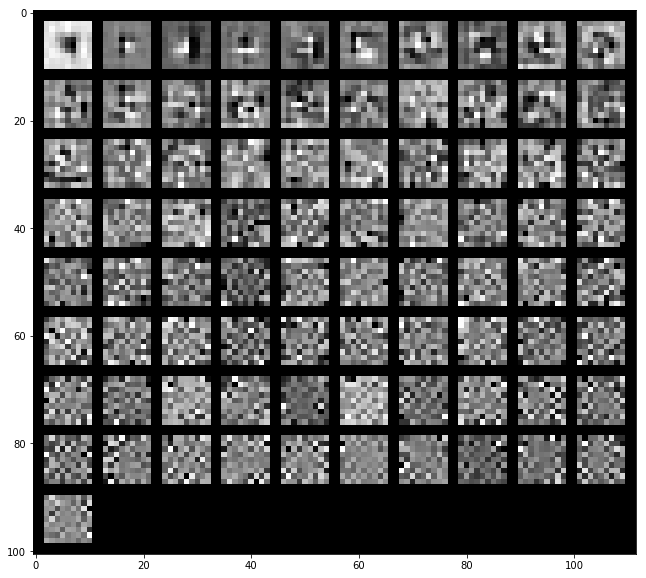

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.10134881 0.17222093 0.23589733 0.29320708 0.33931208 0.38020567
 0.42040647 0.45369258 0.48380905 0.51326587 0.53890394 0.56352448
 0.58678945 0.60837936 0.62811977 0.64570946 0.66206968 0.67765315
 0.69258204 0.70681922]


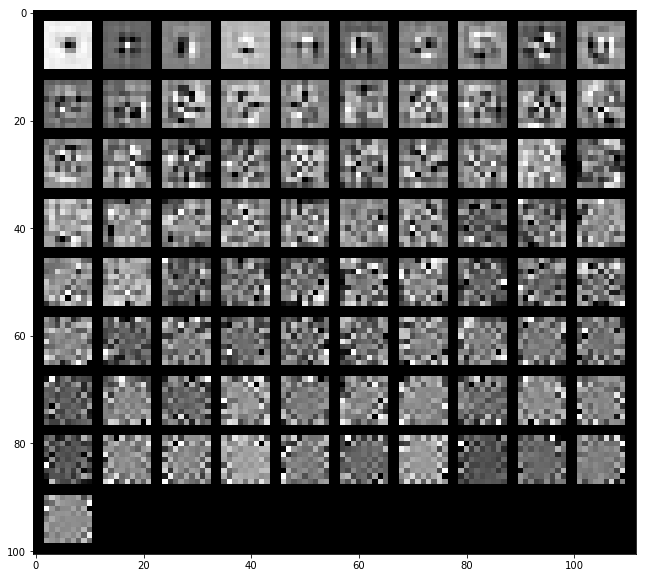

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx670/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1300011  0.20888938 0.27392505 0.32431556 0.36979564 0.41242384
 0.45197786 0.48493236 0.51634685 0.54482885 0.57287036 0.59893448
 0.62217992 0.64443865 0.66566038 0.68518899 0.70413425 0.72215897
 0.73913729 0.75412481]


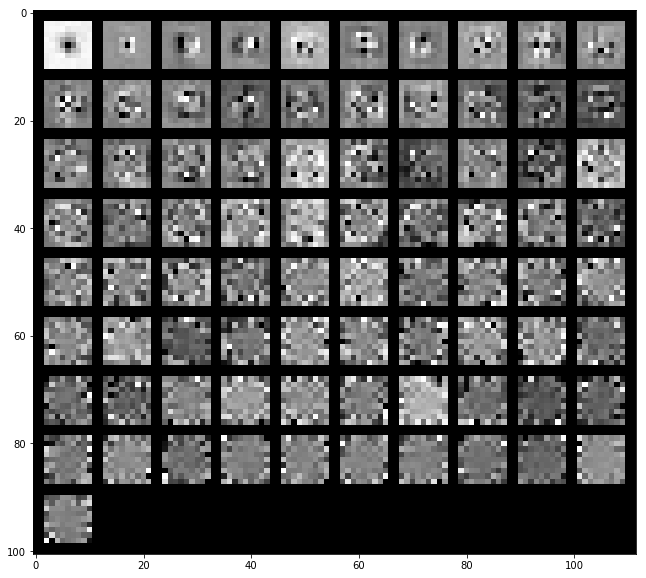

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1697801  0.27803095 0.32953382 0.3746334  0.41499251 0.44858974
 0.48029042 0.51095423 0.53733414 0.56129469 0.5842244  0.60535117
 0.62448156 0.64293776 0.65996369 0.6759841  0.69185974 0.70632516
 0.7201782  0.73321355]


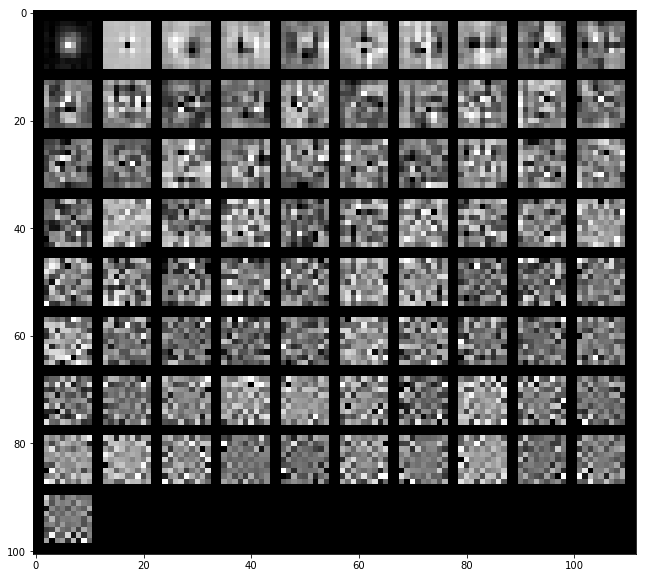

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14953895 0.2420635  0.29614865 0.3410897  0.37825895 0.41185518
 0.44296568 0.47124827 0.49711915 0.52071321 0.54365459 0.56556458
 0.58696381 0.60613188 0.62471699 0.64299857 0.65973718 0.67620755
 0.69106599 0.70546713]


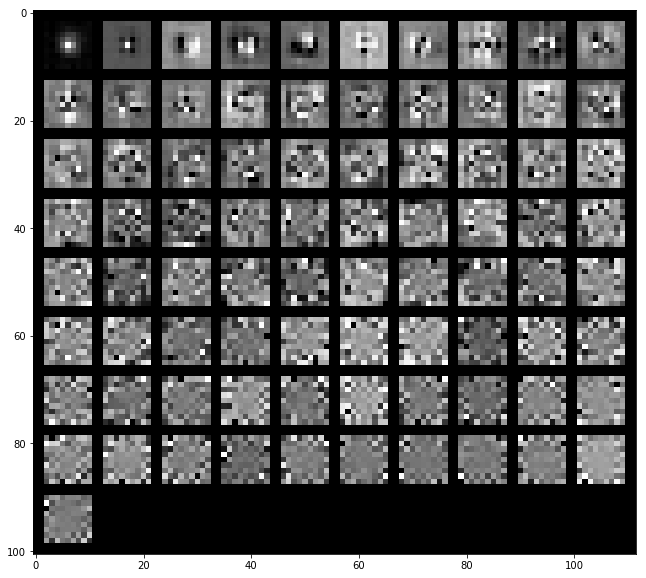

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx671/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14646248 0.22426374 0.2875812  0.33855049 0.38677196 0.42655219
 0.46131747 0.49463934 0.52522491 0.55359651 0.57853788 0.60310124
 0.62560518 0.64620299 0.66599553 0.68463895 0.70208832 0.71837487
 0.73315316 0.74757728]


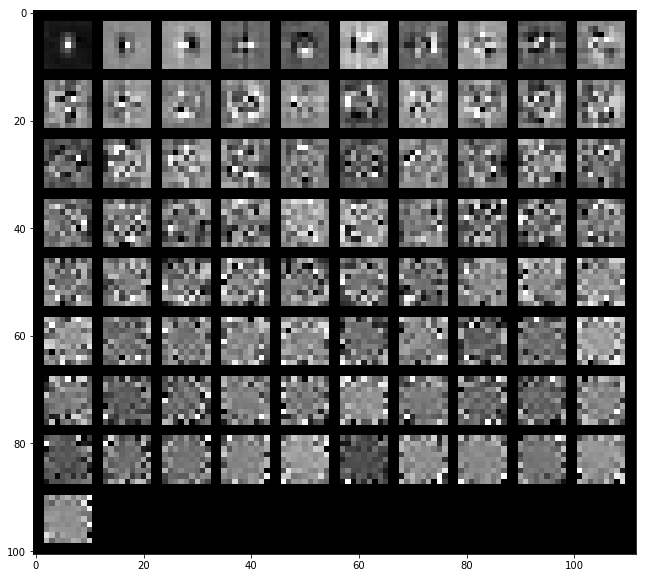

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14057869 0.23251879 0.29070798 0.34816716 0.39512692 0.43456871
 0.46999792 0.50140667 0.53126532 0.55657543 0.57924569 0.60106596
 0.62127207 0.64105686 0.6591792  0.67560413 0.69151288 0.70733604
 0.72238194 0.73660461]


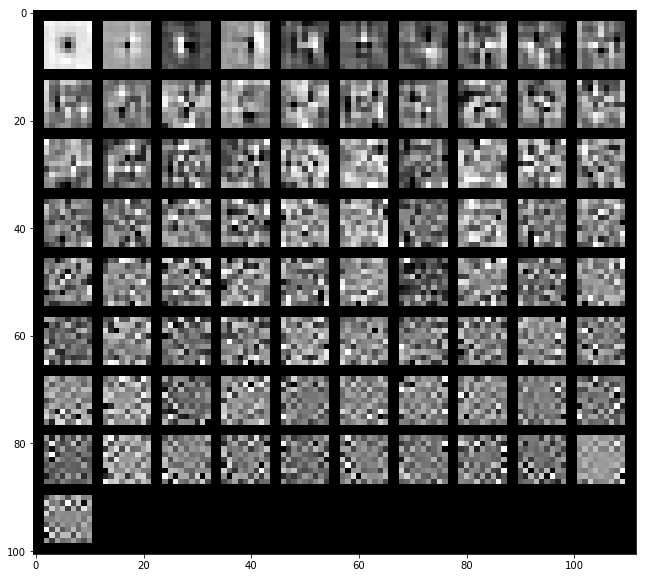

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13835136 0.21807906 0.27842922 0.32369671 0.36646407 0.40488792
 0.43725056 0.46948046 0.49939636 0.52449893 0.54735357 0.56927215
 0.58958436 0.60827776 0.62657776 0.64390218 0.66029833 0.67585791
 0.69070921 0.70503868]


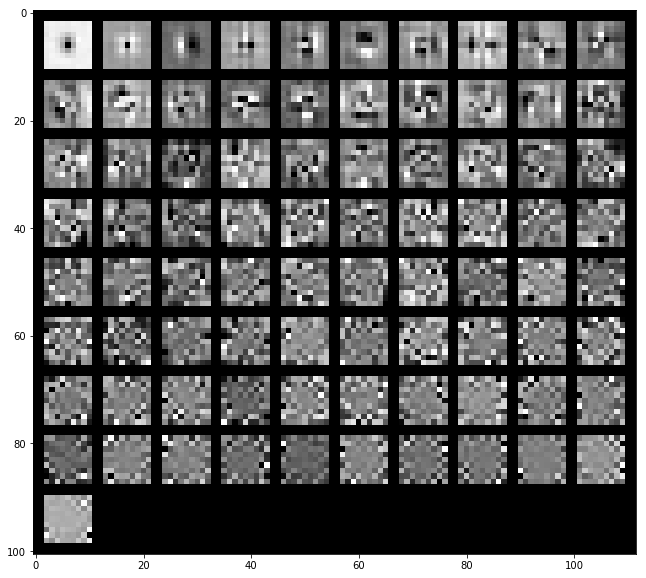

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx779/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16689401 0.25150776 0.32685522 0.3867298  0.44212484 0.48619169
 0.52381886 0.5591285  0.58947544 0.61703883 0.64294711 0.66692416
 0.68839836 0.70892041 0.72696389 0.74342972 0.75917702 0.77291557
 0.78495903 0.79679769]


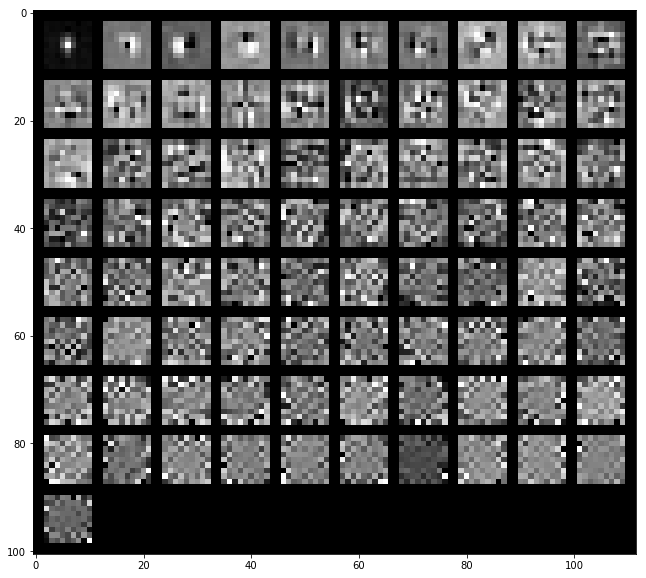

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.192641   0.29808227 0.38532839 0.45201526 0.50229033 0.54637653
 0.58872599 0.62116473 0.64884985 0.67140902 0.69347967 0.71282655
 0.73088873 0.7476255  0.76342147 0.77678484 0.7890686  0.80117008
 0.81248806 0.82293245]


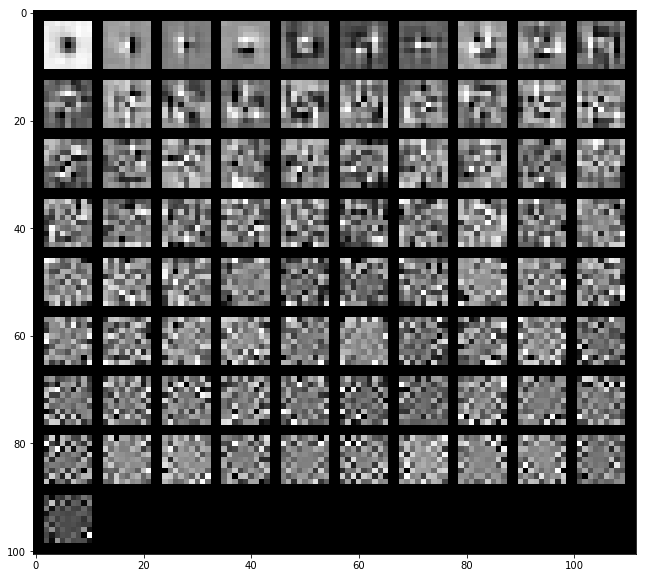

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17166732 0.26613661 0.34511724 0.403427   0.4503291  0.49429058
 0.53477755 0.56815809 0.59453238 0.62003098 0.6445041  0.66597289
 0.68625795 0.70519108 0.72114426 0.73653523 0.75024845 0.76279991
 0.77508776 0.78612874]


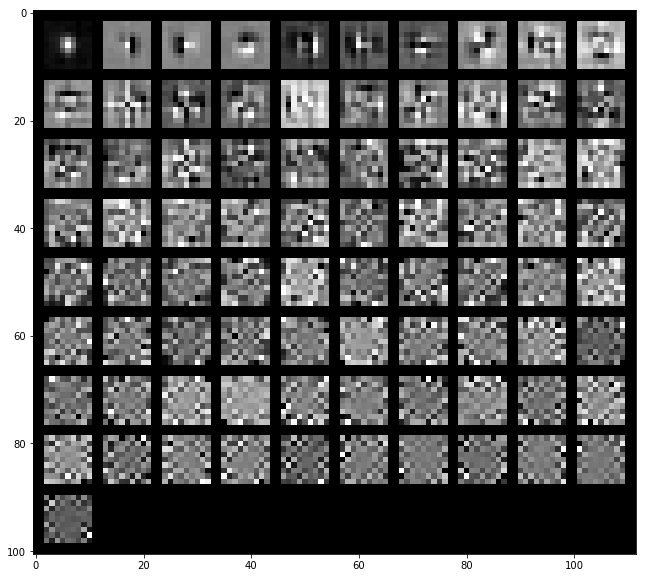

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx790/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13933602 0.23737117 0.30924673 0.37565191 0.43275894 0.47934782
 0.52471089 0.56503605 0.60067328 0.6347832  0.66108834 0.68487776
 0.70617742 0.72615377 0.74335587 0.7586419  0.77305559 0.78673449
 0.79935214 0.81157338]


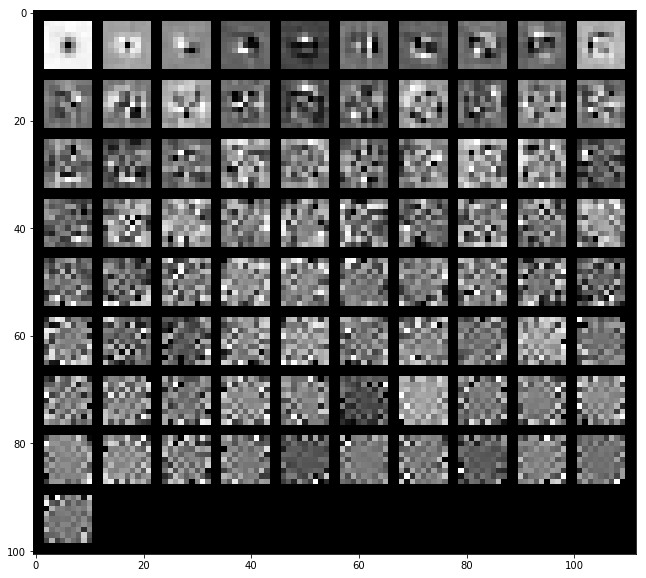

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22722737 0.35230232 0.43996354 0.51645384 0.56118023 0.59565447
 0.62909938 0.65637302 0.67846468 0.69972317 0.71708611 0.73305506
 0.74859711 0.76288934 0.77616616 0.78892128 0.8006724  0.81187653
 0.8220771  0.83141161]


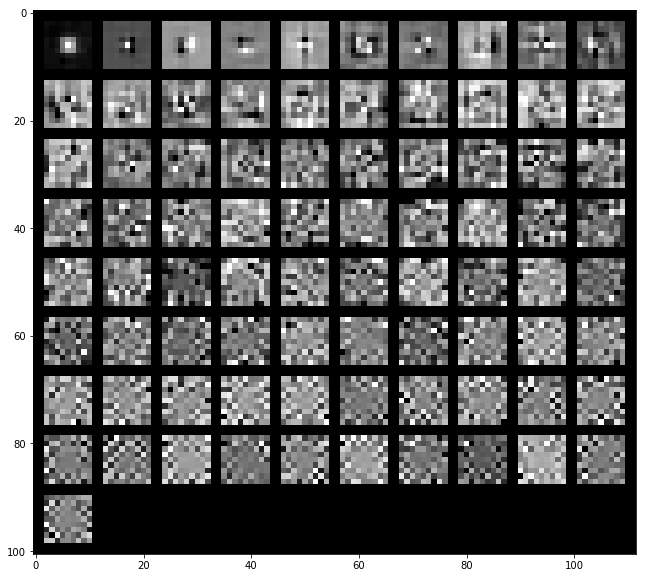

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18172521 0.29307596 0.36906172 0.43818017 0.48553449 0.52782309
 0.56402033 0.59566441 0.62313667 0.64735869 0.66789402 0.68718128
 0.70629485 0.7224952  0.73728015 0.75137594 0.76509891 0.77749746
 0.78885532 0.79957978]


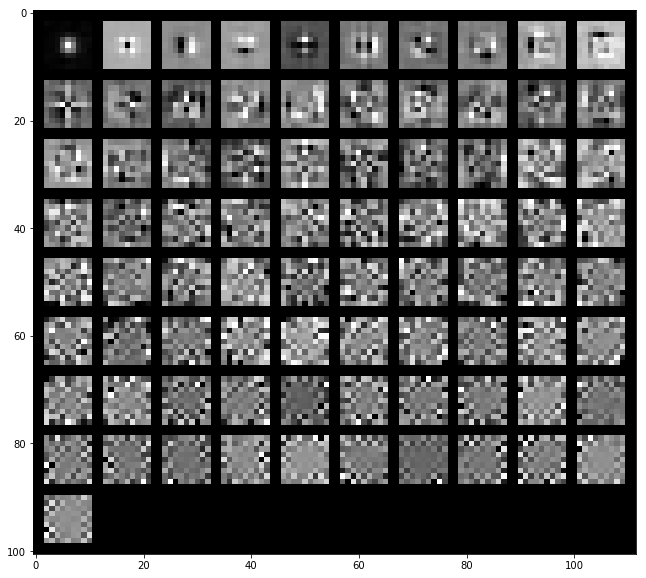

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx791/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18501988 0.28356313 0.3608876  0.42204135 0.47113843 0.51302883
 0.55124405 0.58424319 0.61358293 0.64083642 0.66427792 0.68647165
 0.70729907 0.72505934 0.74180945 0.75695515 0.77156903 0.78561126
 0.79770543 0.80939276]


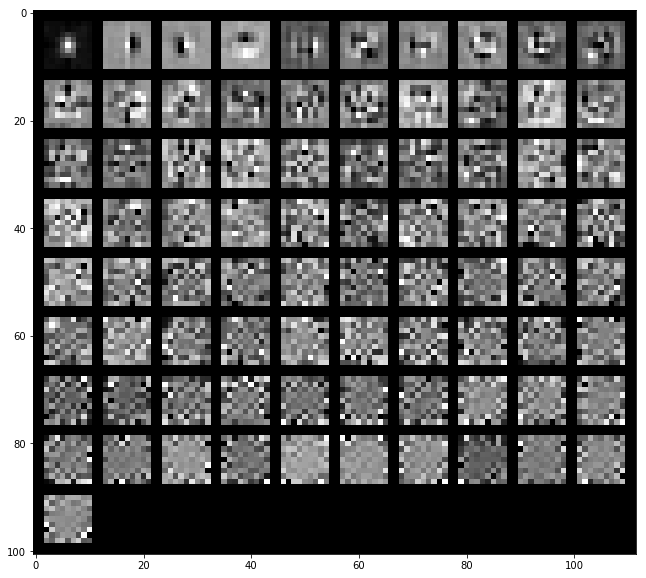

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19273793 0.3059096  0.39294268 0.46912036 0.51718966 0.55942742
 0.5941955  0.6242951  0.65344339 0.68103995 0.70296688 0.72193571
 0.73950171 0.75618823 0.77122434 0.7849282  0.79705672 0.80828803
 0.81884839 0.82928185]


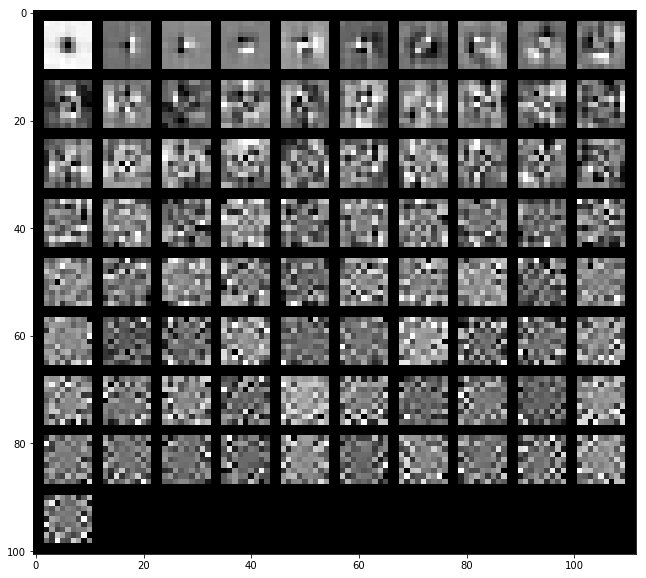

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18478121 0.28664356 0.36633528 0.43011518 0.47588125 0.51528889
 0.55049153 0.58135031 0.61003055 0.63532366 0.65905012 0.67941806
 0.69851137 0.71595984 0.73161788 0.74610963 0.75966438 0.7721948
 0.78388905 0.79473694]


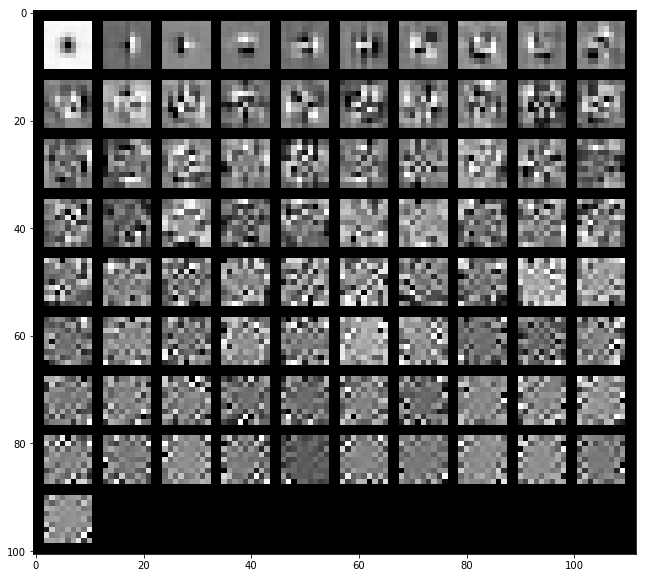

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx802/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19835565 0.28405565 0.35059608 0.40282234 0.45365579 0.49929368
 0.53694712 0.57248779 0.60318365 0.63136611 0.65638813 0.67913243
 0.6995863  0.71836055 0.73576341 0.75258117 0.76855497 0.7830822
 0.79709291 0.80914723]


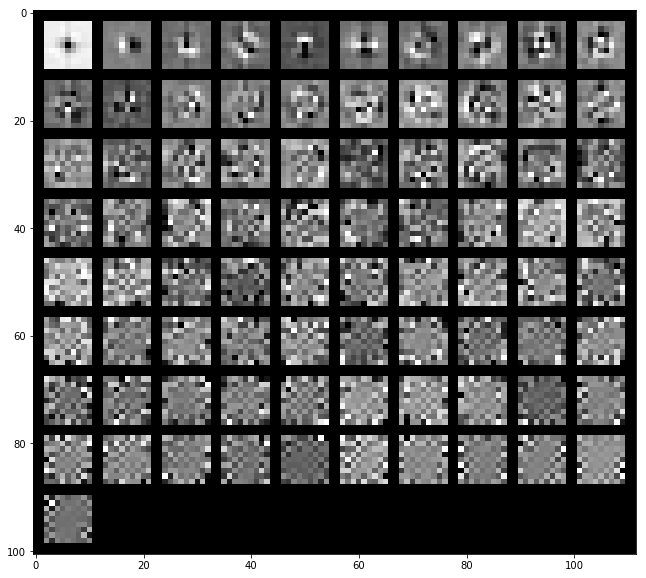

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19561557 0.30180877 0.39188088 0.45310348 0.50452441 0.5463327
 0.57789916 0.60765937 0.6350866  0.65920681 0.68055279 0.69826895
 0.71557787 0.73221528 0.74684077 0.76032134 0.77219649 0.78371882
 0.79488225 0.80540942]


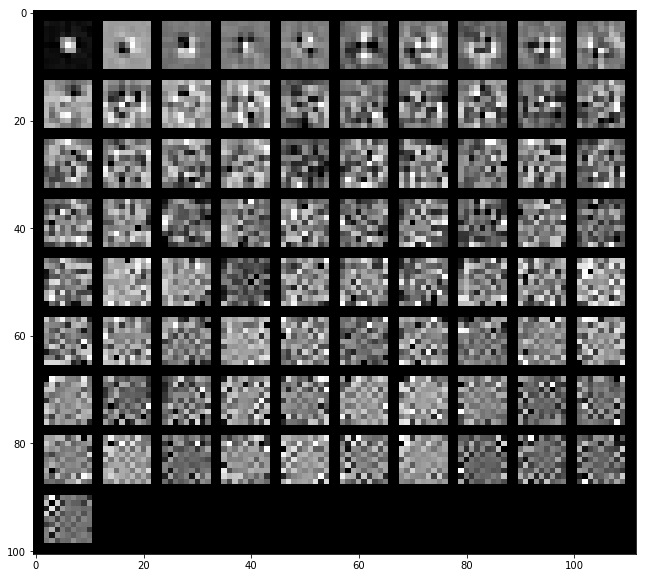

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19327489 0.28347427 0.36089919 0.42136211 0.47153318 0.51268785
 0.54782252 0.57809555 0.60540889 0.63053343 0.65230467 0.67269724
 0.68984597 0.70603913 0.7214201  0.73563187 0.7492111  0.76219282
 0.77320382 0.78414186]


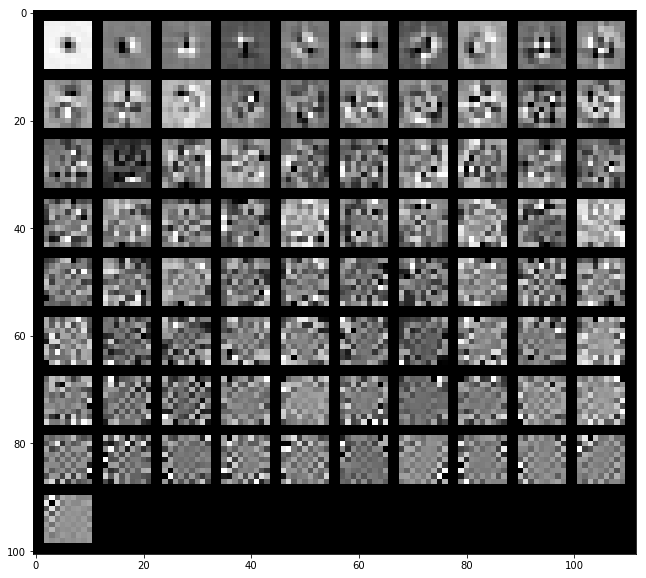

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx814/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15449331 0.25653447 0.33350404 0.39066194 0.44362684 0.48976343
 0.52711067 0.56158548 0.59418159 0.62271427 0.6496128  0.67538055
 0.69656384 0.7162481  0.73439738 0.75037472 0.76479235 0.77825701
 0.79089548 0.80287973]


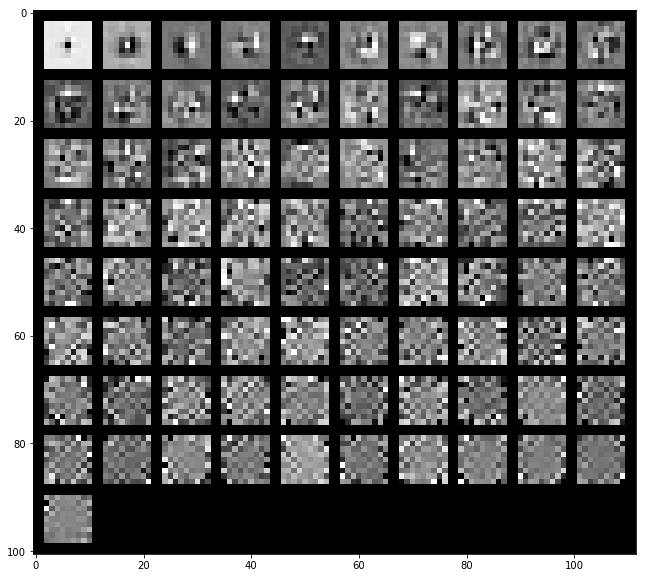

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23368186 0.32807369 0.41721212 0.48401208 0.52881579 0.56674982
 0.60230758 0.62894    0.65279639 0.67524071 0.69601228 0.71302046
 0.72957211 0.74546163 0.76078596 0.77496012 0.78805737 0.80018633
 0.8117358  0.82280449]


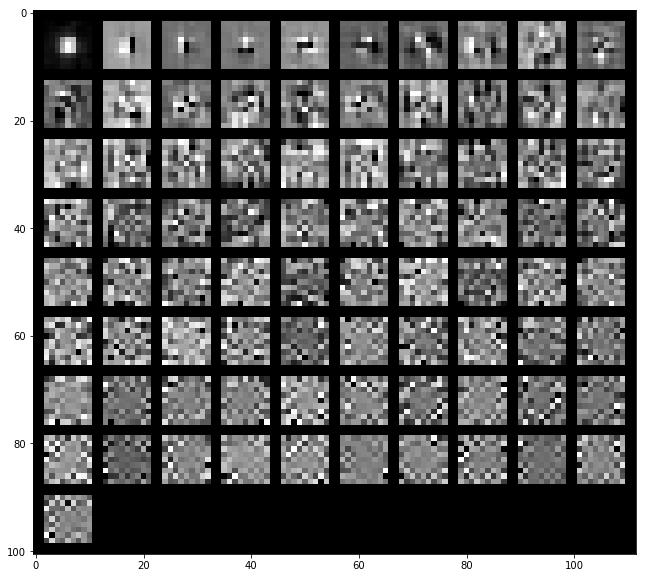

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17668606 0.27835686 0.3594306  0.41566204 0.46472437 0.50560827
 0.5420674  0.57253315 0.59829371 0.62179931 0.6450252  0.66637435
 0.68475055 0.70172745 0.71788669 0.7328313  0.74716551 0.76075242
 0.77409883 0.78599911]


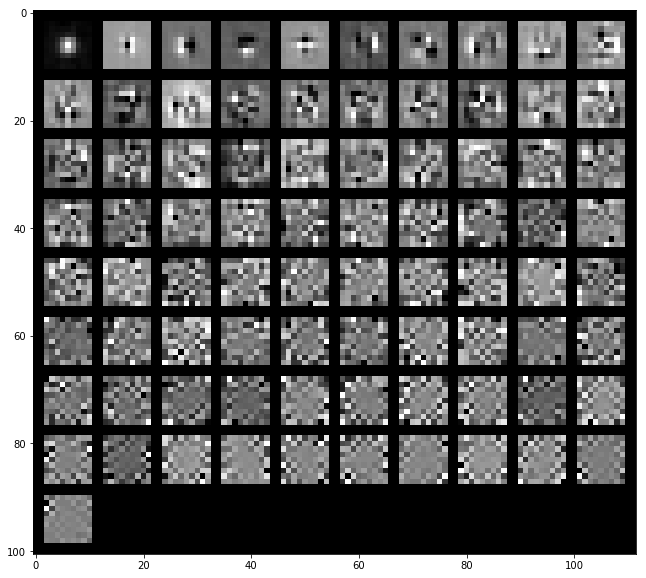

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx815/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15026113 0.24378611 0.31862411 0.37591929 0.4249029  0.46988064
 0.50855767 0.54153981 0.57333701 0.59975304 0.62563418 0.64893161
 0.67072802 0.68986776 0.70686842 0.72333641 0.73741118 0.75106686
 0.76402171 0.77640481]


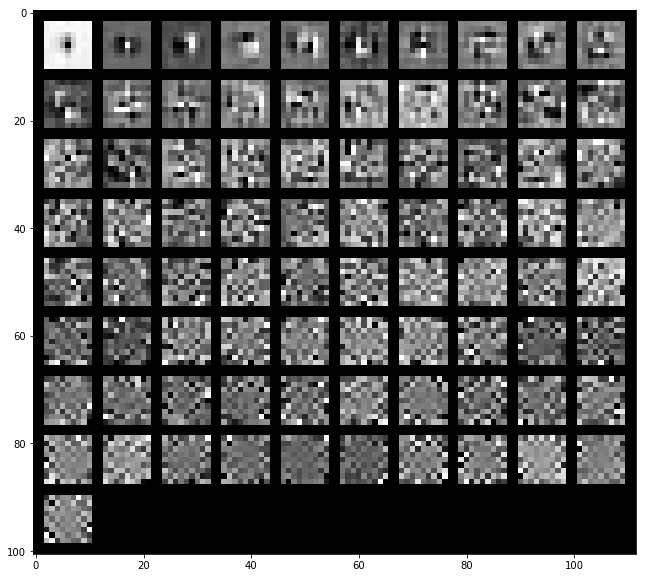

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20818049 0.31012963 0.39690386 0.45749055 0.51419274 0.55314712
 0.58704405 0.61403983 0.63984985 0.66301349 0.682192   0.69985978
 0.71627363 0.73138522 0.74440527 0.75716875 0.76940009 0.78098877
 0.79189102 0.80184343]


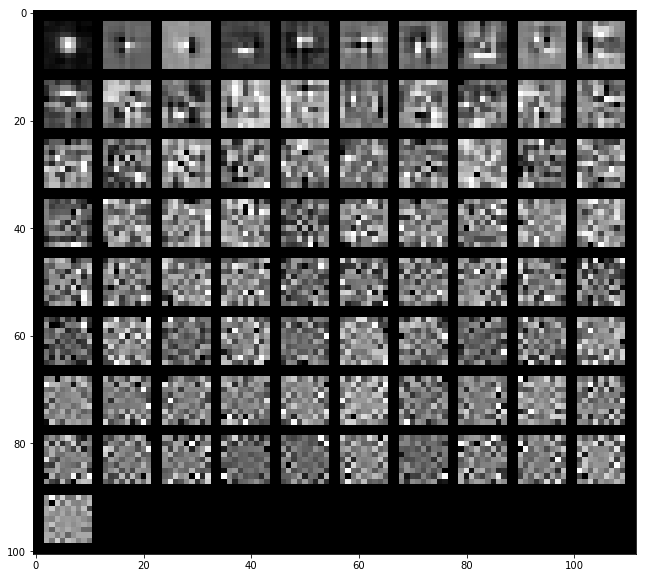

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17375138 0.27038464 0.34938728 0.40125919 0.45155104 0.49306175
 0.53019666 0.55860672 0.58559659 0.61133939 0.63326788 0.65337751
 0.67276263 0.6888929  0.70418599 0.71910749 0.73267803 0.7451491
 0.75673326 0.76780204]


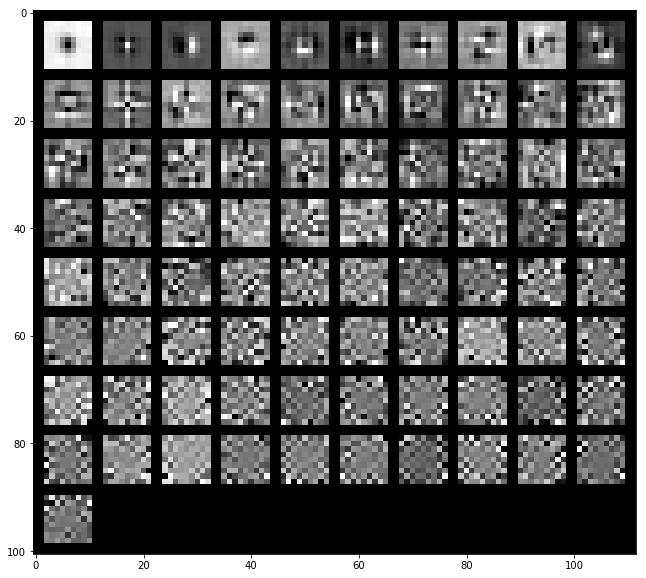

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx826/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14654483 0.24285665 0.31307114 0.37726021 0.43268629 0.47516396
 0.51356497 0.54921181 0.58337325 0.61167644 0.63758989 0.6618122
 0.68100525 0.6988038  0.71565437 0.7323385  0.74715243 0.76179244
 0.7743046  0.78653378]


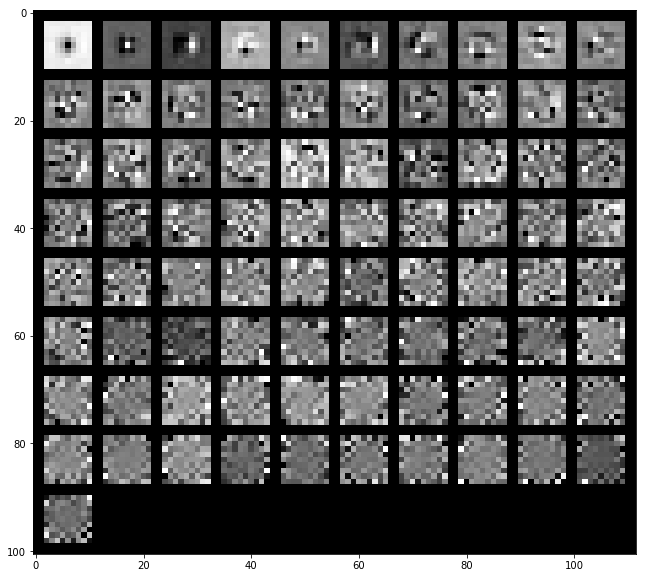

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20189827 0.29195101 0.36891041 0.4233211  0.46806618 0.50891135
 0.54281211 0.57063765 0.59640727 0.61935728 0.64071485 0.66128916
 0.68144283 0.69984802 0.71756904 0.7336357  0.74870842 0.76293004
 0.77622029 0.78851303]


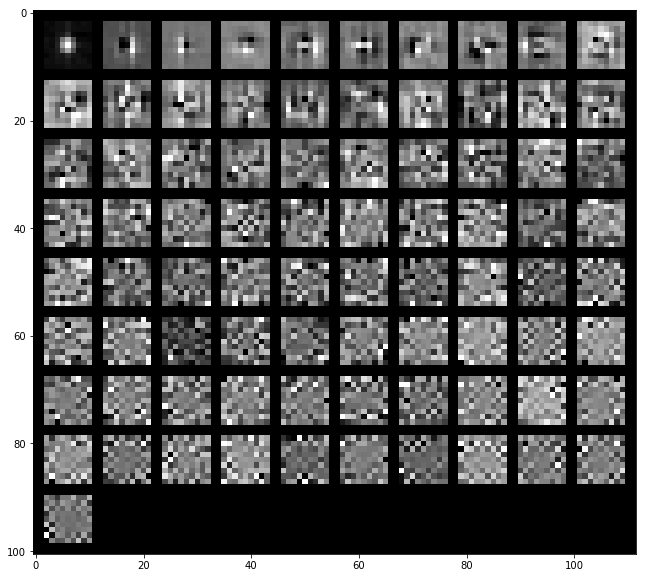

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17127047 0.25757404 0.33106815 0.38539468 0.43438413 0.47469533
 0.51288904 0.54040438 0.56757049 0.59296495 0.61573434 0.63592792
 0.65471837 0.67305518 0.68961504 0.70528274 0.72042907 0.73423359
 0.74750955 0.76020774]


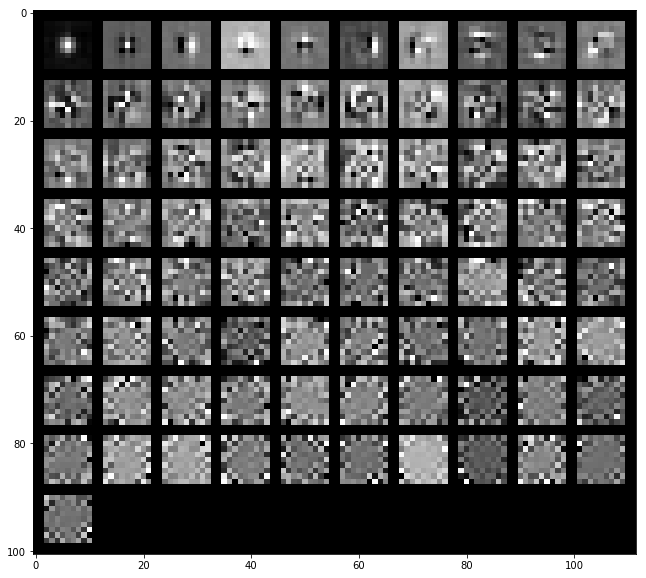

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx827/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14661241 0.23826279 0.32047654 0.38712526 0.43819719 0.48255061
 0.52182016 0.55423652 0.58411459 0.61232013 0.63715275 0.65996167
 0.68174347 0.70075774 0.71822808 0.73487666 0.75005755 0.7642589
 0.77783038 0.7908027 ]


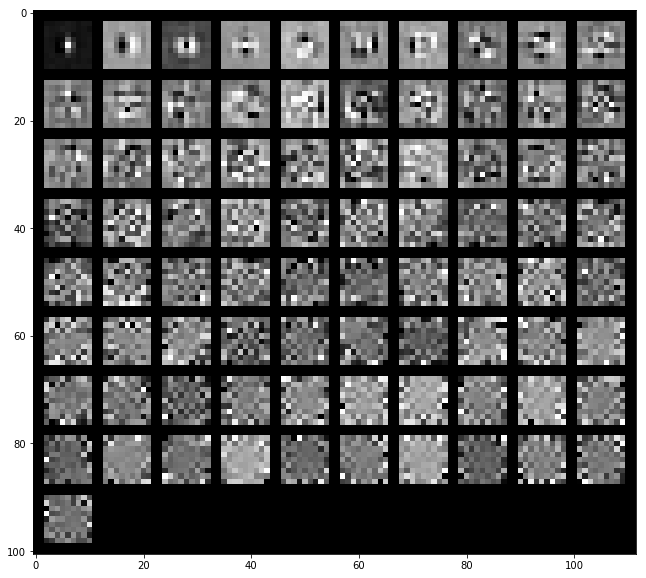

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21702111 0.32272908 0.40473677 0.46379904 0.51691357 0.55597981
 0.58894436 0.61633576 0.63979957 0.66190782 0.68127982 0.70058727
 0.71595476 0.73098153 0.74547805 0.75834156 0.77095619 0.78308432
 0.7943908  0.80544602]


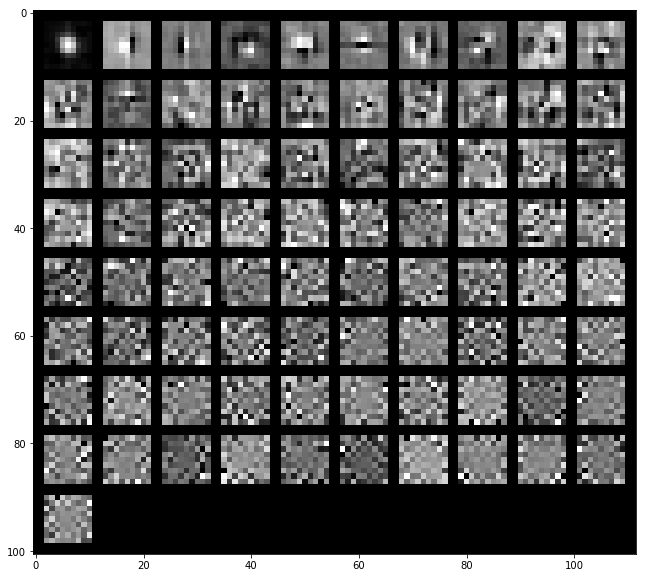

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16516981 0.25963883 0.35098457 0.40441606 0.45408917 0.4977208
 0.5319128  0.56027129 0.58638225 0.61092646 0.63225556 0.65291296
 0.67262774 0.68977077 0.70644816 0.72095037 0.7340437  0.74643625
 0.75877847 0.77023081]


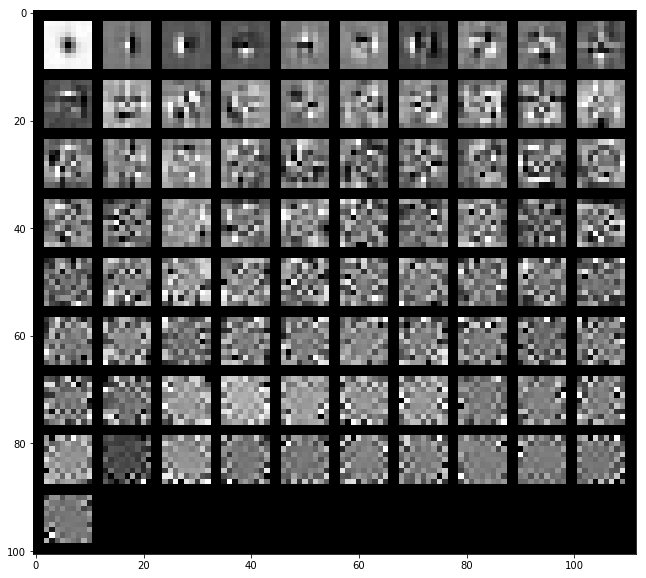

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx839/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16633088 0.25856598 0.32824731 0.39047802 0.43925205 0.48656927
 0.52749021 0.56400153 0.59507295 0.6214565  0.6464669  0.66803792
 0.68832895 0.70683158 0.72420984 0.74087324 0.75563867 0.77004996
 0.78373025 0.79664038]


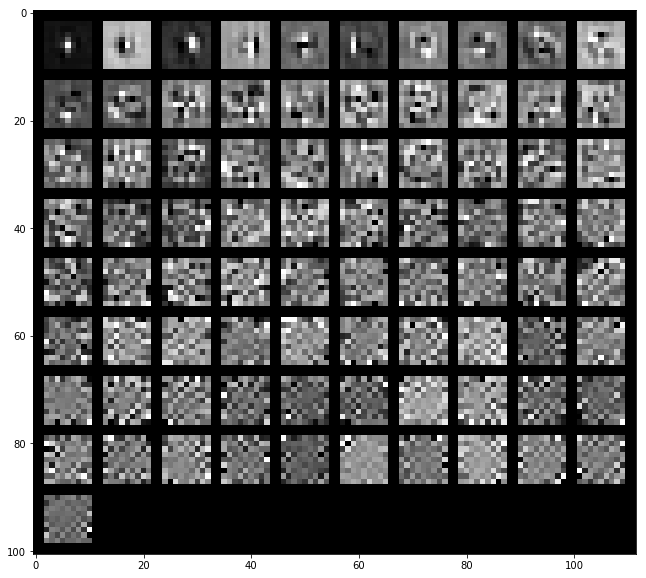

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20212405 0.29721615 0.38308198 0.44507663 0.49371724 0.53434541
 0.57071061 0.60124879 0.6267141  0.65002516 0.6715118  0.69111467
 0.70906955 0.72549203 0.74062652 0.75543221 0.76867999 0.78136779
 0.79276347 0.80363531]


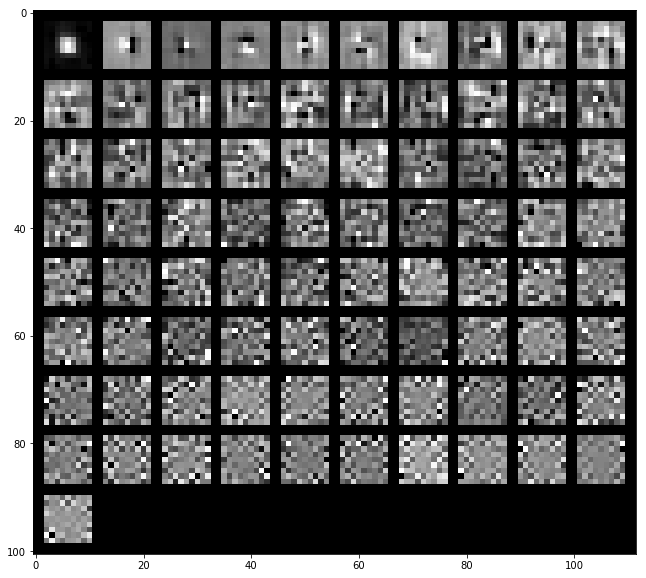

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16745616 0.26908946 0.34938329 0.40134522 0.44826767 0.48825791
 0.52438513 0.55874694 0.58639266 0.61123888 0.6337225  0.65458041
 0.67404386 0.69275339 0.70882182 0.72399445 0.73828943 0.75098387
 0.76334649 0.77495999]


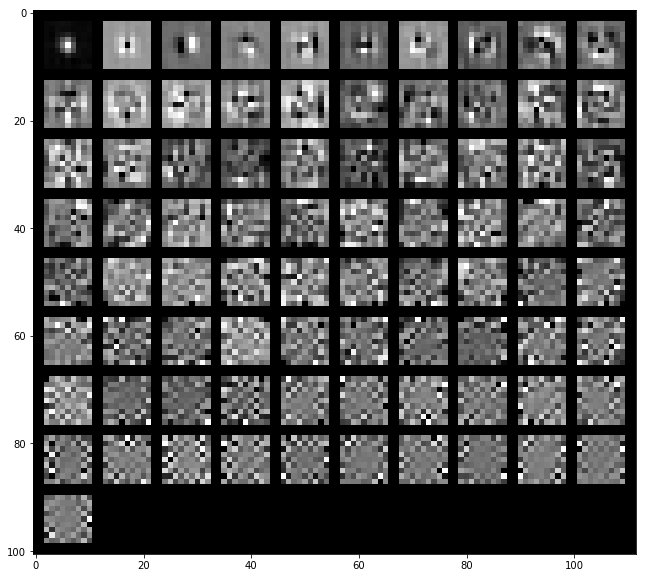

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx850/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.2380144  0.35277287 0.42762429 0.49104451 0.54122219 0.58627201
 0.62246674 0.65269793 0.67817887 0.7016745  0.71961404 0.73717551
 0.75383118 0.76951357 0.78402738 0.79769008 0.81067768 0.82300787
 0.83428372 0.84378178]


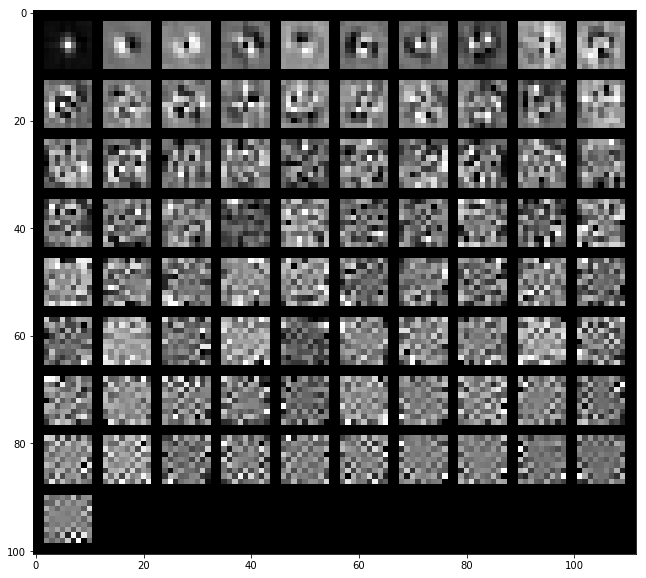

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23047187 0.35344813 0.46630271 0.52633609 0.56985337 0.60640424
 0.63397912 0.65524711 0.67547939 0.69377453 0.71150912 0.72808405
 0.74399616 0.75795569 0.77122447 0.78286995 0.79393104 0.80392437
 0.81388025 0.82333161]


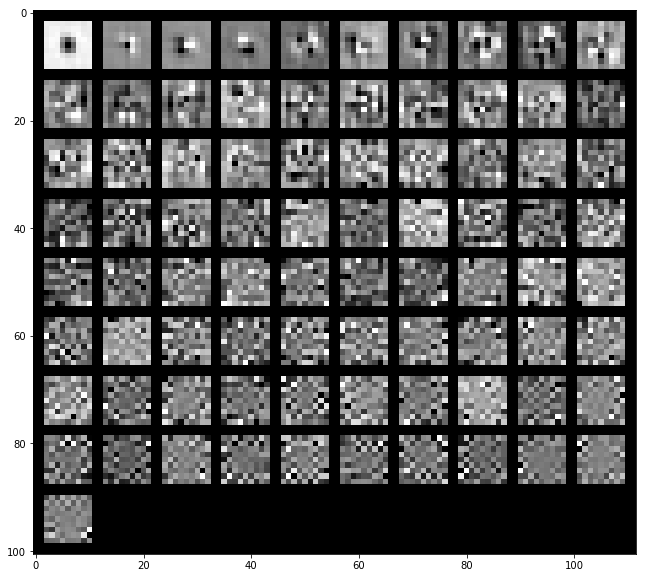

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22901121 0.34047179 0.43648362 0.49040039 0.54263607 0.58210071
 0.61321161 0.63843438 0.66041395 0.68051238 0.69692436 0.71279569
 0.72821529 0.74302518 0.75650488 0.76964804 0.78198363 0.79361592
 0.80466439 0.81455412]


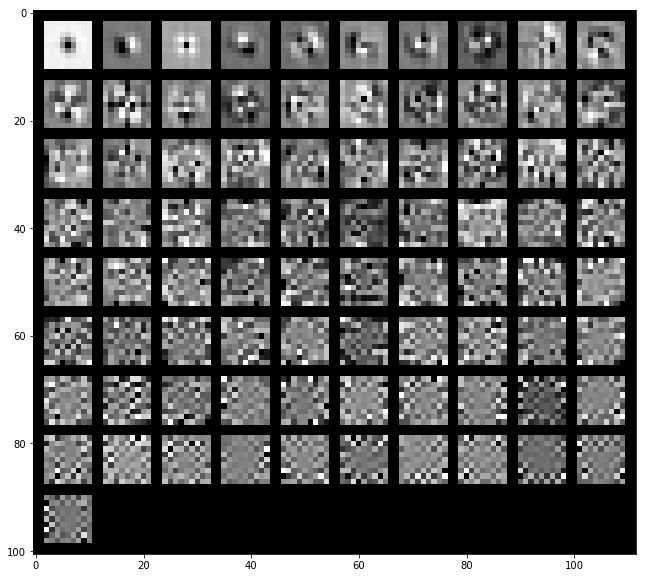

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx851/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23121218 0.32363768 0.39312796 0.45621375 0.50627006 0.54466812
 0.58218822 0.61525152 0.64470963 0.67048294 0.69500943 0.71752054
 0.73666515 0.75543521 0.77105298 0.78620814 0.8002198  0.81293078
 0.82421388 0.83501819]


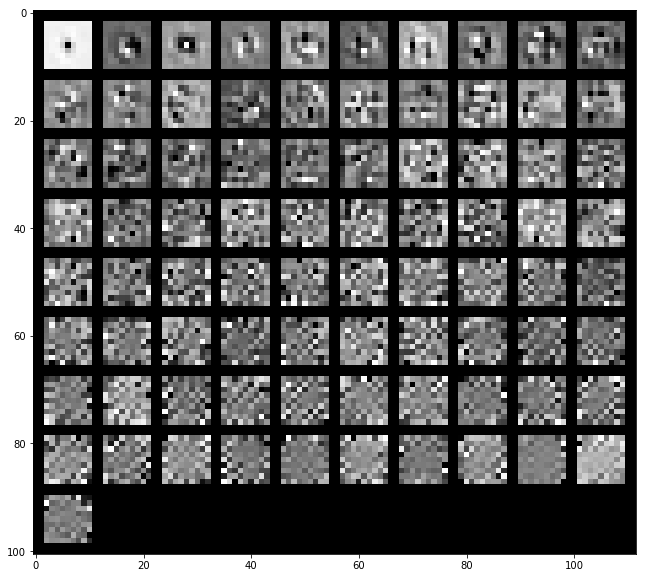

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14787937 0.23812645 0.31253904 0.38168946 0.43478447 0.48555429
 0.52743198 0.56533451 0.59793884 0.62661779 0.65212008 0.67416842
 0.69388486 0.71176763 0.72941    0.74520184 0.7604602  0.77452035
 0.78788575 0.80013208]


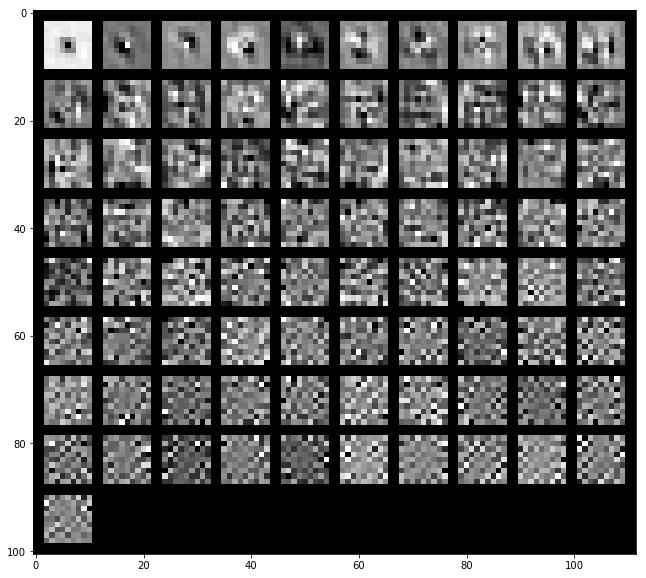

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18100342 0.26616103 0.34218394 0.40030851 0.44800661 0.49045052
 0.52528227 0.55709464 0.58796953 0.61646621 0.64093897 0.66340881
 0.68376047 0.70230807 0.7178139  0.73283104 0.74691379 0.76007308
 0.77264164 0.784433  ]


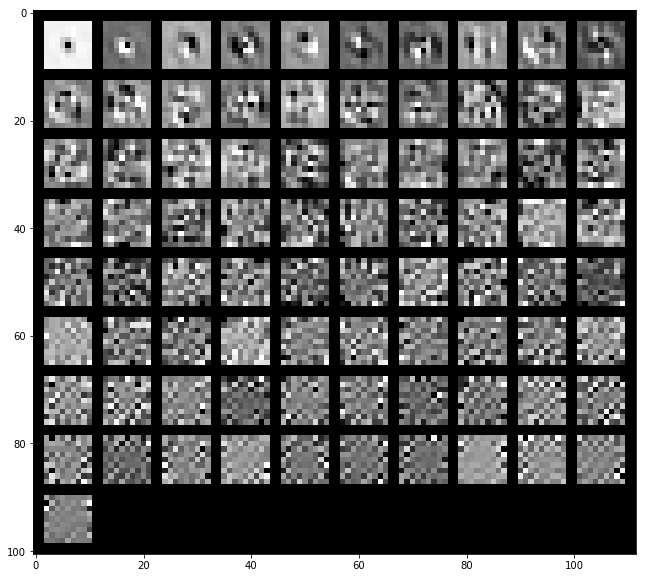

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx862/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14135597 0.23084511 0.30611683 0.36136474 0.40830494 0.45100508
 0.49142547 0.52478708 0.55445595 0.58140373 0.60775156 0.63140487
 0.6540257  0.67448006 0.69361073 0.71048294 0.72672301 0.74194288
 0.7565117  0.77041052]


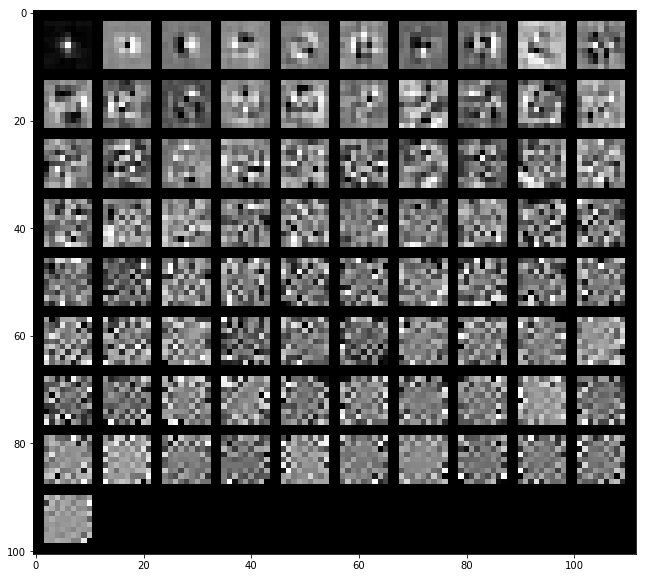

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23593216 0.36756105 0.46400738 0.52091757 0.57244664 0.60725988
 0.63680948 0.66130715 0.68550496 0.70672264 0.72639445 0.74195164
 0.75650755 0.77079972 0.78366549 0.79576298 0.80737038 0.81788907
 0.82805929 0.83718075]


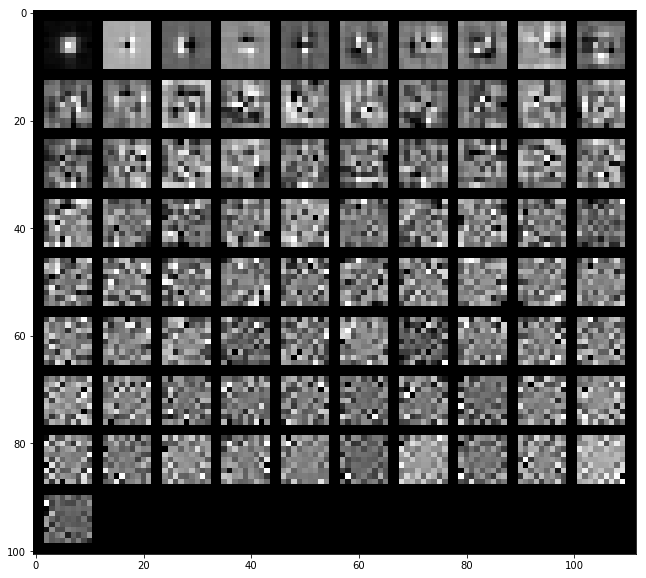

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18041136 0.29303446 0.3771322  0.42831972 0.47293105 0.51079833
 0.54203461 0.5721854  0.59645284 0.62062377 0.64309655 0.6626942
 0.68131041 0.69927109 0.71551352 0.73042721 0.7433221  0.75571083
 0.767704   0.77933695]


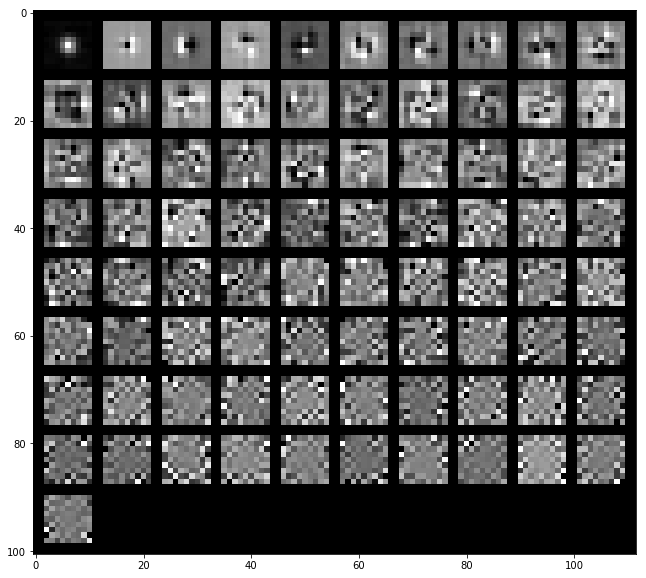

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx970/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15016567 0.23879294 0.3153471  0.37290612 0.42774083 0.46990994
 0.50907654 0.54045579 0.5712959  0.59879317 0.6241839  0.64922406
 0.6725947  0.69285192 0.7111011  0.72847714 0.74481291 0.75987467
 0.77358095 0.7865128 ]


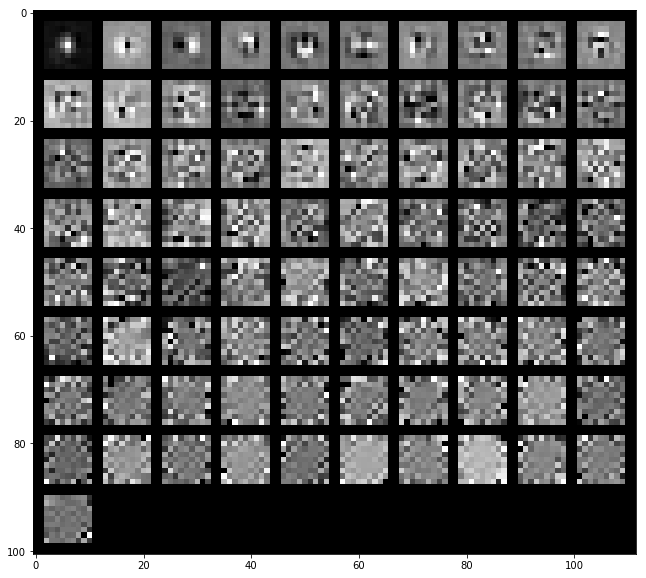

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17205664 0.26658703 0.33741913 0.39718926 0.43976158 0.47982389
 0.51769776 0.55095445 0.57955157 0.60632342 0.62953291 0.65037161
 0.67000953 0.68883408 0.70649284 0.72301547 0.73898049 0.75405599
 0.76789892 0.78070823]


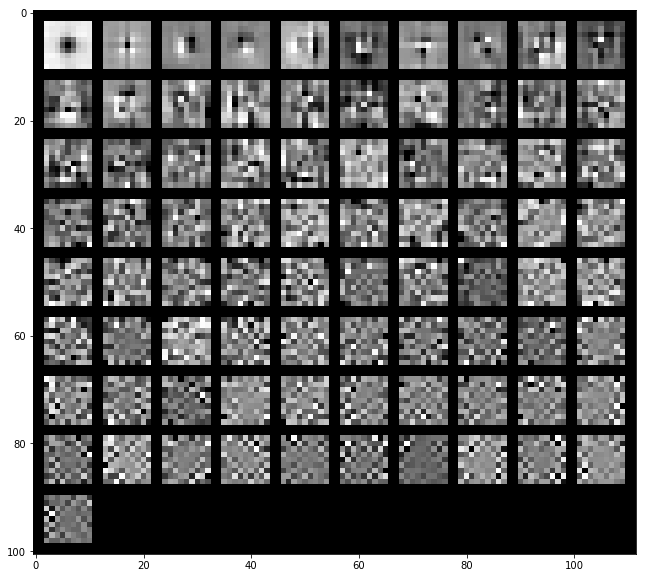

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15633009 0.24528526 0.31699067 0.37170521 0.41827376 0.45762144
 0.49291146 0.52273472 0.55007207 0.5761853  0.60173354 0.62371552
 0.64454156 0.66521336 0.68161725 0.69764763 0.71245336 0.7269532
 0.73994734 0.75255999]


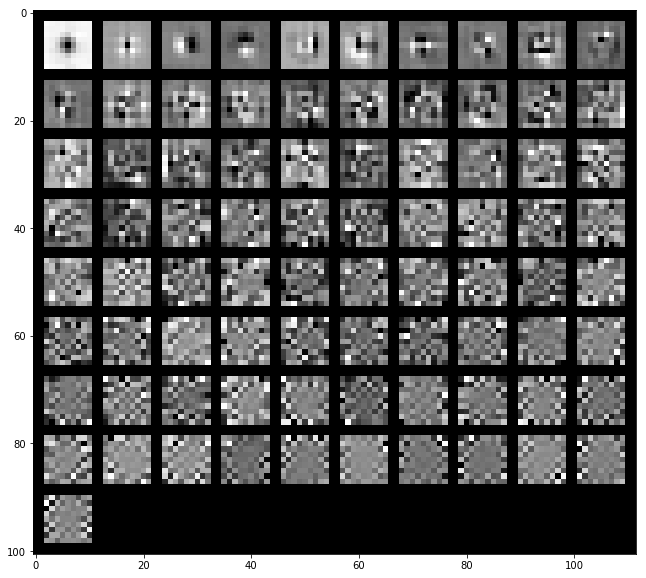

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx971/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.24142504 0.36303989 0.45913179 0.51435424 0.5616933  0.60415842
 0.6454083  0.67846494 0.70451837 0.72460026 0.74411247 0.76234089
 0.77894872 0.79427463 0.80843765 0.82062076 0.8324525  0.84270974
 0.85259172 0.86221491]


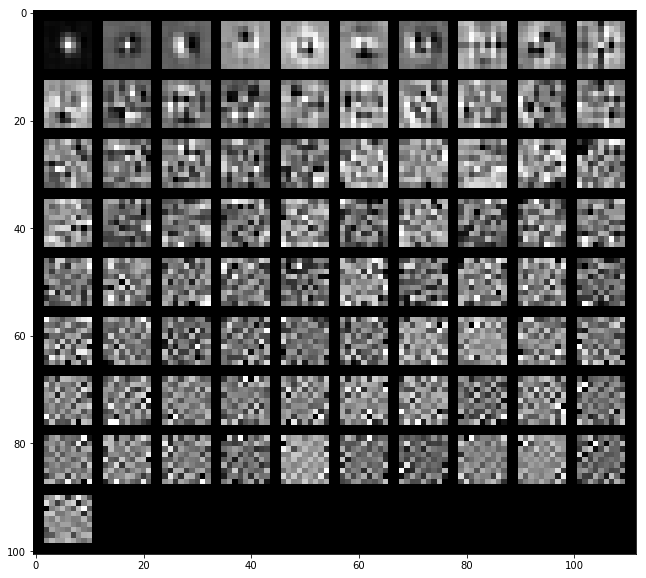

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.24963538 0.35614274 0.43244442 0.48647724 0.53197978 0.57287342
 0.60635034 0.63441428 0.65877139 0.68245003 0.70430173 0.72484498
 0.74273832 0.75912004 0.77350872 0.78715265 0.7995519  0.81130058
 0.82207905 0.83204277]


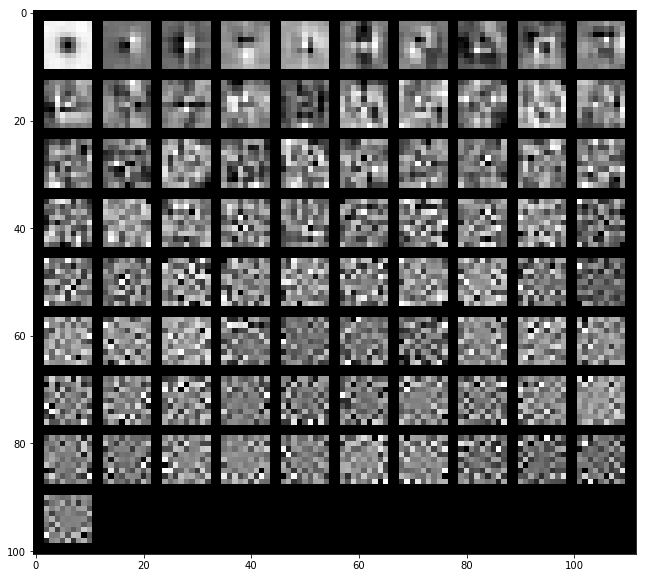

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23984765 0.34764813 0.4360316  0.48280111 0.5281472  0.57142222
 0.60591527 0.63505461 0.66127668 0.68263119 0.70252206 0.72076389
 0.73837623 0.75398248 0.7683836  0.78110357 0.79318278 0.8042602
 0.8146952  0.82472661]


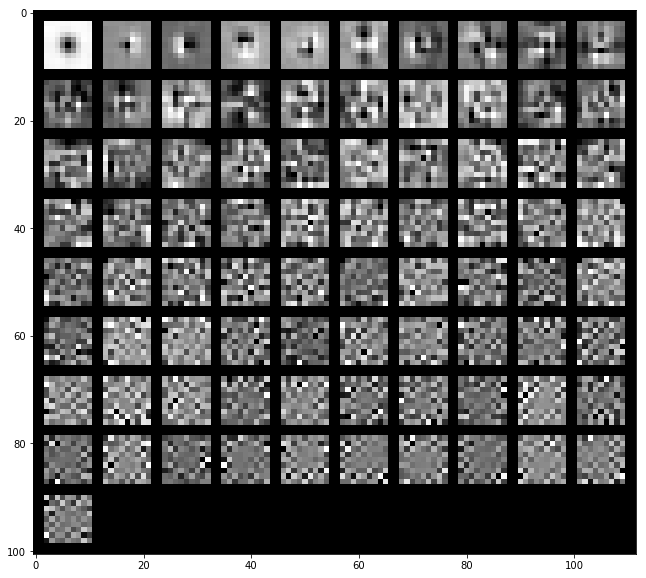

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx982/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15689357 0.24583311 0.30921578 0.36287086 0.41282056 0.45996068
 0.50038404 0.53565548 0.56830465 0.59555209 0.62158345 0.64438987
 0.66576693 0.68460207 0.70179159 0.71833744 0.73393926 0.74795008
 0.76137888 0.77415667]


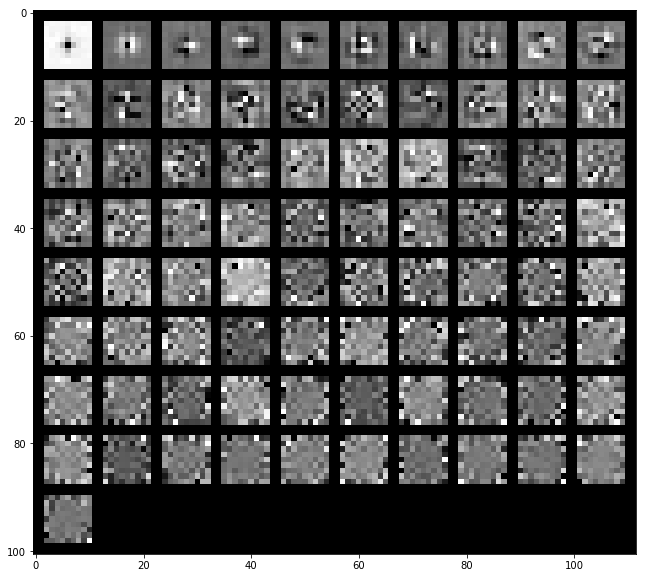

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22584096 0.30059946 0.36805588 0.4233921  0.47655947 0.51790095
 0.55081812 0.58269543 0.60719279 0.63077308 0.65187559 0.66925127
 0.68639627 0.70182824 0.71695319 0.73130666 0.74465112 0.75746957
 0.76910939 0.78053417]


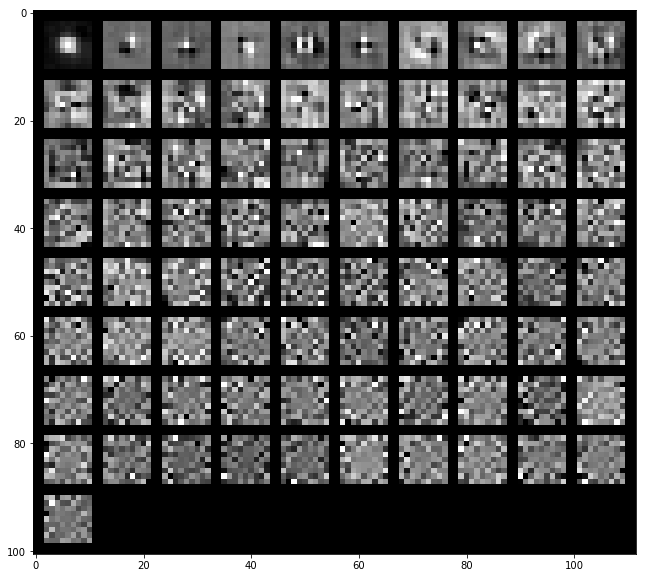

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17726393 0.26840084 0.33197851 0.38472107 0.43338675 0.4775436
 0.51138686 0.54303061 0.57078525 0.59571792 0.61690496 0.63678854
 0.65460708 0.67081321 0.68642968 0.70109267 0.71532108 0.72843843
 0.74106296 0.75257942]


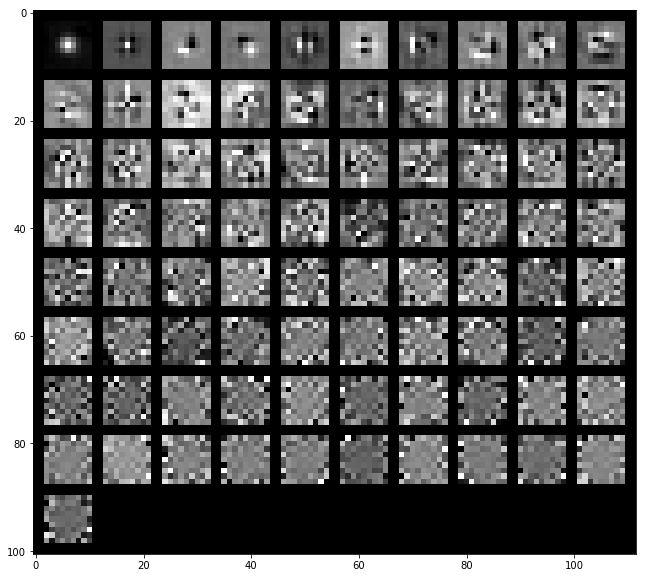

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx983/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20364099 0.29861381 0.36995787 0.43408567 0.48849243 0.53431351
 0.57467395 0.60906624 0.63622256 0.6602163  0.68263557 0.7033657
 0.72261861 0.74055462 0.75660212 0.77111418 0.78406205 0.79576325
 0.80714609 0.81797874]


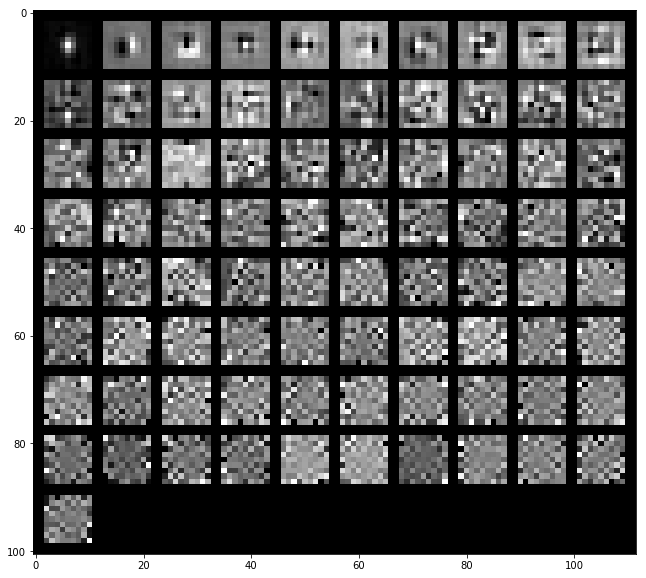

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.24753985 0.34788554 0.42866207 0.49645574 0.54404221 0.58304606
 0.6186343  0.6481066  0.67389512 0.69912694 0.71801279 0.73625203
 0.75316104 0.76782523 0.78177345 0.79489766 0.80695663 0.81841
 0.82896002 0.83856835]


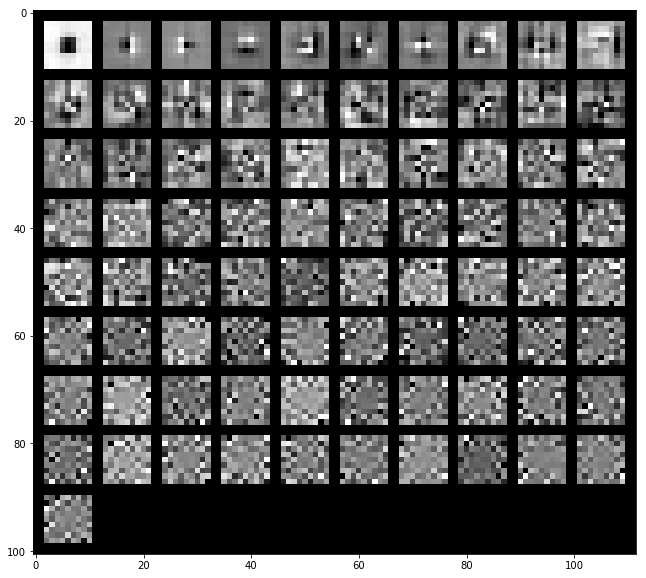

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21616614 0.30949717 0.39024694 0.45366738 0.49917259 0.54191661
 0.57985207 0.61185125 0.63890146 0.66161733 0.68241934 0.70075821
 0.71782538 0.73328577 0.74810413 0.76172963 0.77508241 0.78628031
 0.79689416 0.80717808]


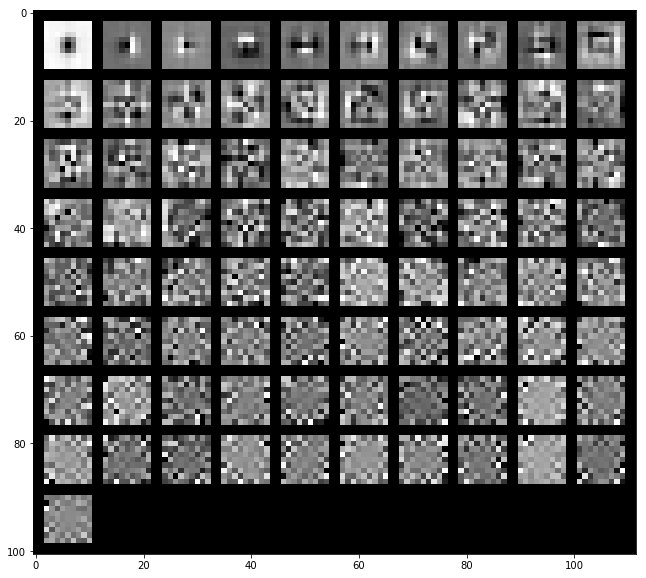

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx995/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.24800813 0.35862532 0.4571825  0.52744987 0.57069424 0.61128469
 0.64424181 0.67069567 0.69674116 0.71827693 0.7371909  0.75482996
 0.7708744  0.78435631 0.79778708 0.80923847 0.82045877 0.83107352
 0.84106418 0.85043005]


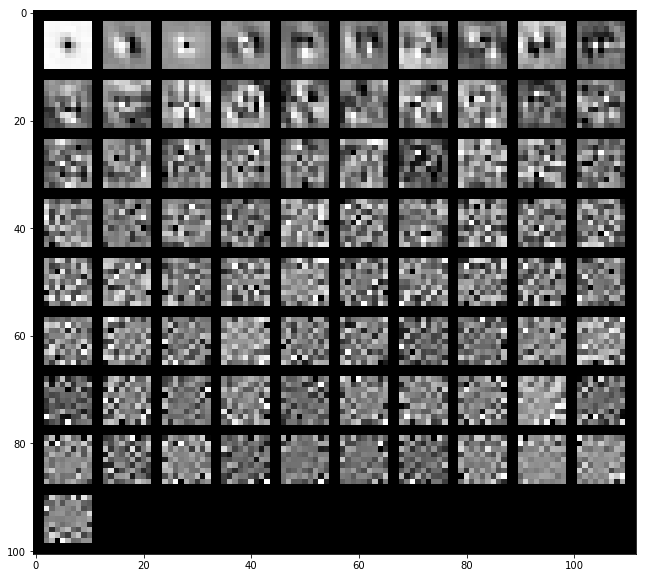

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19812937 0.31507046 0.39979798 0.45743503 0.51317042 0.54995512
 0.58163141 0.61078221 0.63559708 0.65679362 0.67654518 0.69538561
 0.71188185 0.72764242 0.74160909 0.7548682  0.76630739 0.77745052
 0.78802712 0.79824328]


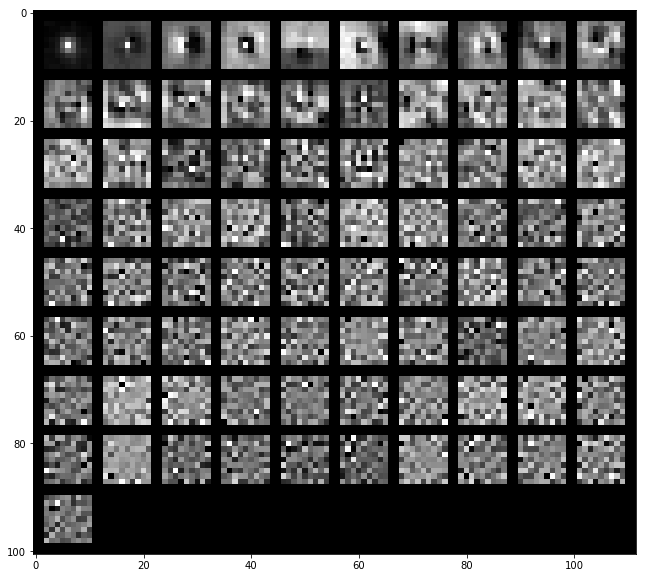

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22374337 0.33127676 0.42094922 0.48537344 0.53225382 0.56925234
 0.59832182 0.6262899  0.65045114 0.67176934 0.69003056 0.7071036
 0.72248647 0.737178   0.75147316 0.76402593 0.77563379 0.78693247
 0.79727258 0.80672219]


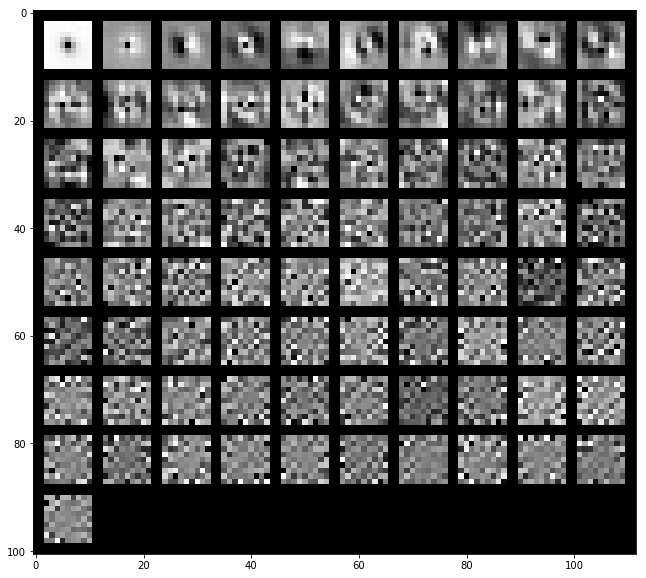

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1006/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18568289 0.29739084 0.36916434 0.42488074 0.47629225 0.52309143
 0.56785653 0.59983394 0.63117826 0.65550177 0.67652962 0.69602922
 0.71425023 0.73229524 0.74824295 0.7627871  0.77704035 0.79015493
 0.80280843 0.81447601]


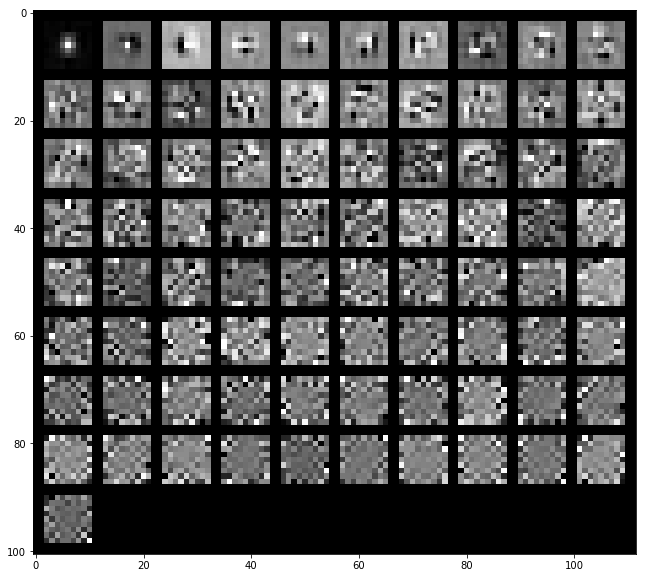

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.2392991  0.34087382 0.43455923 0.50659456 0.55857753 0.60032043
 0.63062333 0.65707042 0.6800612  0.70007464 0.71812536 0.73485551
 0.75144506 0.76696289 0.78005846 0.79289653 0.80491625 0.81572924
 0.82586473 0.83556847]


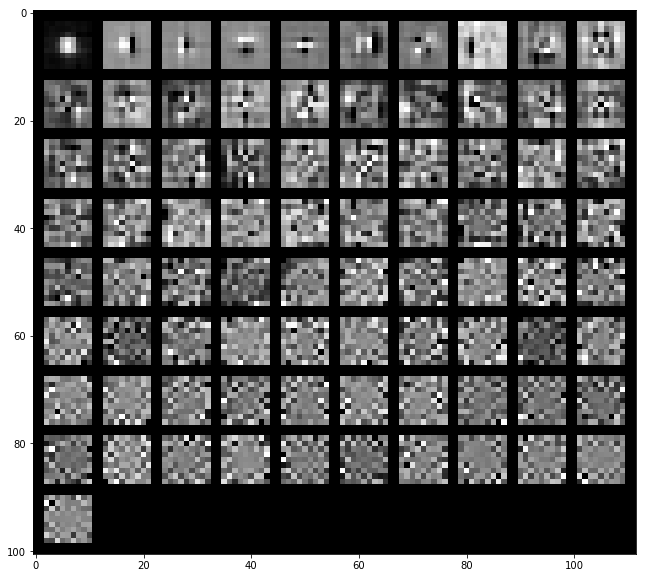

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20510393 0.30428251 0.38697045 0.44969942 0.502439   0.54659507
 0.5811312  0.61067677 0.63500004 0.65609926 0.6755474  0.69372469
 0.71147996 0.72816708 0.74306991 0.75649472 0.76961872 0.78232934
 0.79381839 0.80473935]


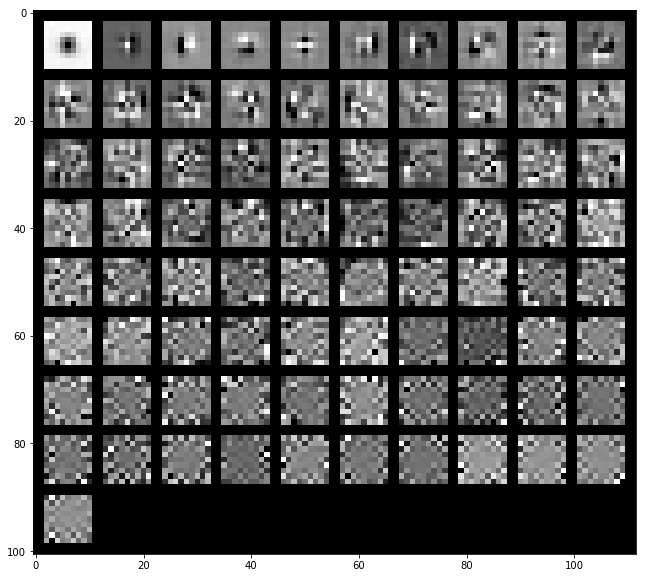

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1007/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19779686 0.29483166 0.37186789 0.42604429 0.47482869 0.52003767
 0.55857652 0.58887533 0.61719057 0.64229759 0.66588924 0.68712958
 0.70677911 0.7242249  0.74071974 0.75675838 0.77102535 0.78330871
 0.79537682 0.80708624]


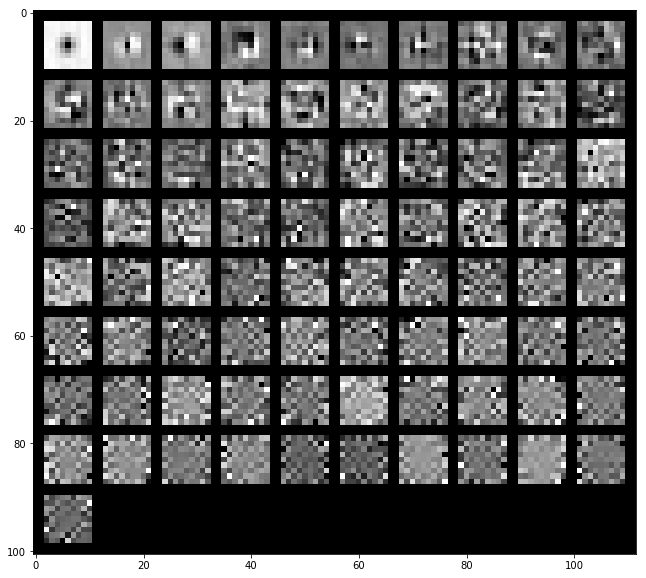

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.2264981  0.33891181 0.42536549 0.48628115 0.53582593 0.57497798
 0.61232108 0.64134121 0.66725692 0.69018897 0.71182287 0.73102861
 0.74678323 0.76130536 0.77525907 0.7888183  0.80160202 0.81364002
 0.82514177 0.83575462]


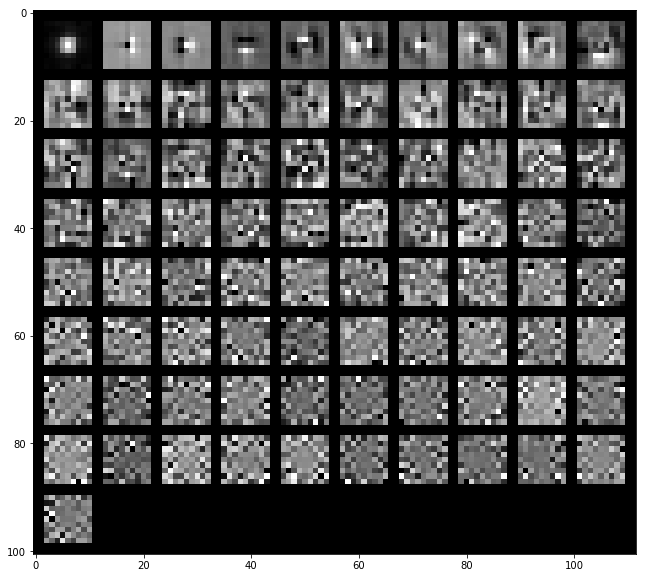

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20699129 0.30745566 0.3854866  0.43868972 0.4878334  0.52968096
 0.56432797 0.59027945 0.61556138 0.63975701 0.66248509 0.68378907
 0.7024339  0.71921354 0.73445471 0.74913372 0.76299519 0.77521971
 0.78621693 0.79625483]


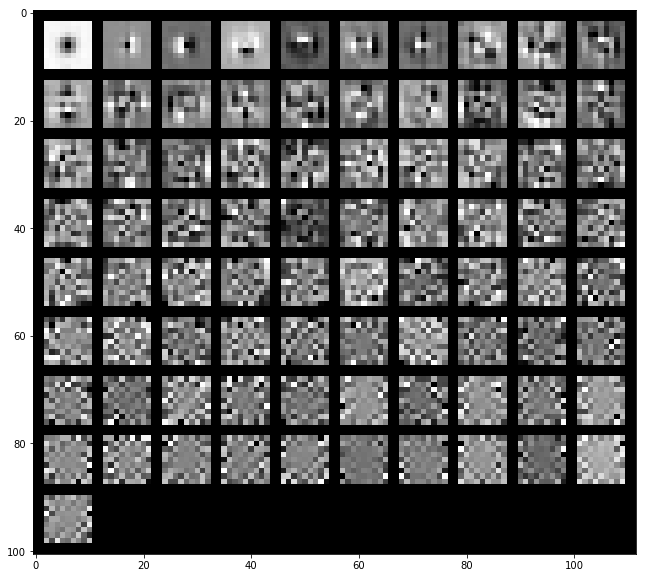

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1018/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15526781 0.26505075 0.34286835 0.40092767 0.45378787 0.50197845
 0.54395599 0.57710403 0.60763774 0.63695174 0.66491189 0.69095735
 0.71254776 0.73119505 0.74767798 0.76325667 0.77731928 0.79017123
 0.80217408 0.81407058]


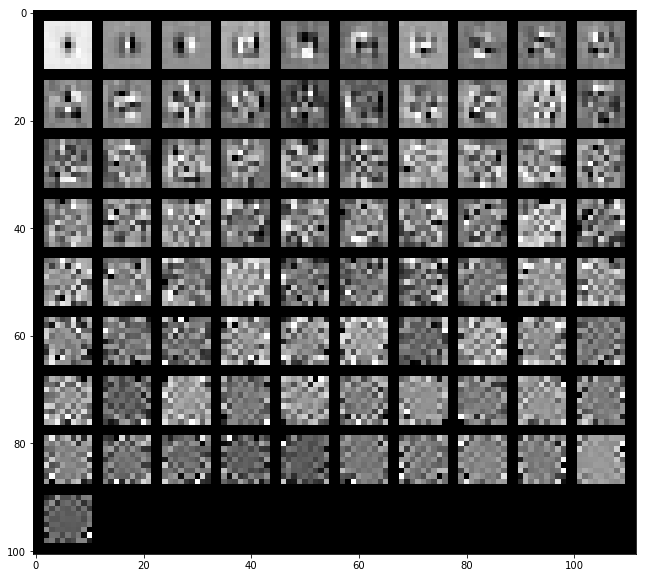

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21088831 0.31960831 0.38511127 0.44852003 0.50751956 0.54659363
 0.58331222 0.61274062 0.63827615 0.66200181 0.68410452 0.70427712
 0.7221626  0.73850574 0.75415809 0.76789896 0.78135294 0.79408448
 0.80547816 0.81626074]


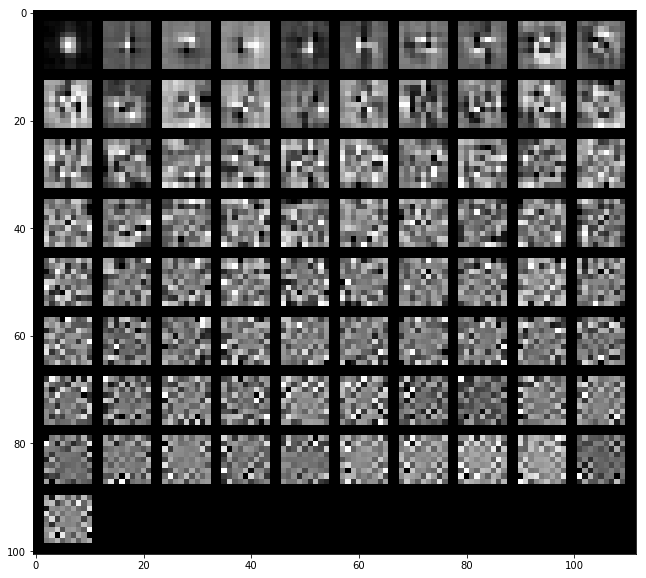

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17363876 0.28243845 0.35012192 0.40548731 0.45866328 0.50139547
 0.5404869  0.56990385 0.5973939  0.62254977 0.64637873 0.66865953
 0.68972988 0.7089775  0.7245262  0.73975705 0.75366634 0.7668009
 0.77865396 0.79019495]


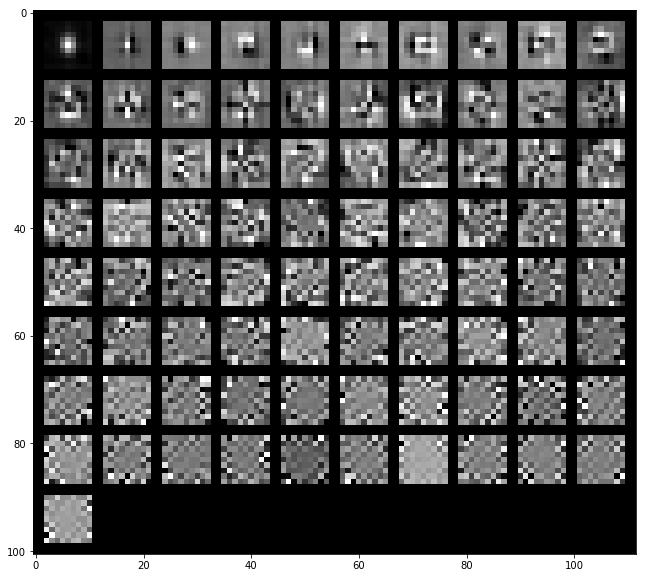

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1030/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15287156 0.24462292 0.31355924 0.36898534 0.41377623 0.45816017
 0.49971958 0.5334449  0.56431041 0.59130385 0.61764516 0.64183529
 0.66450077 0.68667394 0.70685401 0.72423924 0.74022892 0.75546169
 0.76963426 0.78282513]


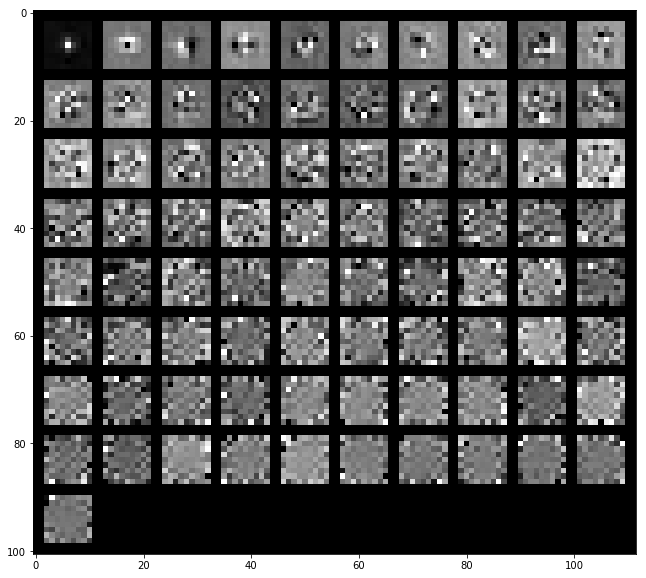

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1856729  0.30570155 0.38188788 0.43900611 0.49102066 0.5267184
 0.55947222 0.5910256  0.61482712 0.63650264 0.65704473 0.67599629
 0.69393735 0.7114879  0.72697163 0.74086192 0.75384815 0.76606731
 0.77773063 0.78894146]


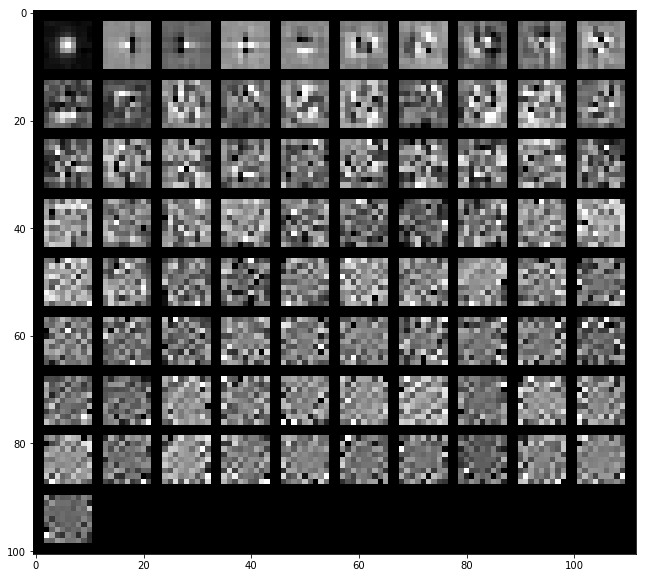

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15829281 0.26043751 0.33931602 0.39245223 0.43761183 0.47649599
 0.51209464 0.54110591 0.56735406 0.59288504 0.61469412 0.63564584
 0.65367789 0.6711048  0.6871431  0.70175001 0.71628446 0.73033587
 0.74335825 0.75591709]


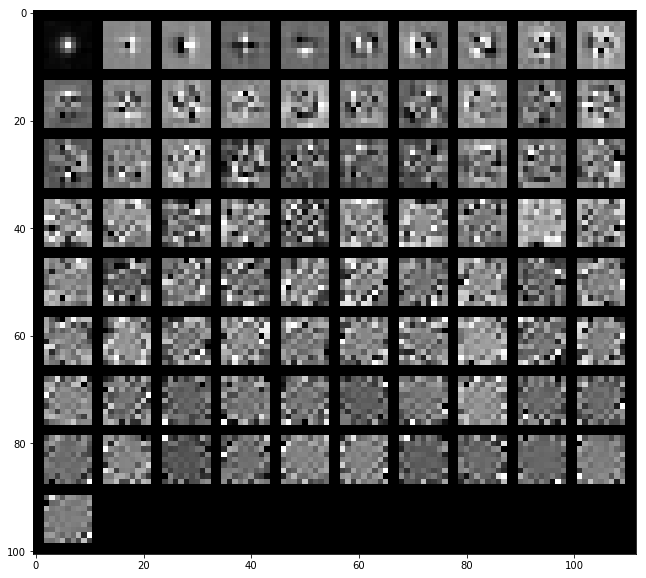

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1031/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20032231 0.30291486 0.38741965 0.45427631 0.5087359  0.55307239
 0.59724367 0.62712943 0.65509213 0.67990912 0.70342825 0.72478855
 0.74476959 0.7606853  0.77462722 0.78760155 0.80049774 0.81257103
 0.82301651 0.83310136]


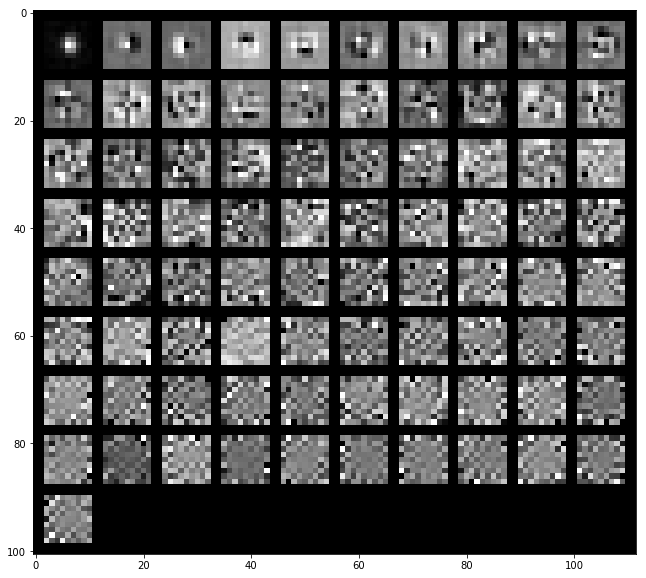

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.25744979 0.36643675 0.45146492 0.5120479  0.56352618 0.59967373
 0.63475197 0.6603926  0.68374214 0.70499607 0.72394313 0.74140772
 0.75759399 0.77323237 0.78676414 0.79880687 0.81007624 0.82093619
 0.83125671 0.84094074]


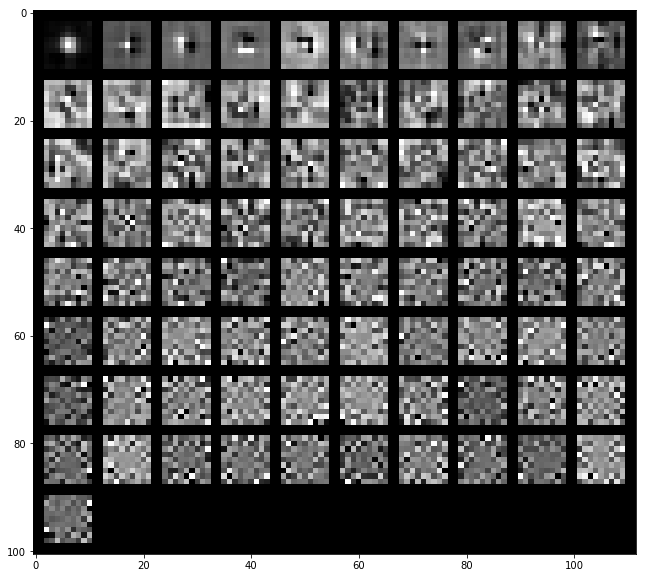

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22512629 0.32559599 0.41037082 0.46948755 0.51974953 0.55974677
 0.59718559 0.62533212 0.6500168  0.67231995 0.69316869 0.71257272
 0.72908576 0.74410275 0.7577695  0.7700454  0.78130812 0.79209228
 0.80219589 0.81209976]


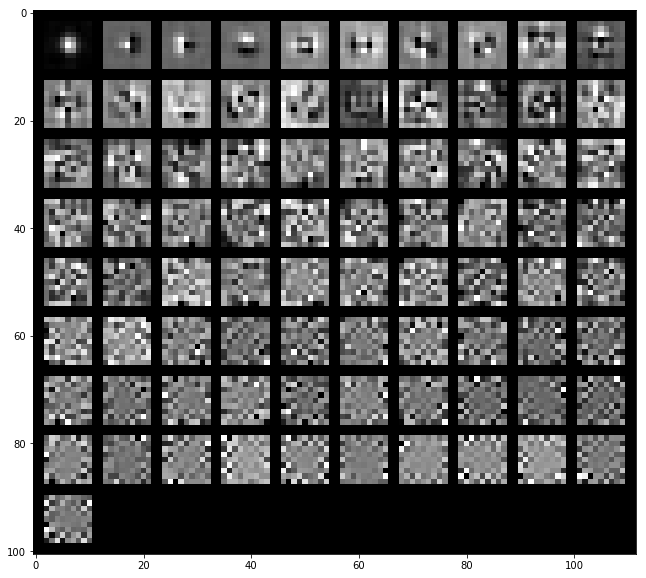

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1042/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16595976 0.24168798 0.30727122 0.36742746 0.41682773 0.45993711
 0.49632856 0.53029397 0.56174468 0.59013613 0.61605082 0.64101397
 0.66454097 0.68653545 0.70671776 0.7251084  0.74193492 0.7567529
 0.77077925 0.78428687]


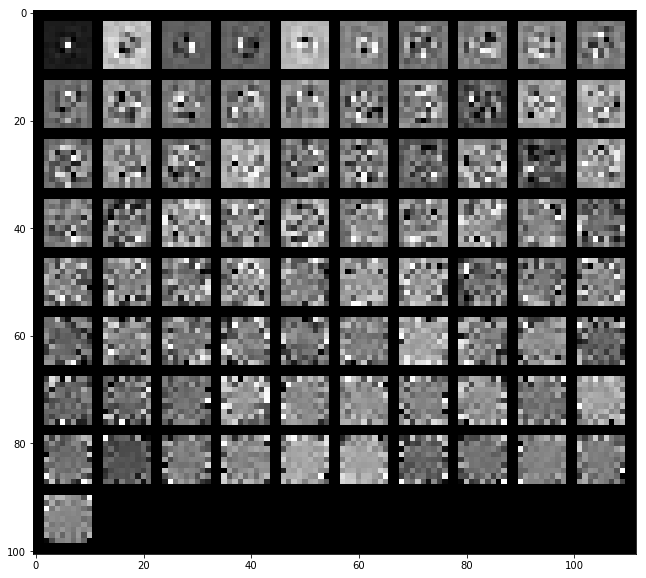

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21095599 0.29030936 0.3444531  0.39363152 0.43542252 0.47338509
 0.50592675 0.53512865 0.56402012 0.58992886 0.61400985 0.63726726
 0.65700545 0.67602031 0.69321579 0.7101403  0.72568532 0.74020258
 0.75406515 0.76696959]


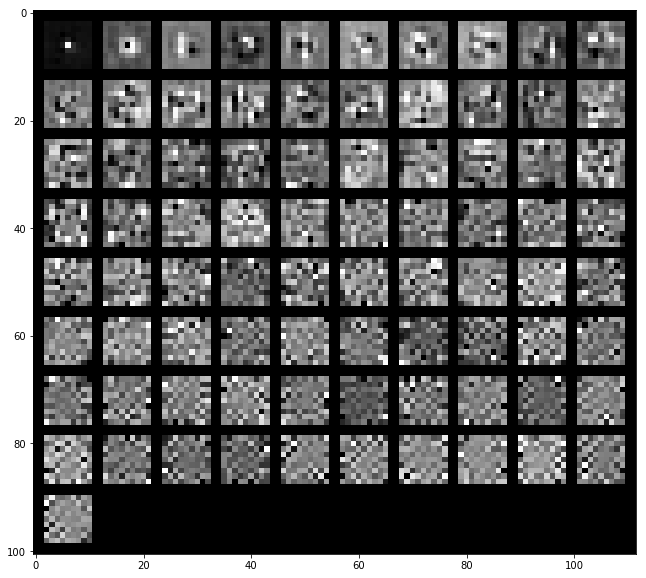

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18604678 0.2579731  0.31381507 0.3620247  0.40607861 0.44145137
 0.47601662 0.50584862 0.53404689 0.56140921 0.58489331 0.6067416
 0.6273633  0.64704006 0.66592349 0.6835363  0.69989928 0.71455833
 0.72821727 0.74118163]


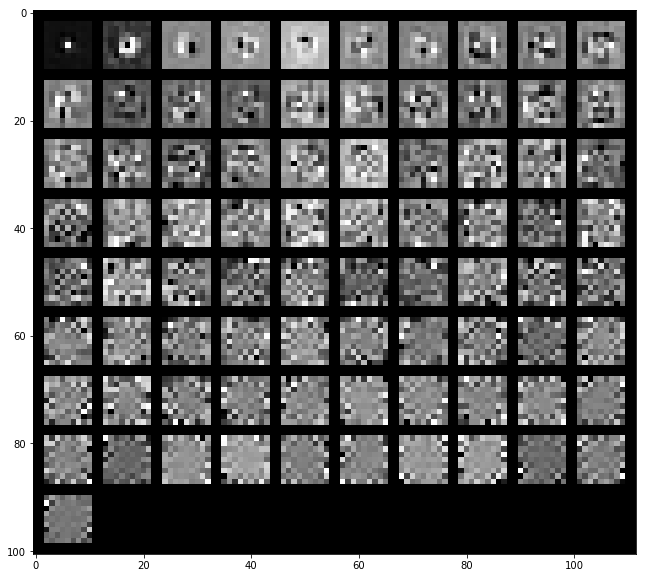

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1043/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19749818 0.2968943  0.38363267 0.44940146 0.51427407 0.56179299
 0.59788317 0.63096335 0.66212927 0.69054503 0.71562775 0.73731626
 0.75664324 0.77466067 0.79038914 0.8047719  0.81726247 0.82885297
 0.83997983 0.85026652]


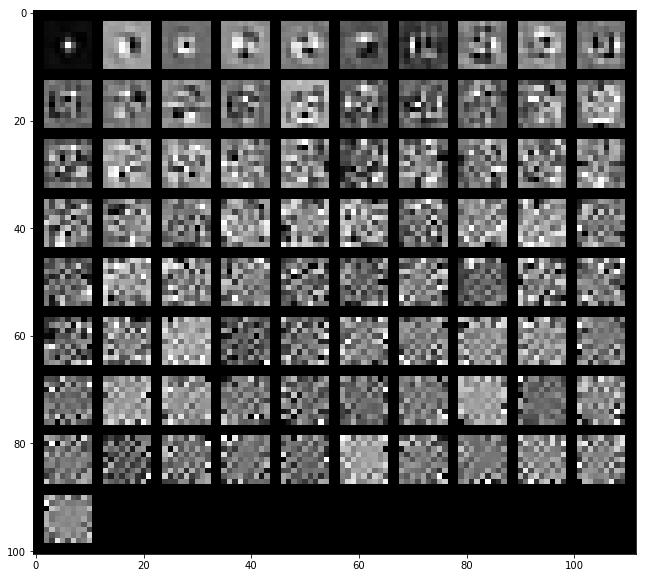

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23444735 0.34857887 0.43893972 0.49450758 0.54049596 0.58093549
 0.61631875 0.6466353  0.66901371 0.6903018  0.71049008 0.72832679
 0.74507393 0.76024507 0.77424676 0.78733647 0.79875802 0.80996784
 0.82051319 0.83088286]


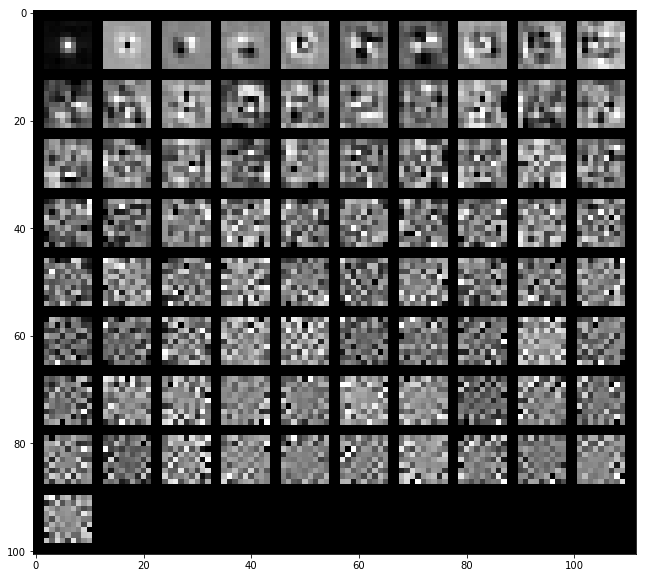

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20786414 0.31096036 0.40038701 0.45497479 0.50605571 0.55227895
 0.58778393 0.61671042 0.64334922 0.66699734 0.68861052 0.70964084
 0.72721581 0.74320565 0.75778788 0.77120285 0.78357247 0.79538354
 0.80620347 0.81655894]


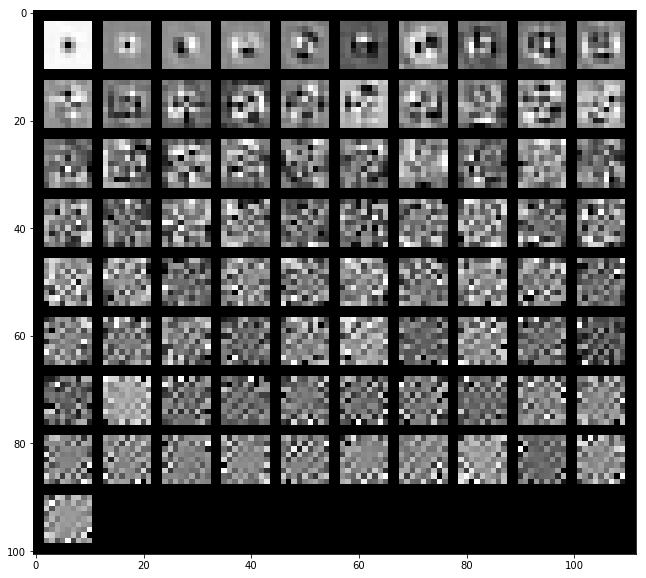

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1055/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16353179 0.25474723 0.33359464 0.3907066  0.43905428 0.48405396
 0.52434766 0.56308632 0.594112   0.62265403 0.64774853 0.66991144
 0.69044285 0.71009724 0.72814451 0.74547319 0.76132006 0.77637507
 0.78971217 0.80238693]


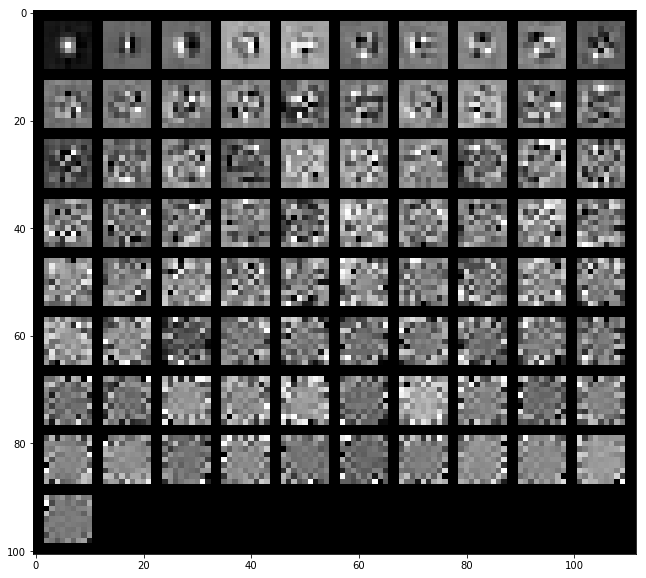

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19687775 0.29514525 0.38141423 0.43634763 0.48316024 0.52248416
 0.5578174  0.58677477 0.61167095 0.63588118 0.65694017 0.67739588
 0.69626342 0.71371764 0.73037854 0.74565915 0.75983822 0.77315609
 0.78577651 0.79774622]


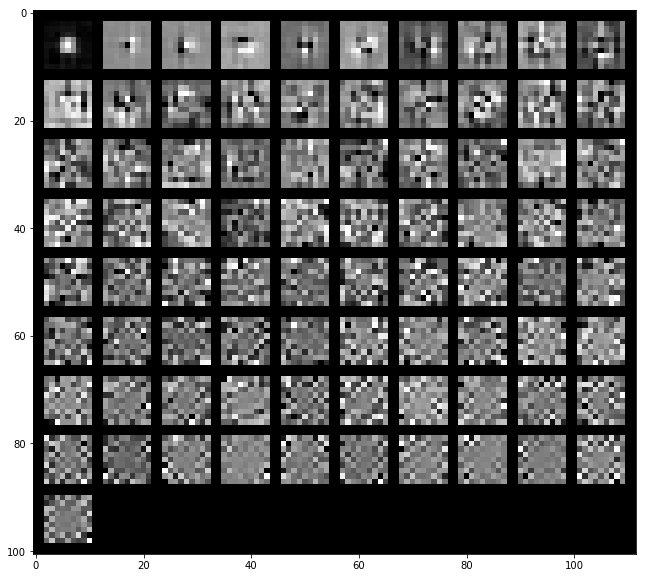

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1762089  0.26869703 0.3485991  0.39743326 0.4417961  0.48434732
 0.52206591 0.55383794 0.58205494 0.60622044 0.62821364 0.64923878
 0.66825137 0.68608528 0.70378299 0.71978092 0.73459887 0.74864843
 0.76201915 0.77337459]


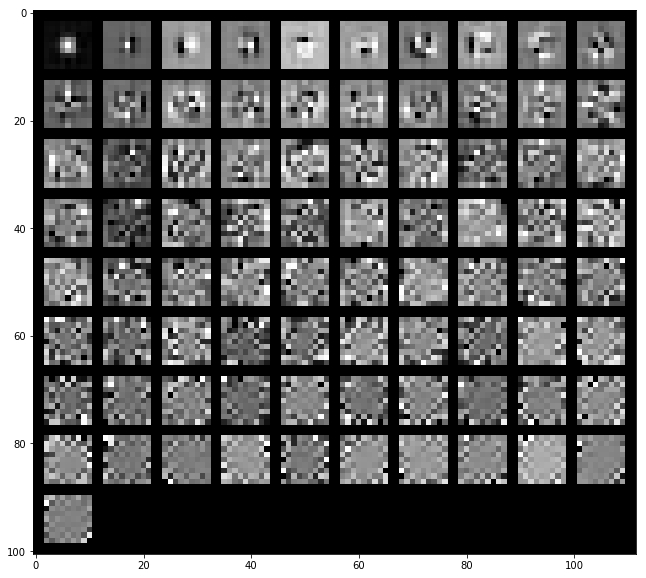

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1162/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13730749 0.24048812 0.32930669 0.3917912  0.44536823 0.49061699
 0.5302398  0.56621799 0.60097656 0.62812134 0.65428814 0.67772226
 0.69827763 0.71753216 0.73652363 0.75310709 0.76876917 0.78367332
 0.79654803 0.80923219]


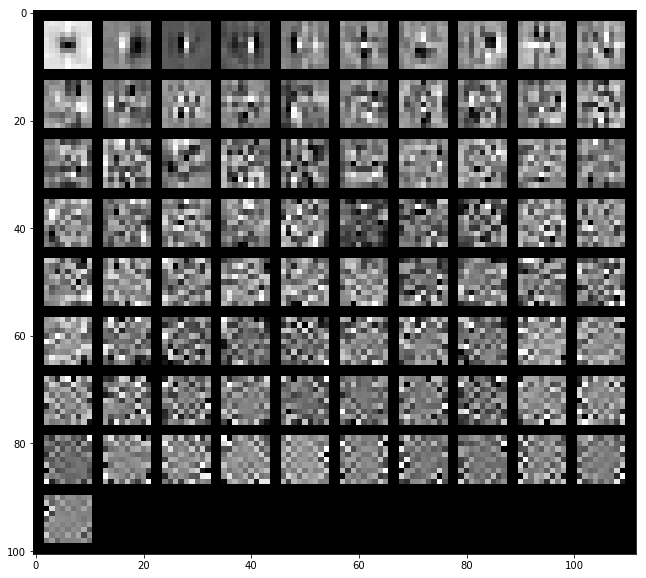

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14422211 0.25210757 0.32351164 0.39234768 0.43797544 0.48083241
 0.51558979 0.54538753 0.57254982 0.59858113 0.6229115  0.64362122
 0.66412094 0.68255207 0.70038777 0.7163408  0.73198136 0.74707341
 0.76037321 0.77332224]


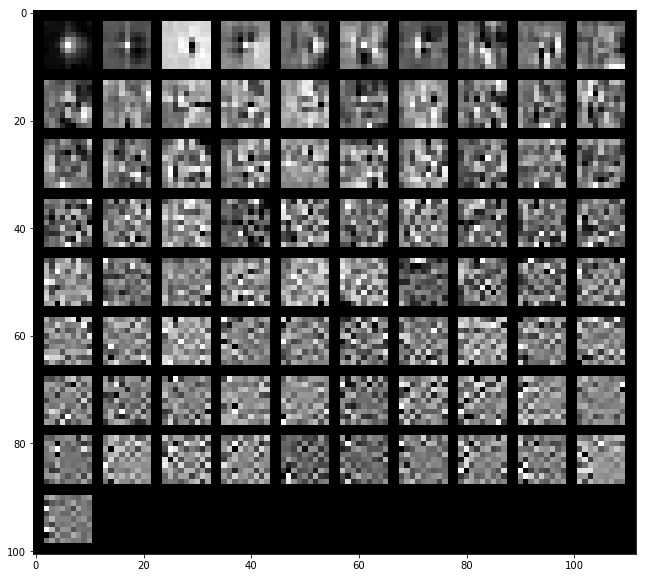

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13561816 0.23364562 0.30905747 0.37115931 0.41545661 0.45654983
 0.49531621 0.52539314 0.55334852 0.57802833 0.60216512 0.62265413
 0.64254529 0.66087976 0.67751044 0.69406122 0.70954772 0.7246856
 0.73905496 0.75213501]


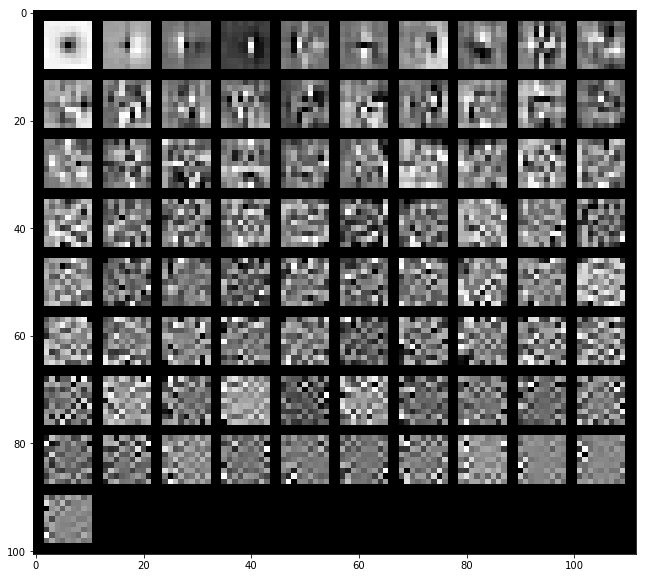

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1163/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17944426 0.28373875 0.3735262  0.43232876 0.48673099 0.53192071
 0.56680447 0.60041332 0.62976111 0.65620592 0.68143467 0.70557752
 0.7262337  0.74540874 0.76263802 0.77977521 0.79455352 0.80681263
 0.81817889 0.82871262]


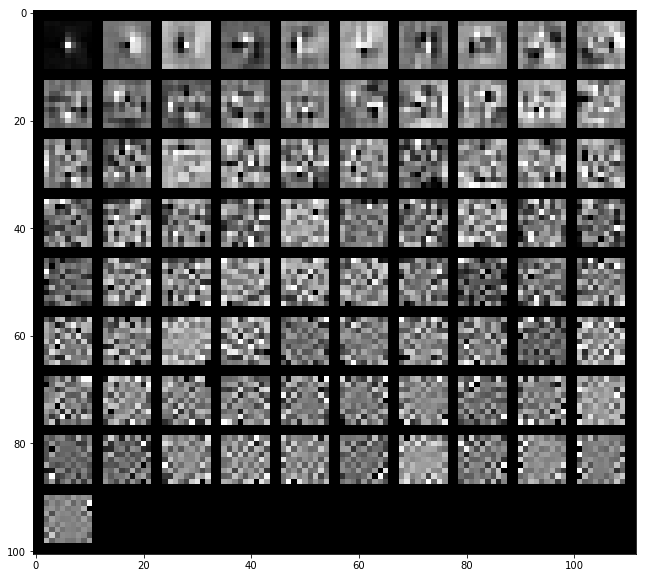

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18091678 0.27448057 0.35134382 0.41708268 0.46505709 0.50303558
 0.53814627 0.5690048  0.59590091 0.6205309  0.64338429 0.66564286
 0.6858853  0.70490128 0.72064842 0.73584556 0.75036502 0.7644929
 0.77734194 0.78873095]


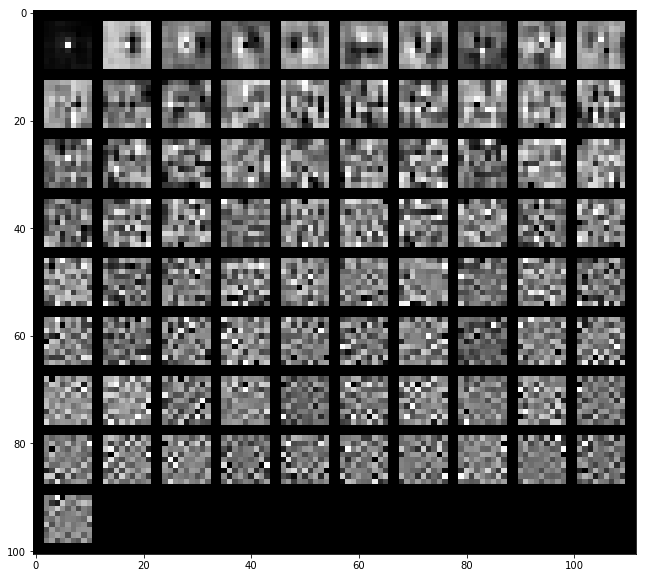

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17425342 0.27183272 0.34765198 0.40599154 0.45125357 0.49199677
 0.52507746 0.55592764 0.58291311 0.60730455 0.63116478 0.65407012
 0.67441222 0.69272178 0.70957013 0.7257423  0.74044882 0.75467869
 0.7674362  0.77955518]


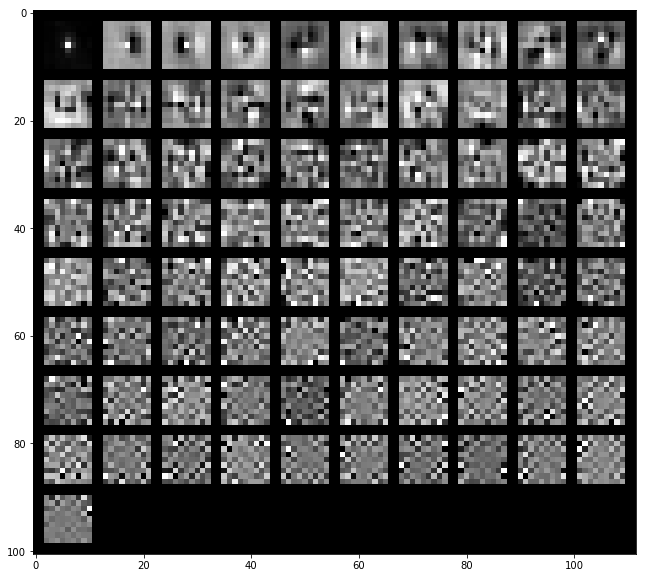

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1174/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17608245 0.28517748 0.36020091 0.43006216 0.4864845  0.52581886
 0.5645099  0.59847321 0.62684005 0.65341117 0.67742645 0.69789332
 0.71822805 0.73431934 0.75003625 0.76432992 0.77835596 0.79120486
 0.80303127 0.81439127]


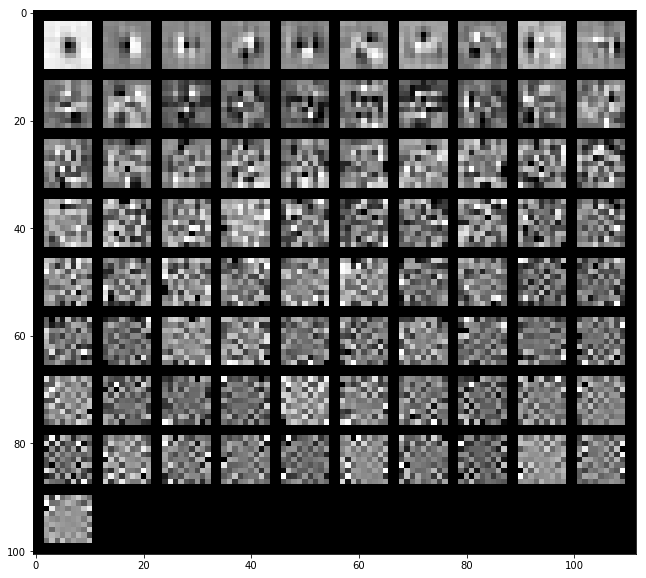

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.25292511 0.38017221 0.44885486 0.49742806 0.54360039 0.58001406
 0.61249027 0.63989094 0.66558441 0.68973539 0.70758181 0.72534619
 0.74132375 0.75685854 0.77093584 0.78495195 0.79800694 0.80992428
 0.82121674 0.83165332]


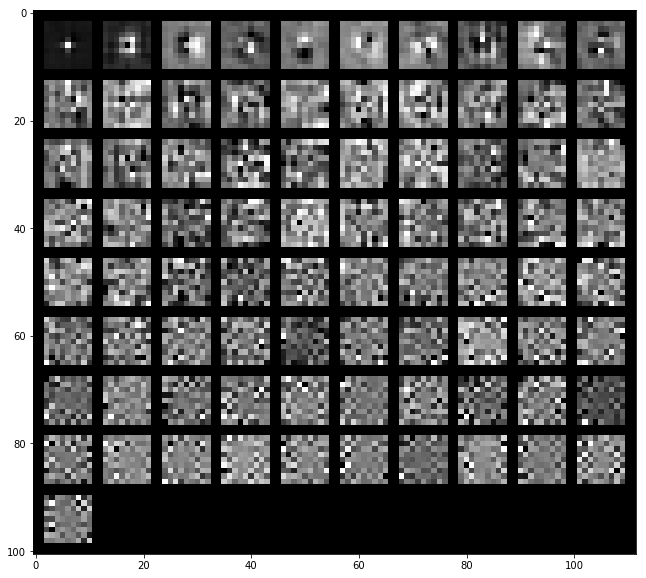

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21740232 0.336129   0.40864085 0.46128482 0.50859531 0.54860338
 0.58150862 0.6111985  0.63694265 0.66030104 0.68044985 0.69795712
 0.71526439 0.73089356 0.74594693 0.75965249 0.77225014 0.78314082
 0.79380521 0.80411708]


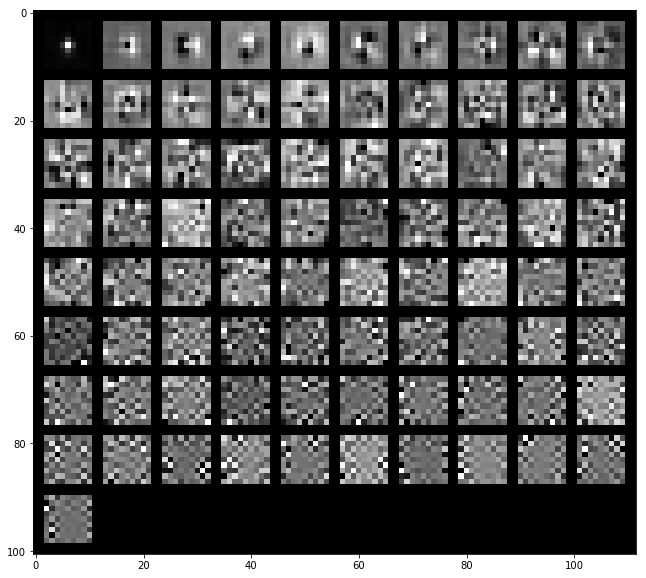

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1186/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21463143 0.32635767 0.40561426 0.46789551 0.52386919 0.56355197
 0.5993387  0.63150855 0.66234451 0.69036864 0.71574263 0.73937584
 0.75847303 0.7762787  0.7927128  0.80679449 0.8196074  0.8319515
 0.84353865 0.85384398]


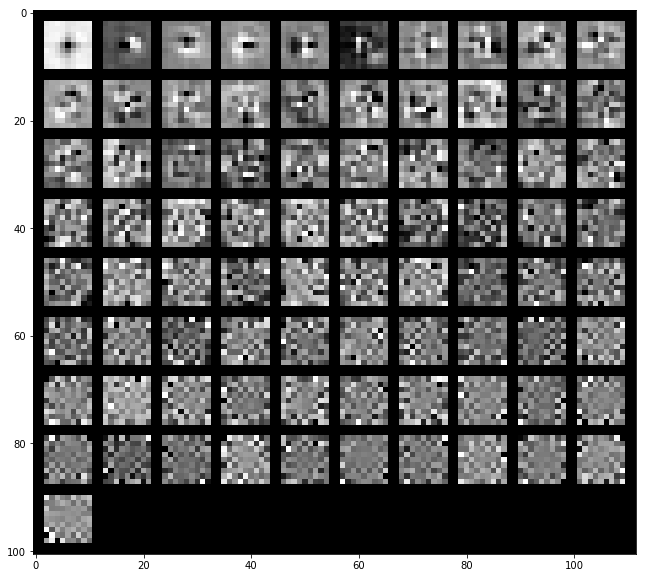

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.33237707 0.41897547 0.47796779 0.52375217 0.56049786 0.59118726
 0.61834719 0.64502401 0.6682656  0.69052461 0.70894732 0.72584388
 0.74197904 0.75647096 0.77015835 0.78208591 0.79365595 0.80451719
 0.81516401 0.82469596]


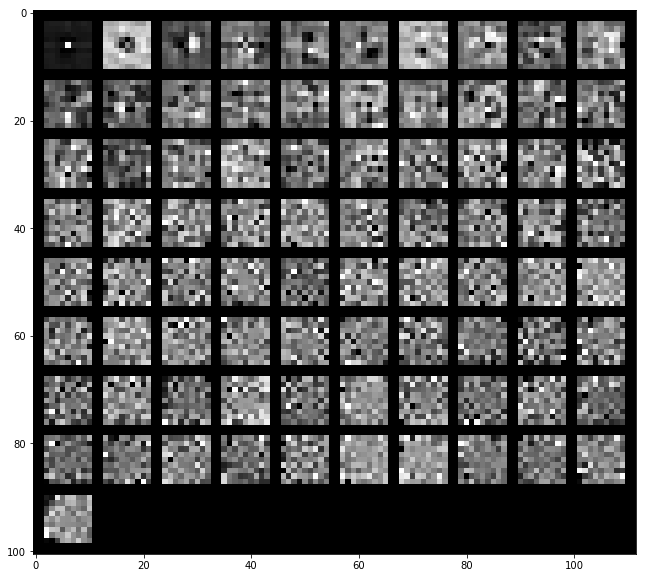

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.26399427 0.36208537 0.43026157 0.48103188 0.52395853 0.55919041
 0.59116918 0.61930637 0.64403331 0.66657721 0.6862083  0.70510873
 0.72239908 0.73783929 0.75260062 0.76691671 0.77917595 0.79116102
 0.80183621 0.8112913 ]


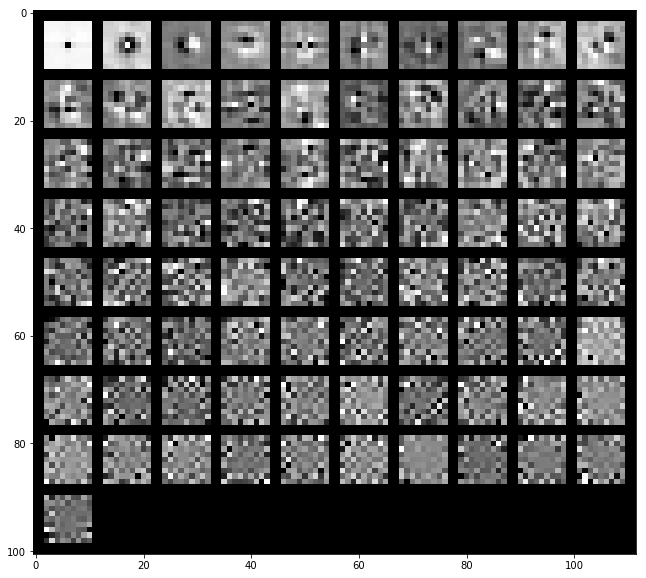

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1187/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13467307 0.21489179 0.28243867 0.34056239 0.38962343 0.4289061
 0.46647989 0.50147583 0.5336758  0.56363243 0.59158054 0.61663157
 0.63823392 0.65901719 0.67872552 0.69620335 0.71310606 0.72966469
 0.7449189  0.75967095]


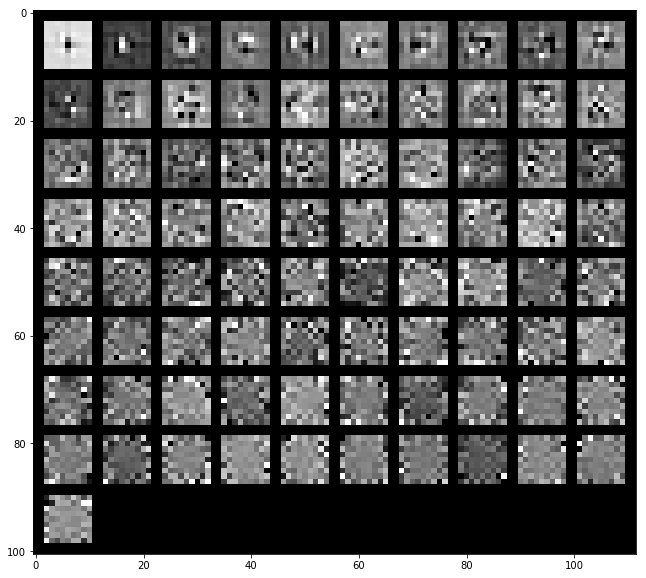

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13204722 0.22951257 0.32182045 0.38207208 0.43411869 0.47487789
 0.51351234 0.54608549 0.57535272 0.60442617 0.62928845 0.65122919
 0.67088966 0.68894327 0.70420559 0.71935862 0.73385018 0.74799151
 0.76105695 0.77345131]


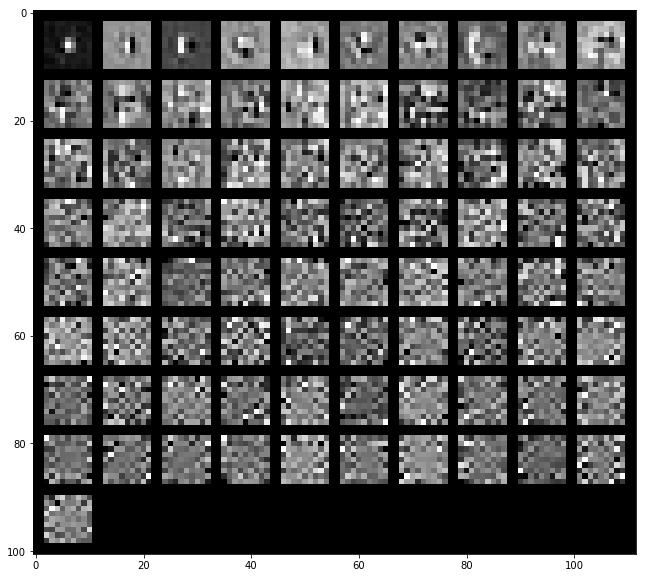

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13002119 0.21163242 0.2897229  0.34333551 0.39033515 0.42725512
 0.4638733  0.4948357  0.52335786 0.55011089 0.5750731  0.59776378
 0.61861243 0.63736761 0.65486657 0.67072436 0.68601538 0.70088439
 0.71476272 0.72763159]


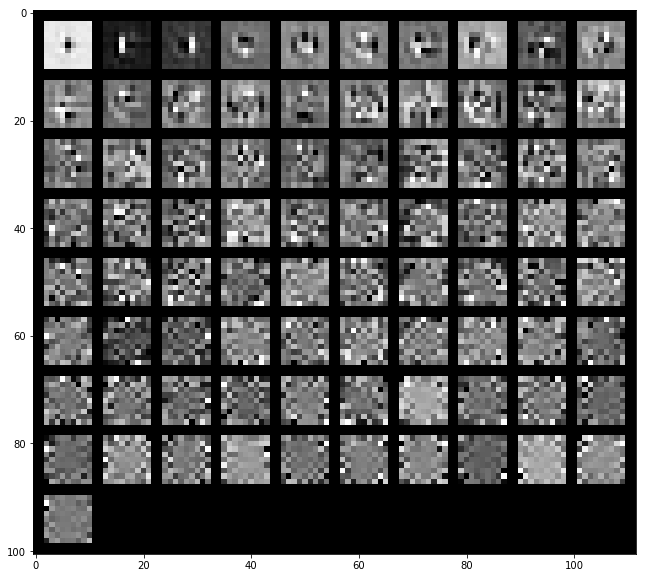

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1198/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18305206 0.32080272 0.39710914 0.45769215 0.50829372 0.55312762
 0.59703414 0.63142077 0.66148831 0.68606856 0.70826776 0.72799779
 0.74674191 0.76366032 0.7792777  0.79288642 0.80498815 0.81650868
 0.82696547 0.83688958]


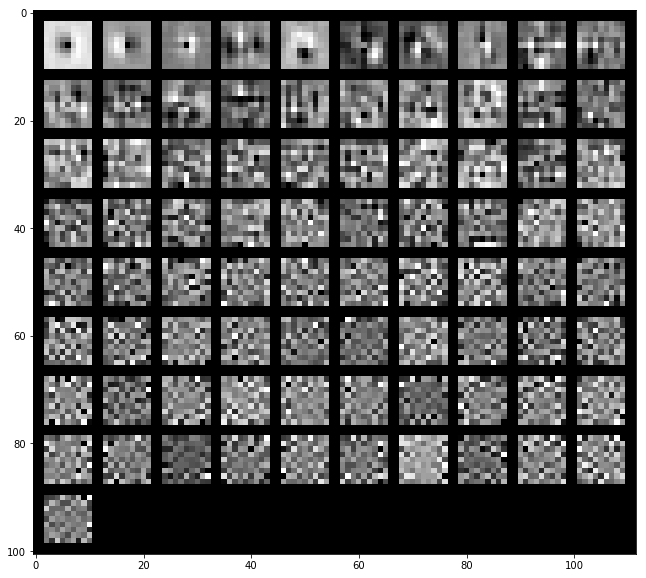

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22174635 0.33069751 0.41340946 0.46669507 0.51069627 0.54837093
 0.5812306  0.60708391 0.63196048 0.65415893 0.67419012 0.69195513
 0.70842888 0.72438885 0.74003689 0.7549193  0.76795552 0.78014482
 0.79157494 0.80269963]


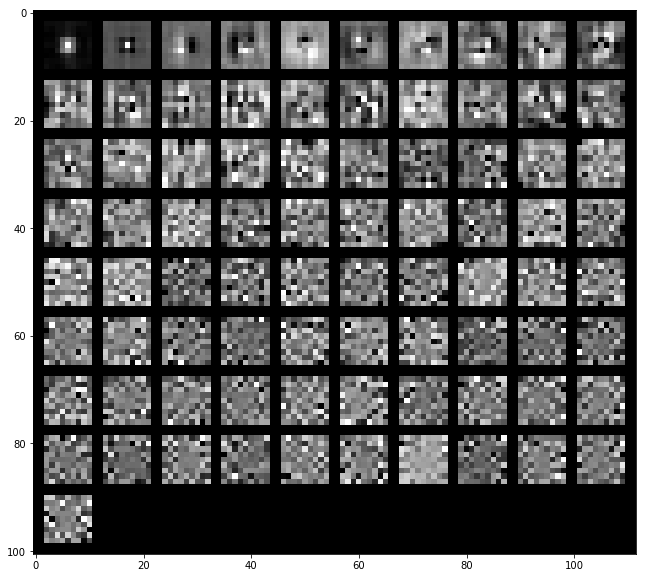

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19598537 0.30339117 0.3931666  0.44308717 0.49007175 0.52965681
 0.56507623 0.59327302 0.61916543 0.6414992  0.6613879  0.67917058
 0.69593351 0.71200333 0.72738771 0.74153547 0.75481017 0.76774225
 0.77963752 0.79091882]


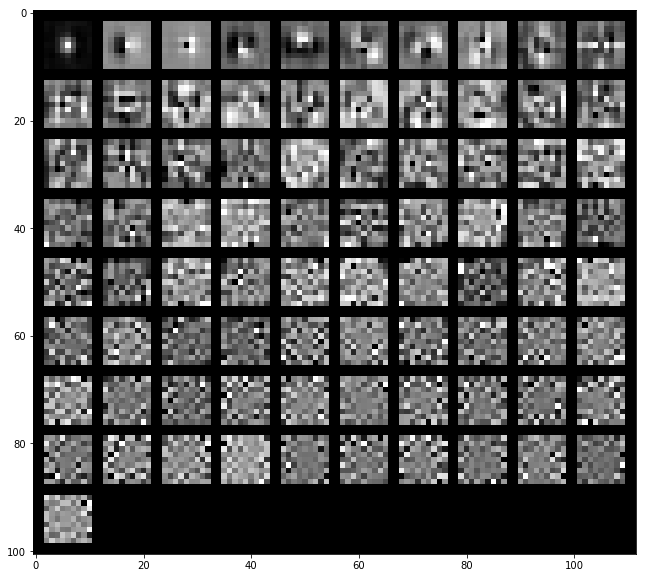

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1199/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20765737 0.31026377 0.38607986 0.45272305 0.50709746 0.55200644
 0.58660378 0.61721693 0.6457691  0.67014943 0.69198536 0.71324332
 0.73335772 0.75191448 0.76879597 0.78417228 0.79824887 0.81106965
 0.82272787 0.83327545]


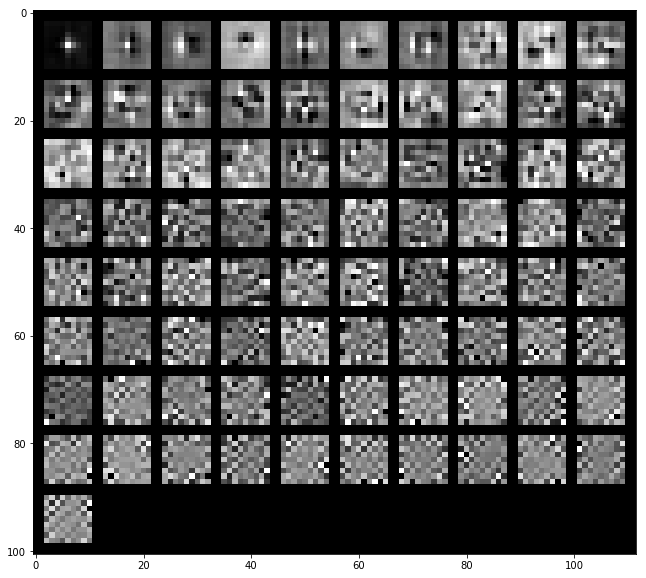

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15848347 0.26036151 0.33829121 0.39379027 0.43762915 0.48076711
 0.51759039 0.55160096 0.5805509  0.60782814 0.63187274 0.65488586
 0.67369456 0.69181852 0.70835699 0.72413621 0.73897283 0.75299692
 0.76635283 0.77903022]


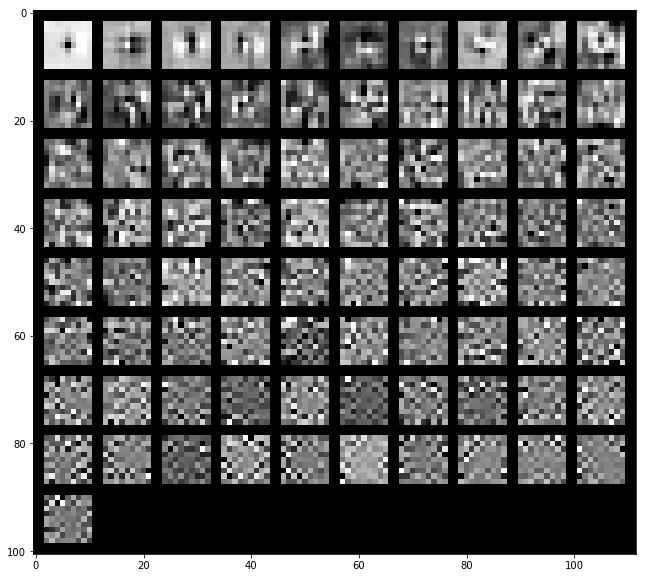

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17673938 0.27705205 0.34922132 0.41044338 0.45448707 0.49600163
 0.53047943 0.55955059 0.58670531 0.61116674 0.63503214 0.65610112
 0.6762142  0.69355763 0.7106562  0.7258624  0.74038873 0.75424667
 0.76706351 0.77867257]


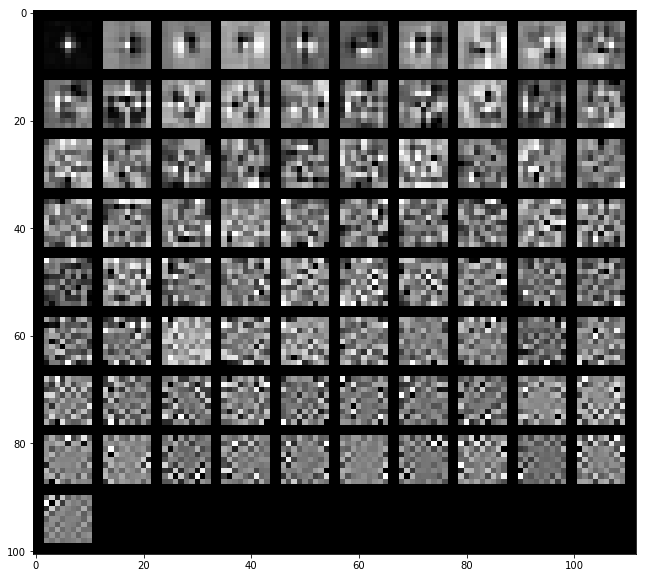

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1211/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1340903  0.21219962 0.28108167 0.33926516 0.38805843 0.43149961
 0.47225469 0.50783644 0.53984632 0.56872056 0.59461877 0.61854758
 0.6400653  0.66126152 0.68028195 0.69919147 0.71628557 0.7319228
 0.74670541 0.76130117]


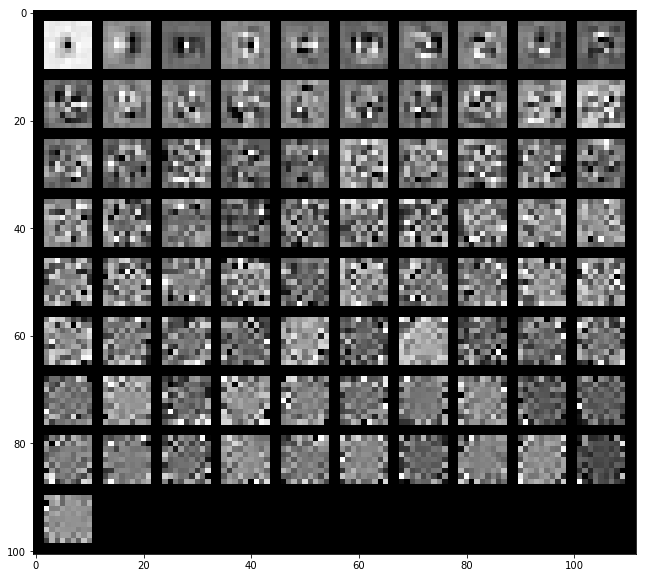

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16490537 0.24684823 0.31751132 0.37928902 0.42150642 0.45790382
 0.49284651 0.52638267 0.55723237 0.58467084 0.61117843 0.63488857
 0.65851851 0.6792174  0.6977021  0.71580861 0.73099101 0.7452899
 0.75897461 0.77136665]


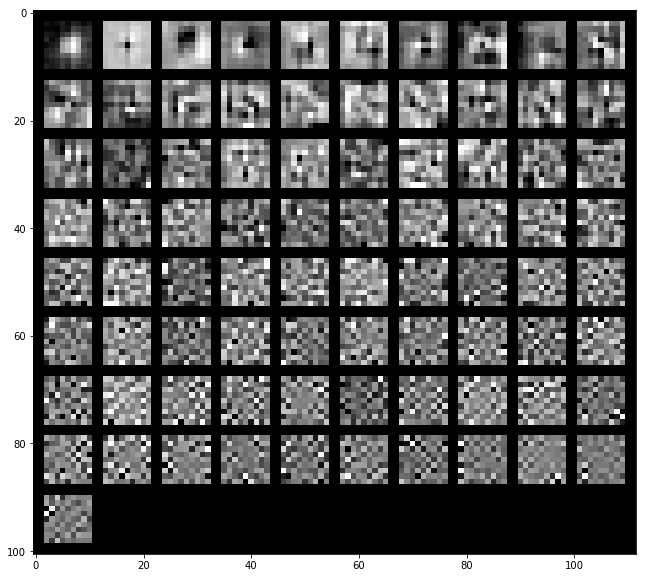

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1322239  0.21958599 0.28286104 0.33266101 0.3738294  0.41270646
 0.44606768 0.47834982 0.50832942 0.53533519 0.56169757 0.58293455
 0.60365775 0.62320272 0.64163038 0.65848318 0.67457001 0.69019402
 0.70518781 0.71929528]


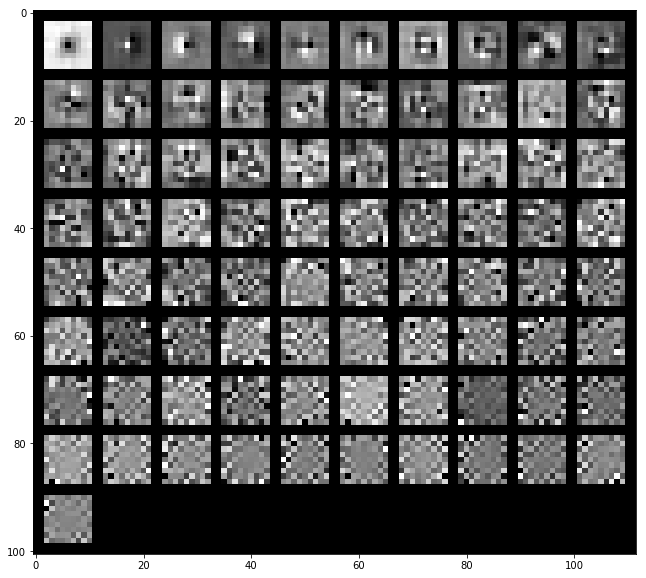

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1222/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17766149 0.27066838 0.34322299 0.396775   0.44388918 0.48573512
 0.52195448 0.55444073 0.58362889 0.61074512 0.63640824 0.65909662
 0.67876772 0.69738941 0.71541255 0.73188571 0.74690448 0.76134021
 0.77522662 0.78775903]


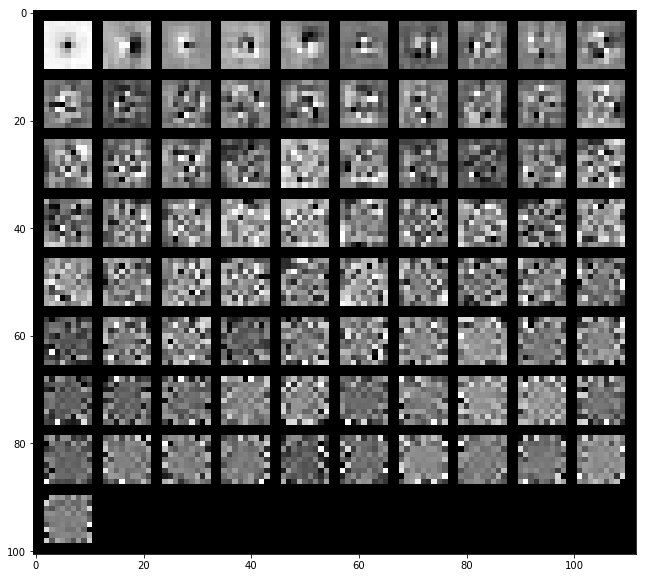

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1679639  0.28742224 0.36534623 0.42068201 0.47367787 0.51558157
 0.55250558 0.58104687 0.60519335 0.62879738 0.65031247 0.67159543
 0.69036684 0.70851621 0.72427362 0.73959536 0.75370834 0.76678747
 0.77946866 0.79144831]


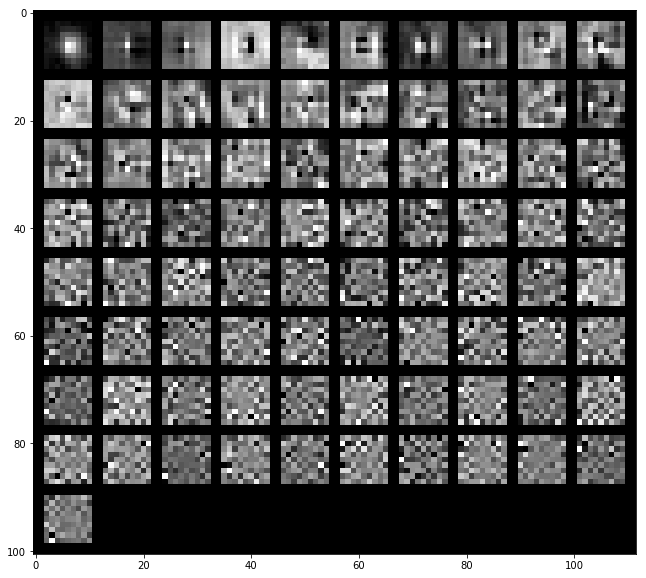

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16405932 0.26864189 0.33900133 0.39078049 0.43162673 0.46943387
 0.50393625 0.53545591 0.56310233 0.58928903 0.61153341 0.63354155
 0.65152131 0.66917255 0.68569561 0.7009094  0.71556921 0.72886213
 0.74189838 0.75451602]


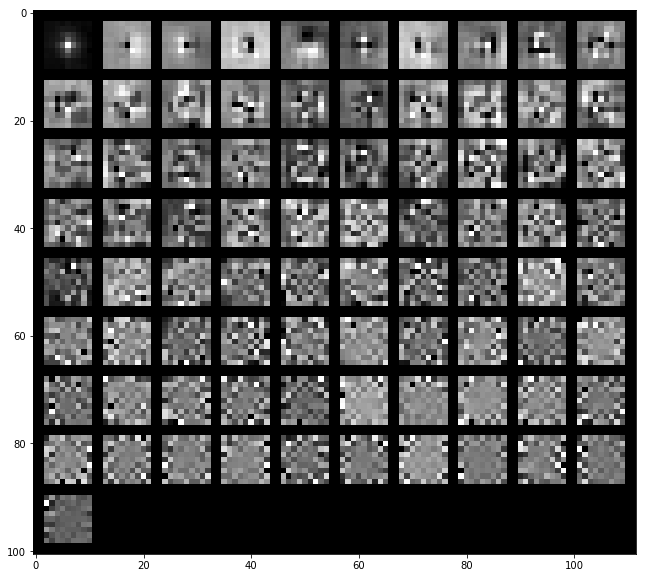

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1223/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15437561 0.26833046 0.33949239 0.39990563 0.44261978 0.48277941
 0.52011773 0.55599672 0.58957316 0.61746751 0.64170865 0.66340177
 0.6834377  0.70163413 0.71919986 0.73555585 0.75061752 0.76448977
 0.77776267 0.79066408]


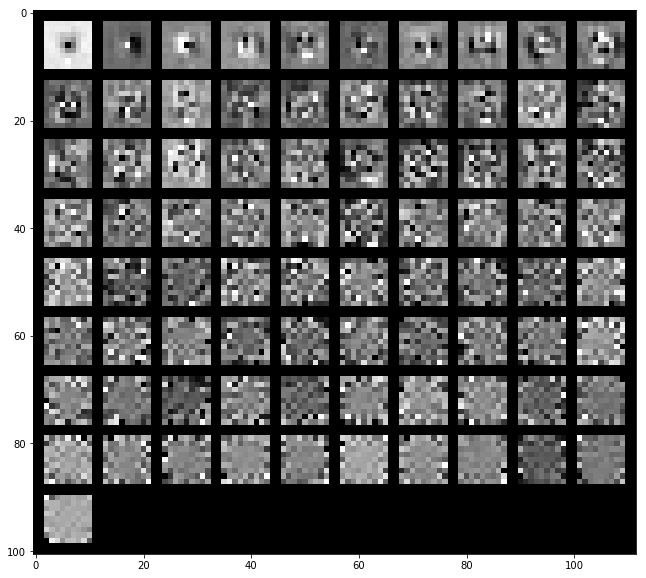

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13324845 0.24417124 0.31622694 0.37415088 0.42767552 0.47043884
 0.50695182 0.53811791 0.56730694 0.59213208 0.616309   0.63782274
 0.65731124 0.67557002 0.6931151  0.70996272 0.72530411 0.73953376
 0.7531658  0.76569356]


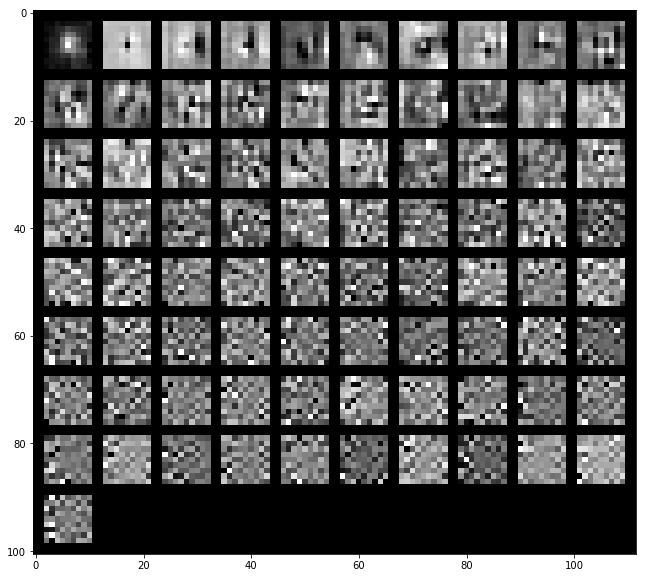

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13864382 0.24342398 0.31146664 0.36751739 0.41037987 0.44689119
 0.47905586 0.51068151 0.53960915 0.56663034 0.59003041 0.61117482
 0.63135682 0.65006238 0.66758762 0.68322344 0.69813478 0.71237274
 0.72530507 0.7377575 ]


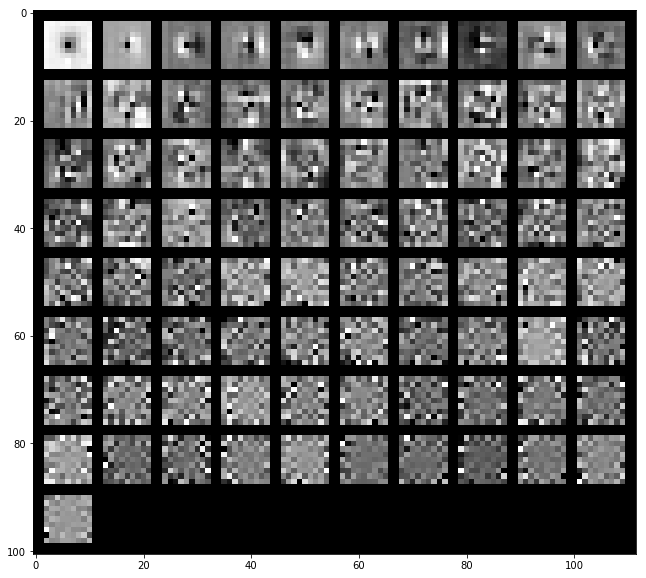

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1234/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1750087  0.2746211  0.35285033 0.40447187 0.44910832 0.49112503
 0.53021585 0.56489605 0.5947571  0.62179657 0.64486591 0.66721787
 0.68923969 0.70737563 0.72450147 0.74126249 0.7567631  0.77054023
 0.78371581 0.79610665]


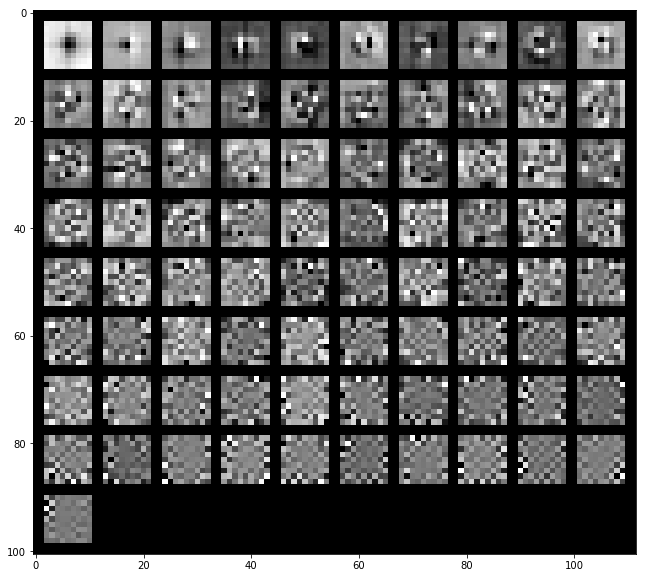

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19523599 0.27620945 0.34562182 0.40308367 0.45464261 0.50092211
 0.53569454 0.5674107  0.59574602 0.62076711 0.64322743 0.6638867
 0.68401048 0.70304675 0.72102642 0.73860001 0.75383747 0.76725297
 0.77986899 0.79215293]


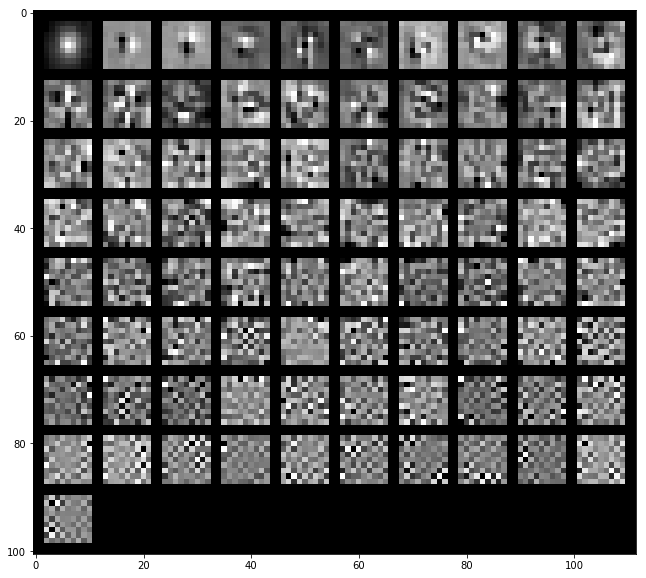

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19575702 0.27820465 0.34896041 0.40235489 0.44841658 0.48834193
 0.52513631 0.5567806  0.58433855 0.60819575 0.62940407 0.64886532
 0.66815748 0.68677271 0.70343467 0.71895644 0.73370023 0.74774746
 0.76046634 0.77301129]


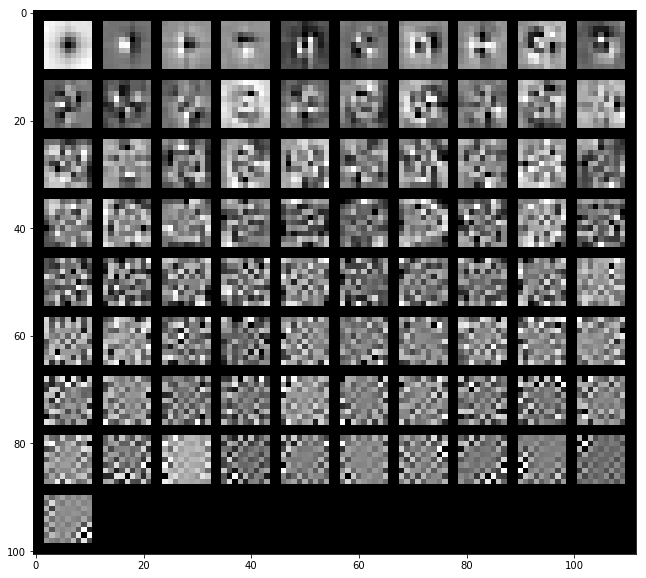

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1246/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1286114  0.20519699 0.26645824 0.31815439 0.36626291 0.41185206
 0.45212132 0.48871372 0.52012438 0.54736148 0.57226535 0.59510725
 0.61564577 0.63584087 0.65465429 0.67229844 0.6895056  0.70647389
 0.72224117 0.73671251]


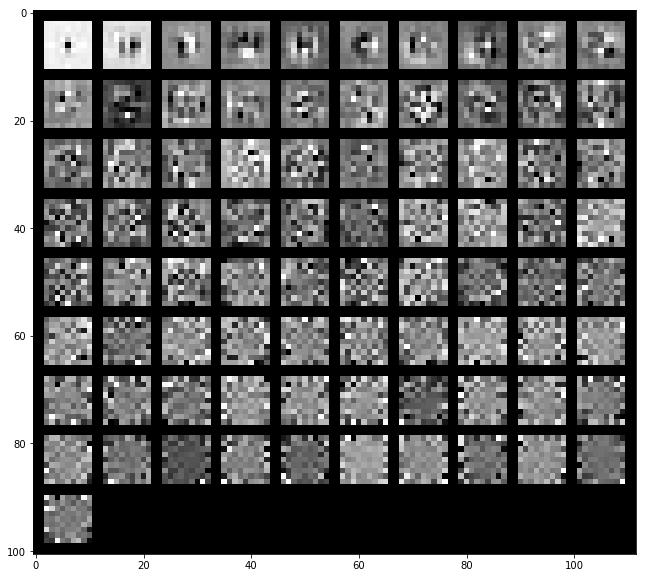

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17503065 0.2677506  0.33389328 0.38446562 0.42611819 0.4634069
 0.49806373 0.52814468 0.55549315 0.57976017 0.60119638 0.62195307
 0.64199848 0.66045826 0.67771484 0.69367543 0.70912665 0.72377156
 0.73771038 0.75024451]


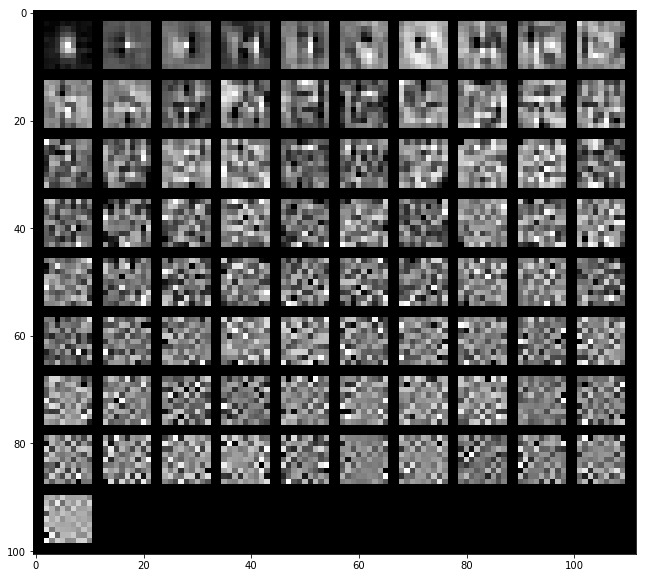

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13792619 0.2237974  0.28678182 0.33489139 0.37613315 0.41619528
 0.45299595 0.48473464 0.51262917 0.5375898  0.55976743 0.58010521
 0.59949648 0.61831184 0.63576674 0.65250795 0.66806716 0.68204363
 0.69580826 0.70898319]


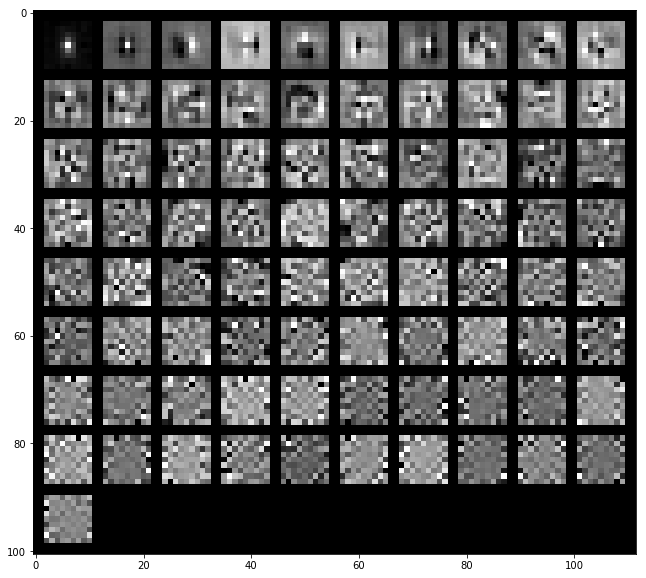

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1247/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13692665 0.22728531 0.29392863 0.34880427 0.39689525 0.44343698
 0.48332887 0.51989829 0.5517013  0.58056318 0.60763112 0.63100643
 0.65300262 0.67339398 0.69227191 0.71018842 0.72656411 0.74146509
 0.75601563 0.76977012]


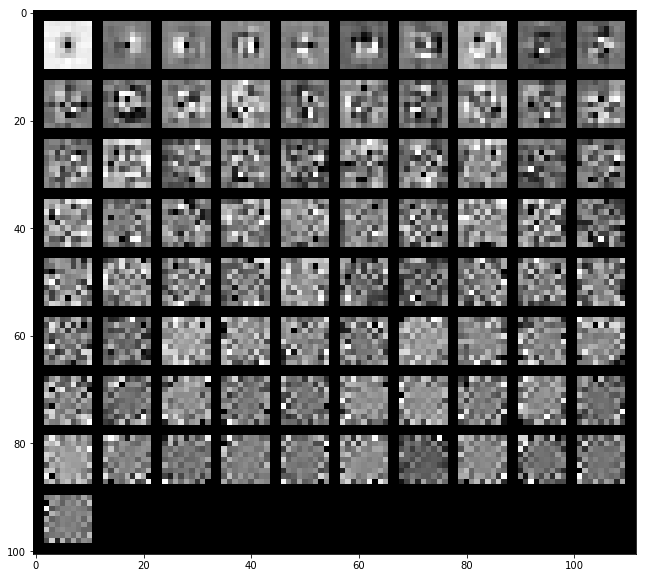

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17033892 0.25893625 0.33098947 0.393943   0.43914606 0.48055943
 0.51604453 0.54995276 0.57804801 0.60564881 0.62939213 0.65148843
 0.67338627 0.69228247 0.71060427 0.72688518 0.74156835 0.75515352
 0.76831452 0.78093757]


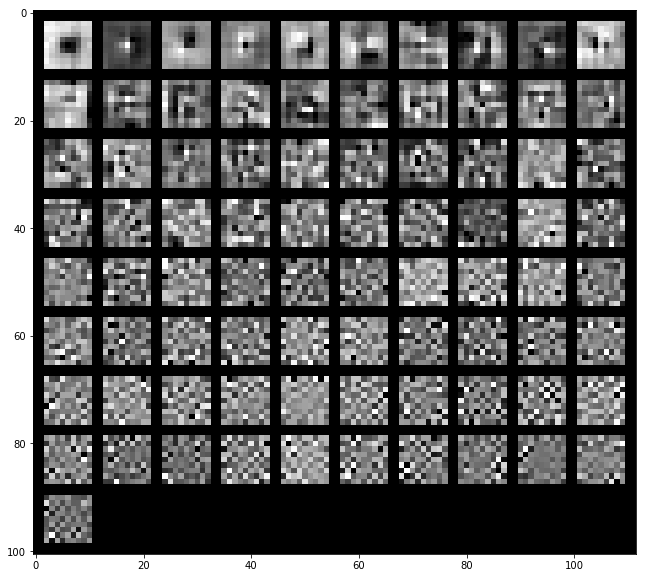

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14301186 0.2327177  0.29819507 0.34850335 0.39392916 0.4327849
 0.46556582 0.49781094 0.52674463 0.55418562 0.5791358  0.6005167
 0.62134724 0.63997428 0.65709136 0.67330987 0.68927808 0.70447643
 0.71933642 0.73268212]


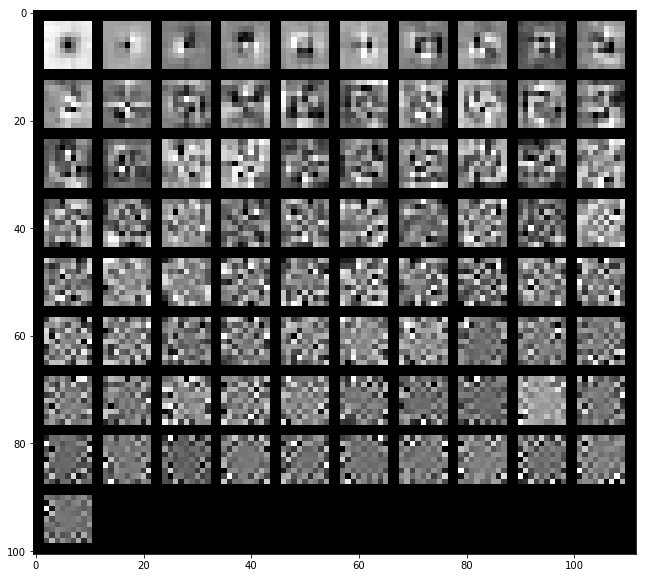

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1354/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13321774 0.21046227 0.27147516 0.32545536 0.37367186 0.41776903
 0.45796634 0.49504346 0.52946376 0.55965267 0.58767334 0.61465263
 0.63950927 0.66142773 0.68134236 0.70074821 0.71849796 0.73570693
 0.75193717 0.76706091]


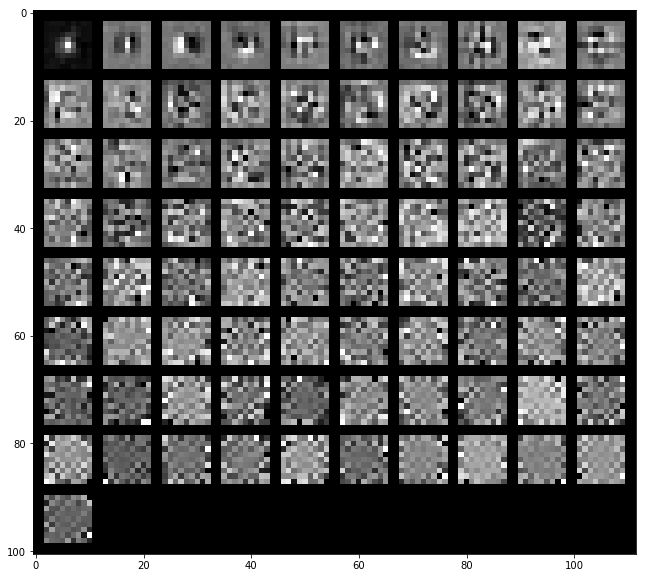

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12539571 0.21330325 0.27458737 0.32886847 0.37647186 0.42180947
 0.45657279 0.48745774 0.51601922 0.54243091 0.56691364 0.58989509
 0.61099423 0.63100137 0.65043368 0.66797754 0.68487668 0.700338
 0.71527841 0.72960184]


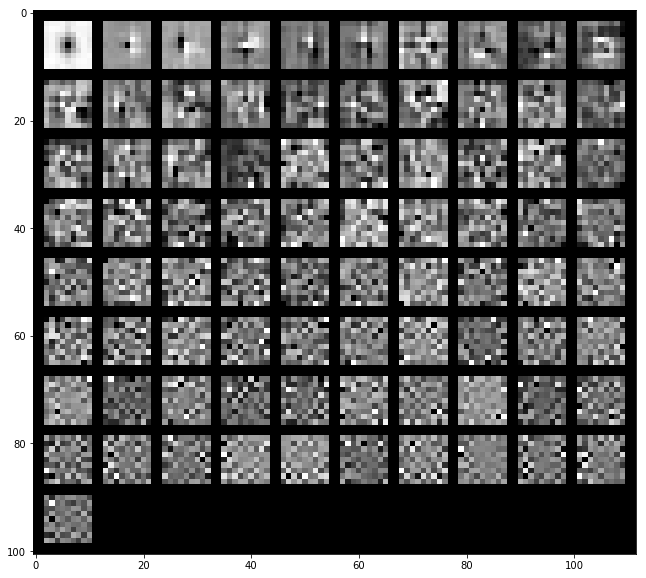

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12717654 0.20540216 0.26496704 0.31589677 0.35848753 0.3986641
 0.43552207 0.4664973  0.49497014 0.52261145 0.5469221  0.56973971
 0.5905501  0.60993076 0.62879669 0.64644263 0.66370107 0.67992788
 0.69474837 0.70892662]


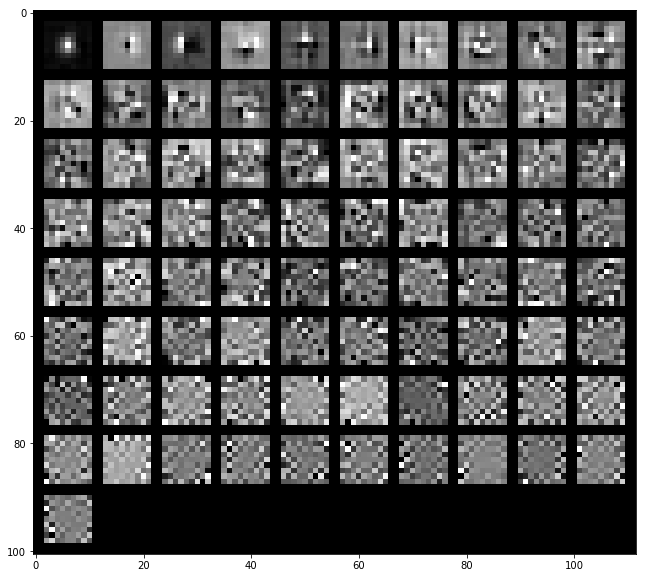

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1355/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.24323073 0.32863351 0.40546019 0.46272465 0.51352816 0.55336722
 0.58935246 0.61927657 0.64781284 0.67437883 0.69859401 0.71870287
 0.73727957 0.75492481 0.77076048 0.78481131 0.79803059 0.81029348
 0.82155133 0.83154324]


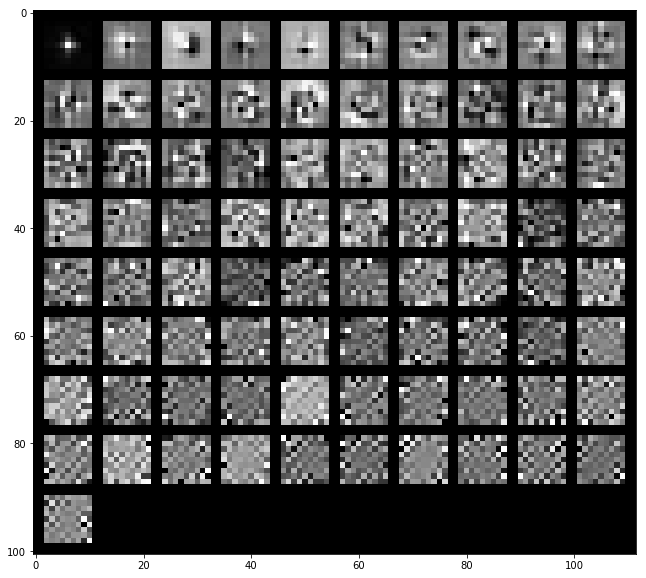

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.2140605  0.33829858 0.40154956 0.45759001 0.49960983 0.53868408
 0.56957968 0.59675047 0.6212873  0.64379853 0.6647805  0.68450393
 0.70330655 0.72021235 0.73556731 0.75020812 0.76453612 0.77804868
 0.79101122 0.80221696]


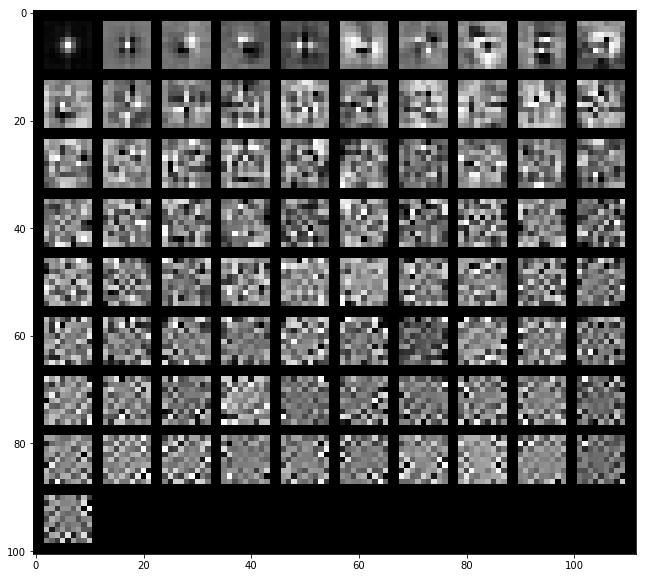

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22224979 0.32694091 0.39162167 0.44701601 0.49262491 0.53093564
 0.56172463 0.58898386 0.61477187 0.63841766 0.66067957 0.68074221
 0.6993323  0.71526353 0.73033269 0.74480602 0.75753755 0.76951401
 0.78138346 0.79263015]


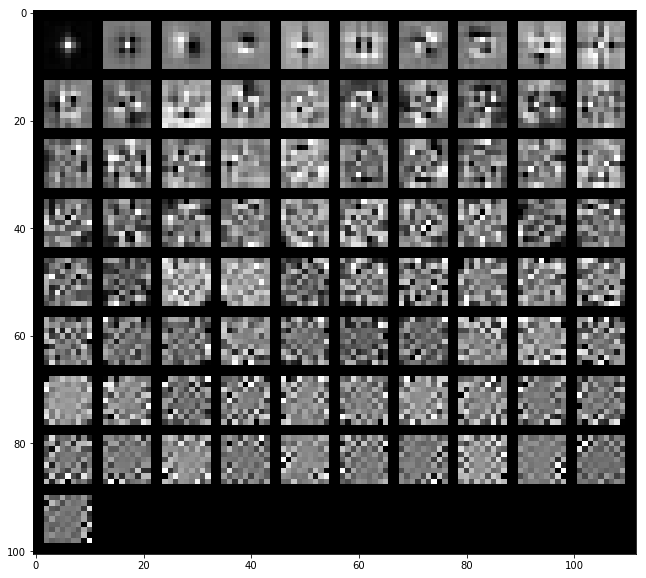

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1367/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14813237 0.25234365 0.33118879 0.38499355 0.43476283 0.48086836
 0.51870106 0.552402   0.57937566 0.60595251 0.63148411 0.65445722
 0.67661181 0.69637765 0.7154095  0.73420223 0.75079453 0.76578599
 0.77969861 0.79253402]


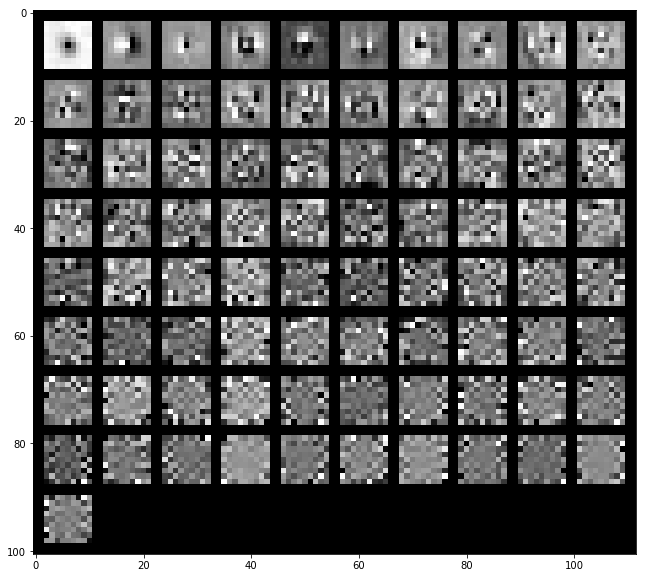

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16332442 0.27738017 0.34837184 0.40647533 0.45825484 0.49830539
 0.53379255 0.56575178 0.5931627  0.61693049 0.63990955 0.66088704
 0.68112918 0.69889613 0.71605838 0.73162887 0.7461811  0.76014234
 0.77265549 0.78416216]


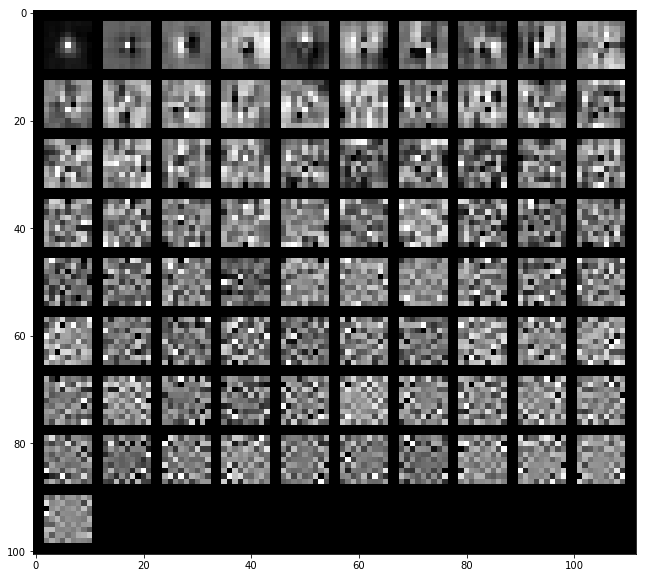

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15475199 0.25392375 0.33594457 0.3891494  0.43498542 0.47453404
 0.5076375  0.53778025 0.56422463 0.58867691 0.61097527 0.6319183
 0.65149448 0.67010201 0.68686793 0.70257076 0.71762553 0.73210534
 0.74534588 0.75816374]


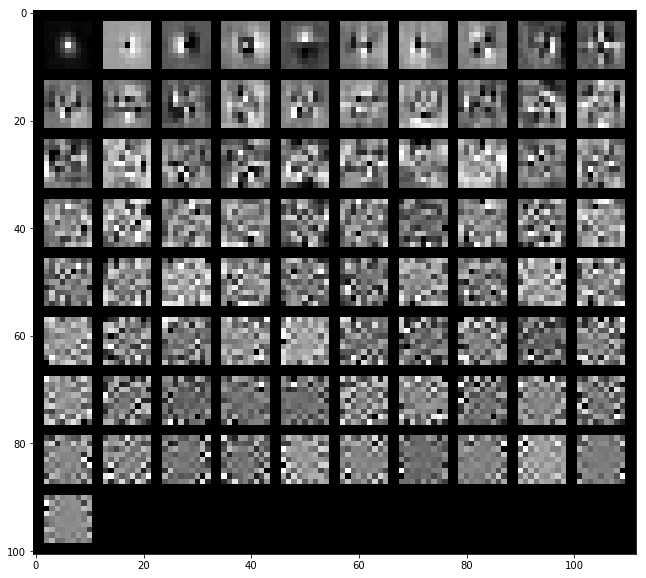

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1378/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1822314  0.26967256 0.34366171 0.39947861 0.4448765  0.48799689
 0.52551737 0.55887665 0.59113635 0.62276431 0.65074613 0.67300534
 0.69435711 0.71353702 0.73114177 0.74678419 0.76136323 0.77569308
 0.7881997  0.80042102]


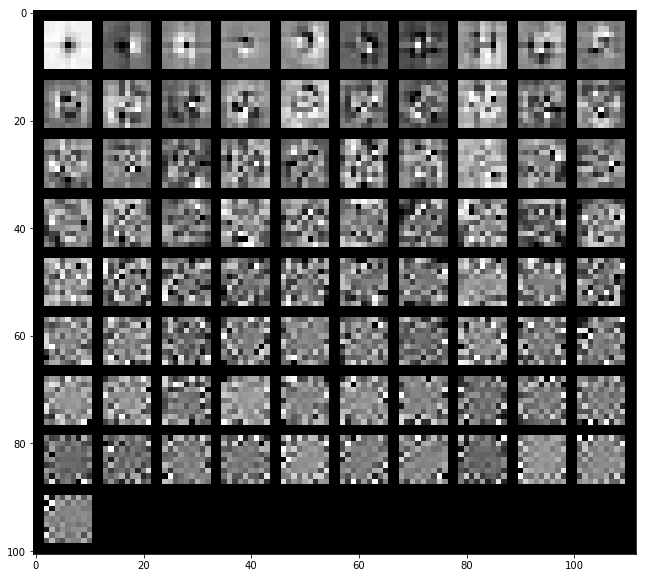

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16505444 0.25307084 0.32678331 0.39696227 0.45508036 0.49725595
 0.53347619 0.56466628 0.59559679 0.62340814 0.64763043 0.67070202
 0.69050367 0.70924199 0.72518523 0.74047597 0.7544651  0.76774284
 0.78030443 0.79144383]


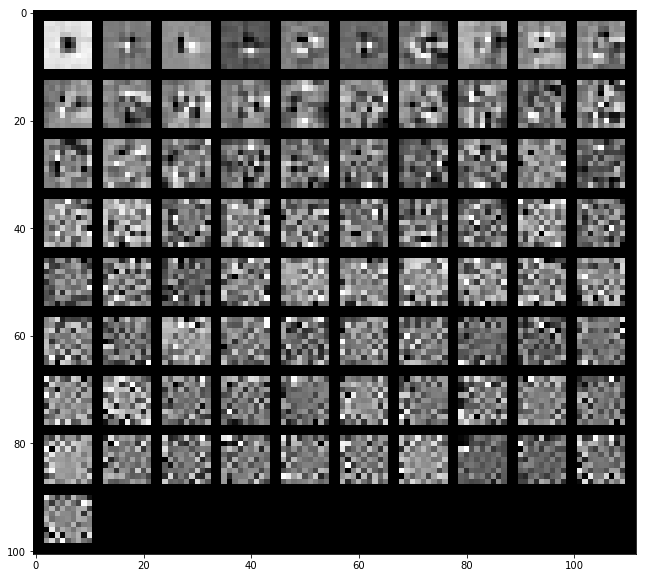

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17445317 0.25623669 0.32778871 0.38673576 0.43515682 0.4761094
 0.51201785 0.54603068 0.5757243  0.60281845 0.62566572 0.64806457
 0.66926382 0.68792537 0.70475884 0.71922513 0.73293606 0.74597824
 0.75826287 0.77009064]


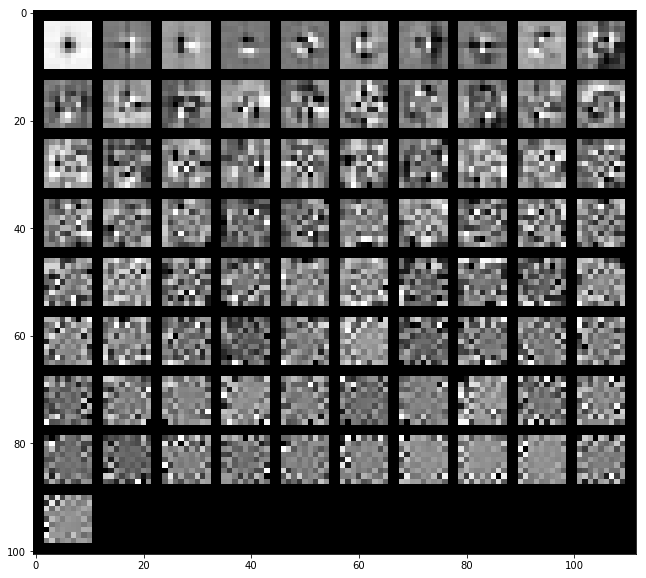

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1379/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15407735 0.24131349 0.31279842 0.37033027 0.4193307  0.46531814
 0.50881488 0.54753693 0.58042791 0.61005104 0.63878748 0.66475742
 0.68835067 0.70916791 0.72698139 0.74360881 0.75938096 0.77393025
 0.78743447 0.80048748]


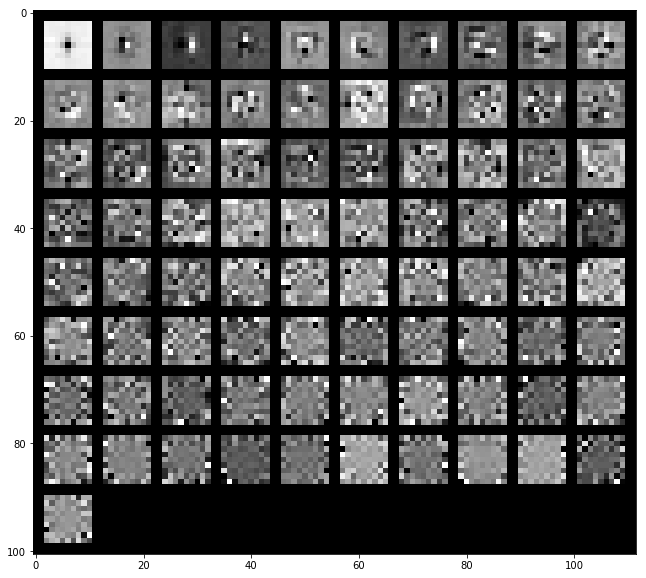

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.37806706 0.45488743 0.499548   0.53723731 0.56975029 0.5993328
 0.62801365 0.65435556 0.67689913 0.69660843 0.71393293 0.72965674
 0.74499833 0.75861955 0.77164396 0.7829927  0.79417046 0.80513198
 0.81570806 0.82520667]


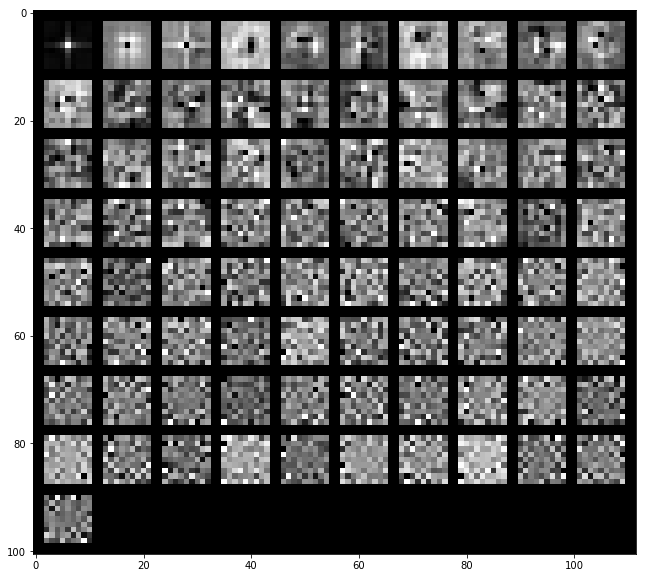

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.26565489 0.34230975 0.39391508 0.43501585 0.47262377 0.5064227
 0.5388942  0.56846206 0.59713129 0.62136319 0.64336187 0.66429338
 0.6831771  0.70027296 0.71590128 0.7308222  0.74420694 0.75632389
 0.76774353 0.77866732]


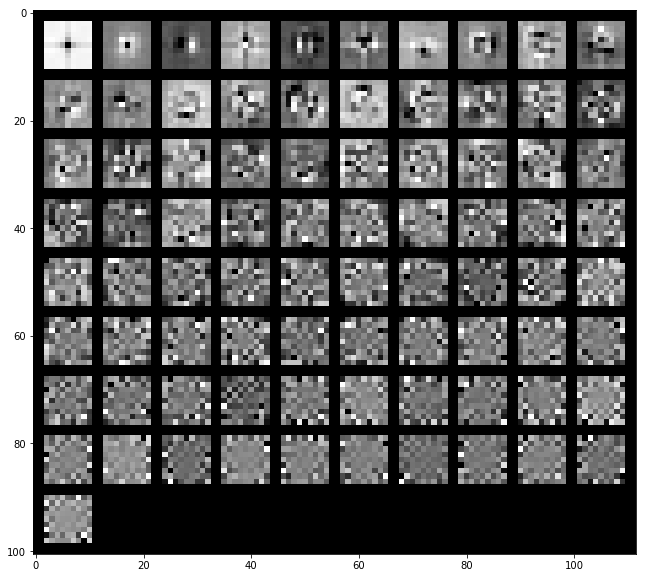

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1390/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16310891 0.26514885 0.34126142 0.39640167 0.4479798  0.49858845
 0.53902636 0.57057728 0.60100356 0.62574325 0.65013608 0.67319878
 0.69368584 0.71304171 0.73031479 0.74610186 0.76146537 0.77494047
 0.78769112 0.79997867]


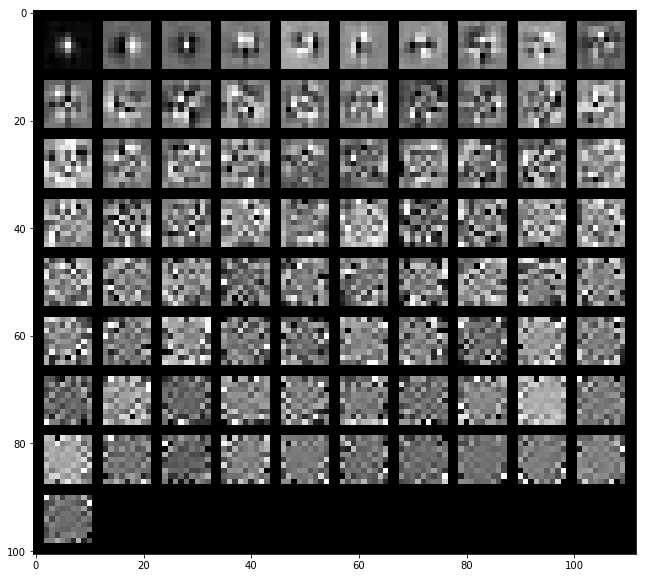

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21682347 0.31479018 0.40821625 0.4616944  0.51301215 0.55241927
 0.58967665 0.61929009 0.64427753 0.66606313 0.68610011 0.7045217
 0.72140814 0.73736834 0.75180895 0.76543362 0.77753146 0.78910221
 0.79998705 0.81030756]


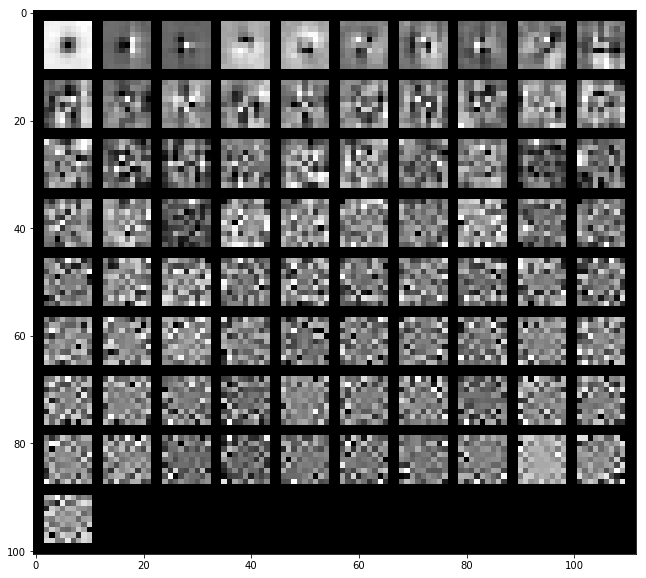

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18285381 0.2807867  0.36687254 0.41753253 0.46439763 0.50569647
 0.5423728  0.57622764 0.60047637 0.62227253 0.6437055  0.6640036
 0.68199185 0.69939069 0.71583616 0.73065696 0.74342324 0.75525263
 0.76671351 0.77750151]


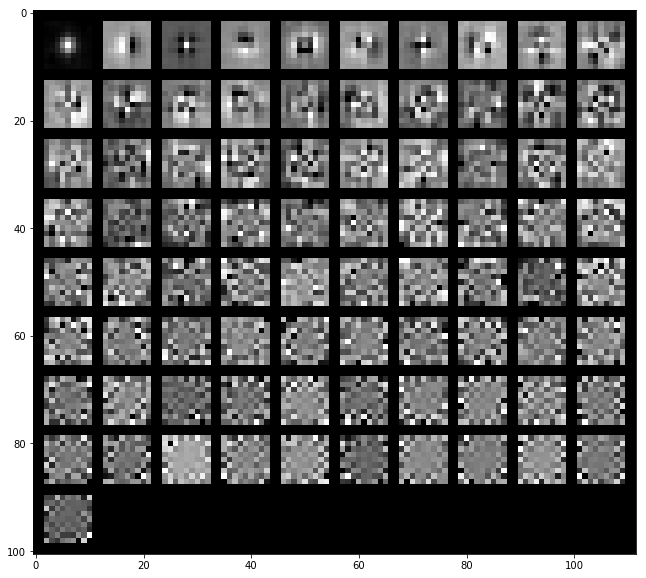

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1402/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17041119 0.26674054 0.34240624 0.40053668 0.45234194 0.49588683
 0.53699902 0.5701285  0.59752366 0.62197738 0.64536542 0.66705628
 0.68721938 0.70551243 0.72347902 0.7401739  0.75582317 0.77024297
 0.78325403 0.79530758]


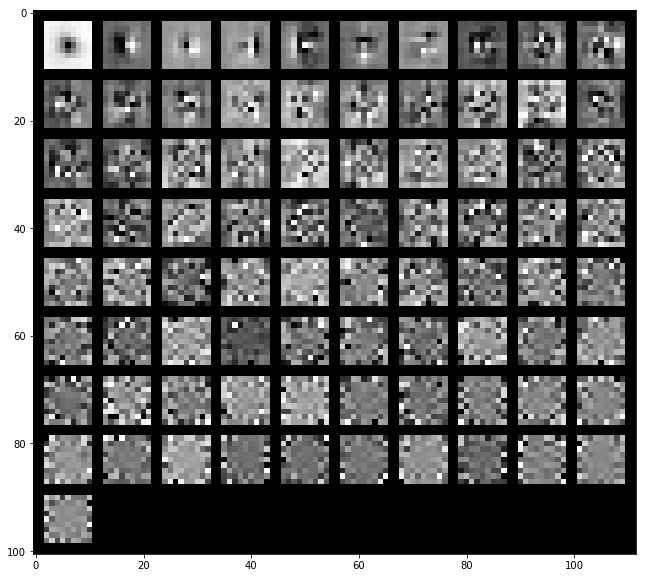

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18415257 0.28579889 0.36428542 0.41491248 0.45893842 0.50056975
 0.53823053 0.57185603 0.60014035 0.62485825 0.64840682 0.6706807
 0.69097903 0.71012279 0.72725809 0.74392256 0.75904686 0.77234672
 0.78508971 0.79739623]


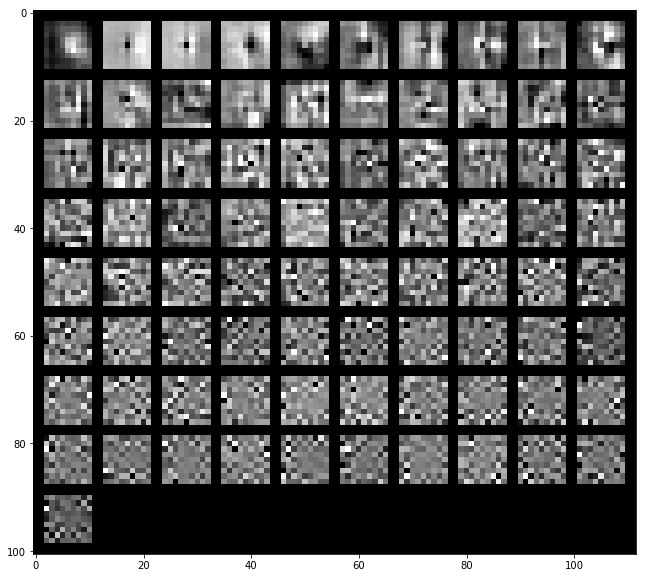

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16377308 0.25327027 0.32700064 0.38647885 0.42805387 0.467721
 0.50445396 0.5346023  0.56287133 0.58842341 0.61327988 0.63574919
 0.65548965 0.67281768 0.68963687 0.70555376 0.72000895 0.73394229
 0.74775111 0.76061171]


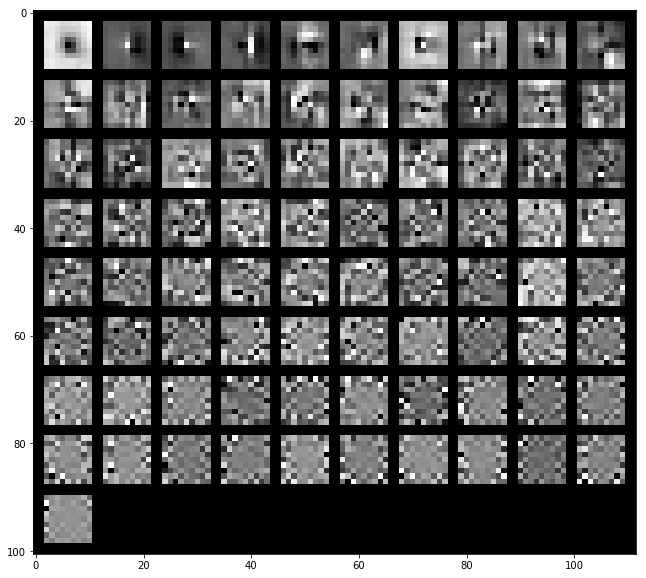

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1403/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13503847 0.20827805 0.2751627  0.33474395 0.38445145 0.42814832
 0.4680807  0.50502225 0.53486292 0.56158308 0.58776863 0.61290224
 0.6376549  0.65962019 0.68052078 0.6991876  0.71666656 0.7323375
 0.74709251 0.76049141]


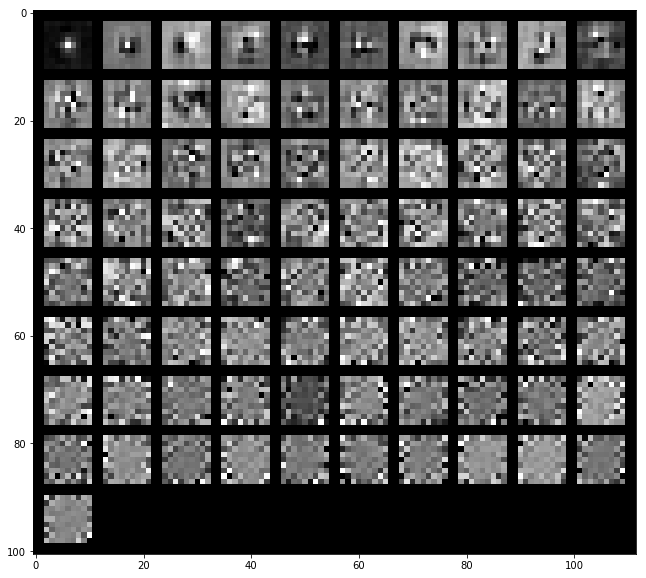

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21323775 0.29946161 0.3587954  0.41170648 0.46046892 0.50085016
 0.53633936 0.56730102 0.59548192 0.62076374 0.64485964 0.6659482
 0.6849589  0.70327337 0.71910403 0.73420322 0.74889111 0.76109072
 0.77266129 0.78398735]


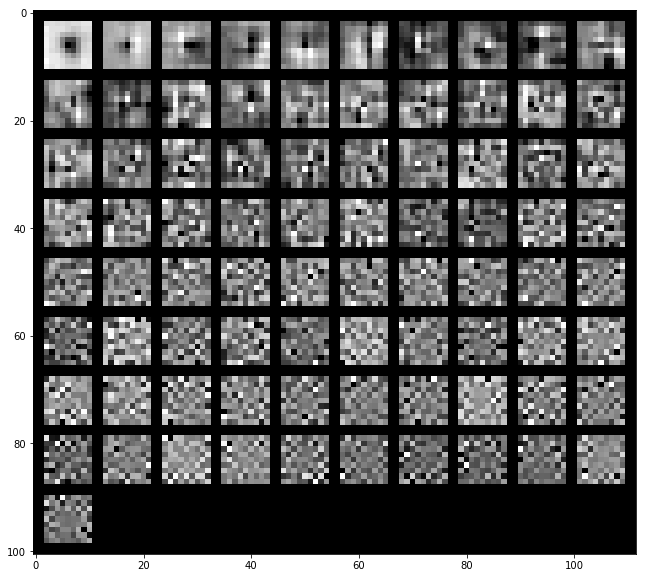

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16184384 0.24149852 0.29927508 0.35399792 0.39462589 0.43133899
 0.46670779 0.49699252 0.52628791 0.55294049 0.57660652 0.59836363
 0.6192738  0.63864254 0.65670116 0.67339241 0.68922132 0.70383192
 0.7179526  0.73083117]


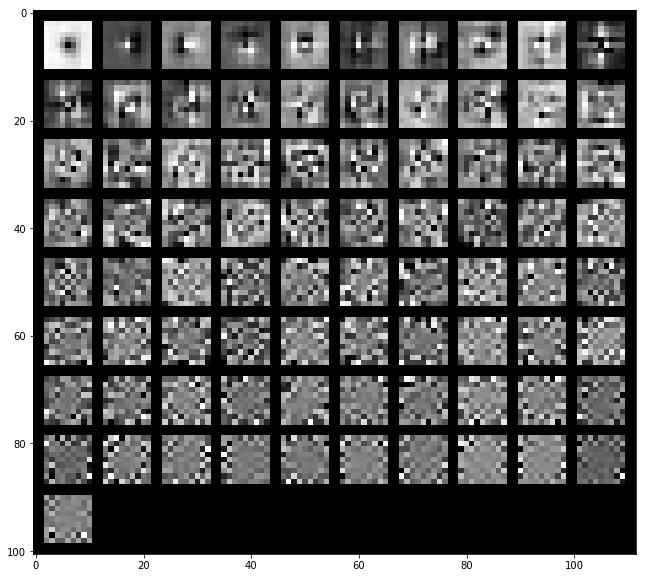

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1414/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14707489 0.22748854 0.2952048  0.35140371 0.39360607 0.4323802
 0.46705215 0.49940682 0.52823258 0.55639703 0.58270698 0.60786574
 0.63231402 0.65293437 0.67283586 0.69176097 0.70909491 0.72486647
 0.74027458 0.75453977]


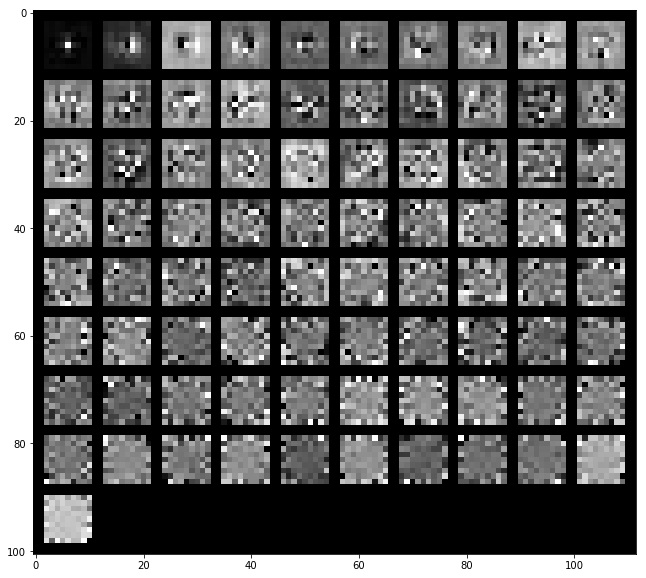

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18860714 0.30962013 0.37403194 0.42729623 0.47000344 0.50582012
 0.53339181 0.56075767 0.58501302 0.60787414 0.62910723 0.64794679
 0.66657316 0.68384376 0.69997174 0.71552771 0.72948522 0.74323516
 0.75648569 0.76892532]


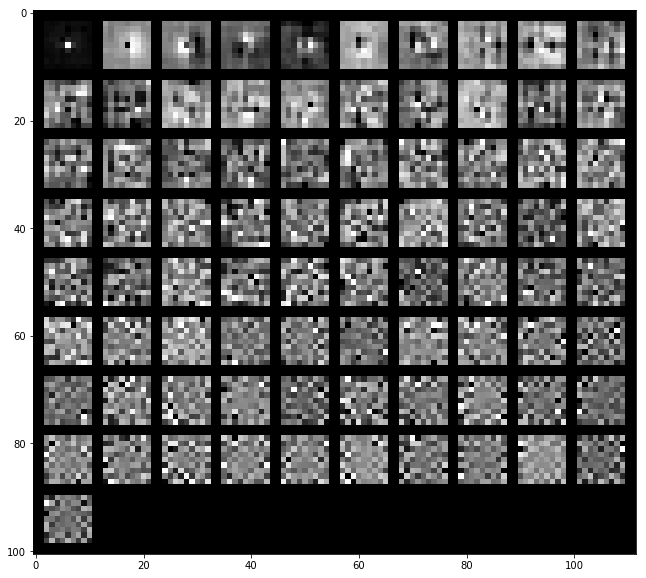

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17055408 0.26510026 0.32553783 0.3743816  0.4129942  0.44665382
 0.47614525 0.50291367 0.52862065 0.55099272 0.57232238 0.59285839
 0.61250346 0.63150794 0.64955155 0.66579642 0.68141401 0.69588561
 0.70956691 0.72275886]


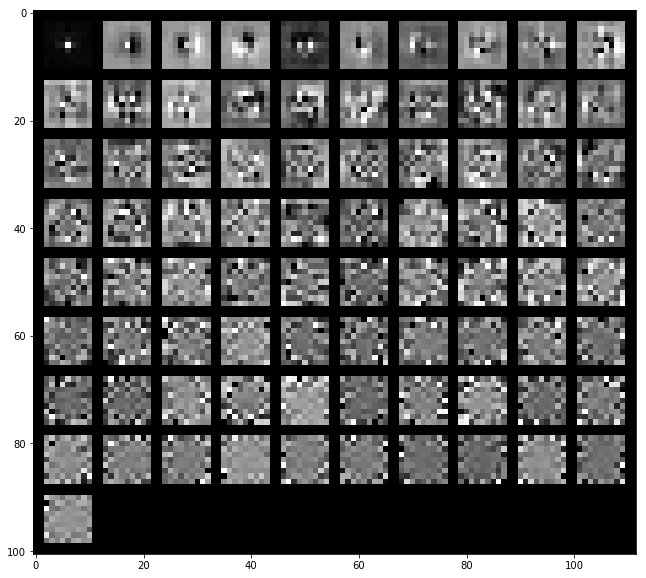

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1415/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19837568 0.28424965 0.34481382 0.39384797 0.43951467 0.47814275
 0.51438654 0.54669223 0.57833917 0.60827631 0.6324547  0.65585271
 0.67743707 0.69841017 0.71722024 0.73351113 0.7488032  0.76309504
 0.77716302 0.79012657]


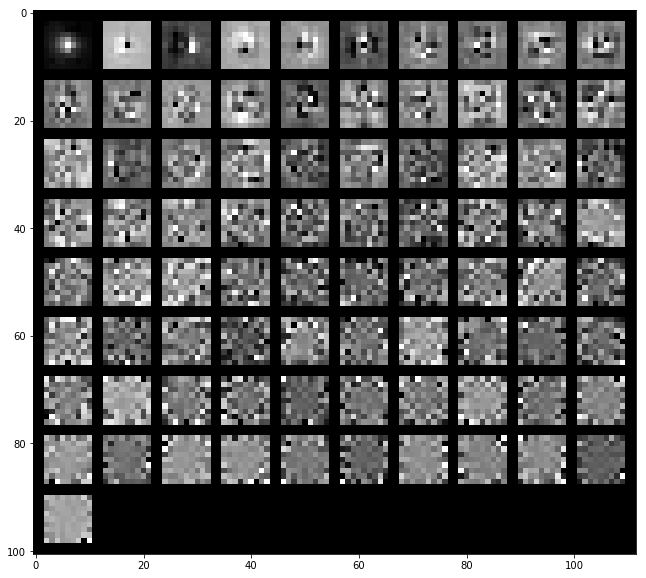

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18385586 0.32608358 0.40242297 0.45378872 0.49671598 0.53624359
 0.57052303 0.60111735 0.62833077 0.65440562 0.67789747 0.69739995
 0.71502697 0.73207658 0.7476654  0.76258393 0.77651717 0.78926229
 0.80147586 0.81218113]


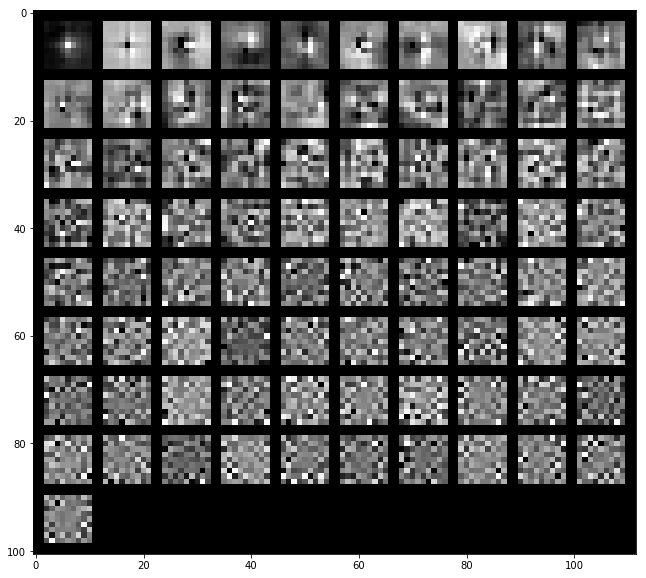

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18323783 0.28768355 0.35582298 0.40083019 0.44409345 0.48082344
 0.51347622 0.54154026 0.56773958 0.59331373 0.6161126  0.63779446
 0.65703227 0.67521974 0.6920184  0.70849839 0.72340309 0.73706507
 0.74995114 0.76177633]


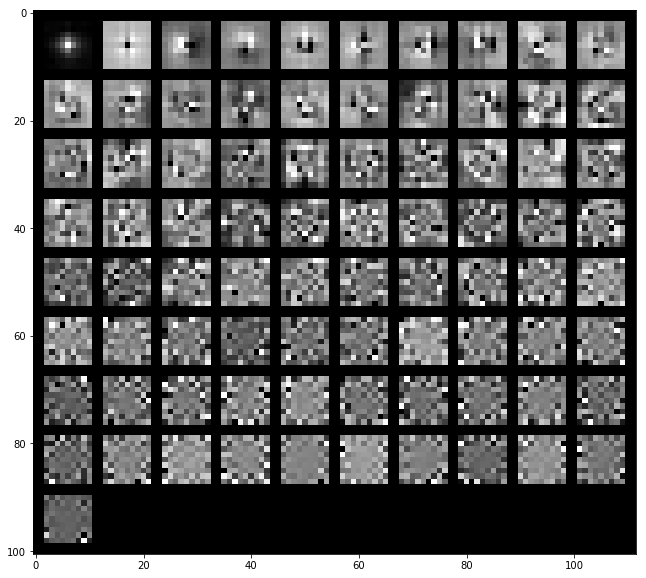

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1427/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1374958  0.21599148 0.28047818 0.33457993 0.37921299 0.42197052
 0.46305974 0.49837105 0.53162012 0.56212613 0.59092124 0.61772648
 0.64204556 0.66390067 0.68564183 0.70445801 0.72300621 0.74047233
 0.75620945 0.77056634]


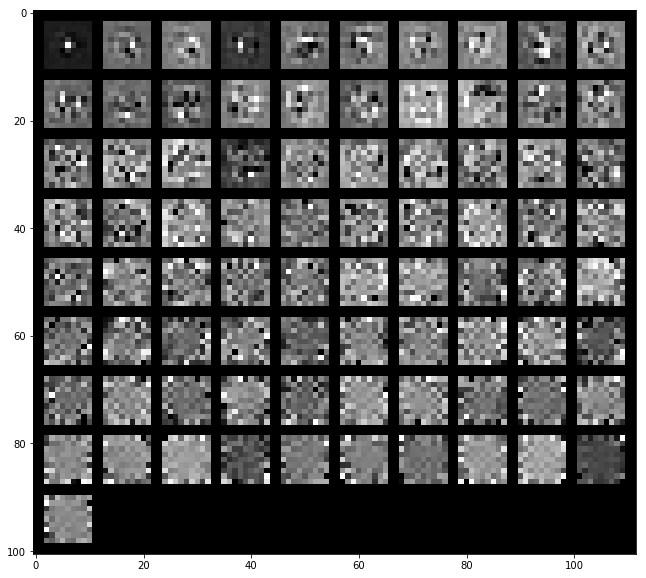

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19543837 0.27334504 0.32321936 0.36147182 0.39790414 0.43292765
 0.46406463 0.49461872 0.52374773 0.54892146 0.5729672  0.5955091
 0.61614686 0.63500133 0.65343504 0.67129849 0.68787838 0.70351949
 0.7183701  0.73241826]


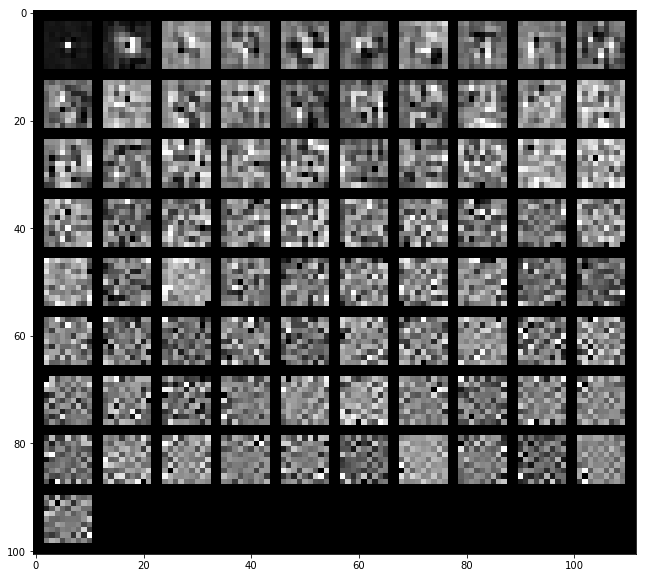

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16759913 0.22770931 0.27698229 0.32118335 0.36080683 0.39569903
 0.42811812 0.45948948 0.48651514 0.51204916 0.53664071 0.56048986
 0.58360232 0.60497689 0.62411883 0.64211506 0.65936752 0.67503289
 0.69044129 0.70520929]


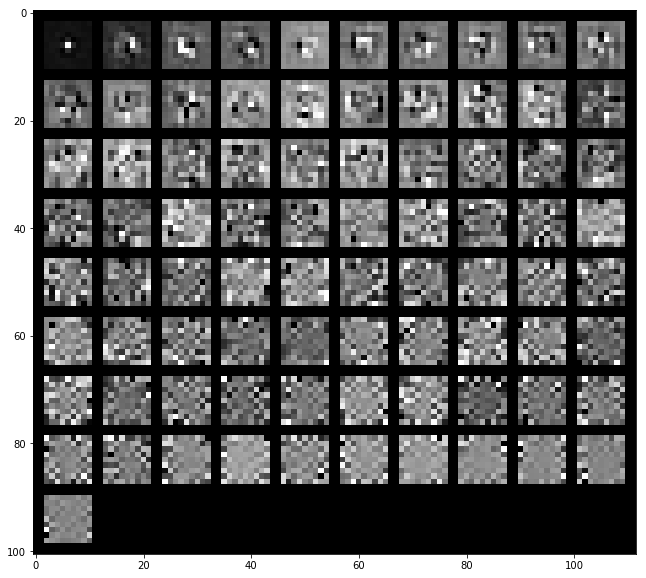

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1438/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16513055 0.26294531 0.32915045 0.37914464 0.42545112 0.46544321
 0.50304613 0.53509707 0.56239777 0.58719541 0.61030199 0.63314293
 0.65279157 0.67190775 0.690334   0.70709515 0.72244425 0.73683296
 0.75075969 0.76390399]


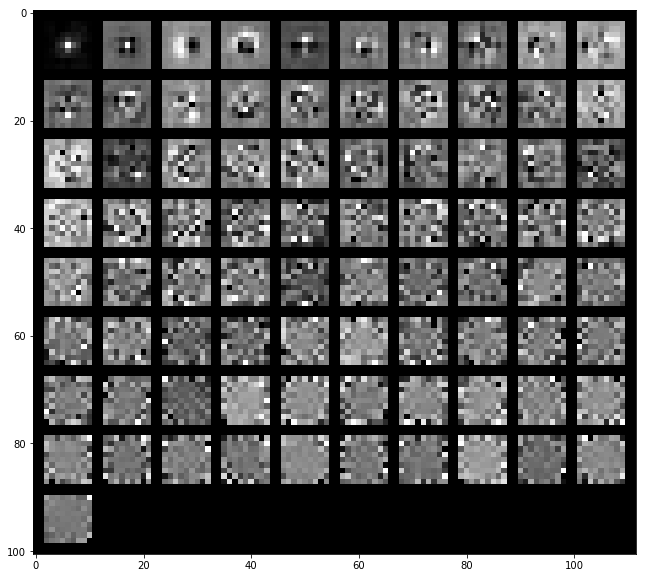

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21350357 0.30163615 0.36873351 0.41517535 0.45673055 0.49539886
 0.52905518 0.55638316 0.58110806 0.60417721 0.62563494 0.64650364
 0.6666483  0.68450359 0.70110956 0.71629094 0.73009791 0.74251585
 0.75464107 0.76630664]


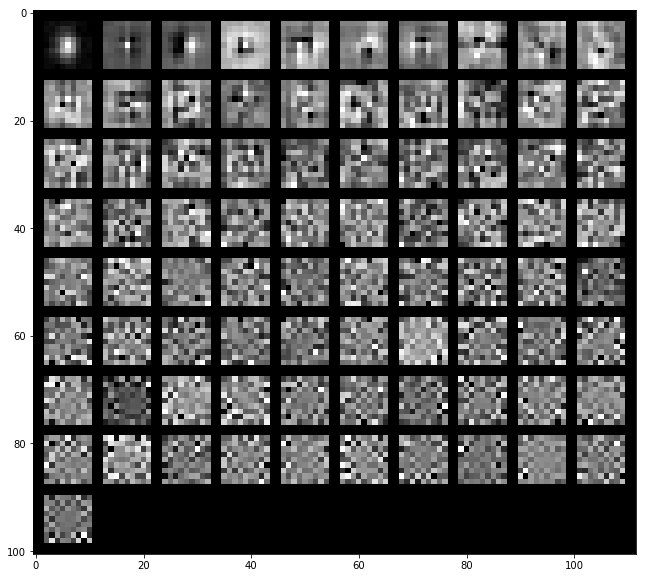

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18217746 0.27596112 0.34120971 0.38852172 0.42818823 0.46435795
 0.49771899 0.52491761 0.54984902 0.57355098 0.59365475 0.61313918
 0.63175053 0.64953443 0.66600943 0.6817392  0.69623871 0.70943636
 0.7219736  0.7343517 ]


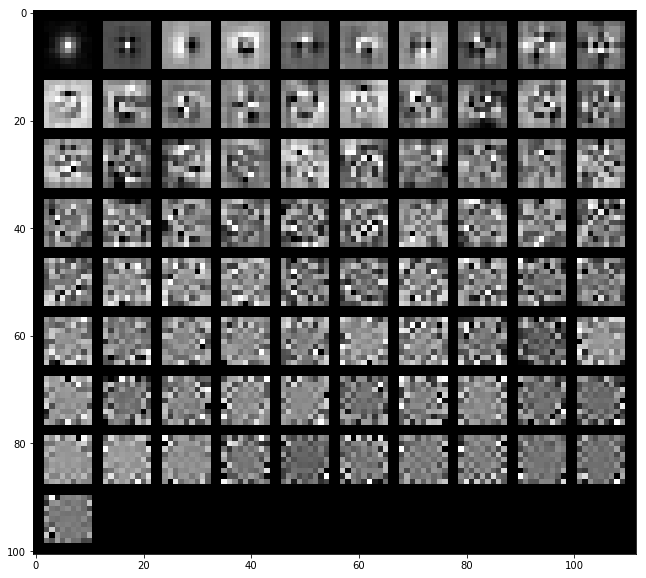

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1439/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12517207 0.19814221 0.25918476 0.30981848 0.35938143 0.40289326
 0.43869398 0.4734906  0.50719064 0.53638467 0.56278515 0.58908109
 0.61380149 0.63544857 0.65603421 0.67539311 0.69322549 0.71017913
 0.72569036 0.7400031 ]


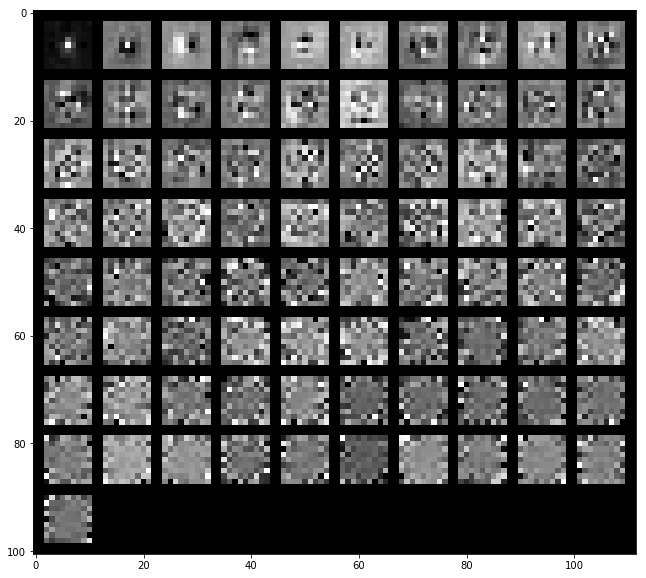

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16877543 0.2627992  0.33275975 0.38117265 0.42176802 0.45847271
 0.4920233  0.52338948 0.5531591  0.58073448 0.60634345 0.62926224
 0.65038843 0.67014628 0.68793657 0.70509395 0.72132785 0.73549246
 0.74886737 0.76084061]


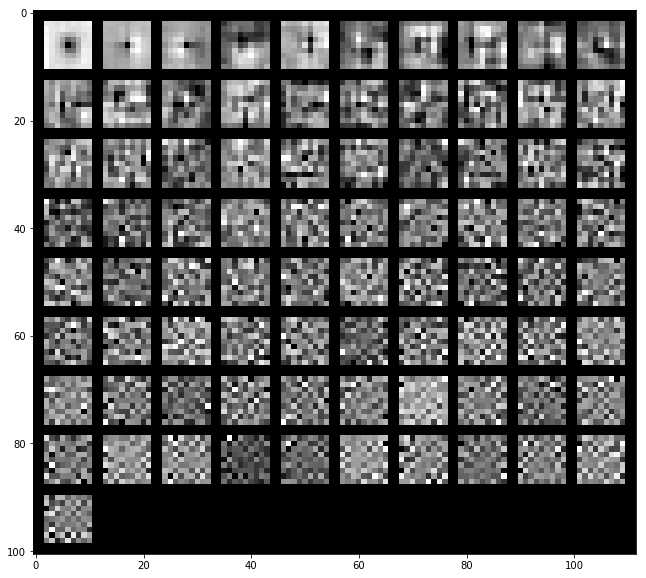

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13835101 0.21849296 0.2812014  0.32795721 0.36765318 0.4027092
 0.43420533 0.46391984 0.4920801  0.51721541 0.54220747 0.56455942
 0.58541036 0.60502082 0.62404249 0.64212304 0.65888144 0.6749516
 0.68901338 0.70254167]


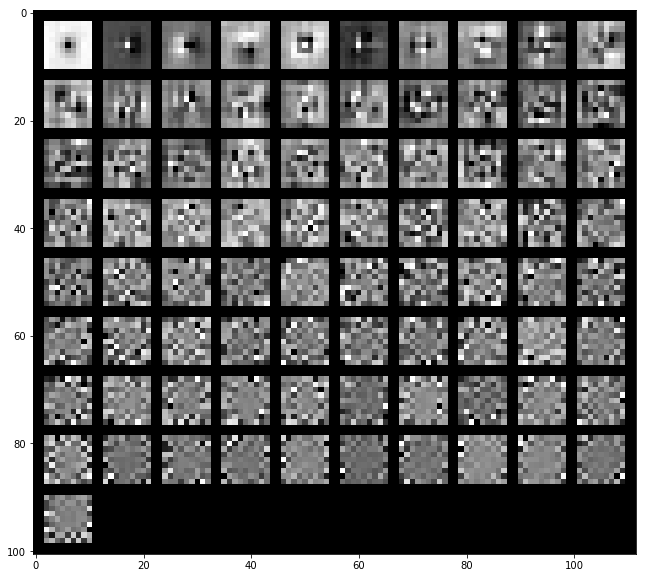

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1546/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18717234 0.28418966 0.37435792 0.44449275 0.49608436 0.54168241
 0.58326865 0.62286623 0.64993763 0.67464106 0.69767842 0.71763424
 0.73594499 0.75396192 0.76842466 0.7821152  0.79499532 0.80698888
 0.81838956 0.82812974]


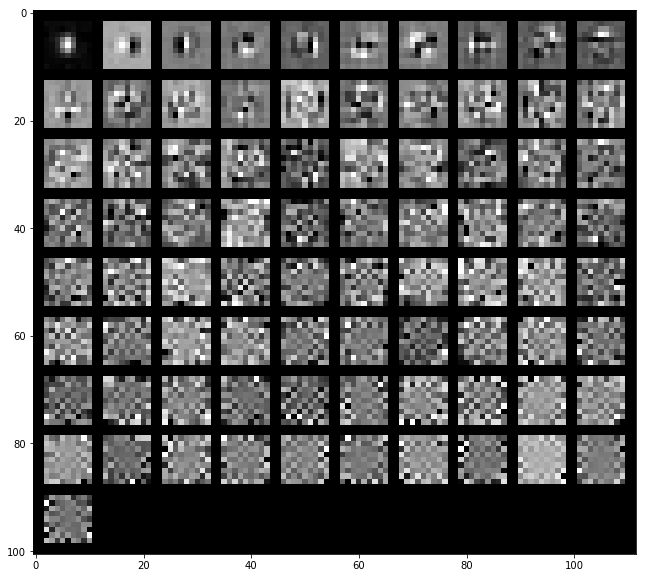

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23173774 0.34102975 0.44044772 0.50421703 0.54713238 0.58897382
 0.62406739 0.65679994 0.68103461 0.7034191  0.72140824 0.73839516
 0.75479558 0.76893867 0.78222434 0.79485688 0.80633374 0.81701294
 0.82721287 0.83651099]


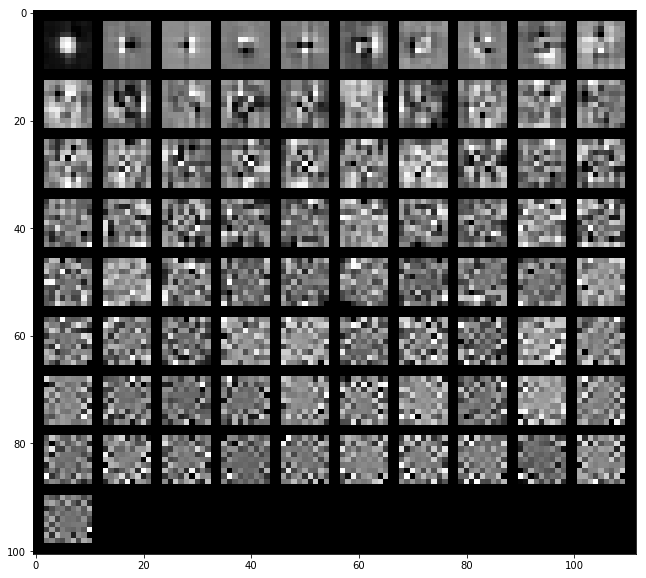

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20538596 0.30283127 0.39427963 0.45468581 0.49957284 0.54236124
 0.58223839 0.61725242 0.64116576 0.66395646 0.68455374 0.70391469
 0.72103436 0.7379294  0.75297963 0.76736785 0.77940825 0.78965453
 0.79969239 0.80956707]


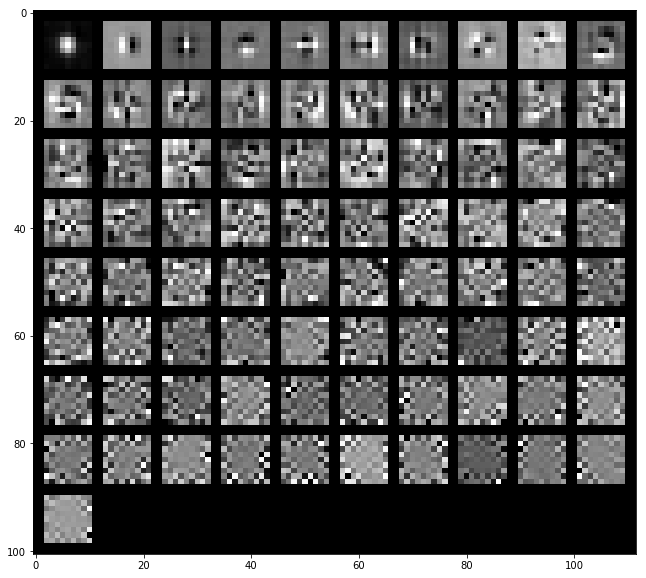

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1558/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13060328 0.20917664 0.2750312  0.33172043 0.3822532  0.42743754
 0.46728184 0.50169736 0.5341563  0.5625274  0.58809755 0.61176661
 0.63370279 0.6552752  0.67566197 0.69409142 0.71091549 0.72673571
 0.73976952 0.75261605]


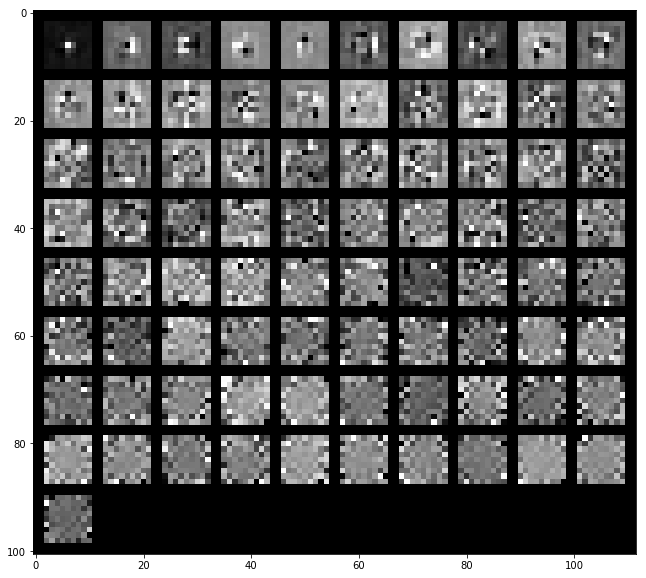

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19054758 0.30811055 0.38374388 0.44166189 0.49636503 0.5310581
 0.56383637 0.59617024 0.62351379 0.6463657  0.66749011 0.68665496
 0.70486225 0.72209256 0.73795437 0.75340026 0.76790842 0.78100836
 0.79337931 0.80493644]


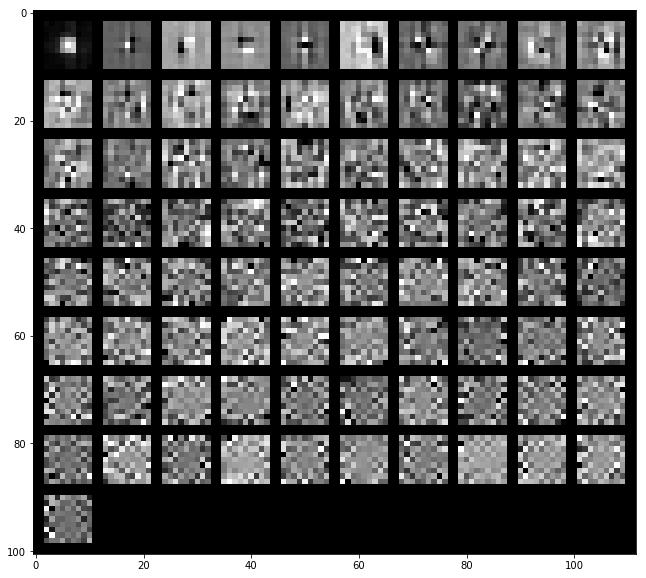

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15148375 0.25951534 0.32680728 0.380377   0.4284736  0.46739438
 0.5020904  0.5333136  0.56152732 0.58500436 0.60819576 0.62964332
 0.64876981 0.66639643 0.68314099 0.69866659 0.71404616 0.72864972
 0.74268344 0.75579006]


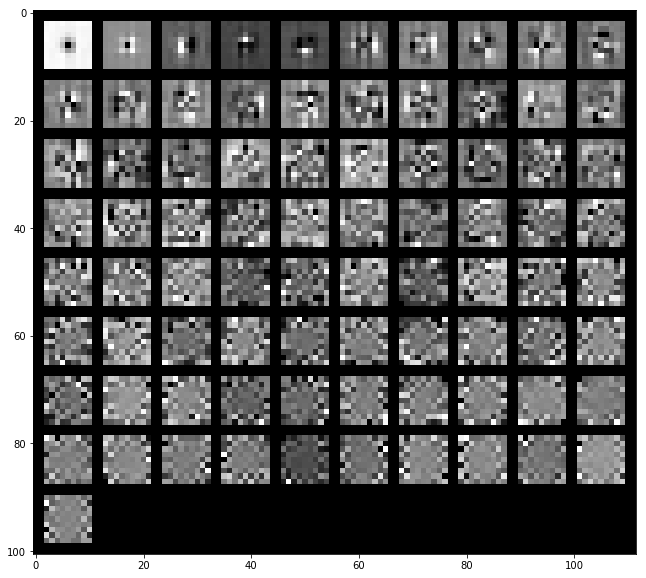

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1559/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15697431 0.24639594 0.3082619  0.36551364 0.40924493 0.4498103
 0.4874722  0.5211083  0.54828355 0.57342615 0.59756318 0.62122573
 0.64183156 0.66087097 0.67857827 0.69492471 0.71041323 0.72530062
 0.73932277 0.75290818]


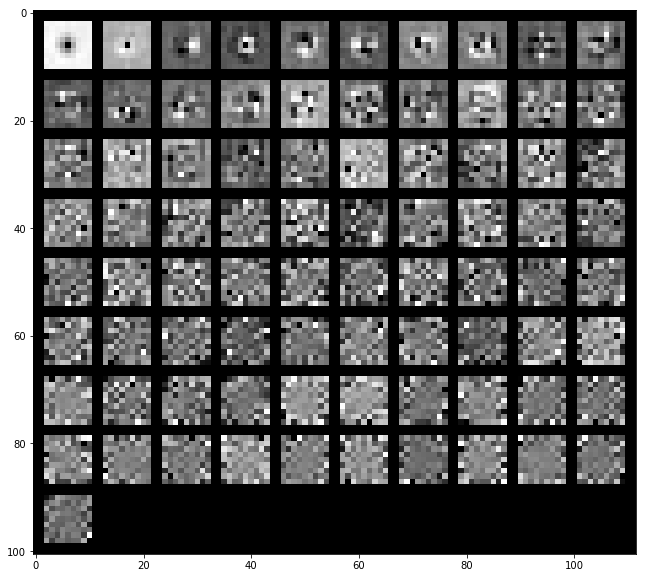

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20123904 0.29341527 0.378921   0.4406639  0.49707918 0.5363885
 0.56857717 0.59526372 0.62026484 0.64214659 0.66209733 0.68023029
 0.69614008 0.71109602 0.72535799 0.73855289 0.75148274 0.76339844
 0.77486316 0.78560001]


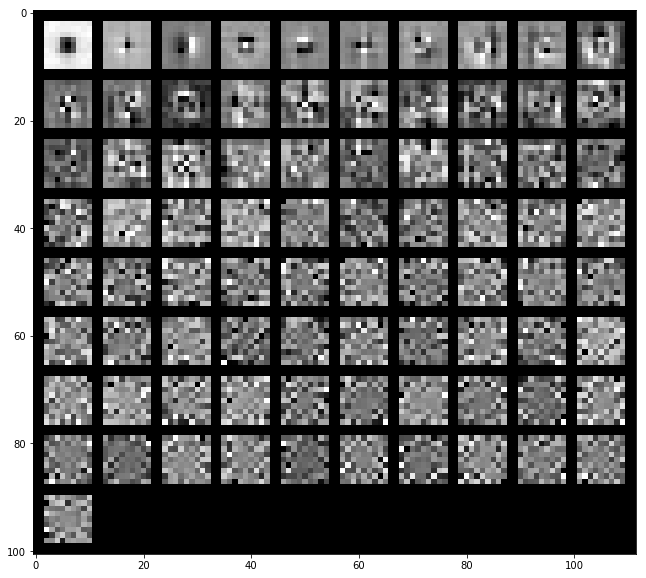

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17338757 0.26416881 0.33416915 0.39133397 0.43706813 0.47536198
 0.50570836 0.53482429 0.56066022 0.58486267 0.60681898 0.62674409
 0.64581059 0.66274895 0.6786645  0.69317002 0.70699236 0.72066118
 0.73327183 0.74520841]


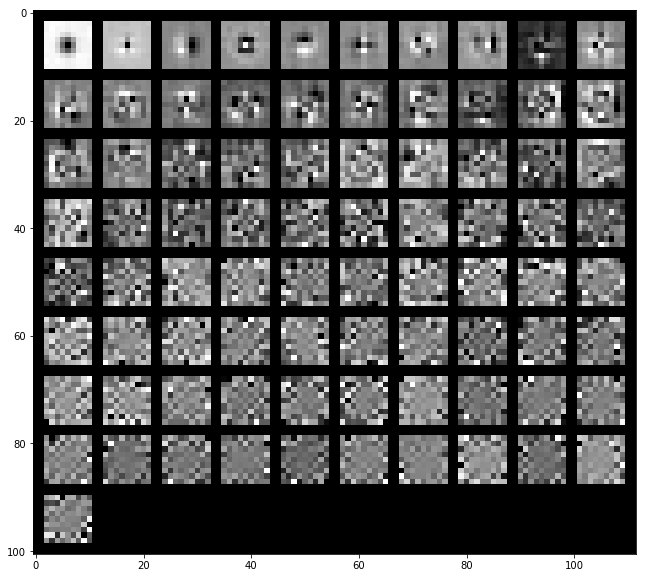

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1570/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18399227 0.29863514 0.38370086 0.45851936 0.51669789 0.5568793
 0.59626767 0.63060151 0.65875579 0.68347113 0.70681781 0.72664722
 0.74608968 0.76266597 0.7787931  0.7937085  0.80730165 0.81893141
 0.82993325 0.84064769]


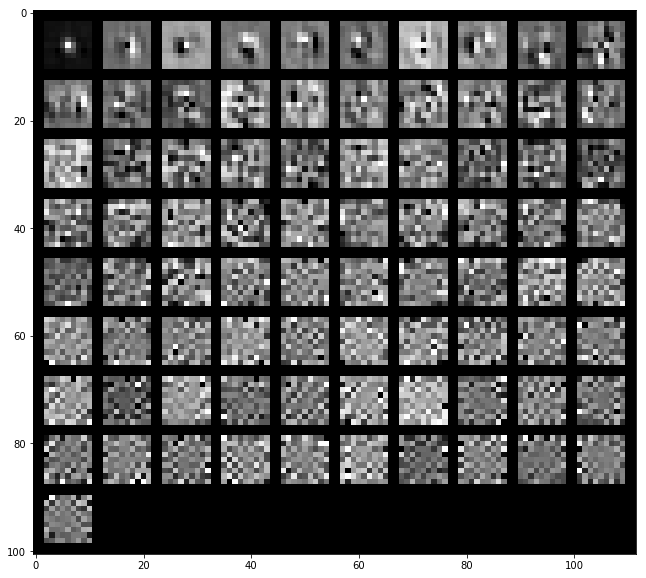

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21077536 0.31897767 0.4051024  0.47337444 0.52224291 0.56265745
 0.5956992  0.62507301 0.65101034 0.67423124 0.69496061 0.7144732
 0.73251989 0.74877784 0.76446209 0.77942344 0.79321076 0.80594187
 0.81716066 0.82796522]


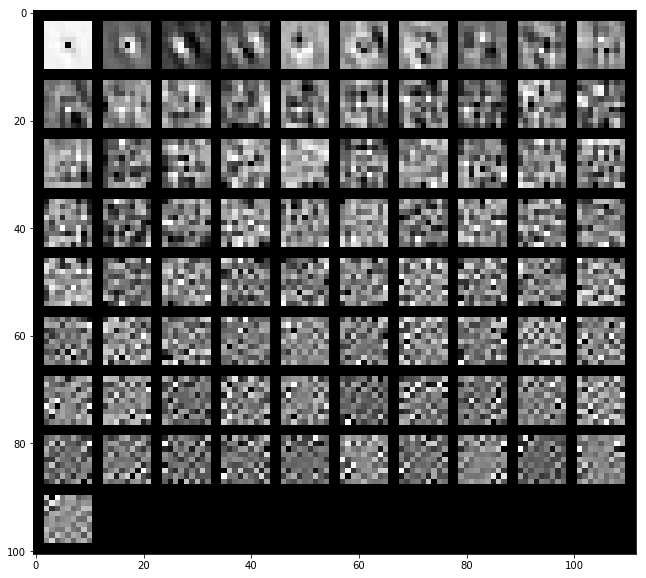

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19125454 0.29697954 0.3804129  0.44778945 0.49744399 0.53732504
 0.57482492 0.60475848 0.6314881  0.65644563 0.67961171 0.69849815
 0.7161616  0.73300587 0.74872009 0.76333052 0.77578895 0.78761911
 0.7990807  0.80976985]


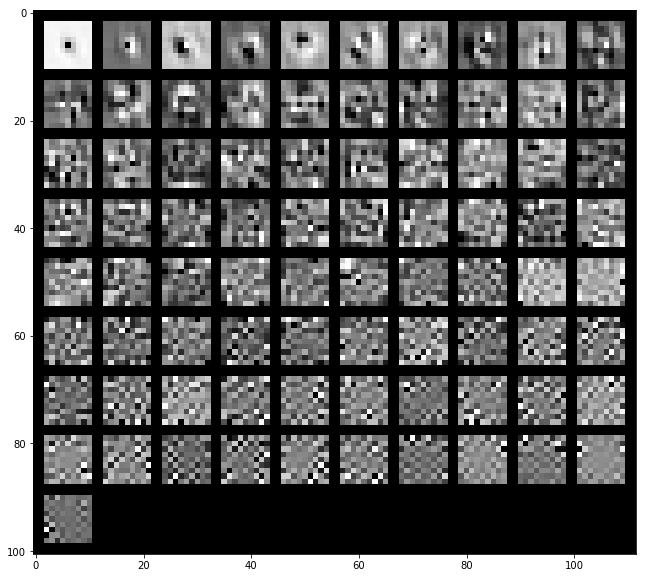

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1571/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18467954 0.29714834 0.39214151 0.45631919 0.51459455 0.55764919
 0.59362112 0.6242696  0.64955751 0.67173326 0.69246584 0.71150853
 0.72931695 0.74642968 0.76211021 0.77616114 0.78959177 0.80212764
 0.8140654  0.82575815]


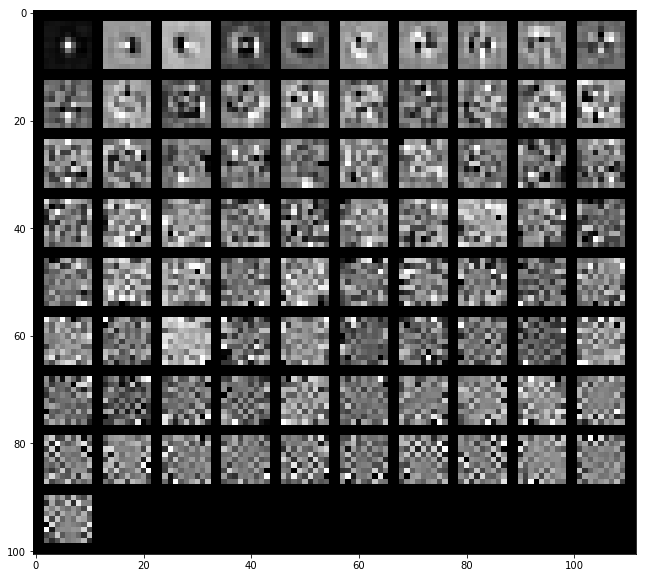

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.24966049 0.37974879 0.47760422 0.54196577 0.5857639  0.61813616
 0.64612552 0.67239401 0.69515588 0.71752137 0.73658747 0.75394552
 0.7697354  0.78421868 0.79761391 0.80925937 0.82053615 0.83062256
 0.83968625 0.84849867]


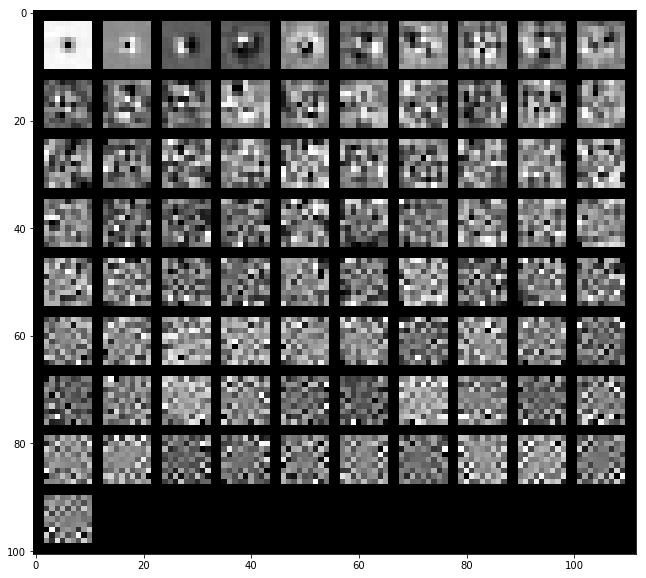

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21306925 0.33187386 0.42520632 0.48448159 0.53537017 0.5727035
 0.60082149 0.6272259  0.6494609  0.67055036 0.69073136 0.70927264
 0.72576765 0.74027817 0.75401135 0.7664199  0.77850566 0.78949089
 0.80009219 0.80984131]


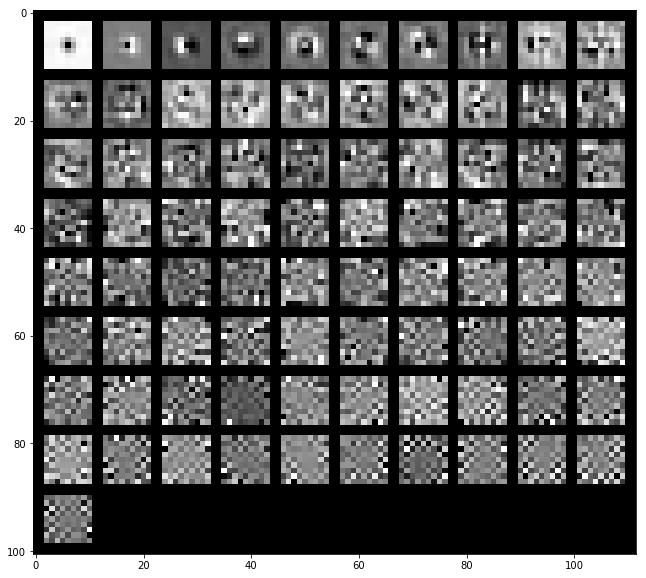

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1583/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14623026 0.24080444 0.32253483 0.38816443 0.43940511 0.48741061
 0.53234683 0.56872931 0.59614289 0.62235142 0.64749457 0.66971395
 0.69128031 0.71139449 0.72894113 0.74520015 0.76007595 0.77421242
 0.78681714 0.79919078]


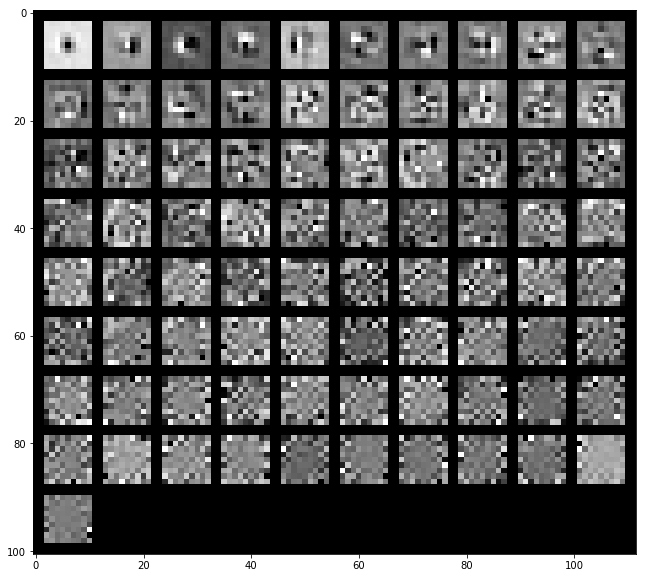

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19466937 0.30371107 0.40775099 0.48434823 0.53771792 0.57649344
 0.60958488 0.63682467 0.66234923 0.68549468 0.70672835 0.72451304
 0.74150559 0.75767165 0.77222037 0.78511332 0.79704645 0.80864234
 0.81959576 0.82996494]


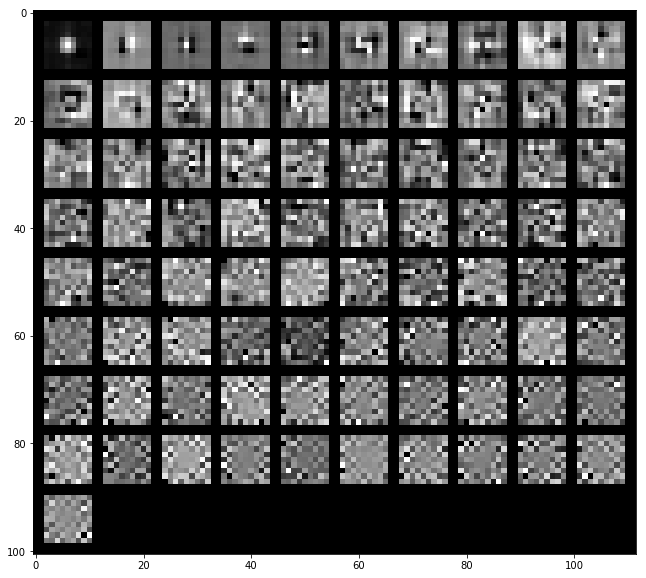

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16635775 0.26130539 0.35246627 0.42213558 0.46725939 0.50861119
 0.5447784  0.5768219  0.60451552 0.62781198 0.64936268 0.66961336
 0.6885514  0.70693756 0.72303792 0.73703582 0.75040332 0.76347674
 0.77567035 0.78738239]


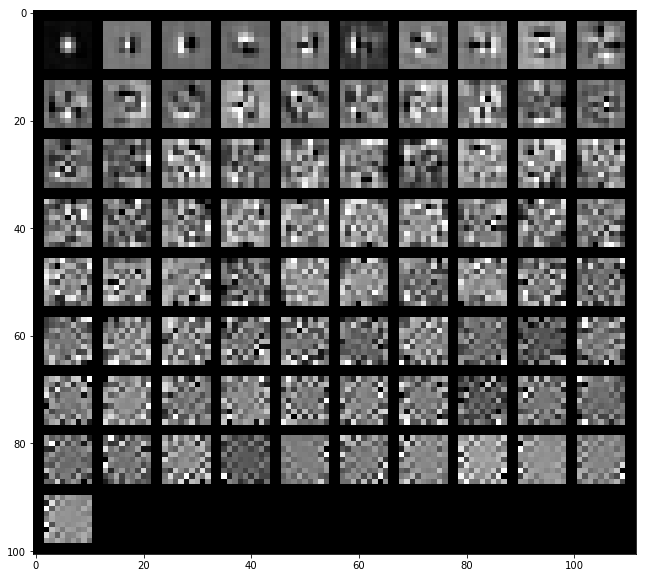

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1594/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15087577 0.24796312 0.32966477 0.38706299 0.44075393 0.48719557
 0.52850193 0.5678801  0.60110438 0.63113988 0.6572764  0.67951731
 0.69994223 0.71954732 0.7377948  0.75342613 0.76798266 0.7809039
 0.79289484 0.80430165]


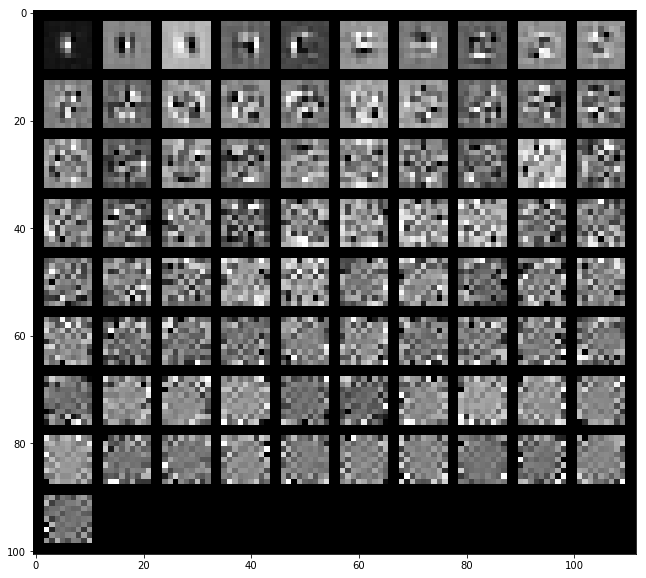

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.2019956  0.3027704  0.38925978 0.44675342 0.49566488 0.53846948
 0.57091297 0.59931583 0.62488994 0.64719686 0.66882355 0.68893892
 0.70660666 0.72377772 0.73892494 0.75362468 0.76766858 0.78086323
 0.79210435 0.80265021]


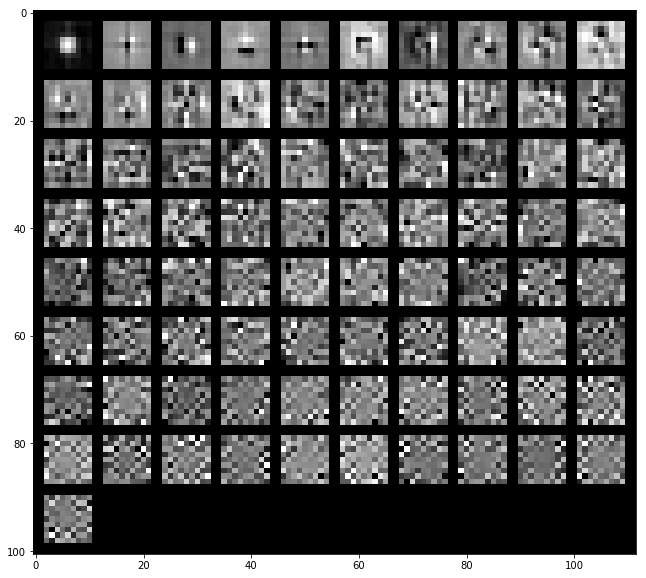

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16808911 0.26704241 0.350836   0.40152064 0.44847846 0.4896293
 0.53012775 0.56015791 0.58794476 0.6133176  0.63665607 0.65877767
 0.67923161 0.69794085 0.71442666 0.72875225 0.74235101 0.7558047
 0.76779114 0.77931936]


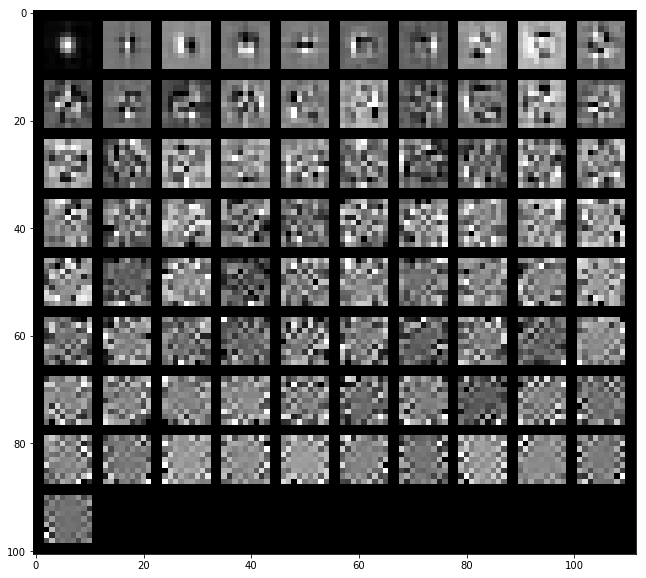

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1595/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13301735 0.22383161 0.29966573 0.35202289 0.39839777 0.43917517
 0.47708778 0.51124841 0.54481263 0.57561247 0.60179778 0.62742058
 0.65158261 0.67237722 0.6913809  0.70881144 0.72589793 0.74160607
 0.75651866 0.77076524]


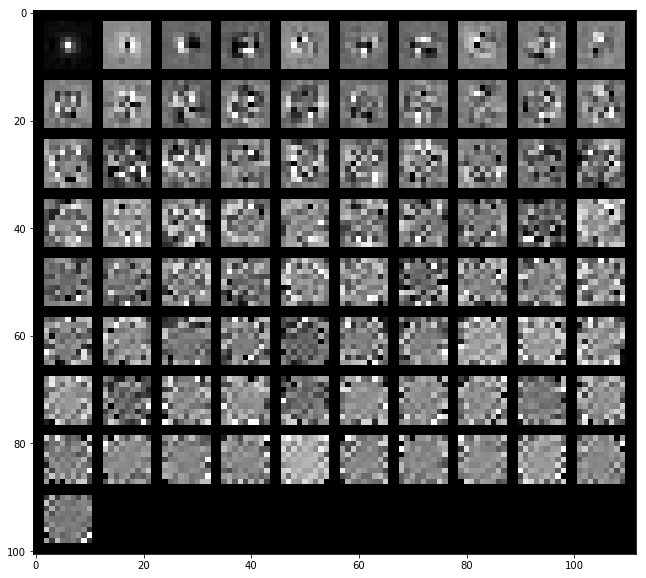

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19008376 0.28764331 0.38011031 0.44111356 0.49006491 0.52978396
 0.55981578 0.58718726 0.61148826 0.63443792 0.65648362 0.67696814
 0.69490025 0.71235356 0.72936408 0.74504333 0.75996471 0.77384075
 0.78707159 0.79978294]


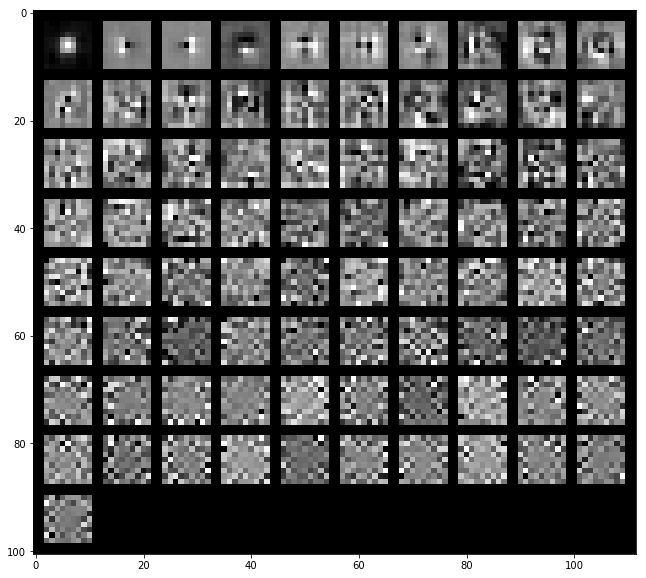

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15801167 0.25003416 0.33245918 0.38676161 0.42994807 0.46817635
 0.50262764 0.53253645 0.55865721 0.58321243 0.60609229 0.62797077
 0.64908239 0.66727842 0.68424986 0.7007713  0.71632574 0.73121484
 0.74415032 0.75671906]


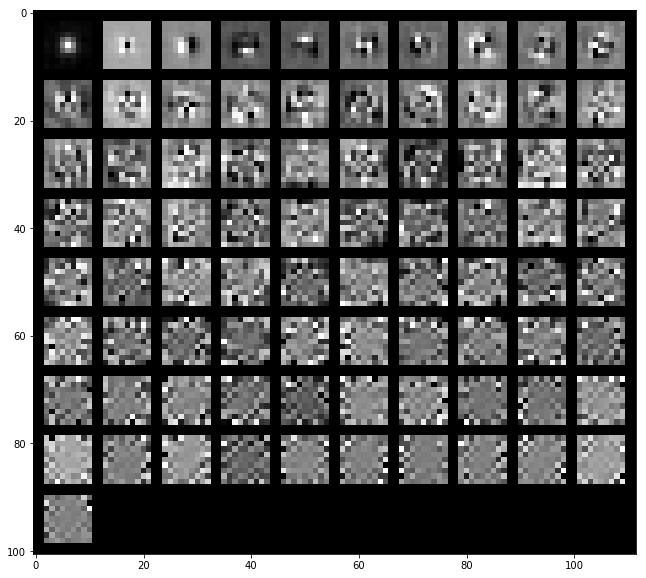

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1606/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15588435 0.24556836 0.32829099 0.38892852 0.44270575 0.49511927
 0.53754657 0.57314829 0.60598678 0.63674028 0.66252418 0.68322923
 0.70221972 0.72056376 0.73740827 0.75327264 0.76700351 0.78043523
 0.79328049 0.8058006 ]


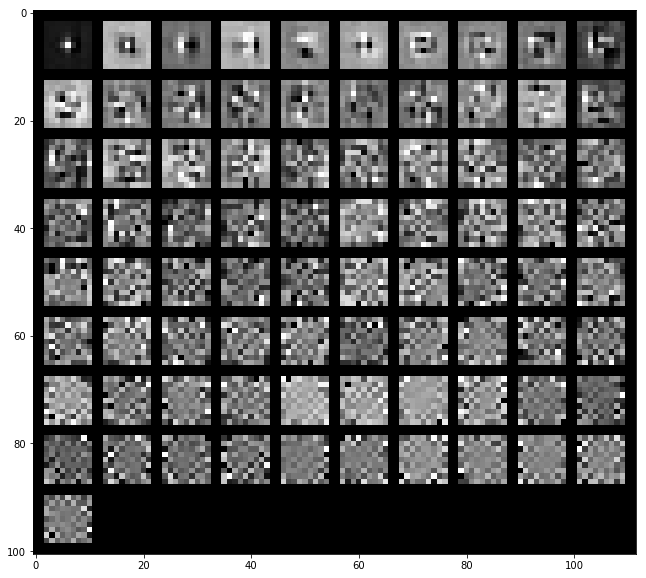

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18045003 0.2876192  0.36722019 0.43291383 0.48454029 0.52932918
 0.56118944 0.59080268 0.61751628 0.64049736 0.66169004 0.68131361
 0.7005013  0.71815589 0.73520922 0.75034403 0.76453041 0.77730238
 0.78995754 0.80188181]


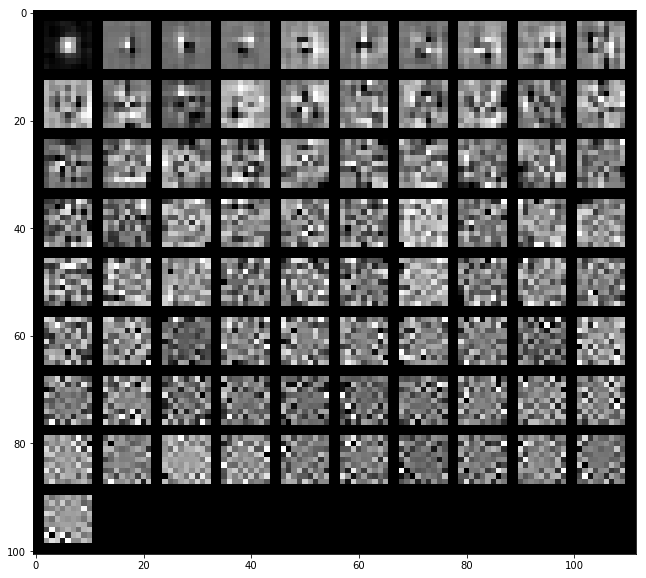

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15705442 0.26602071 0.34461333 0.40161097 0.45366803 0.49963751
 0.53414867 0.56523945 0.59288452 0.61780083 0.64123178 0.66169529
 0.68011968 0.69686214 0.71318804 0.72797794 0.74213329 0.75581855
 0.76859561 0.78048578]


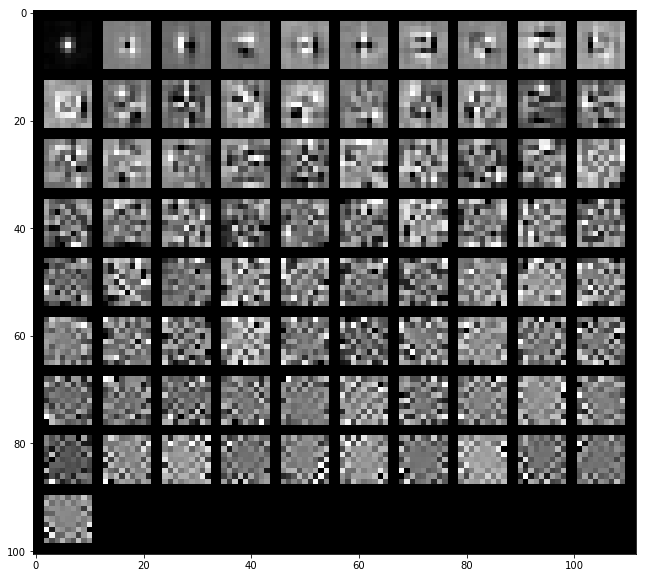

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1618/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.25598092 0.38332942 0.45419325 0.51428802 0.55863195 0.60122442
 0.64030327 0.67355689 0.69966377 0.72081156 0.7409697  0.75991755
 0.77638963 0.79108977 0.80481148 0.81785449 0.83055099 0.84214777
 0.85275838 0.86142646]


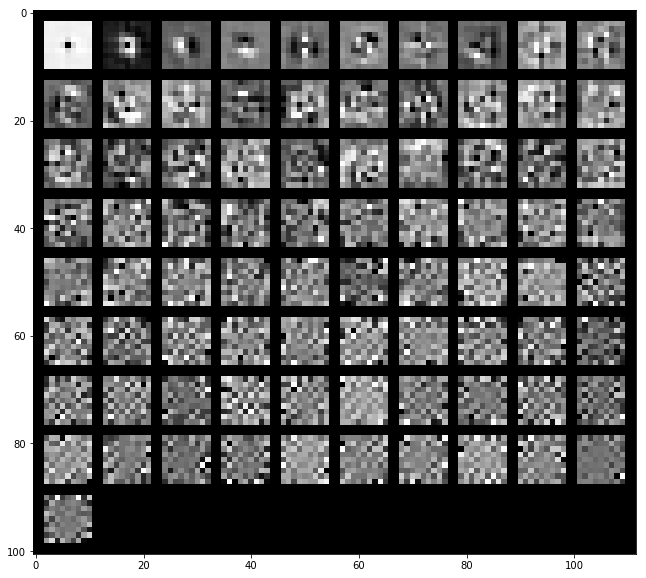

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16624842 0.29133655 0.35205785 0.40554014 0.45469502 0.49321765
 0.52749413 0.56067704 0.59008497 0.61570018 0.63829127 0.65918796
 0.67885693 0.69698432 0.71439067 0.7300846  0.74457232 0.75880761
 0.77194431 0.78425278]


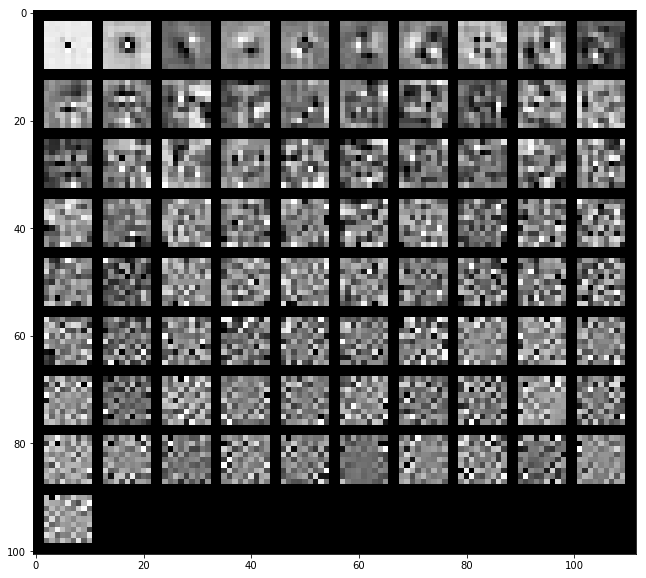

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21742403 0.33709884 0.39853446 0.45239561 0.50049314 0.53604571
 0.57023859 0.59971679 0.62547201 0.64775548 0.66691115 0.68571165
 0.70394605 0.71955289 0.73474311 0.74881263 0.76148826 0.7738418
 0.78522529 0.79600808]


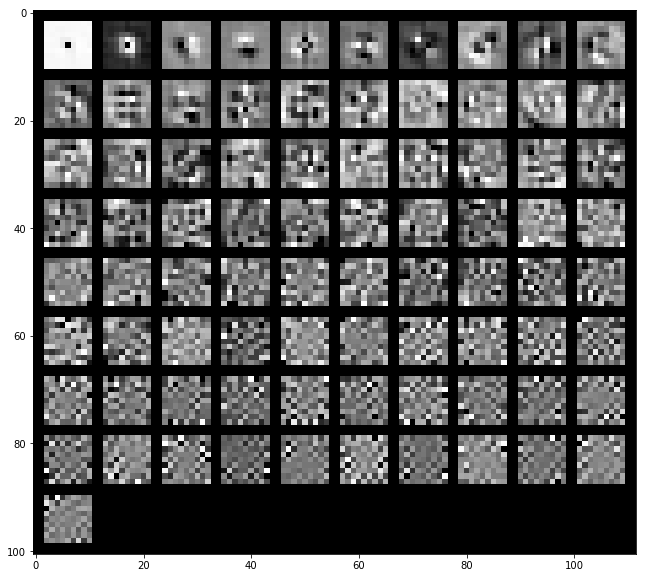

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1619/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22838569 0.31544574 0.39799996 0.46039068 0.51179054 0.55812724
 0.59852362 0.63287179 0.66329751 0.68895842 0.71160209 0.73248813
 0.75151881 0.7675334  0.78333588 0.79747706 0.81080518 0.8231479
 0.83480801 0.84508615]


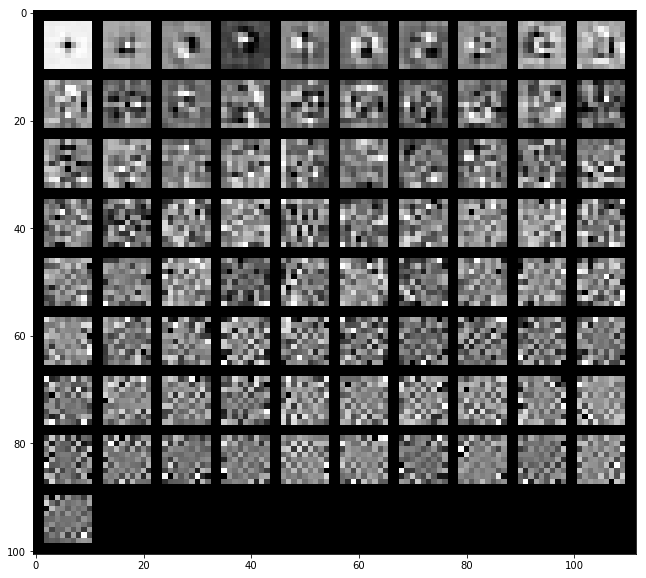

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23134448 0.31878986 0.39037242 0.45733668 0.50424632 0.54215731
 0.57573089 0.60593826 0.63302725 0.65774255 0.67956181 0.69952941
 0.71783048 0.73533336 0.7510534  0.76484602 0.77801382 0.79058897
 0.80223911 0.81354647]


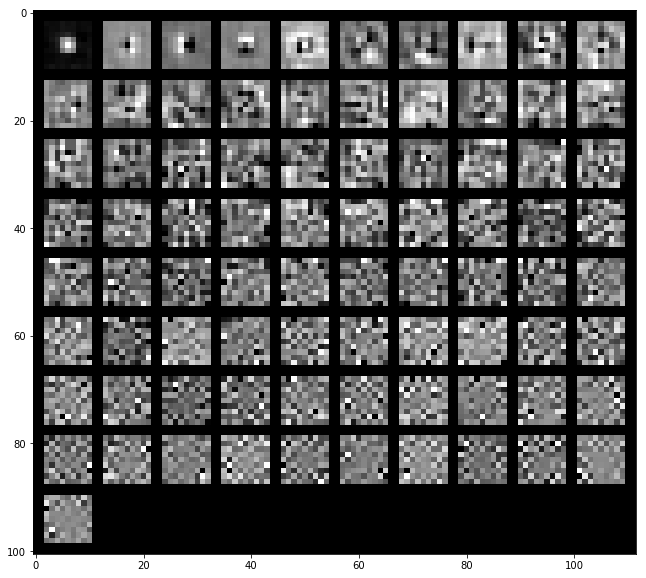

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21337764 0.31020886 0.38096443 0.44494182 0.48810359 0.52800117
 0.56435736 0.59545578 0.62371127 0.64711598 0.66825445 0.68822287
 0.70588485 0.72229617 0.73812953 0.75327005 0.76588639 0.7781535
 0.7895919  0.80023884]


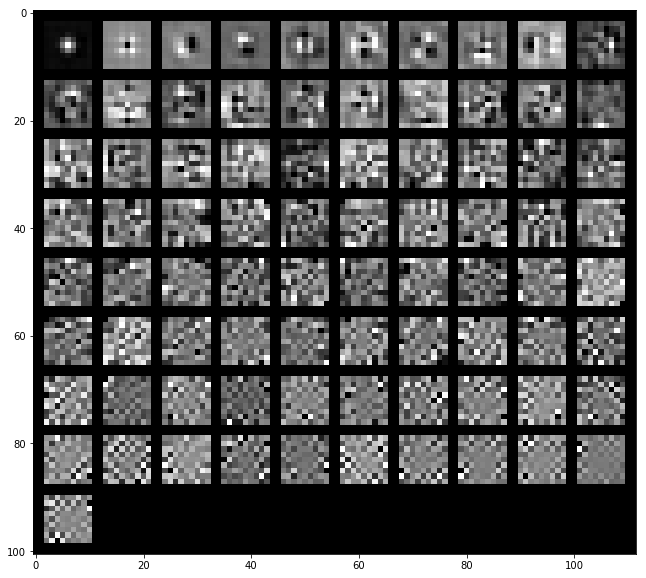

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1630/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14826924 0.21973682 0.282419   0.34104117 0.39121432 0.43788779
 0.48027452 0.51811991 0.55179289 0.5796028  0.60639086 0.6318831
 0.65514013 0.67721187 0.69632518 0.71475441 0.73170558 0.74684238
 0.76164068 0.77530854]


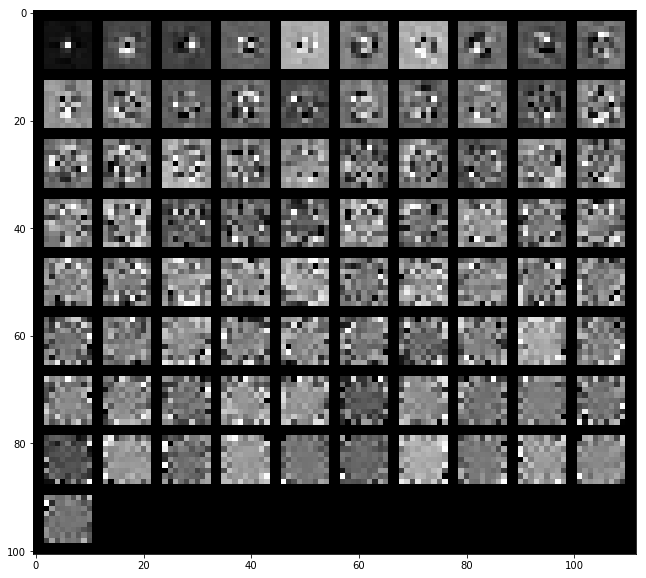

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17762695 0.2992808  0.36994302 0.42451566 0.47314668 0.51005148
 0.5434476  0.57134659 0.59597238 0.61840846 0.64024325 0.66069494
 0.67919522 0.69637806 0.71303804 0.72856431 0.74282774 0.75586727
 0.76846567 0.77987748]


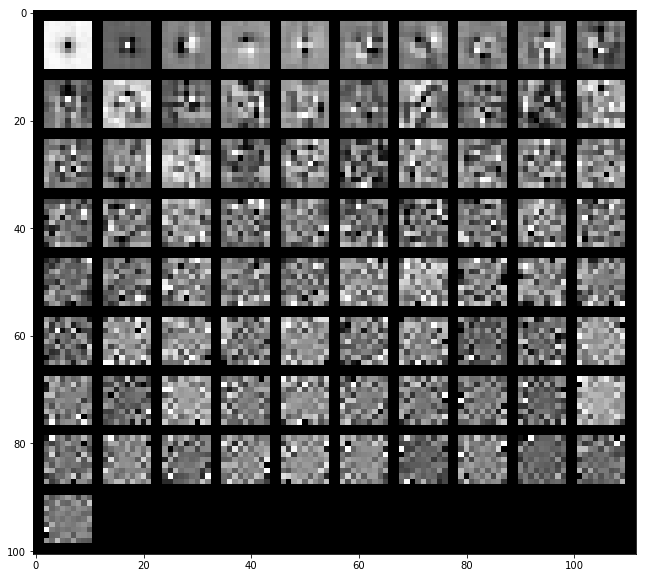

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15428044 0.25267529 0.31770138 0.36542555 0.41043191 0.44744188
 0.4841527  0.51648241 0.54686862 0.57169693 0.59527933 0.61619714
 0.63638657 0.65522236 0.67232099 0.68836757 0.70424474 0.71870308
 0.73180415 0.74407623]


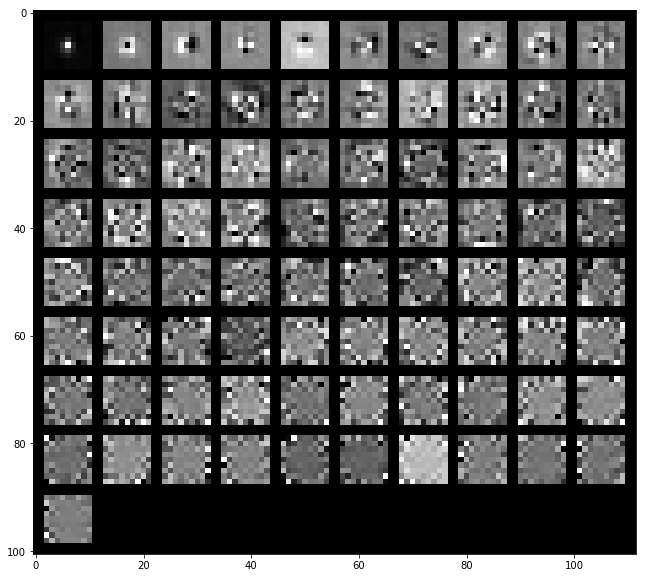

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1631/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14705784 0.24848102 0.32590553 0.37982502 0.42500961 0.46767181
 0.50470133 0.53721563 0.56885898 0.59904307 0.62455501 0.64825522
 0.67111996 0.69060331 0.7085783  0.72495967 0.74087891 0.75590274
 0.76978201 0.78334373]


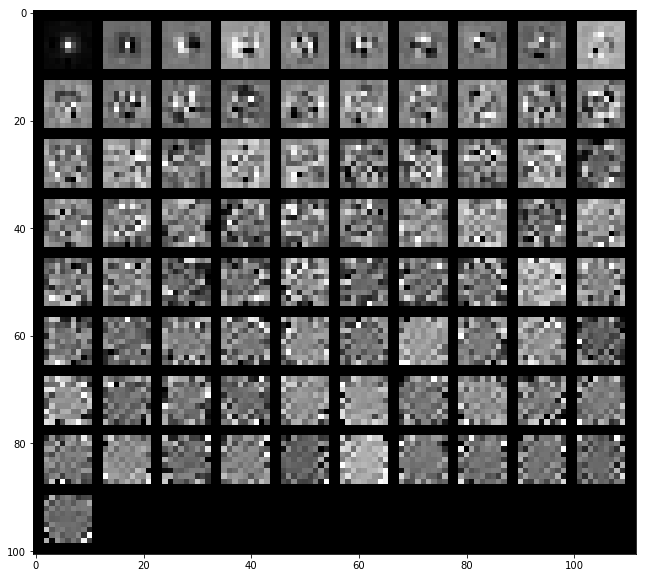

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.2071169  0.31539842 0.40600634 0.46939753 0.51693505 0.55584121
 0.58581998 0.61214892 0.63718262 0.65969927 0.68034092 0.69932656
 0.71694161 0.73355488 0.74957344 0.76380691 0.77749744 0.79097068
 0.80400169 0.81578257]


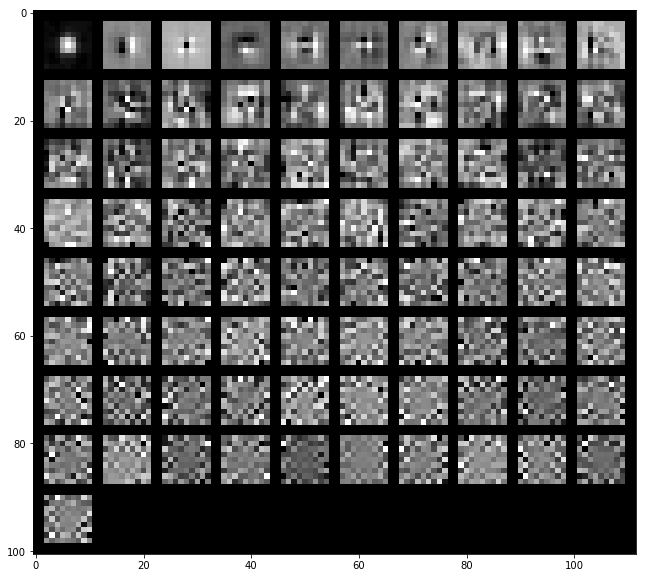

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17136833 0.26904339 0.35822637 0.41314475 0.45711729 0.4956187
 0.52862282 0.55857597 0.58437258 0.60768984 0.62961176 0.65086528
 0.67110531 0.68808568 0.7040465  0.7188246  0.73309346 0.74698535
 0.75992502 0.77236849]


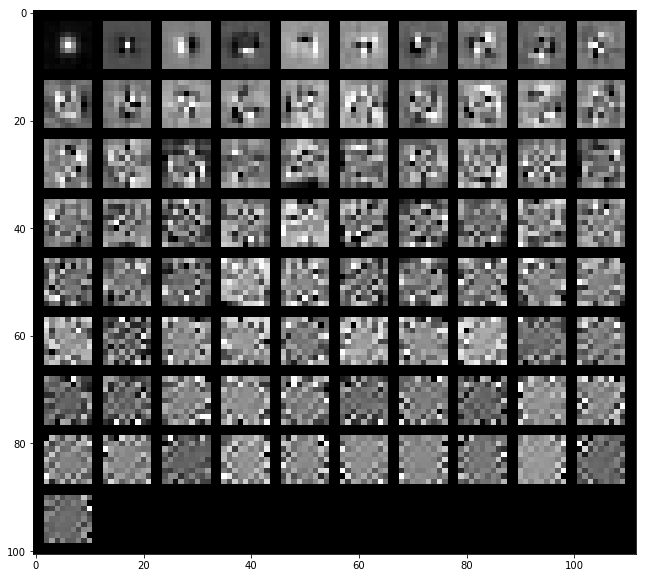

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1739/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19238574 0.29837977 0.37728784 0.44034811 0.49902408 0.53880881
 0.57612104 0.60915034 0.63852982 0.66695283 0.69403539 0.71460445
 0.7333496  0.75096439 0.76580046 0.78016306 0.79345436 0.80603709
 0.81819575 0.82892416]


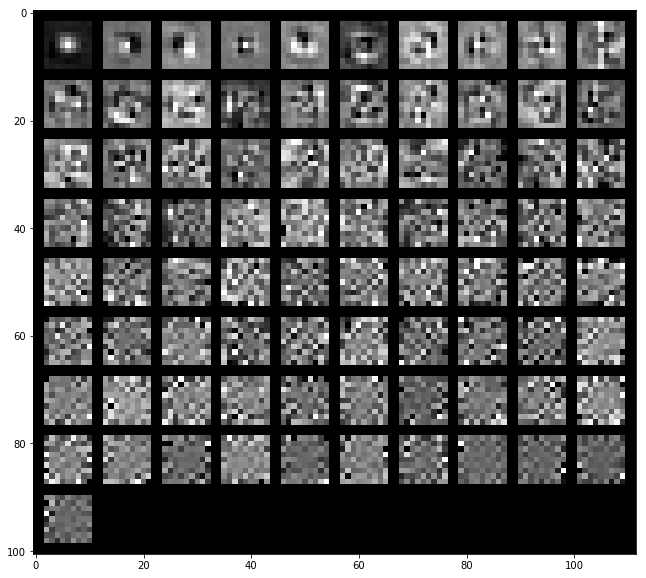

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.27815318 0.38702987 0.476415   0.52910634 0.5789291  0.6176108
 0.64929155 0.68052917 0.70700283 0.72877523 0.74831917 0.76496242
 0.78049627 0.79388175 0.80648151 0.81884056 0.83027637 0.84063729
 0.85029494 0.85944761]


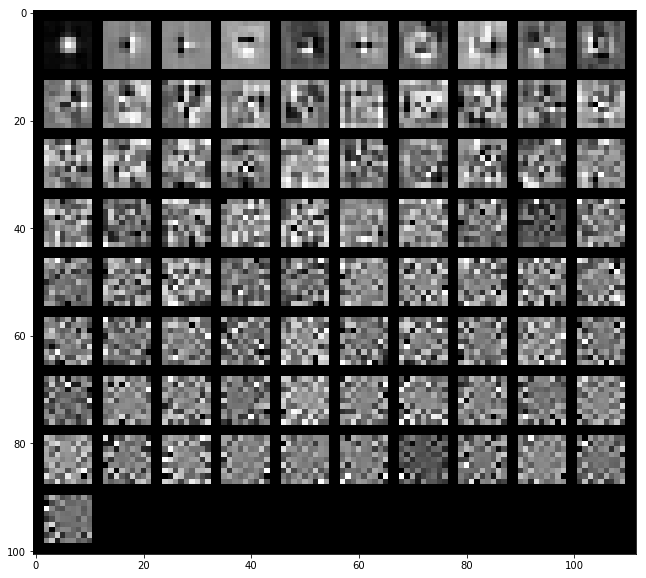

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23001132 0.33218212 0.40873183 0.46981055 0.51865975 0.55693892
 0.58872853 0.61842092 0.6465312  0.67381626 0.69705229 0.71596597
 0.7328144  0.7477548  0.7619944  0.77489786 0.78688701 0.7982671
 0.80906954 0.81950484]


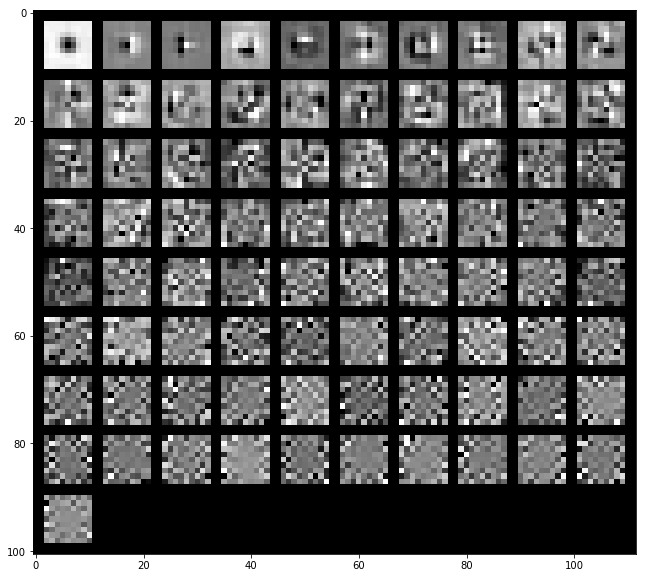

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1750/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12812392 0.22694383 0.29383985 0.35354623 0.4066954  0.44828872
 0.48801771 0.52364447 0.55852166 0.59096021 0.62046482 0.64584064
 0.6698727  0.69076452 0.70938143 0.72757243 0.74517289 0.76150116
 0.77613691 0.78927912]


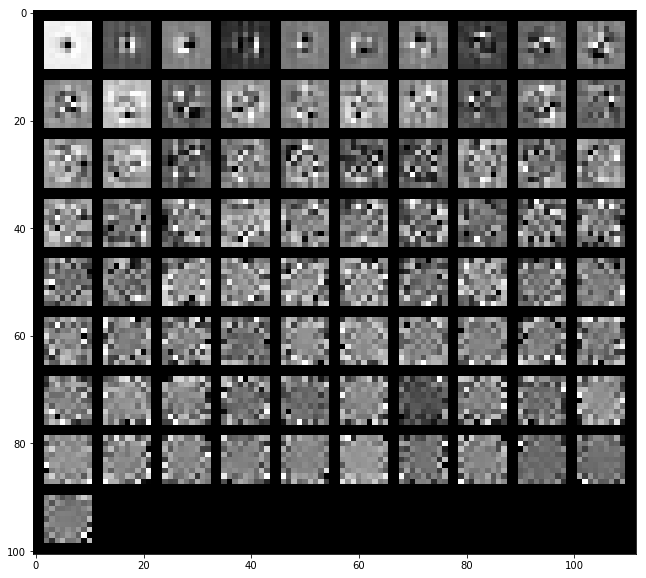

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20813565 0.31580784 0.39398683 0.45666838 0.51491648 0.55143551
 0.58533806 0.61325133 0.63706994 0.65970726 0.68043019 0.69850919
 0.7154291  0.73095725 0.7460065  0.76013056 0.77303802 0.7847051
 0.79572911 0.80611654]


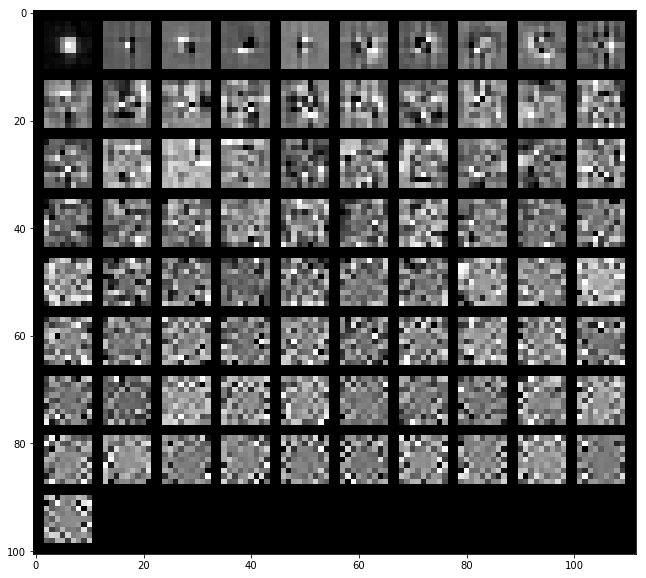

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15885517 0.26916551 0.33703693 0.39171233 0.44523098 0.48903022
 0.52311773 0.55328624 0.58112212 0.60607356 0.62951277 0.65112453
 0.67206093 0.69134844 0.70615189 0.72087095 0.7350467  0.74828133
 0.76087492 0.77242359]


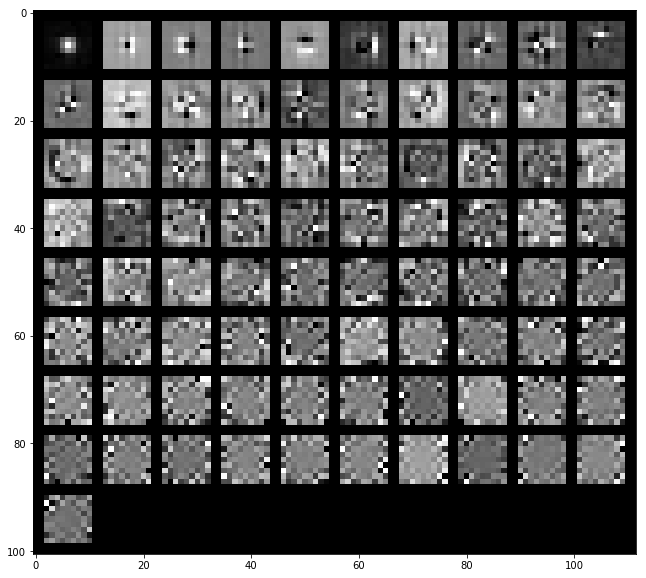

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1751/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18769323 0.28287181 0.36336954 0.43429468 0.47945949 0.5206149
 0.55433419 0.58536872 0.61281781 0.63794214 0.66185007 0.68353448
 0.7039966  0.72024226 0.7361417  0.75098321 0.76473788 0.77766328
 0.79020275 0.80171316]


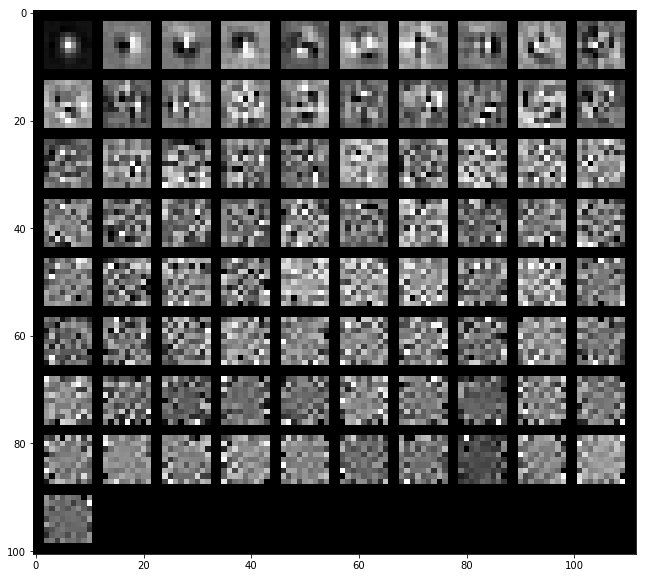

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21635007 0.32502794 0.41293197 0.47960483 0.53145596 0.57318861
 0.60322317 0.62907562 0.65329414 0.67480848 0.69478809 0.71429583
 0.73284056 0.74874476 0.76356206 0.77795867 0.79031594 0.80219053
 0.81277998 0.82290527]


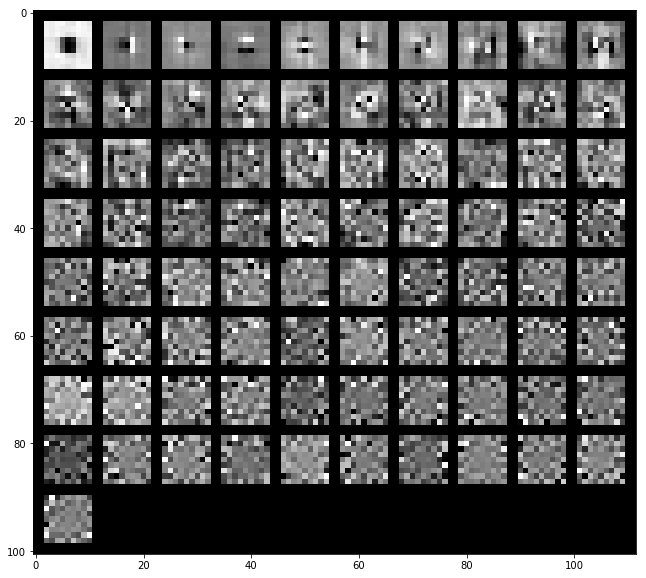

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19505462 0.2919552  0.37023867 0.43513541 0.4780892  0.51521299
 0.54856473 0.57780732 0.60476153 0.63108908 0.65331677 0.67321346
 0.69171897 0.70860445 0.7233246  0.73674973 0.74987272 0.76204663
 0.77379274 0.78473893]


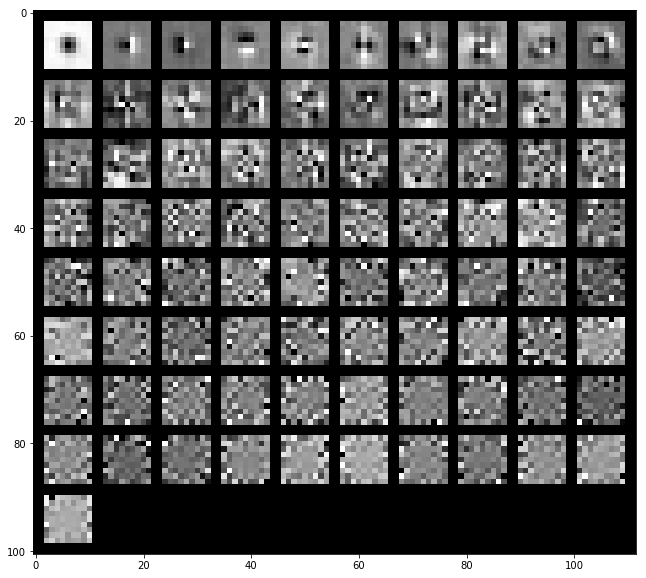

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1762/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18065212 0.29803894 0.37394312 0.43893417 0.48906666 0.53621168
 0.57125238 0.60405839 0.63413139 0.66004345 0.68371602 0.70671857
 0.72699739 0.74502527 0.76085886 0.77581738 0.79004285 0.80319342
 0.81550792 0.82668475]


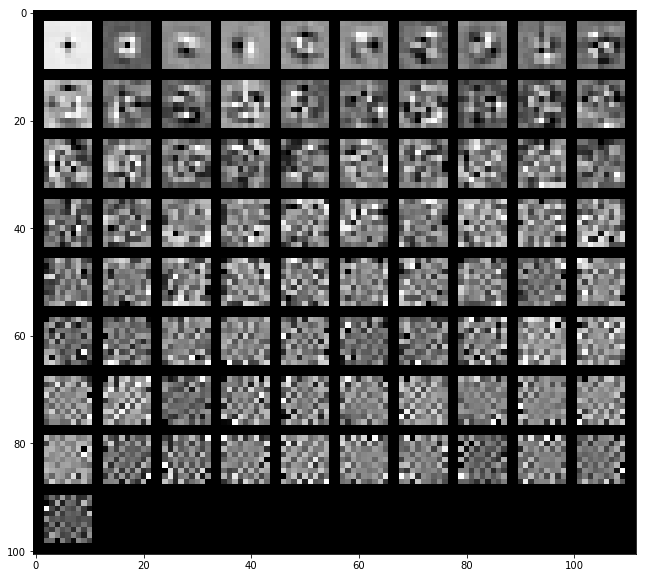

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.26742739 0.38287063 0.45715805 0.51797404 0.5586922  0.58946822
 0.61728172 0.64258805 0.66518198 0.68683105 0.70562345 0.72216456
 0.73825043 0.7532568  0.76679321 0.78026437 0.79256816 0.80424226
 0.81538893 0.8259526 ]


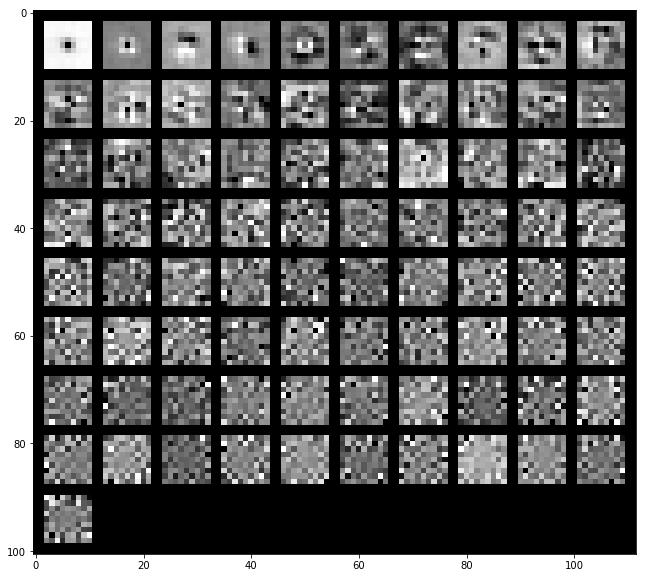

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22003985 0.33387666 0.40650528 0.46585176 0.50746416 0.54430959
 0.57607842 0.60470225 0.62846184 0.65093249 0.67116822 0.69086648
 0.70881679 0.72545176 0.7404903  0.75421122 0.76775196 0.78031161
 0.7913762  0.80194666]


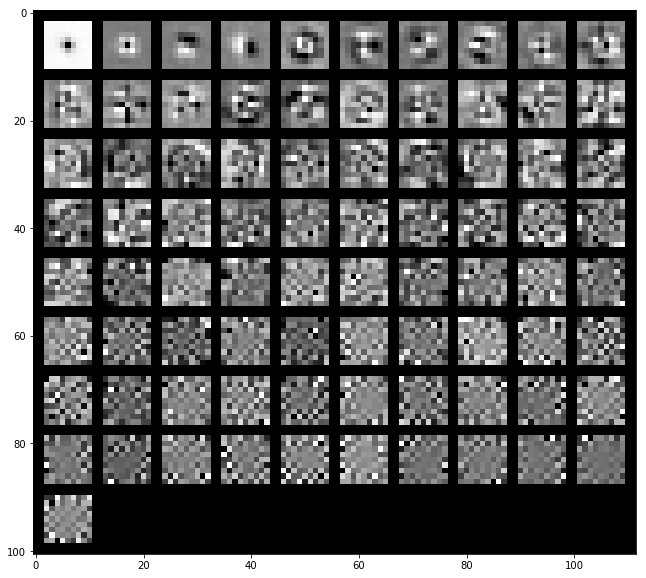

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1774/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13257215 0.22633546 0.29683249 0.3505542  0.40166325 0.44761117
 0.48656428 0.52099299 0.55213863 0.58143179 0.60834032 0.63446125
 0.65747411 0.67803765 0.69829043 0.71584479 0.73256843 0.74666208
 0.76060777 0.77326158]


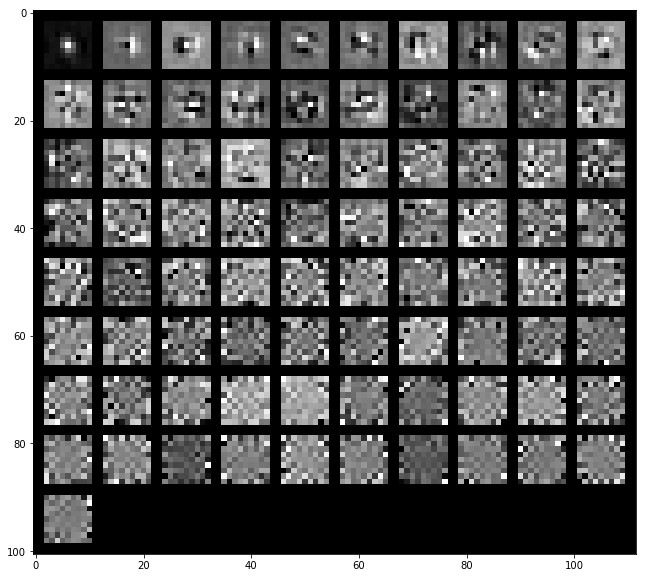

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21467133 0.31508154 0.40666841 0.47770026 0.51974604 0.56028832
 0.59511142 0.62330473 0.64759171 0.66970206 0.69067113 0.71026114
 0.72887298 0.74573951 0.76139716 0.77503147 0.78733001 0.79930328
 0.81090639 0.82046784]


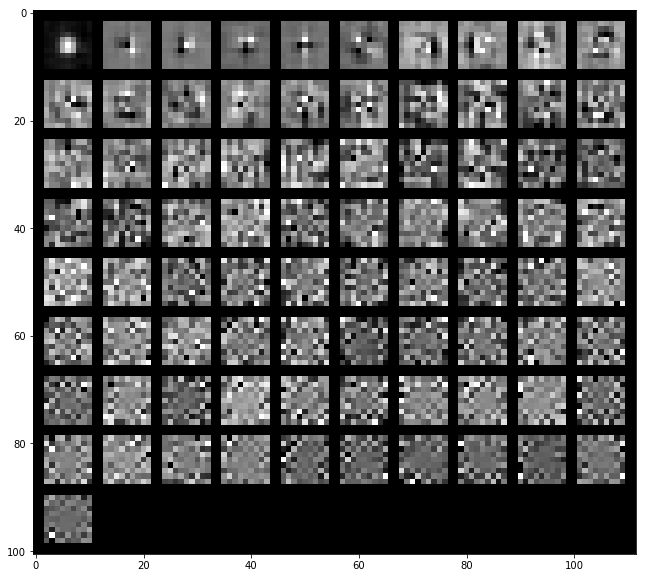

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16894288 0.2615646  0.33915632 0.3960908  0.43923758 0.48010539
 0.51873147 0.54988582 0.57753059 0.60254493 0.62514516 0.64753192
 0.66845904 0.68659134 0.702983   0.71872602 0.73349577 0.74626231
 0.75826418 0.76999295]


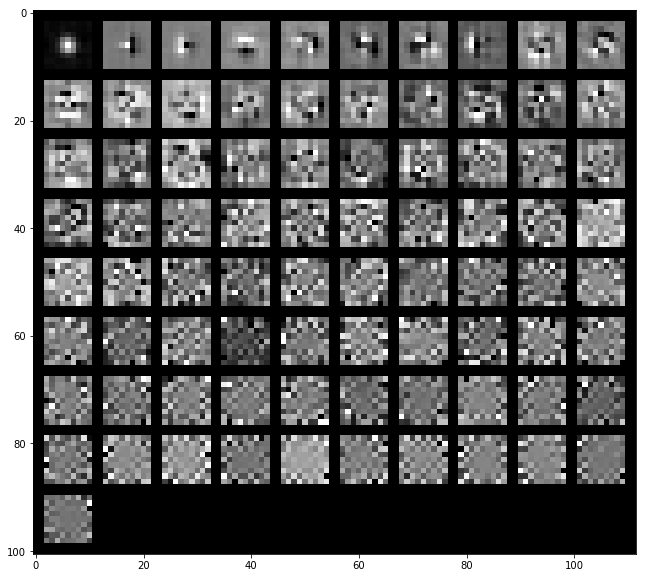

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1775/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16882814 0.26811202 0.34467042 0.40654401 0.45798776 0.4995411
 0.53669921 0.57118997 0.5978691  0.62135871 0.64239864 0.66110134
 0.67921779 0.69593694 0.71174658 0.72532933 0.73826435 0.75098654
 0.76302204 0.77440938]


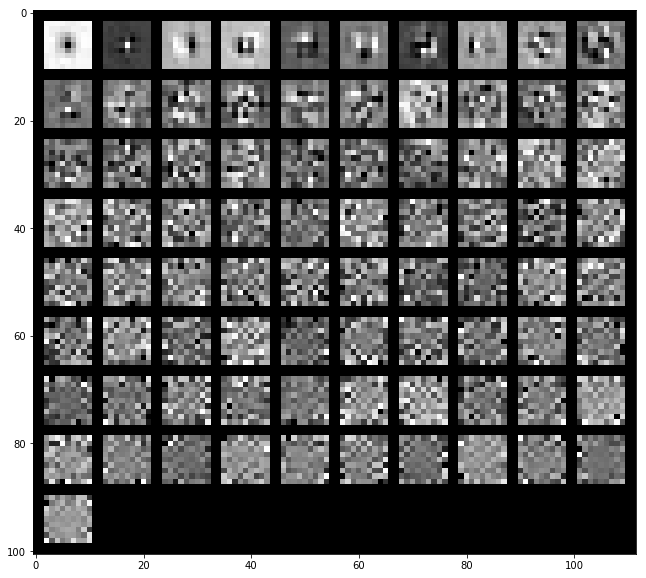

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21030355 0.31980599 0.39473177 0.46248999 0.50891416 0.54654759
 0.57850441 0.60682135 0.63241536 0.65676472 0.67575467 0.6930871
 0.70806575 0.72113556 0.7338677  0.74566253 0.75682761 0.7675072
 0.77803567 0.7880022 ]


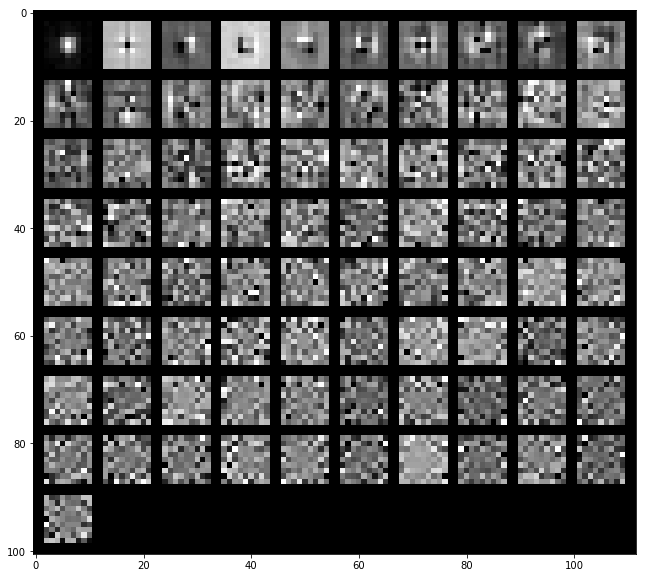

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18755129 0.28866835 0.36168857 0.42583026 0.47195499 0.5089068
 0.5420253  0.57098423 0.59598225 0.61925655 0.63937194 0.65725825
 0.67295213 0.68734735 0.70146882 0.71455477 0.72629243 0.7374055
 0.74780598 0.75805635]


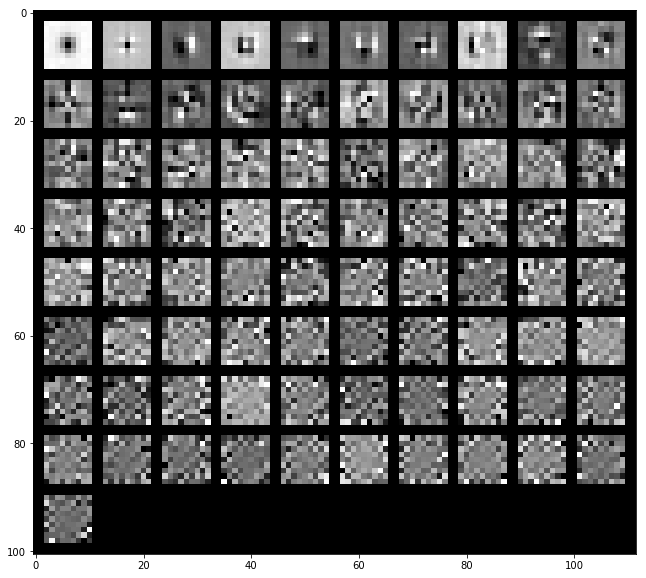

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1786/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17040201 0.29726578 0.389146   0.45076084 0.50208147 0.54019278
 0.5767444  0.6101619  0.64044965 0.66527021 0.68820112 0.7101796
 0.7294564  0.74632068 0.76253325 0.77776235 0.79149463 0.80446323
 0.81637699 0.82796041]


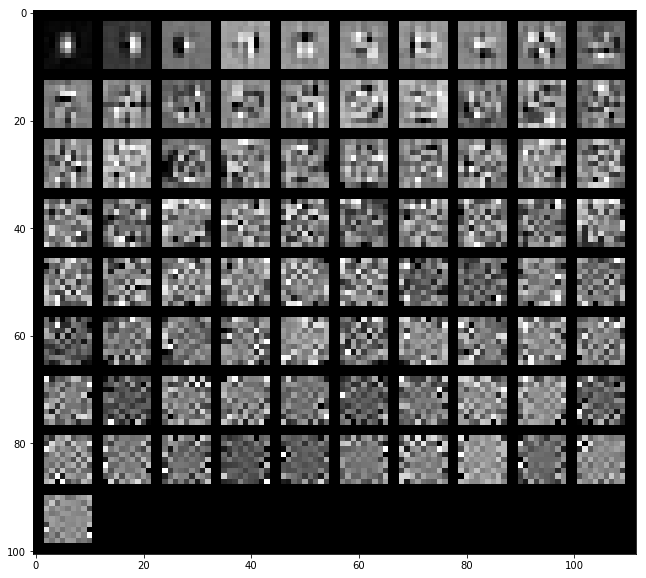

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23578882 0.336325   0.41176384 0.47070661 0.52411876 0.56382645
 0.59775214 0.62672813 0.65180641 0.67362922 0.69369944 0.71213765
 0.72840132 0.74437752 0.75858552 0.77237045 0.7853589  0.7979345
 0.80974193 0.82021224]


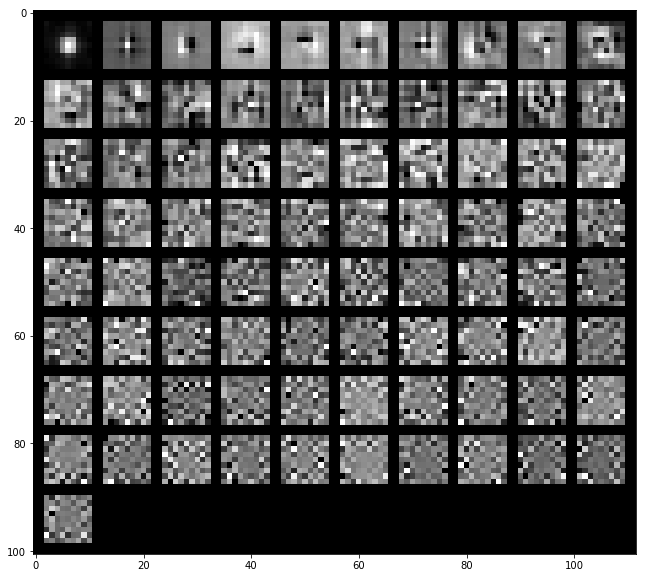

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19758706 0.30631005 0.38883073 0.44322908 0.49427663 0.53044761
 0.56438269 0.59540322 0.62362128 0.64697679 0.66932152 0.68842423
 0.70625352 0.72276095 0.73790185 0.75112153 0.76403416 0.77646301
 0.78846717 0.79961738]


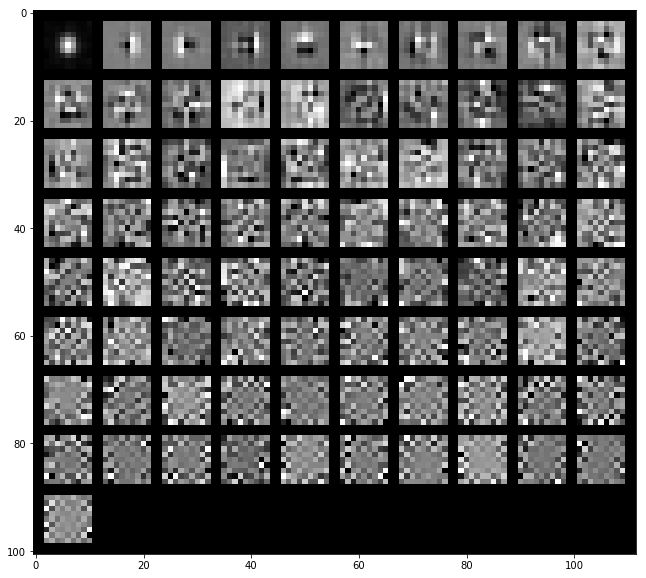

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1787/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21058506 0.32053589 0.3975815  0.45262478 0.50151159 0.54984744
 0.58791151 0.62360576 0.64977705 0.67564239 0.69850038 0.72093871
 0.74059474 0.75680936 0.77237527 0.7865916  0.79972262 0.81232701
 0.82428586 0.83577716]


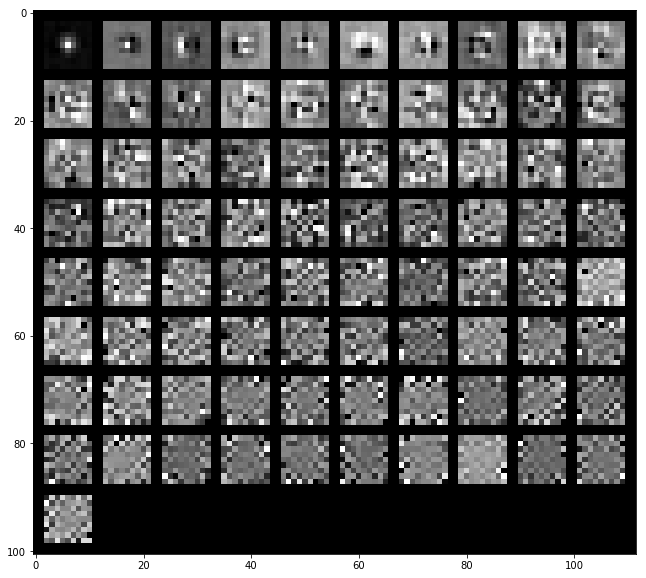

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.25521468 0.36232051 0.44509416 0.51357732 0.56567192 0.60294125
 0.63473699 0.66549544 0.68929696 0.70816654 0.72665232 0.74271544
 0.75732281 0.77141759 0.78399806 0.79630316 0.80799788 0.81871057
 0.82901181 0.83834901]


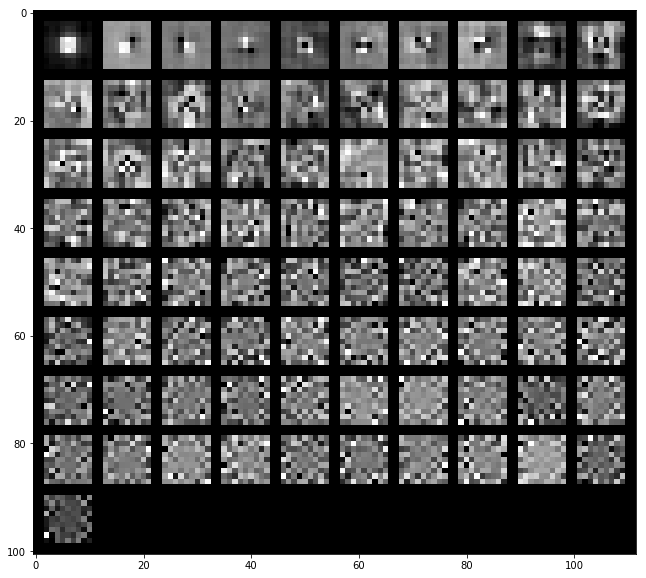

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21600012 0.32312538 0.40548514 0.46454602 0.51317934 0.55544053
 0.59007348 0.61925403 0.6439404  0.66635573 0.68660272 0.70433157
 0.72102091 0.73654961 0.75099005 0.76464319 0.77735717 0.78906
 0.80016388 0.81055343]


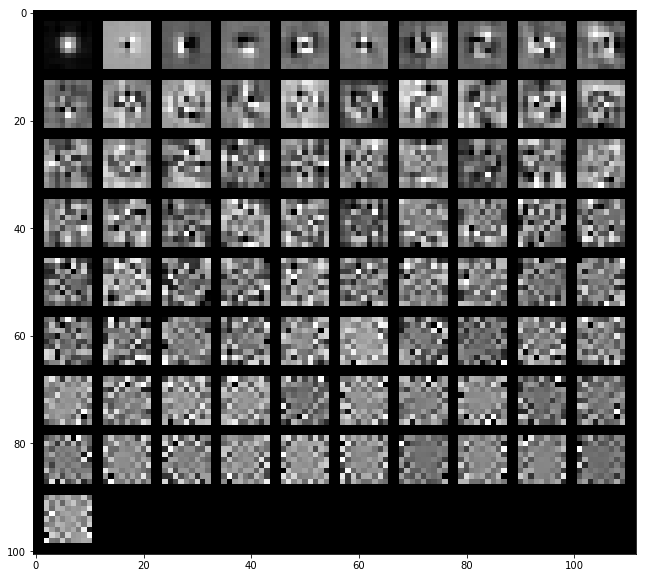

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1799/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1403682  0.24001765 0.30533871 0.36259359 0.41370568 0.46091296
 0.50286424 0.54049617 0.57097327 0.59993836 0.62808329 0.651536
 0.67323685 0.69415325 0.71358685 0.73165355 0.74727733 0.76193059
 0.77567811 0.78881082]


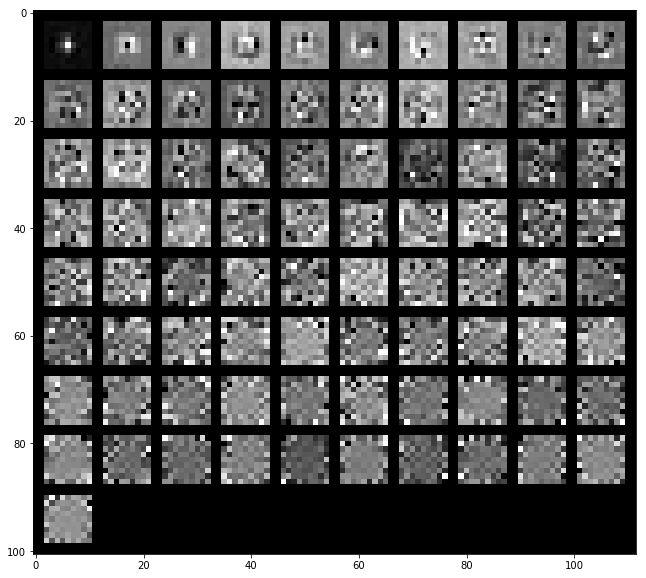

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18109013 0.28137752 0.37351348 0.43175937 0.47971951 0.52197595
 0.55325217 0.58216646 0.61018737 0.63378268 0.65464114 0.67400837
 0.69290715 0.71047447 0.72670319 0.74133832 0.75563317 0.76895906
 0.78116989 0.79325502]


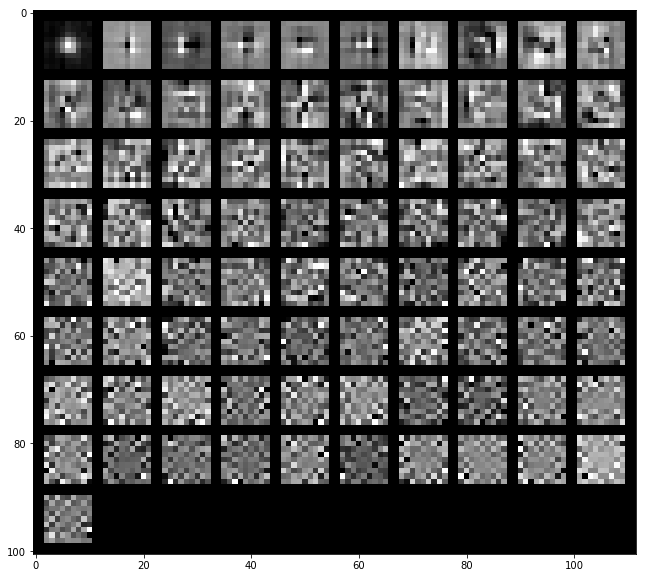

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1525554  0.2524329  0.3268227  0.37826094 0.42329088 0.46707595
 0.49921126 0.52859383 0.55575361 0.58115224 0.60431645 0.62678444
 0.6469171  0.66468097 0.68159058 0.69748988 0.71286138 0.7265383
 0.7394178  0.75215843]


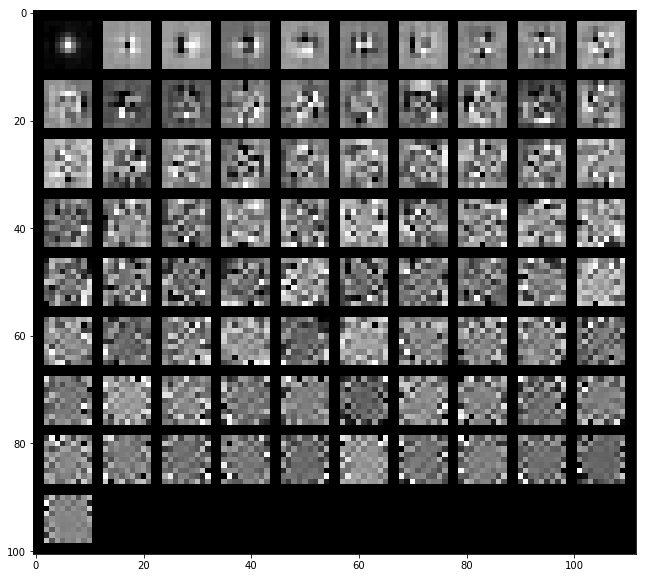

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1810/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22293255 0.32723512 0.41977967 0.47810824 0.52914074 0.57532589
 0.61786175 0.65361018 0.68141377 0.70600148 0.72771528 0.74902529
 0.76629871 0.78216518 0.79752118 0.81068727 0.82363124 0.83571475
 0.84652493 0.85701184]


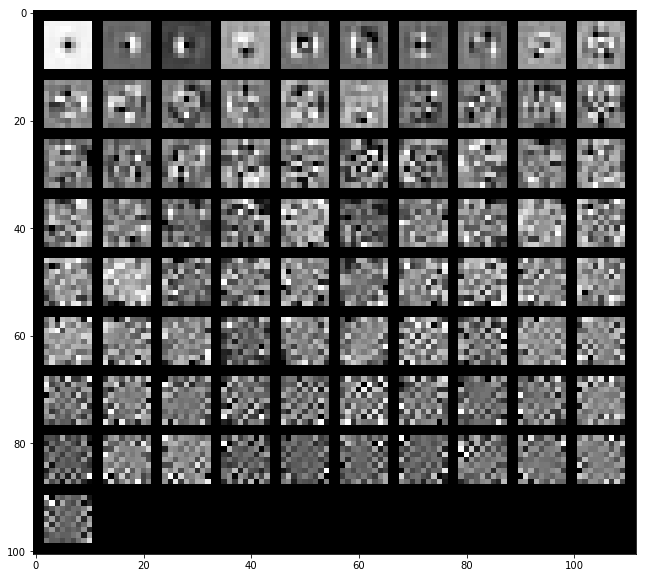

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21173619 0.30619963 0.38614867 0.45179063 0.51271205 0.55146323
 0.58775604 0.61650292 0.64302384 0.66785649 0.68966638 0.70827623
 0.72548575 0.74143063 0.75628203 0.769053   0.78151148 0.79357137
 0.80450181 0.8145357 ]


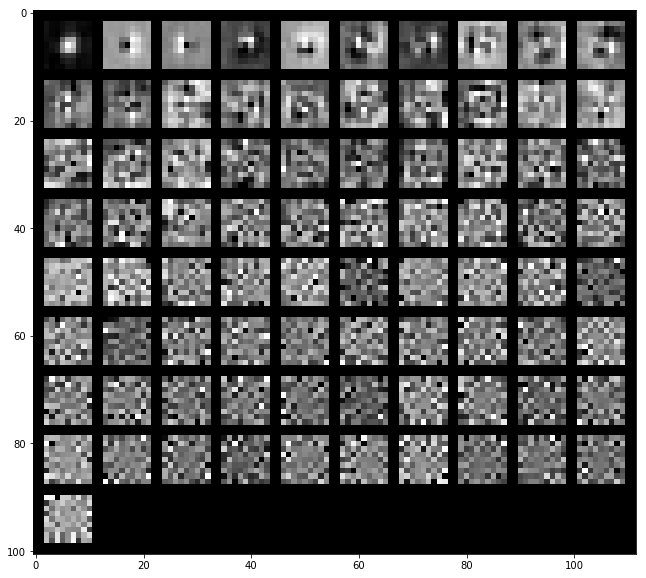

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20475189 0.30752458 0.39376255 0.45304201 0.50419511 0.54210818
 0.57714615 0.60954659 0.63836752 0.66173394 0.68242688 0.70169602
 0.71875022 0.73477406 0.75003287 0.76390973 0.77695062 0.78860552
 0.79929472 0.8096635 ]


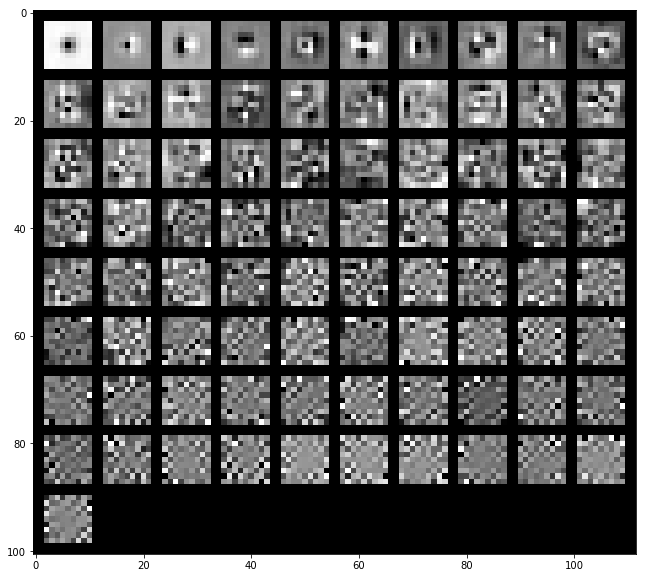

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1811/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17502705 0.26582143 0.34269725 0.4069183  0.46024557 0.51087375
 0.54710996 0.57915656 0.61098144 0.63968627 0.66479795 0.68795718
 0.70964614 0.72816858 0.74457875 0.76068089 0.77467443 0.78835356
 0.80082967 0.8128432 ]


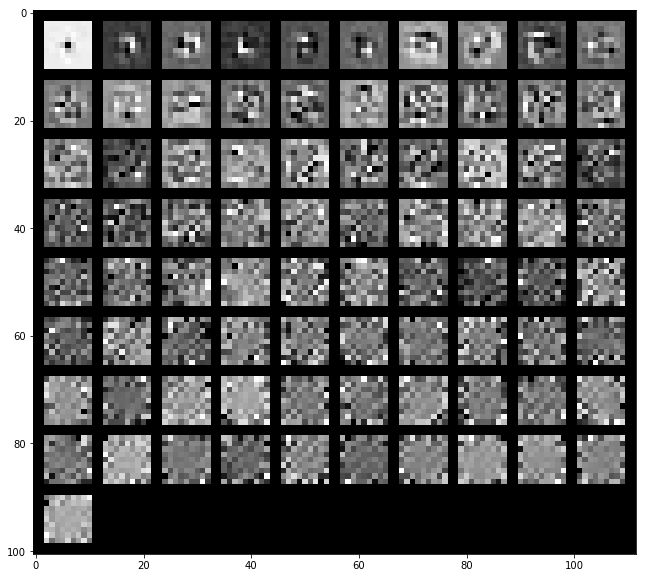

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14956559 0.24268219 0.30757098 0.36687005 0.42065765 0.46872218
 0.50666212 0.54179163 0.57548612 0.60409602 0.63180172 0.65738258
 0.67983978 0.69785394 0.71565544 0.7320772  0.74736348 0.76164055
 0.77415447 0.78657907]


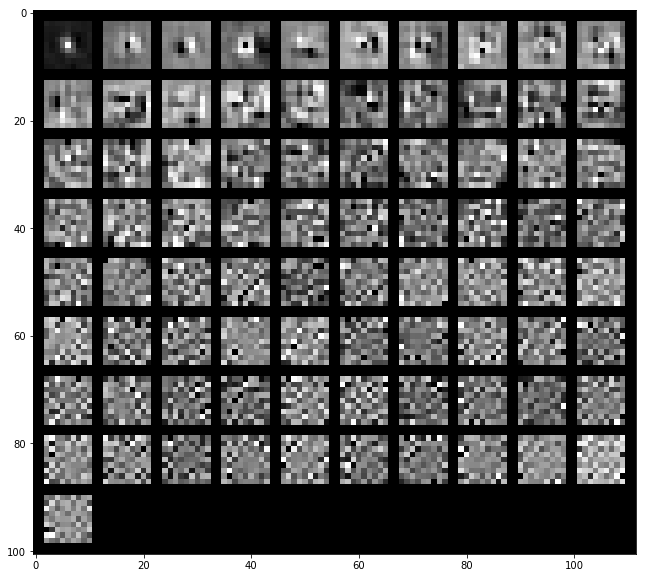

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15418973 0.24058149 0.30597262 0.36571336 0.41558098 0.46059528
 0.49974839 0.5340677  0.5635285  0.58933125 0.61345867 0.63583887
 0.65741962 0.67618055 0.69292758 0.7090602  0.72461378 0.73829097
 0.75115673 0.76303947]


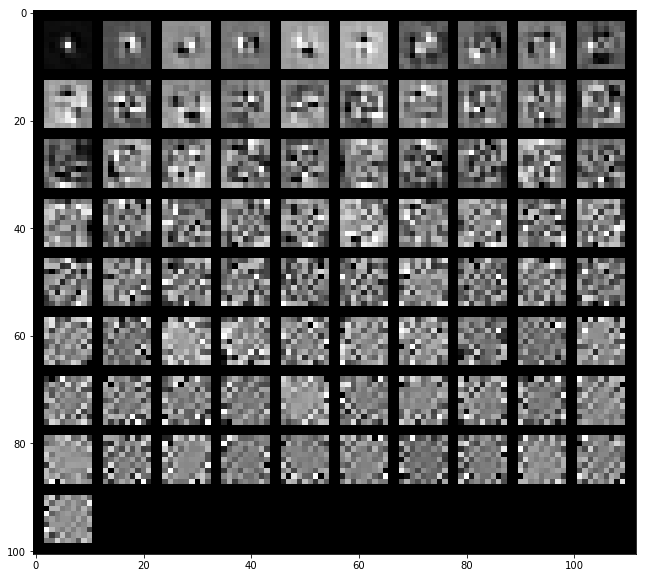

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1822/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18518699 0.28144477 0.34791647 0.39749421 0.44021442 0.4800528
 0.51421044 0.5468394  0.57711827 0.60603529 0.63301341 0.65670725
 0.67947299 0.69895731 0.71633774 0.73341241 0.74726049 0.76033858
 0.77256756 0.7842498 ]


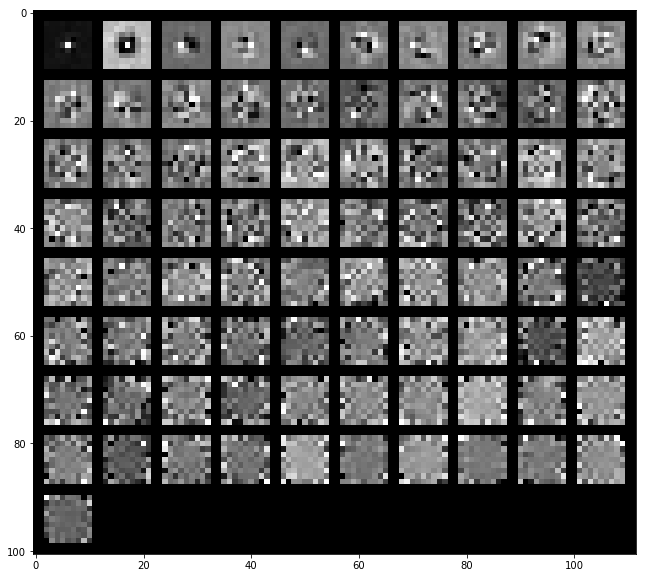

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18672536 0.27529389 0.34178928 0.40430559 0.45437027 0.49214293
 0.52302947 0.55031208 0.57641709 0.60085665 0.62425764 0.64566834
 0.66547687 0.68415987 0.70187309 0.71848846 0.73325824 0.74622157
 0.75862384 0.77046282]


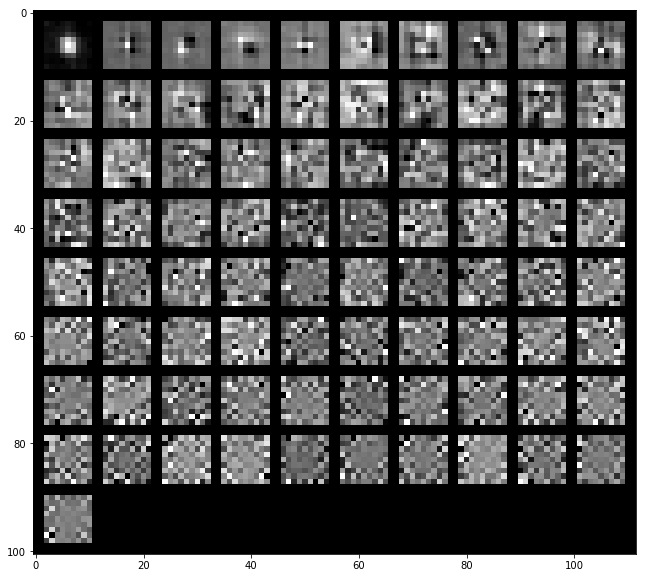

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1605054  0.26746505 0.33131717 0.38170691 0.42832283 0.46357804
 0.4959194  0.52386011 0.55056577 0.57643181 0.60013381 0.62316245
 0.64406928 0.66197972 0.67801339 0.69318169 0.70800983 0.72184609
 0.7341727  0.74629207]


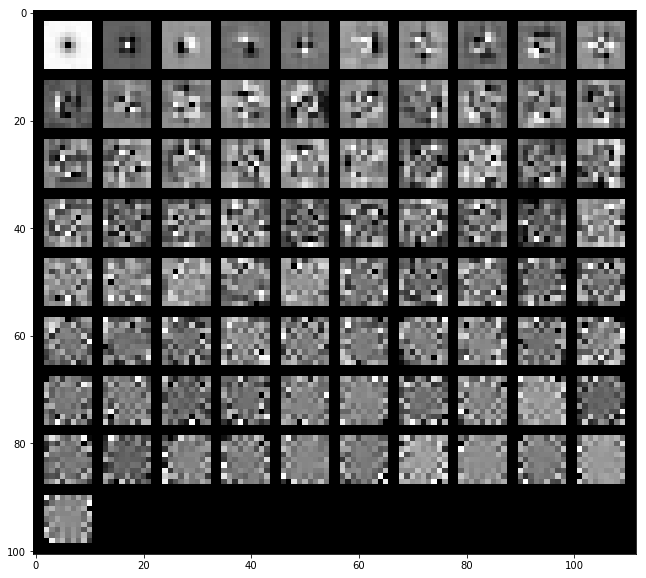

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1930/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15127421 0.24676249 0.326264   0.3843846  0.4391645  0.4865748
 0.52685224 0.56314093 0.59469931 0.62283328 0.64772453 0.67035117
 0.69144174 0.71097542 0.72805575 0.74377764 0.75816319 0.77217395
 0.78553709 0.79790381]


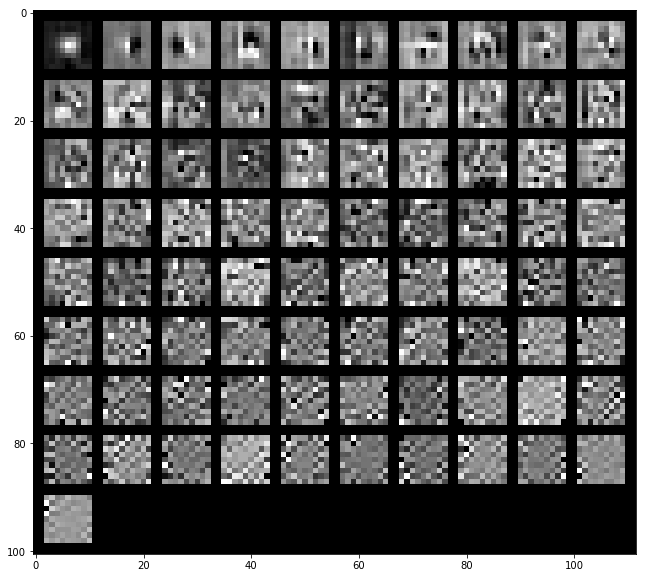

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16797507 0.27257839 0.3505265  0.41139806 0.46367402 0.50104927
 0.53719457 0.57005121 0.60073561 0.62844823 0.65532714 0.67746194
 0.69838516 0.71822858 0.73525276 0.75137617 0.76660214 0.78123057
 0.79517457 0.80707713]


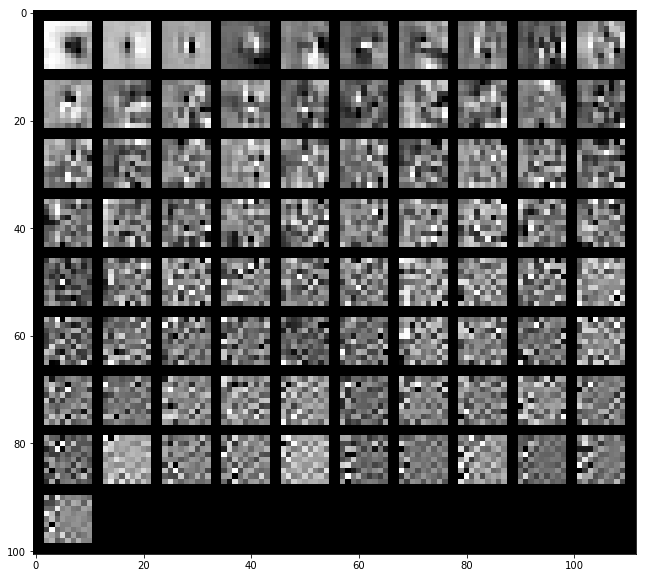

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14661161 0.24143885 0.31058122 0.36423142 0.41473382 0.4584075
 0.49462283 0.52810168 0.55864487 0.58576667 0.61041166 0.63286213
 0.65445321 0.67422046 0.69171921 0.70877737 0.72491815 0.73963006
 0.75318681 0.76623661]


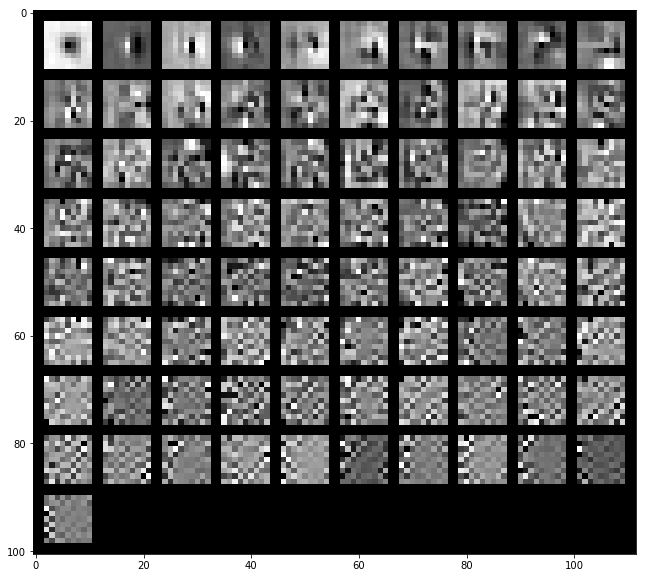

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1931/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.21219688 0.30359046 0.38019798 0.44826893 0.49726157 0.53985103
 0.57678314 0.60991213 0.64197241 0.66705835 0.68998946 0.71238843
 0.73382661 0.75159059 0.76841034 0.78353815 0.79768822 0.81128117
 0.82312666 0.8347398 ]


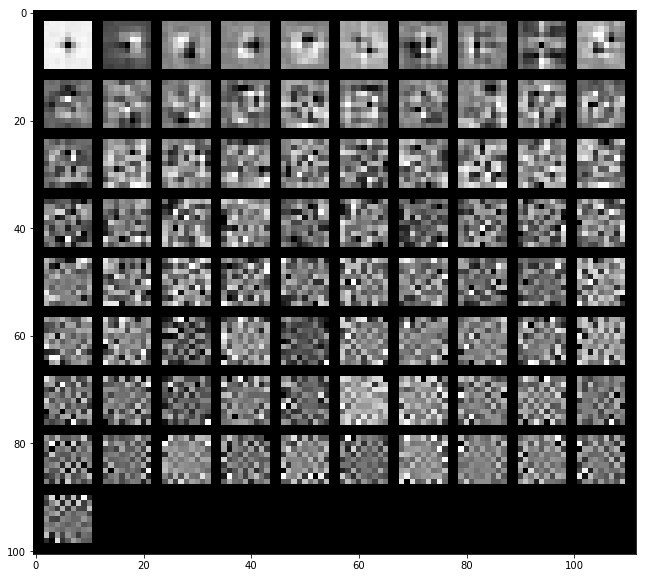

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1535351  0.24699813 0.31777046 0.37921846 0.43068261 0.47721256
 0.51806202 0.55254947 0.58114722 0.60806345 0.63344789 0.65512146
 0.67474661 0.69356354 0.71093593 0.72703756 0.74179034 0.75585907
 0.76953384 0.78177385]


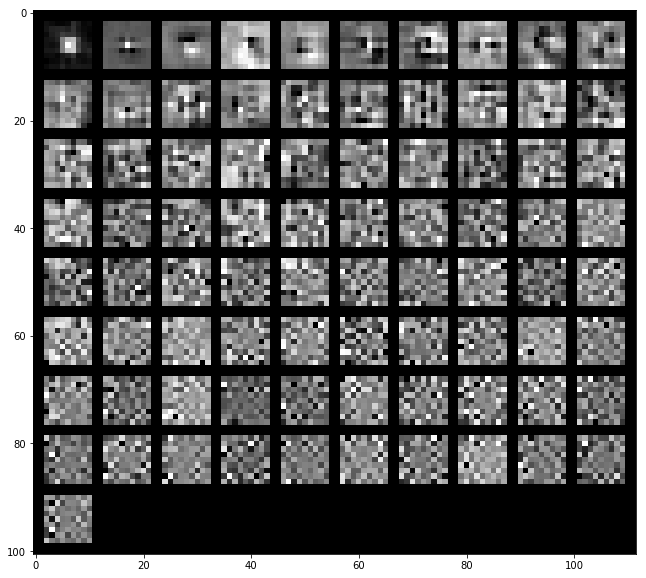

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18006655 0.27447624 0.33979893 0.40121697 0.44915994 0.49315316
 0.52998618 0.56040767 0.58902137 0.61384597 0.63825816 0.66092974
 0.67980362 0.69670125 0.71259689 0.72758033 0.74198742 0.75516813
 0.76786441 0.77972062]


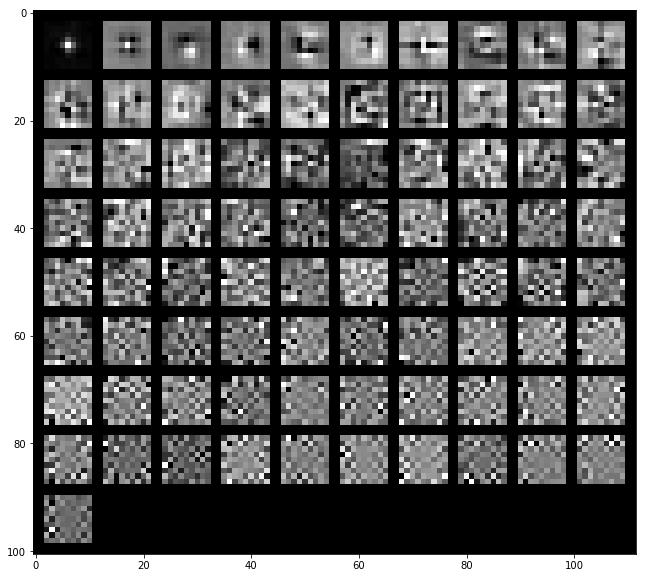

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1942/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16788102 0.25542409 0.33001075 0.39623405 0.44823679 0.49227667
 0.53433433 0.56941995 0.59777611 0.62543369 0.64930634 0.67047365
 0.69093693 0.70968154 0.72772276 0.7429727  0.75767877 0.77137877
 0.78415912 0.79603209]


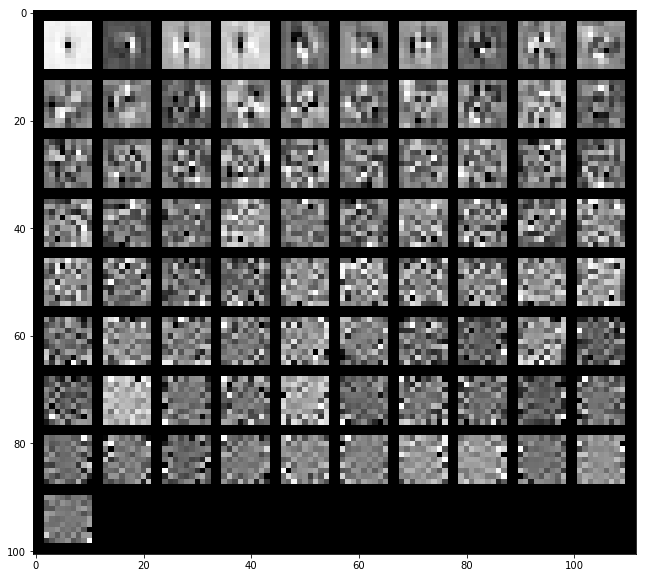

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1520794  0.23678588 0.29526848 0.3521932  0.40066918 0.43721551
 0.47076797 0.50123612 0.53097216 0.55819752 0.58122929 0.60326794
 0.62226895 0.64078977 0.65779533 0.67435298 0.69007381 0.705617
 0.72058652 0.73410021]


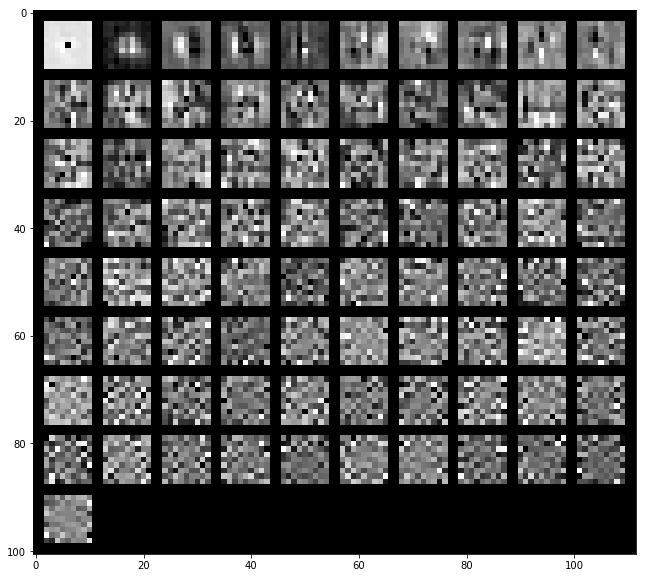

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15932346 0.24035031 0.30313495 0.36334137 0.40857605 0.44947796
 0.48794905 0.51766207 0.54536543 0.57098712 0.59259359 0.6122356
 0.63169812 0.64973649 0.66654656 0.68177639 0.69583729 0.70981866
 0.72311333 0.73604255]


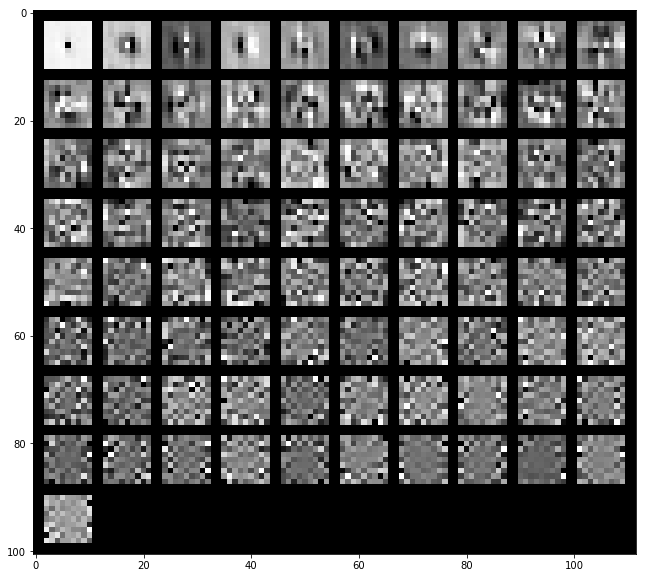

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1943/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13634074 0.22883561 0.30303534 0.36304859 0.41414682 0.46322242
 0.50194046 0.53654169 0.56983995 0.59921067 0.62564628 0.65157435
 0.6722253  0.69093232 0.7093641  0.72674093 0.74242444 0.75732448
 0.77071063 0.78368471]


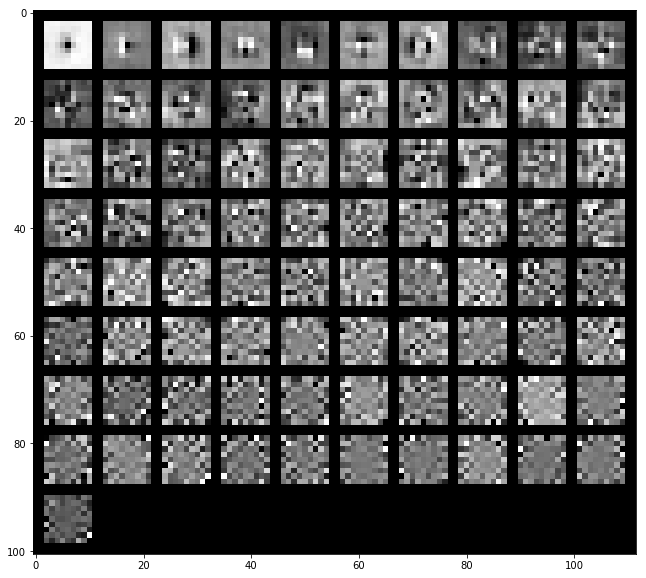

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.23030536 0.35374708 0.41924737 0.46809632 0.50676138 0.5384369
 0.56720219 0.59569433 0.62056503 0.6435773  0.664732   0.68464942
 0.70355429 0.72026178 0.73579589 0.74986135 0.76285188 0.77479223
 0.78661077 0.79721439]


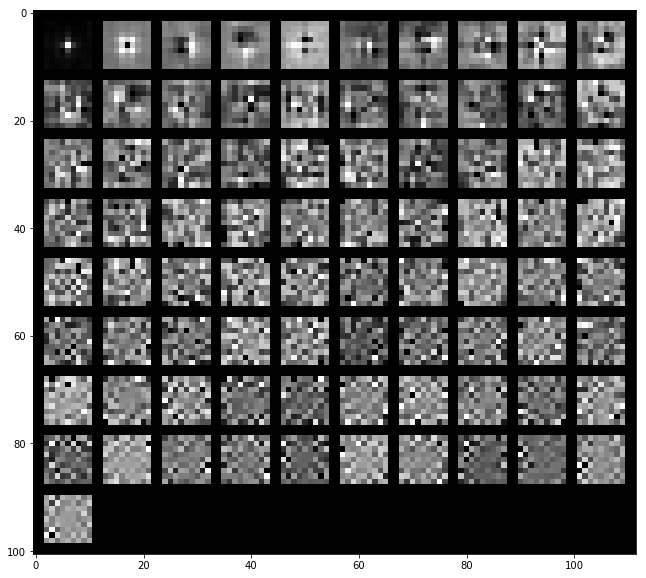

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18319543 0.28386677 0.35292793 0.40238782 0.44426899 0.48459633
 0.5153615  0.54455988 0.57079415 0.59664764 0.62026469 0.64164943
 0.66134841 0.67935701 0.69596822 0.71100446 0.72534242 0.73911651
 0.75123924 0.76248977]


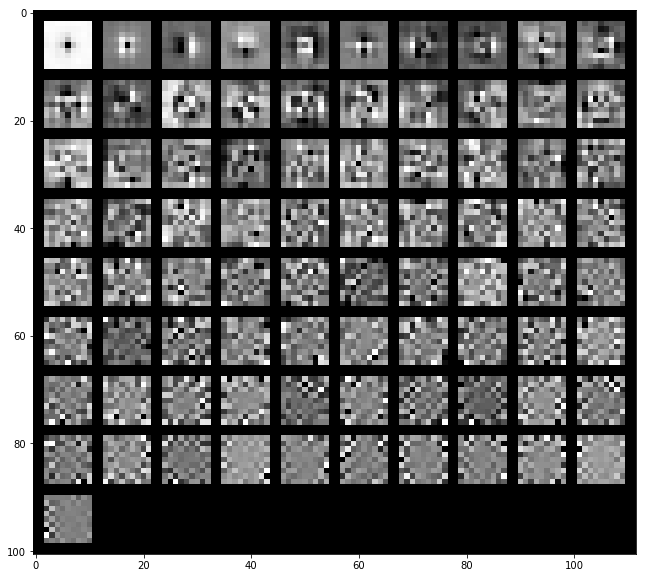

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1955/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18579999 0.27740857 0.34636988 0.41372347 0.46982683 0.51652338
 0.55837032 0.59412438 0.62684347 0.65458857 0.68059252 0.70238432
 0.72283459 0.74077603 0.75667787 0.77148254 0.7850588  0.79804289
 0.81065077 0.82239463]


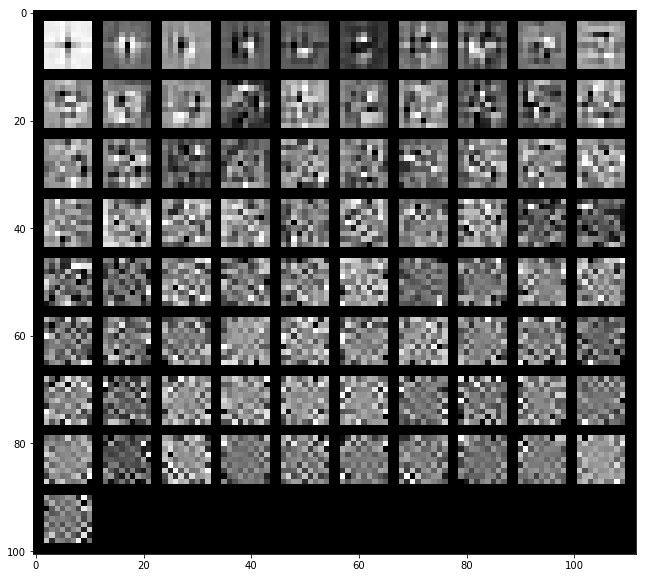

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.26600888 0.34003113 0.40427024 0.44548804 0.48396582 0.51833088
 0.54938163 0.57781046 0.60294815 0.62547891 0.64580509 0.66537994
 0.68398372 0.70155523 0.71775533 0.73289676 0.74782985 0.76204117
 0.7754892  0.78757456]


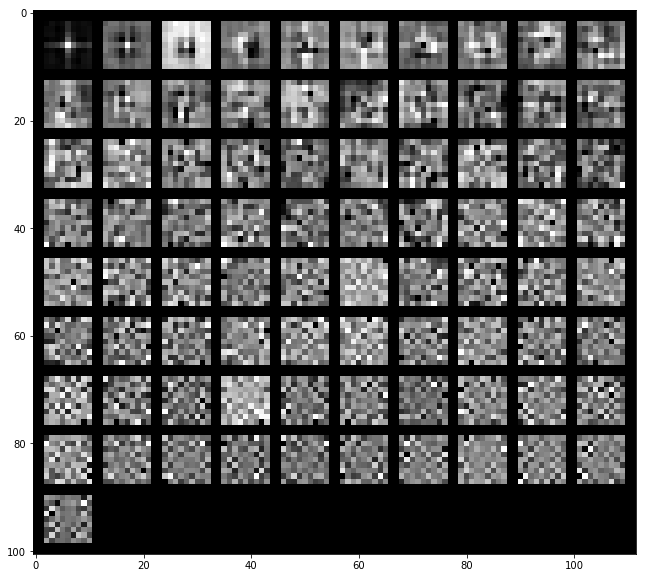

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.24188385 0.32374094 0.37949737 0.42724343 0.46913689 0.50558558
 0.538007   0.56994747 0.59586233 0.61985712 0.64318191 0.66503377
 0.68394893 0.70126385 0.71799758 0.73223526 0.74501093 0.75750187
 0.76975806 0.78118478]


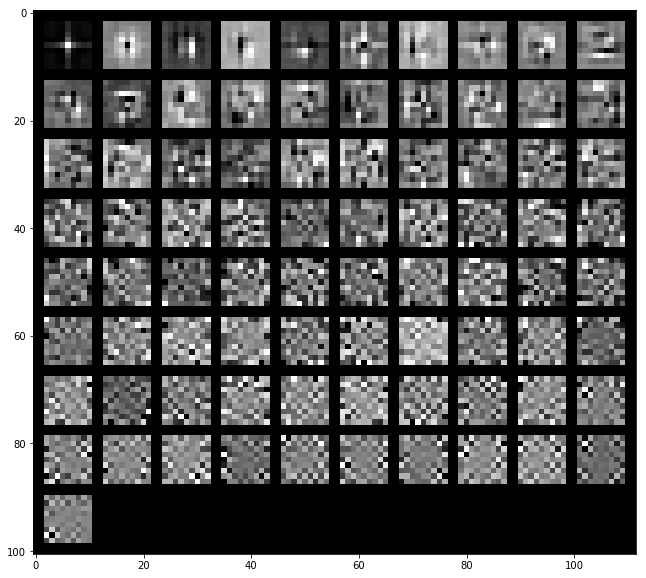

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1966/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1598497  0.2447098  0.30793765 0.36371078 0.41266635 0.45474228
 0.49089055 0.52581661 0.55800815 0.58671835 0.61452341 0.63748536
 0.65897528 0.67917838 0.69772597 0.71458426 0.73087914 0.74670156
 0.76056183 0.77346048]


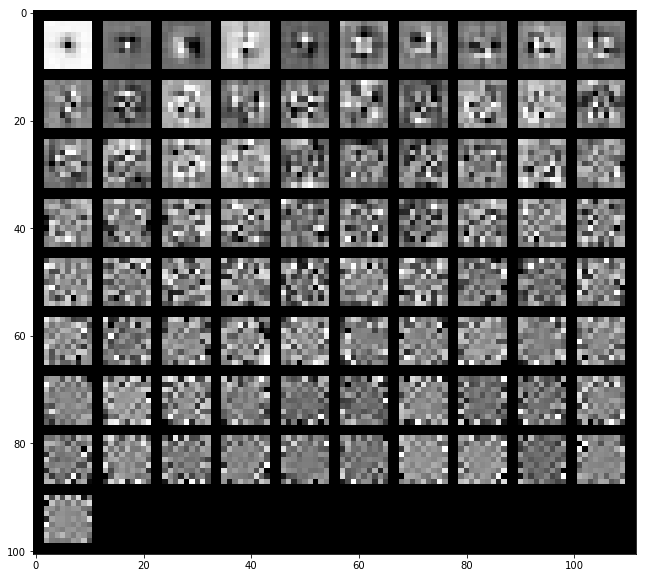

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17768601 0.28450662 0.34790646 0.398749   0.44770878 0.49019071
 0.52656266 0.55762283 0.58448386 0.61038316 0.63327507 0.65432408
 0.67364614 0.69272263 0.7107977  0.72811189 0.74325721 0.75651692
 0.7694865  0.78128794]


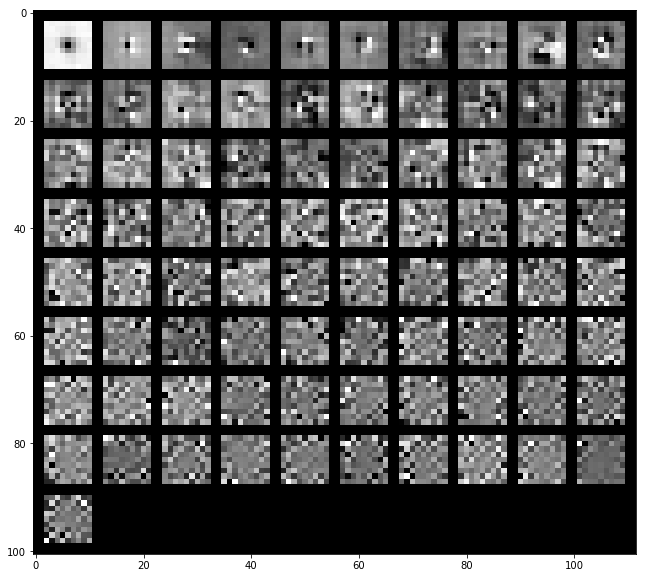

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16751822 0.25946127 0.31650411 0.36654754 0.41351469 0.45402872
 0.48710839 0.51672574 0.54540291 0.5710537  0.59579219 0.61892214
 0.6406514  0.6599039  0.67682326 0.69304234 0.70913123 0.72382958
 0.73678685 0.7489948 ]


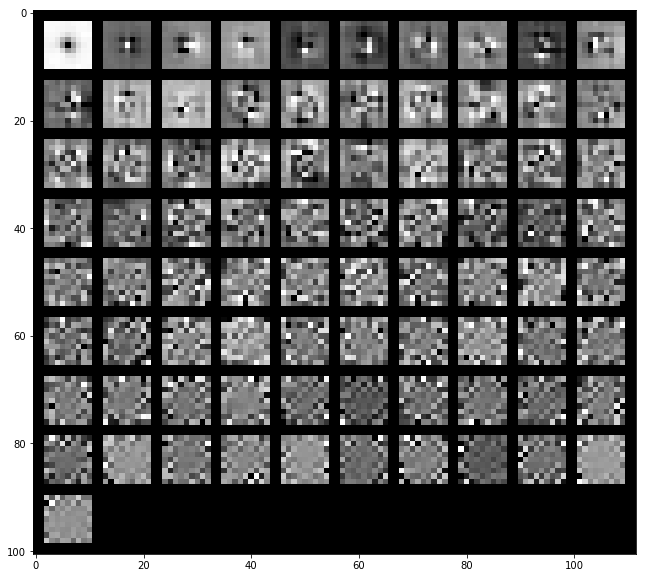

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1967/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16659388 0.25451662 0.33614869 0.40377206 0.45372131 0.49809192
 0.53759042 0.57577552 0.61027419 0.63836293 0.66333958 0.6875166
 0.70968471 0.72919857 0.7460302  0.76211848 0.77732276 0.79114069
 0.80380602 0.8161189 ]


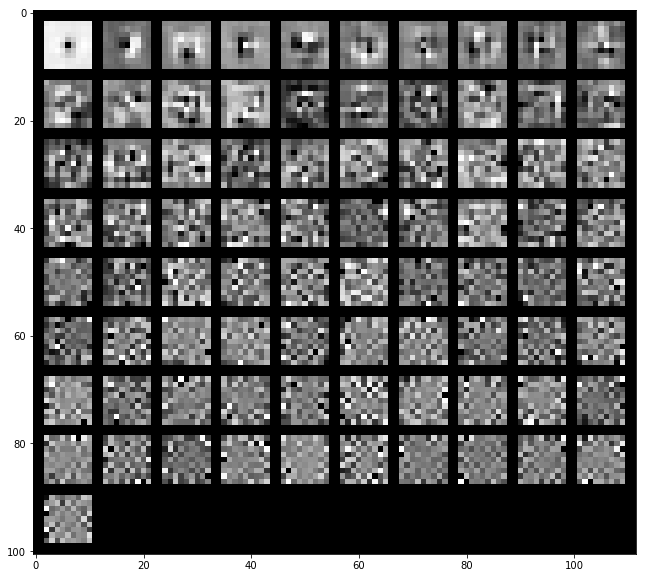

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15511154 0.25337481 0.31355104 0.36961216 0.41752359 0.45938879
 0.49755742 0.53193092 0.56104615 0.58777802 0.61370341 0.63607494
 0.6571817  0.67739898 0.69568728 0.71274645 0.72929081 0.74491062
 0.75901937 0.77167777]


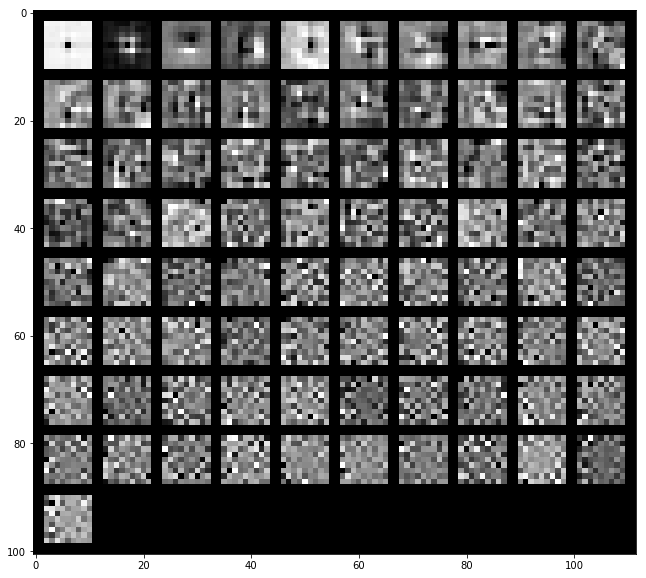

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16281394 0.25014408 0.313133   0.37259839 0.41855924 0.46098114
 0.49514015 0.52651015 0.55647039 0.58315267 0.60808784 0.63229515
 0.65197798 0.67073528 0.68822775 0.70548455 0.72071828 0.73537522
 0.74883611 0.7617715 ]


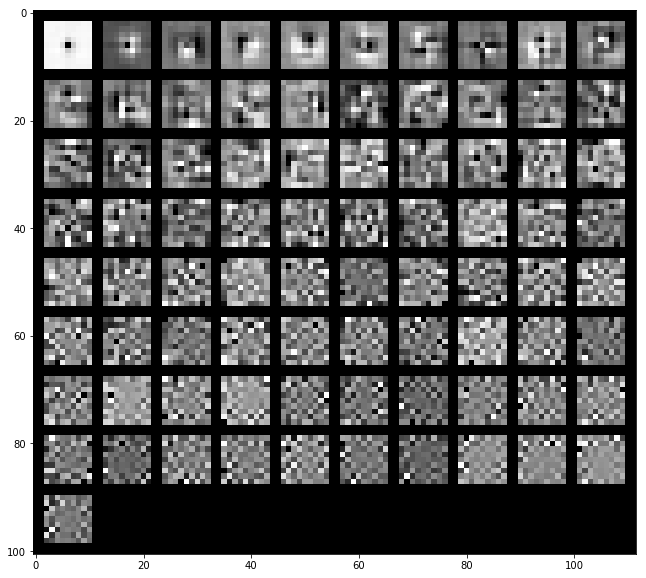

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1978/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13931947 0.22824604 0.30964952 0.36734116 0.41620078 0.45921591
 0.49799517 0.53322035 0.56556477 0.59257434 0.61745284 0.63920083
 0.66061489 0.68004331 0.69922058 0.71651061 0.73308553 0.74795273
 0.76222081 0.77540346]


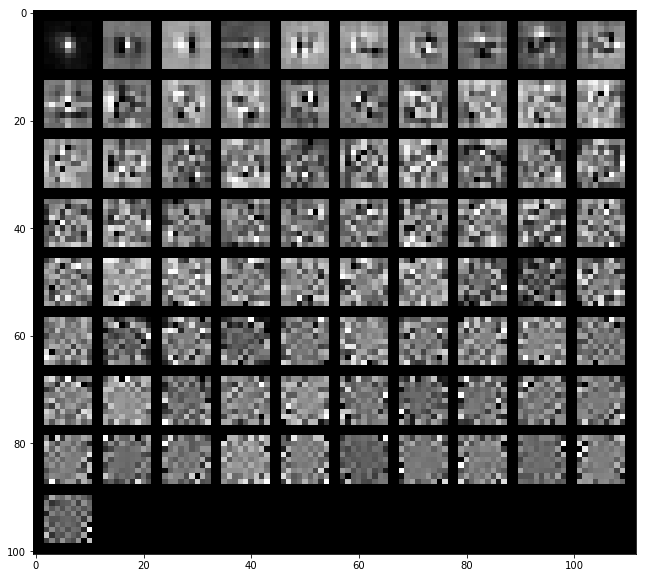

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18682012 0.29131385 0.35259377 0.41125103 0.45172909 0.48830034
 0.52345915 0.55256418 0.58038329 0.60504753 0.62918102 0.65140447
 0.6717023  0.69066799 0.70738497 0.72333644 0.73886365 0.75387997
 0.76717113 0.77994604]


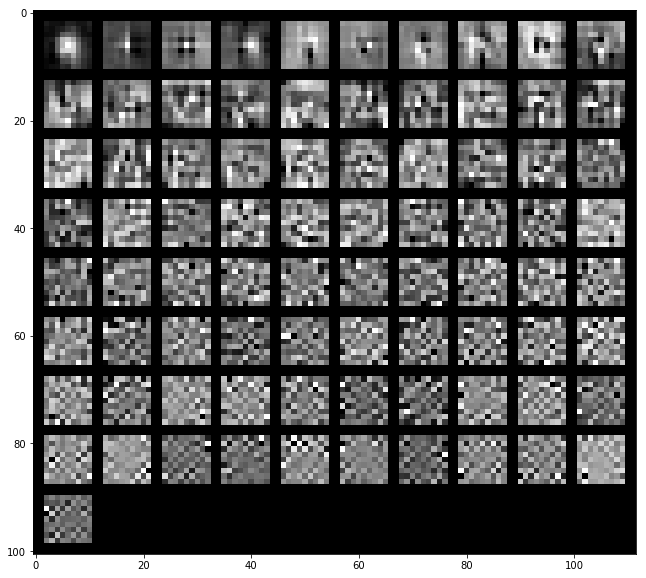

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15545046 0.2484377  0.3118191  0.36511224 0.40597215 0.44314555
 0.47890986 0.51116827 0.54013033 0.56661665 0.59003727 0.61193599
 0.63309353 0.65175082 0.668615   0.68468146 0.70002073 0.71473338
 0.7289218  0.74238001]


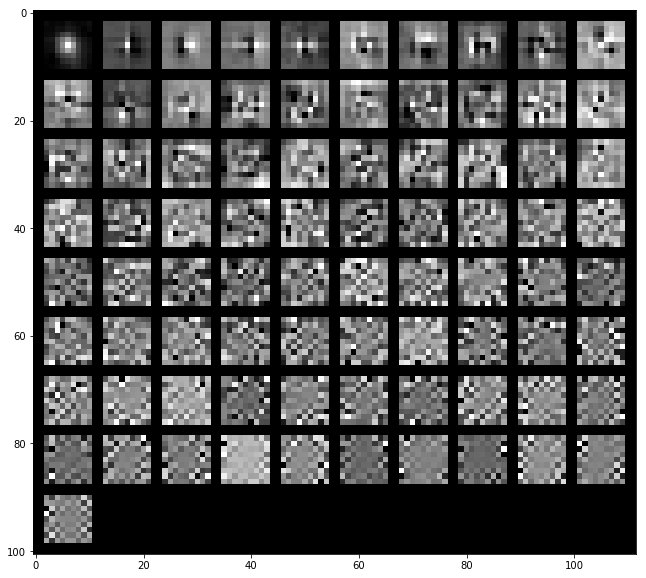

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1990/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18547403 0.28168315 0.3632513  0.41968961 0.46804006 0.50803875
 0.54476053 0.57816937 0.6062628  0.63123567 0.65525278 0.67686414
 0.69681784 0.71500274 0.73128225 0.74685928 0.76189193 0.77528216
 0.78850484 0.79995713]


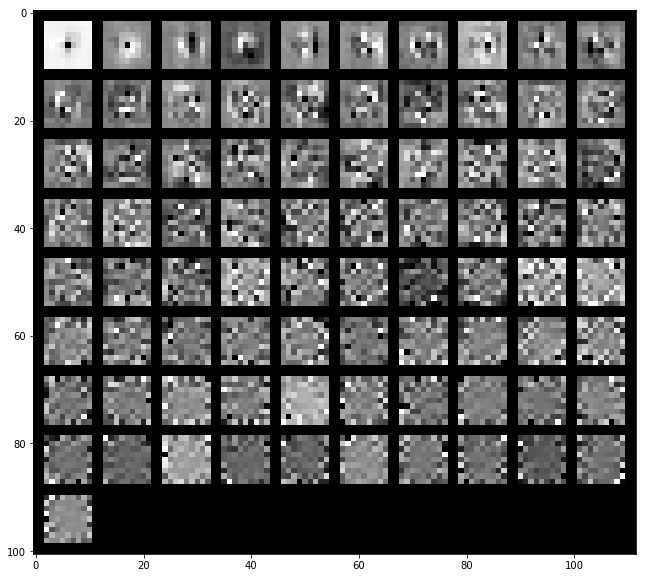

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20040354 0.34558209 0.41938499 0.47158665 0.51376741 0.54863181
 0.57855808 0.60768291 0.63326954 0.65751277 0.68031738 0.69968631
 0.71685071 0.73225718 0.74739126 0.76207594 0.77569947 0.78749239
 0.79844037 0.80835519]


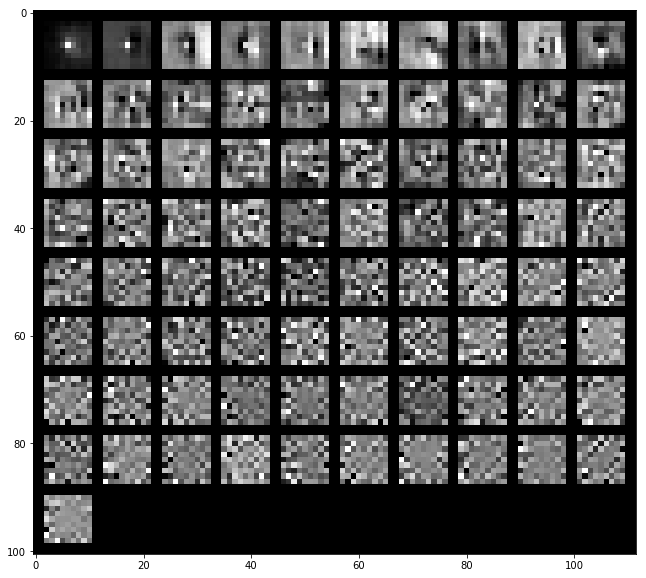

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18646797 0.30150373 0.36472509 0.42326368 0.46508818 0.50179833
 0.53587435 0.56331655 0.58810561 0.61107541 0.63357589 0.65284851
 0.67136552 0.68891507 0.70569767 0.72151661 0.73455706 0.74692669
 0.7587519  0.77018075]


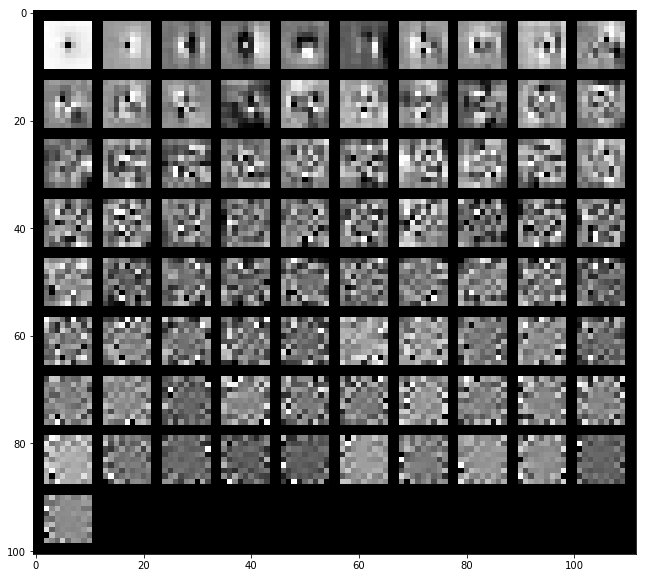

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx1991/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16214604 0.25563136 0.32196562 0.37533847 0.42588166 0.46859979
 0.50494703 0.53883682 0.56859679 0.59751843 0.62518657 0.65049884
 0.67269038 0.69370557 0.71229885 0.73028449 0.74726758 0.76213728
 0.77550182 0.78838569]


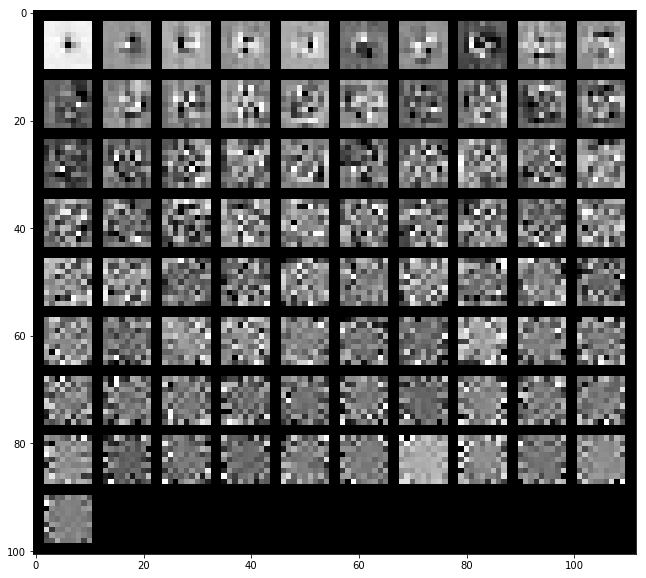

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17377359 0.28359236 0.36241448 0.41941004 0.46502053 0.50181421
 0.53621354 0.56930019 0.59765654 0.62423165 0.64728154 0.66998157
 0.68907077 0.70723963 0.72507382 0.74076752 0.75548854 0.76938829
 0.78224344 0.7941277 ]


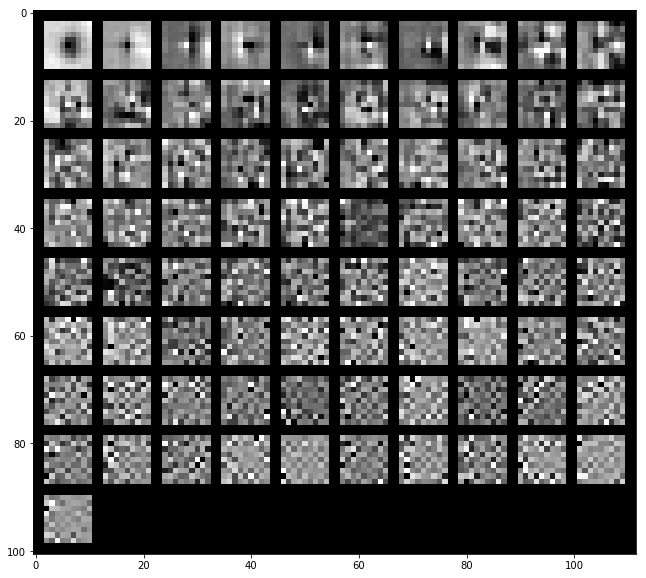

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15497158 0.25488057 0.31361634 0.36977693 0.40988019 0.44917247
 0.48515276 0.51546869 0.54454604 0.57155745 0.59465056 0.61635847
 0.63670938 0.656085   0.67390728 0.6912662  0.70699246 0.72157271
 0.73471462 0.74759316]


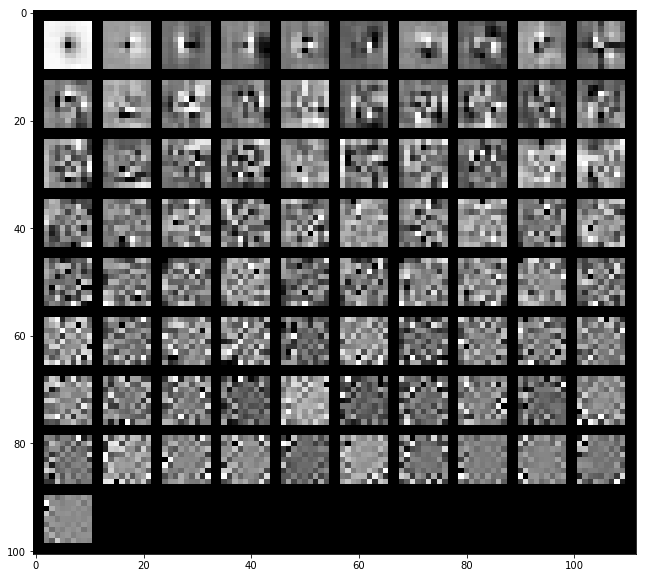

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2002/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18869227 0.28735211 0.35720664 0.42043897 0.47294958 0.51763089
 0.55518054 0.59087695 0.6203699  0.64732664 0.67097818 0.69389927
 0.71428446 0.73338949 0.7506765  0.76707862 0.78196299 0.79526827
 0.80798692 0.82055159]


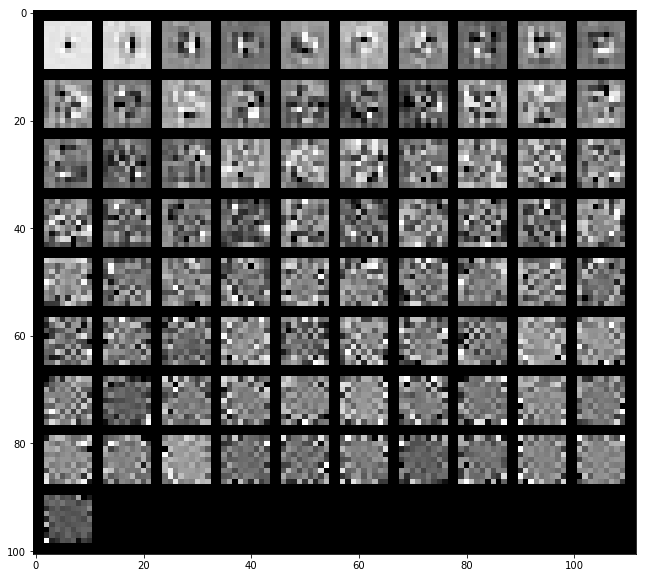

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.26448098 0.33546479 0.38771225 0.4360986  0.47404371 0.50862072
 0.53700302 0.56382285 0.58765786 0.61028174 0.63226718 0.65354676
 0.67388453 0.69099321 0.70675465 0.72200927 0.7368139  0.74985008
 0.76265212 0.77473794]


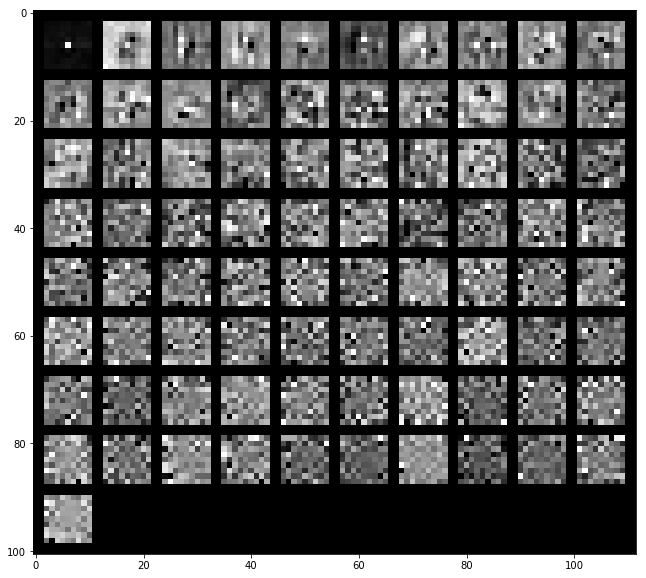

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22952242 0.307674   0.36193991 0.41190099 0.45139523 0.48622584
 0.51825987 0.54861833 0.57495448 0.59897713 0.62239342 0.64388094
 0.66231463 0.6797049  0.6967111  0.71260777 0.72777809 0.74118152
 0.75328912 0.76496191]


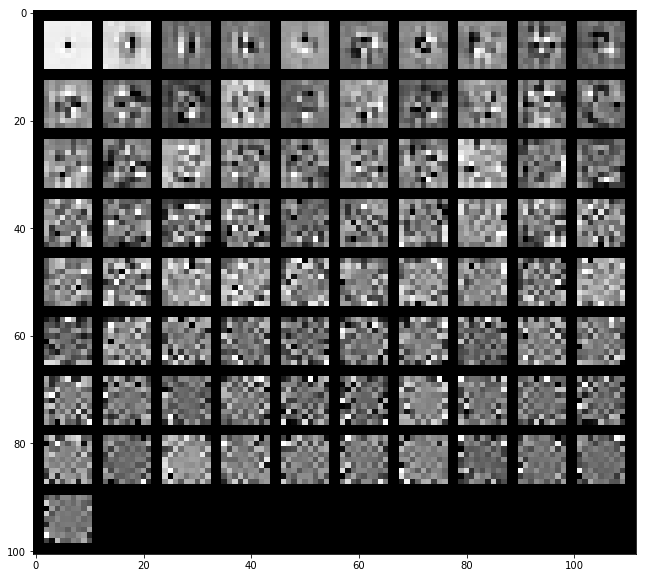

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2003/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.11987274 0.20974746 0.2840769  0.34037101 0.38664889 0.4266549
 0.46503471 0.49852302 0.5283669  0.55703712 0.58355957 0.60927579
 0.63255498 0.65517806 0.67643568 0.69544698 0.71271042 0.72948515
 0.7445421  0.75881246]


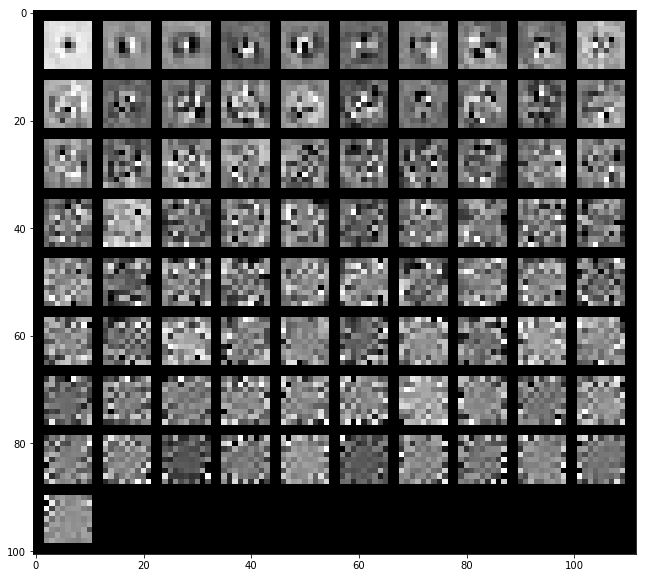

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15990967 0.24987591 0.32256589 0.38999575 0.43658718 0.47829329
 0.51842159 0.55504351 0.5862532  0.61232345 0.63680976 0.65992853
 0.68260633 0.70267825 0.72049795 0.73689799 0.75045561 0.76341924
 0.77603258 0.78817488]


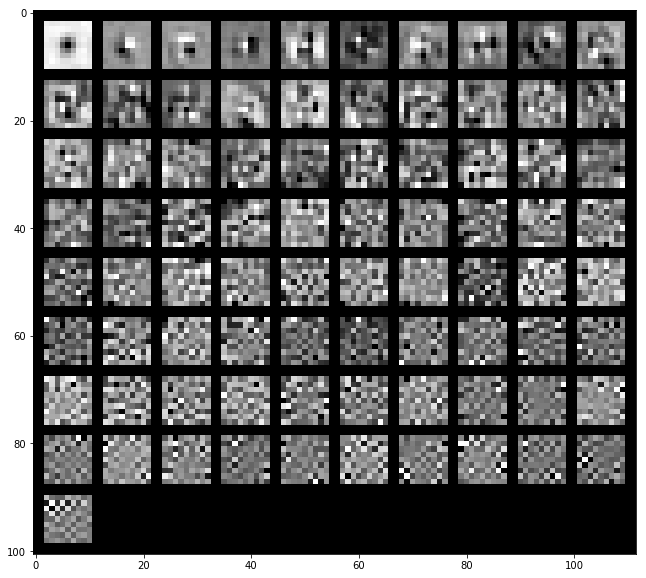

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14034153 0.22747979 0.29692044 0.35293434 0.39800474 0.4360289
 0.4720483  0.50439326 0.53278757 0.55810528 0.58218039 0.60547497
 0.62522848 0.64378871 0.6614313  0.67865958 0.69509024 0.70985475
 0.72360334 0.73725513]


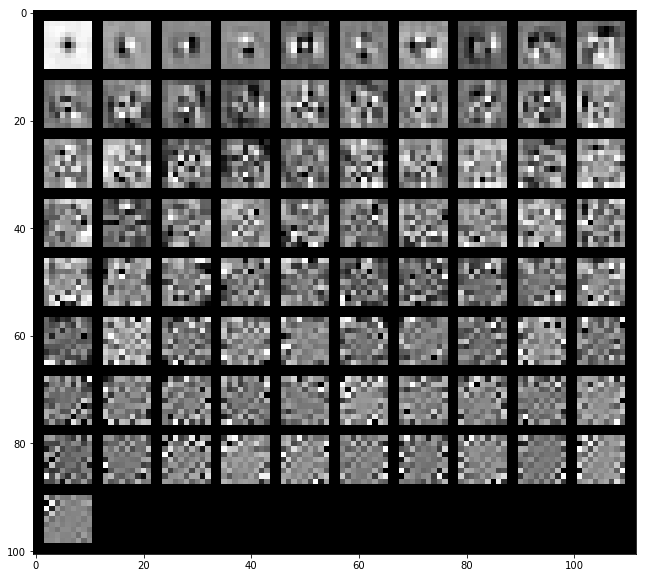

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2015/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1650024  0.25348787 0.32242263 0.38650205 0.44561481 0.491777
 0.53321398 0.57220822 0.6016576  0.6290678  0.65380286 0.67699515
 0.69713309 0.71629485 0.73413442 0.74979721 0.76442789 0.77817567
 0.79156976 0.80450529]


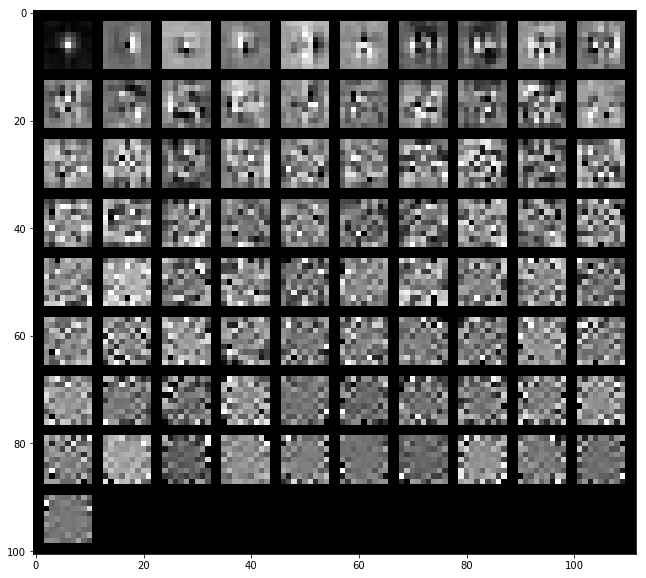

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16825137 0.29257343 0.35944696 0.41583774 0.46152316 0.5012948
 0.53708824 0.57051194 0.59909147 0.62548544 0.64871802 0.67047878
 0.69030076 0.70908831 0.72725248 0.74312476 0.7575137  0.77130611
 0.78406078 0.79554864]


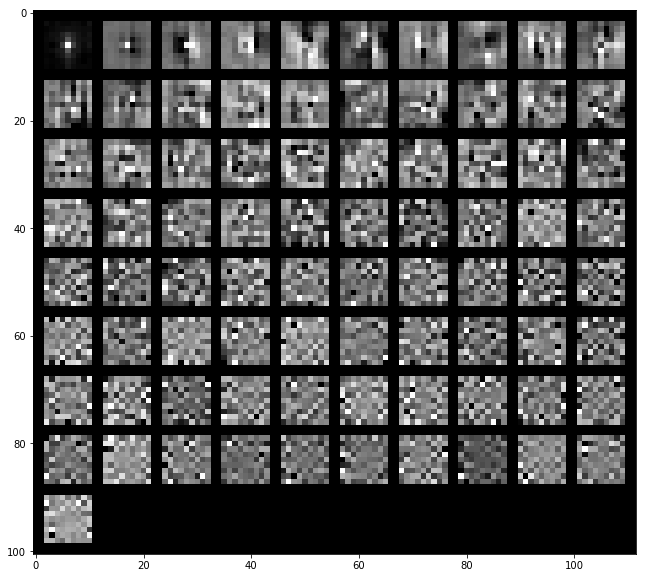

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16601505 0.26510787 0.33151261 0.38795304 0.43534135 0.47690266
 0.51418812 0.547276   0.57684274 0.60386059 0.62665482 0.64683807
 0.666034   0.68417947 0.70150433 0.71656407 0.73102918 0.74423983
 0.75658749 0.76875681]


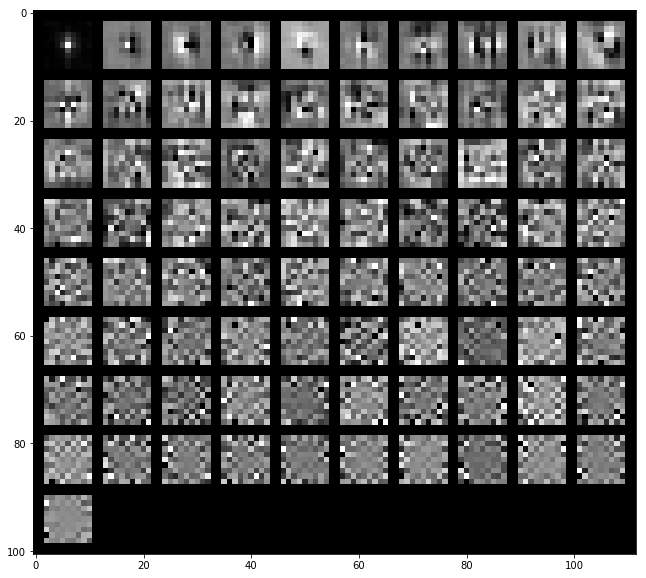

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2122/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1431574  0.24072422 0.32727631 0.38889548 0.43839757 0.48360536
 0.52574978 0.55789498 0.58713442 0.61320012 0.637831   0.66178382
 0.68265812 0.70199265 0.71949937 0.73668737 0.75186881 0.76656538
 0.78086932 0.79304369]


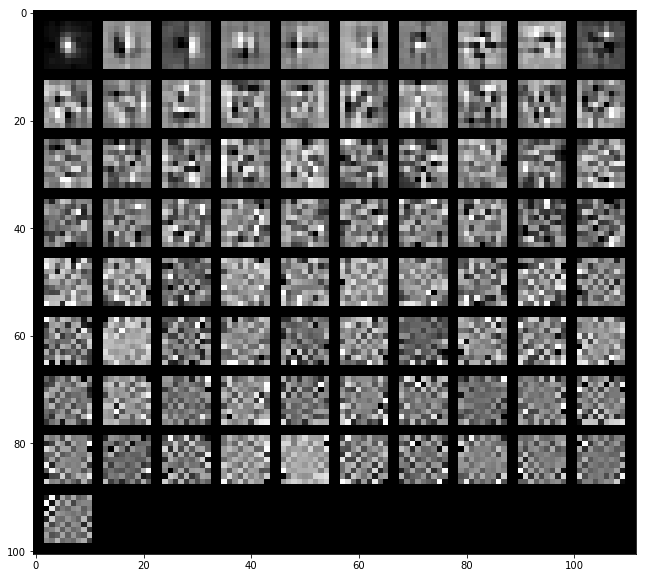

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13493682 0.22032794 0.29290947 0.35704137 0.40929262 0.45330458
 0.4901175  0.52327358 0.55521905 0.58389591 0.61012412 0.63277036
 0.65450587 0.67470541 0.69388504 0.71211108 0.72953642 0.74418281
 0.75758913 0.76996416]


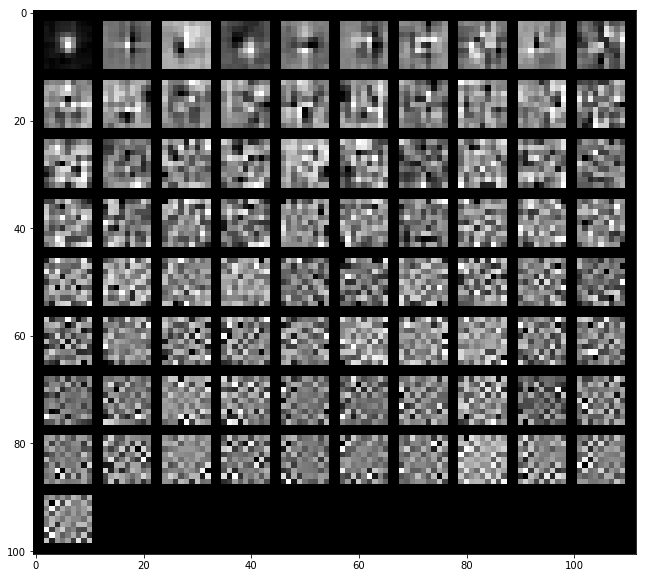

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.13417599 0.21787476 0.29712738 0.35412689 0.40372768 0.44943559
 0.48771258 0.51926336 0.54831784 0.57477237 0.59770229 0.61978621
 0.64064324 0.65951558 0.67780416 0.6952902  0.71086981 0.7245264
 0.73790407 0.75114733]


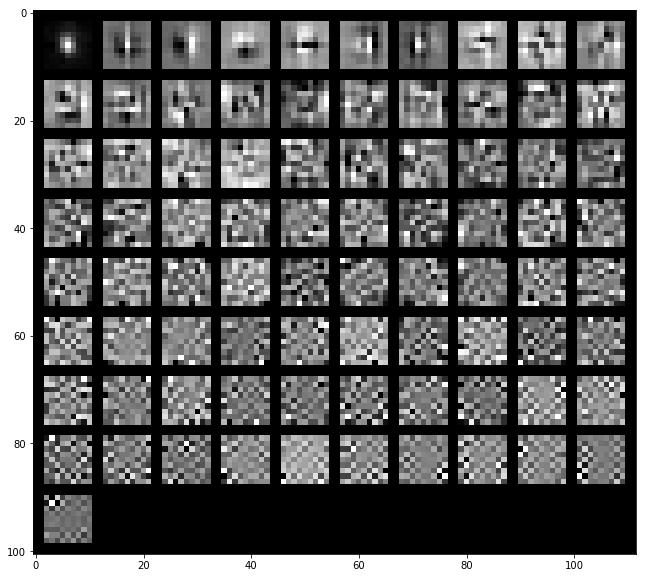

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2123/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18198413 0.27701657 0.35881453 0.4173762  0.47416012 0.52894269
 0.56583288 0.59586679 0.625091   0.65125431 0.67627913 0.69789697
 0.71673202 0.73497894 0.75038759 0.76567367 0.77932072 0.7914715
 0.80295138 0.81424652]


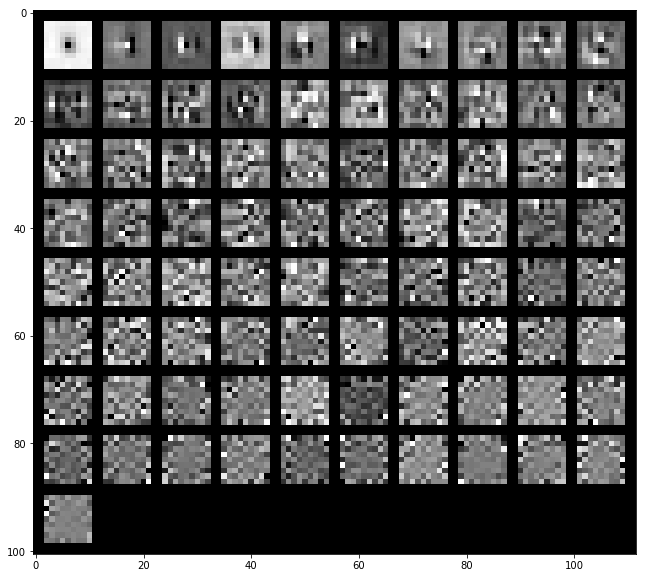

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15439487 0.28669896 0.36369061 0.41517224 0.45762963 0.49869296
 0.53219018 0.56098456 0.5867115  0.61225534 0.63441202 0.65522536
 0.67443107 0.69222117 0.70958693 0.7256564  0.74004659 0.75394395
 0.76710856 0.77880297]


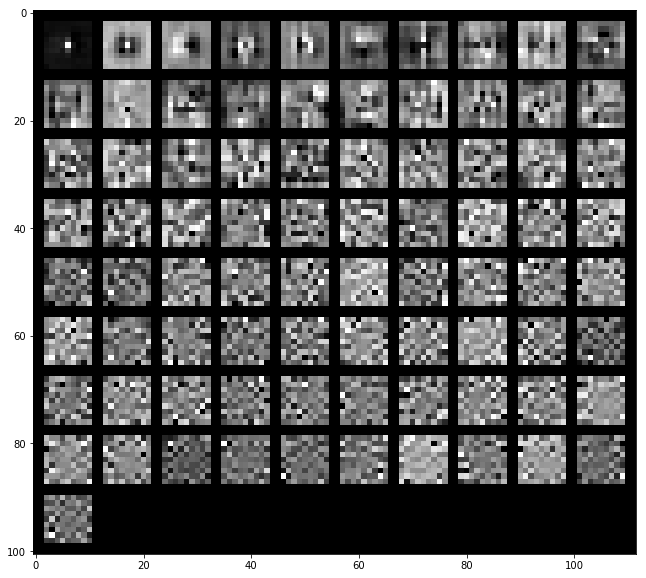

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16466586 0.27138263 0.34851319 0.40226864 0.45171399 0.49694536
 0.53247471 0.56031509 0.58419901 0.60753374 0.63051654 0.64989061
 0.66911575 0.68509558 0.7003442  0.71529432 0.72969406 0.74337753
 0.7561235  0.76803421]


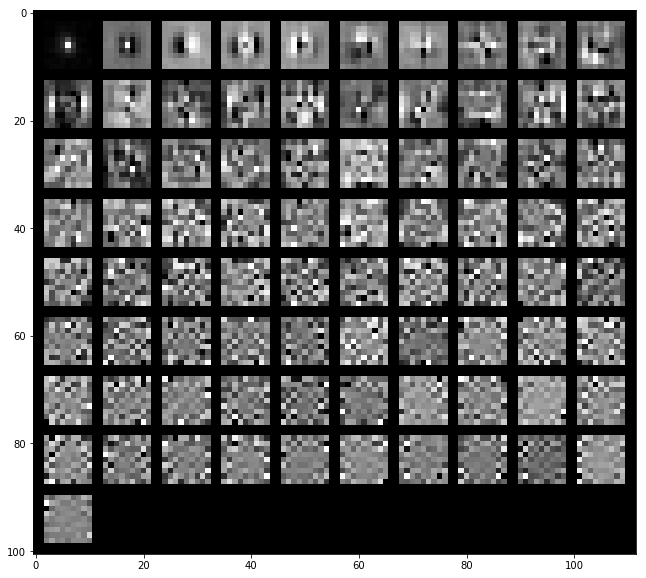

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2134/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15478111 0.24832456 0.32578464 0.38914117 0.43620365 0.47790465
 0.51852092 0.5525401  0.58529077 0.61382301 0.63895573 0.66089472
 0.6820802  0.70100214 0.71905921 0.73543782 0.75157186 0.76623767
 0.78036991 0.79323099]


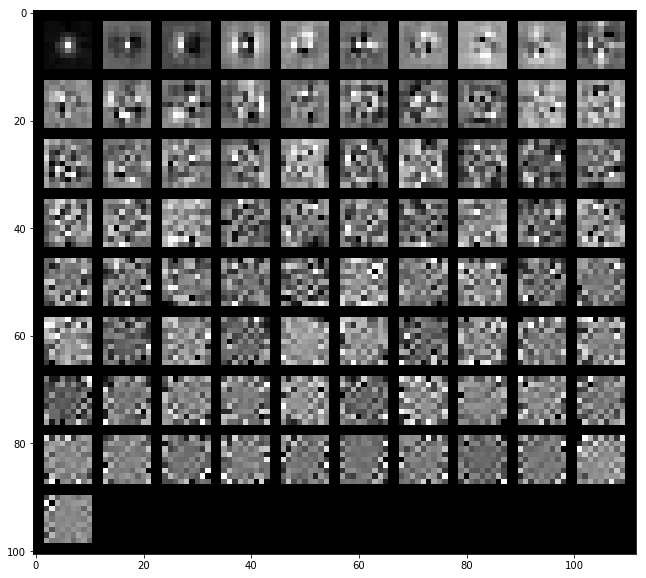

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20194609 0.30753842 0.37326978 0.41798744 0.45979035 0.49770961
 0.53083569 0.56281272 0.59069269 0.61772004 0.63915353 0.65883387
 0.67787646 0.69581907 0.7131277  0.72894312 0.74370565 0.75730458
 0.77060855 0.78324108]


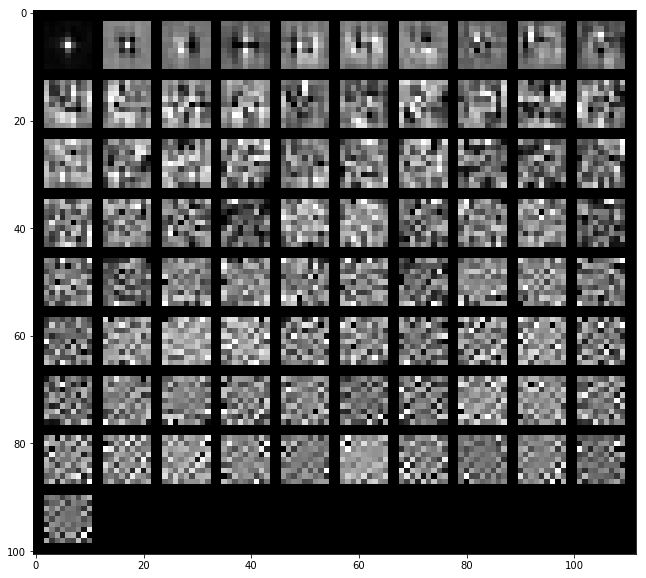

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1760181  0.27130721 0.33769466 0.39126299 0.43387094 0.47312657
 0.5094366  0.53794298 0.56416615 0.58936082 0.61174672 0.63240876
 0.65200264 0.66976724 0.68682544 0.70347281 0.71875376 0.73300658
 0.74639993 0.75875863]


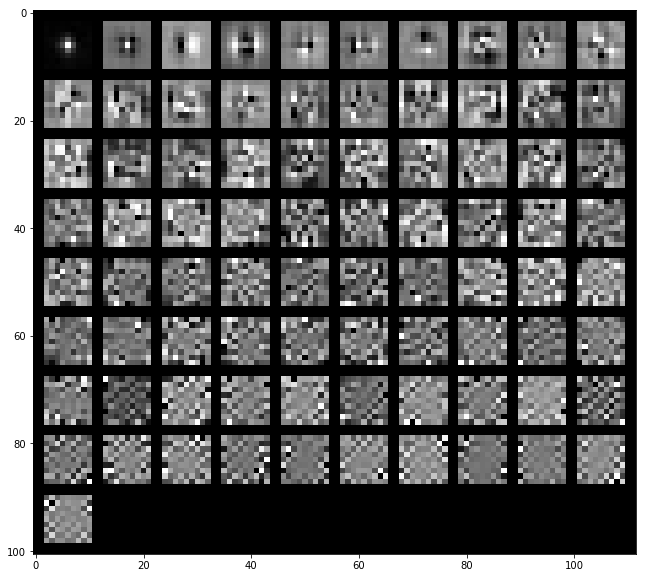

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2146/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19375539 0.28644171 0.36009054 0.41493416 0.46647168 0.5123033
 0.55613701 0.58768029 0.61714177 0.64484839 0.66890279 0.69174659
 0.71367866 0.73459556 0.75342617 0.76971129 0.78554826 0.79948371
 0.8121176  0.82403081]


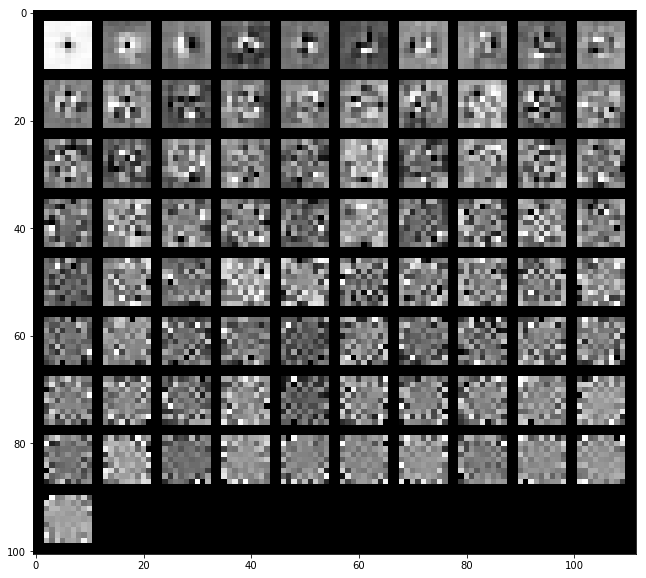

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.31611077 0.3972598  0.44453657 0.48135862 0.5157815  0.54804546
 0.57798949 0.60487997 0.629327   0.65163662 0.67153509 0.69065979
 0.70809131 0.72465417 0.74048044 0.75502564 0.7686336  0.78185324
 0.794324   0.80606123]


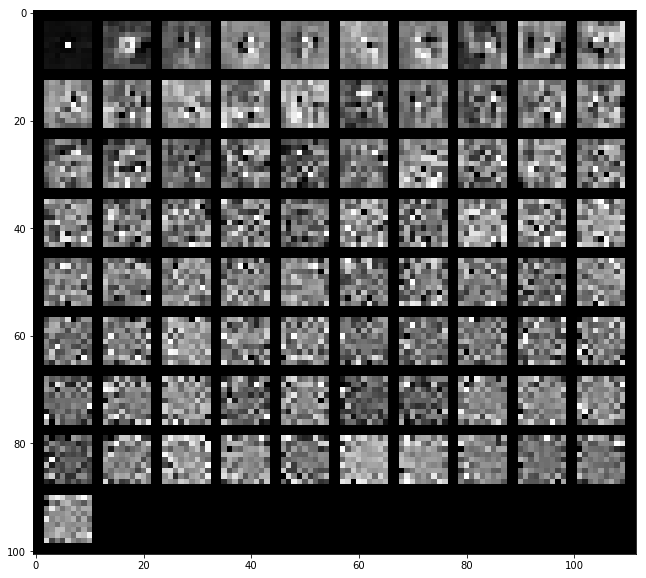

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.25824016 0.34329428 0.39469397 0.43591836 0.47511319 0.50853066
 0.54036783 0.56914293 0.59323412 0.61605729 0.63717686 0.65702645
 0.67538247 0.6927796  0.70954517 0.72539811 0.74026448 0.75421694
 0.766787   0.77856979]


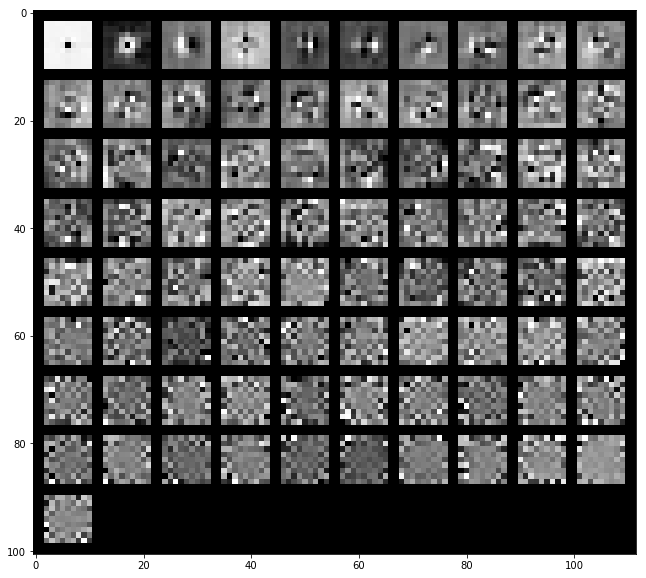

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2147/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.10588072 0.17647377 0.24455443 0.3065744  0.35807163 0.40714634
 0.44593994 0.48201428 0.51740478 0.54758221 0.57534105 0.60105351
 0.62496261 0.64558106 0.66582474 0.68460023 0.70201926 0.71900972
 0.73390054 0.74766396]


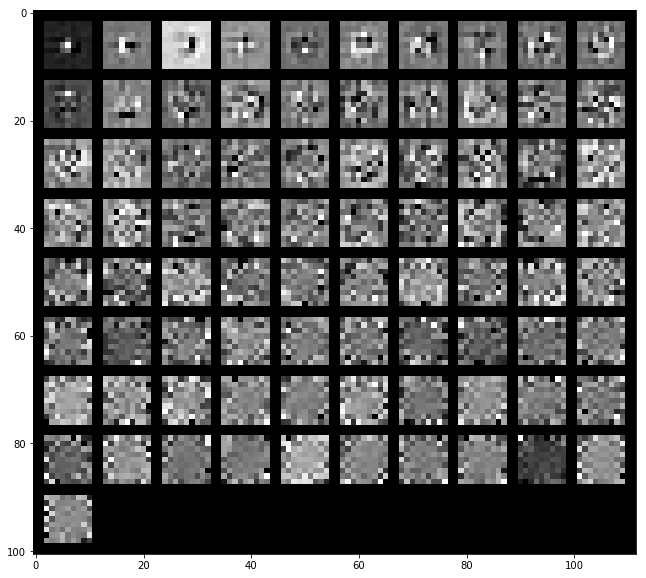

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14132095 0.22400269 0.30202322 0.36011149 0.40904548 0.44863622
 0.48486146 0.52018102 0.55103278 0.58102869 0.6062025  0.62980706
 0.65186563 0.67227492 0.69186393 0.70816473 0.72404649 0.73919441
 0.75278651 0.76503616]


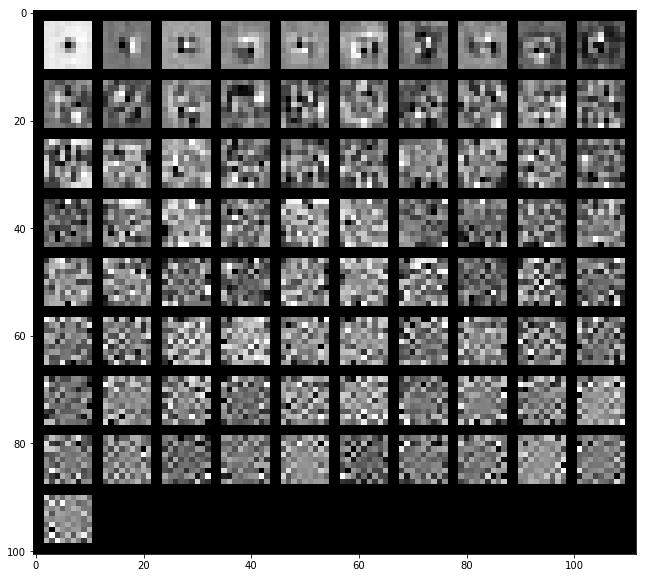

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12088987 0.19671381 0.26755604 0.31755753 0.36415714 0.40475867
 0.44164962 0.47506735 0.50665828 0.53586479 0.56143377 0.58508541
 0.60713114 0.62756023 0.64603107 0.66389411 0.67921911 0.69366057
 0.70657357 0.7192507 ]


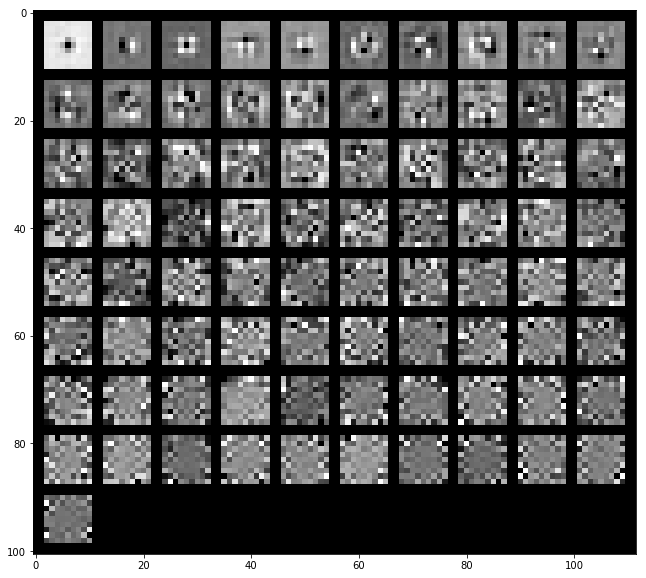

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2158/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18883257 0.27716436 0.36151875 0.42531995 0.47517401 0.52103544
 0.56345961 0.59549976 0.62200085 0.64586069 0.66838506 0.6893224
 0.70947324 0.72746259 0.74447922 0.76001972 0.77479759 0.78752489
 0.79983689 0.81130088]


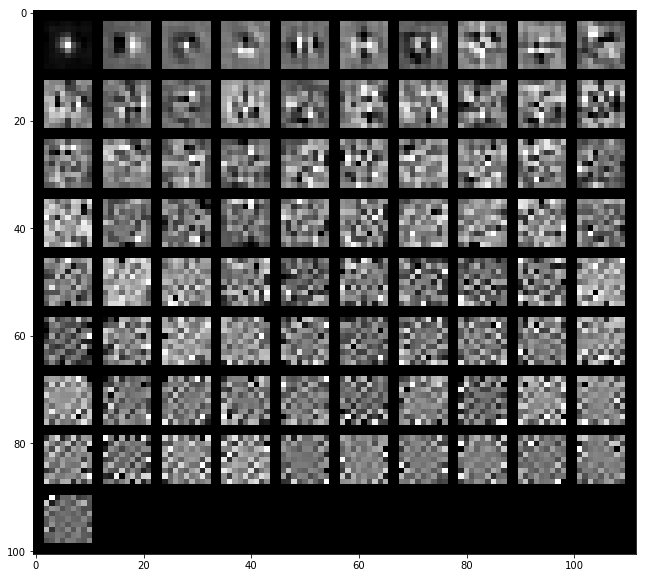

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19354379 0.307509   0.38809101 0.44165359 0.48393692 0.52058769
 0.55324889 0.58005361 0.60546539 0.62856086 0.64958378 0.66944125
 0.68745806 0.70453204 0.72074313 0.73619204 0.74977154 0.76196307
 0.77398472 0.78556339]


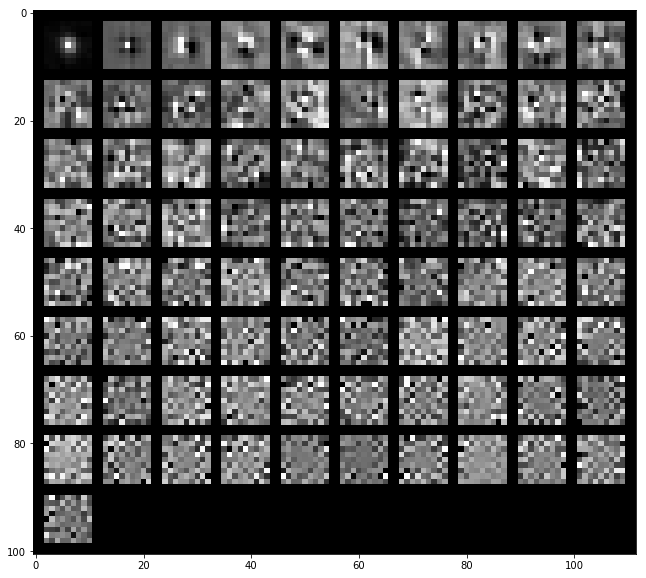

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18856793 0.28375291 0.36502615 0.42097644 0.46394759 0.50380052
 0.53853605 0.56683477 0.59291629 0.61630369 0.63690548 0.65643754
 0.67486559 0.69134303 0.70695262 0.72181391 0.73516546 0.74825001
 0.7605874  0.77212539]


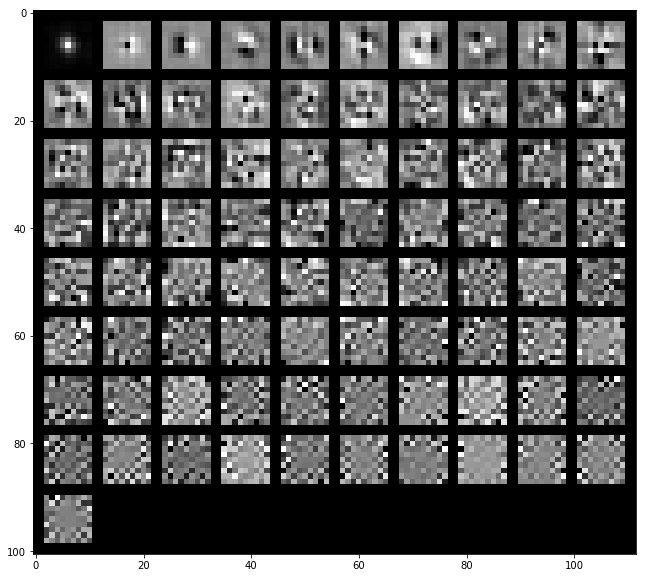

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2159/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.19054372 0.285112   0.37081623 0.43862235 0.49028821 0.53981365
 0.57813256 0.61077977 0.63899835 0.66607048 0.69104619 0.71156098
 0.73151979 0.75017186 0.76580932 0.7797528  0.79321518 0.80548331
 0.81667649 0.82639854]


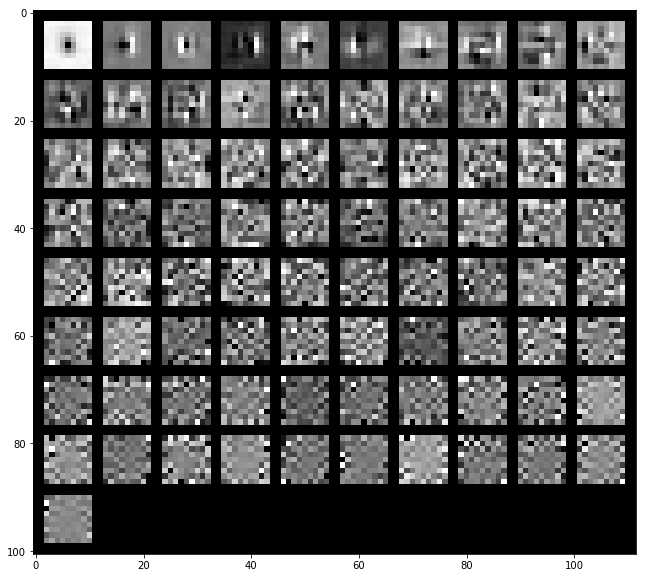

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.22654711 0.35883474 0.43542326 0.48910399 0.53200385 0.56848183
 0.60131869 0.62937117 0.65242631 0.67472709 0.69441529 0.71216825
 0.72843402 0.74418798 0.75837798 0.77177187 0.78493568 0.79686308
 0.80833569 0.8194171 ]


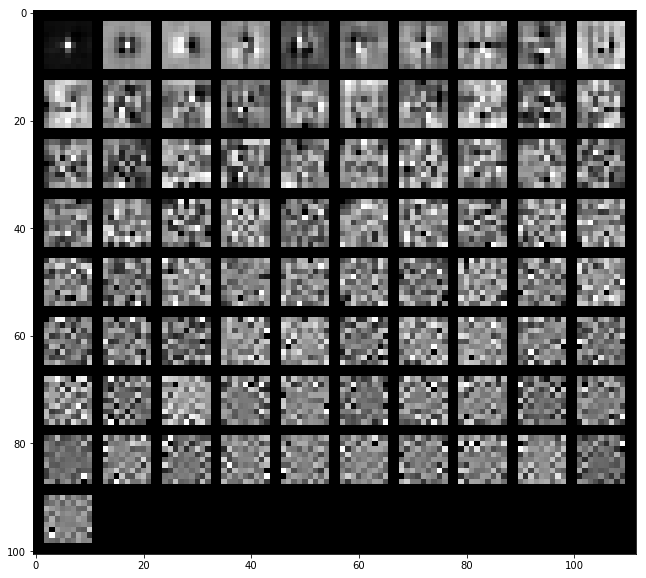

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.20377613 0.31711003 0.3960394  0.45288167 0.49878874 0.54204891
 0.57724473 0.60501845 0.63013469 0.65212668 0.67288394 0.69196746
 0.70838289 0.72370023 0.73850791 0.75264916 0.76626667 0.77855356
 0.79054314 0.80213183]


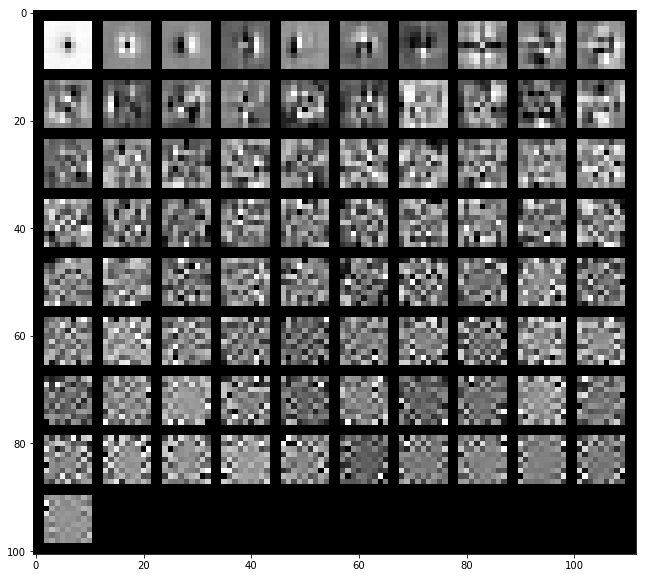

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2171/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.15121039 0.25230803 0.32725248 0.38050309 0.43261319 0.47663506
 0.51235418 0.5436735  0.57245431 0.5999876  0.62588242 0.648372
 0.66931136 0.68925454 0.70837983 0.72451525 0.73997081 0.7548918
 0.76887413 0.78176822]


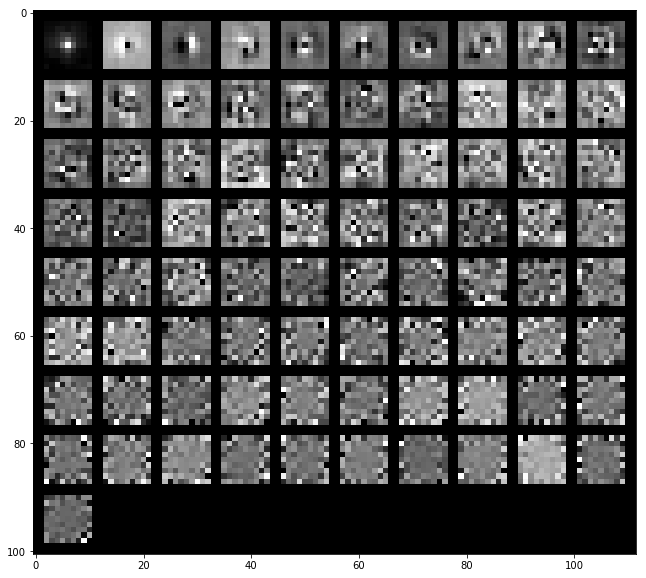

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16963206 0.2673268  0.33734746 0.39933464 0.45312225 0.49230108
 0.52867487 0.56242533 0.59052086 0.61488888 0.63919765 0.66082264
 0.67952205 0.69735973 0.71447575 0.73046761 0.7449911  0.75922531
 0.77257381 0.78545246]


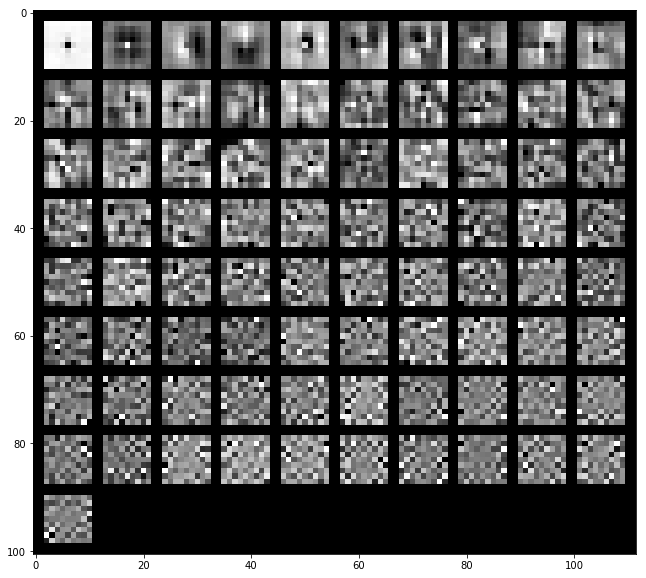

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1562513  0.25161713 0.3181315  0.36910018 0.41755481 0.45547648
 0.48957357 0.51944653 0.54665683 0.57294201 0.59584376 0.61826201
 0.63771267 0.65627184 0.67317628 0.68883444 0.70373803 0.71824859
 0.73143196 0.74437437]


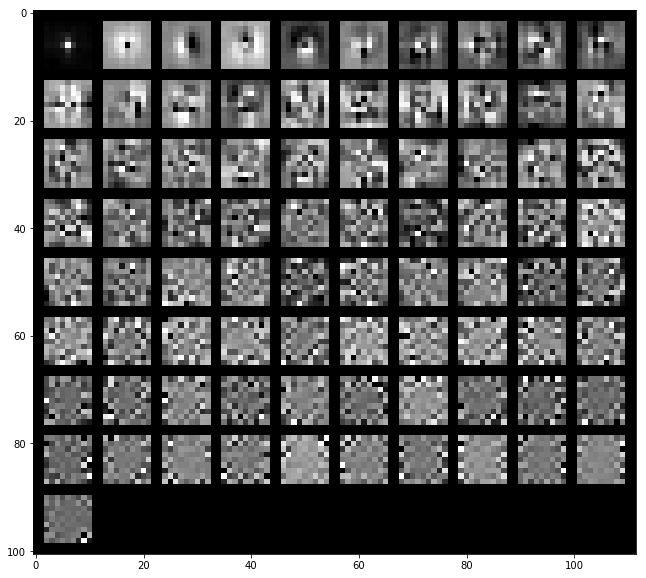

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2182/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1521793  0.2456038  0.32642834 0.38490573 0.43022412 0.4712563
 0.50569195 0.53636182 0.56578975 0.59225264 0.61643982 0.63848276
 0.65916257 0.67885877 0.69802488 0.71616644 0.73223457 0.74729019
 0.76105767 0.77391097]


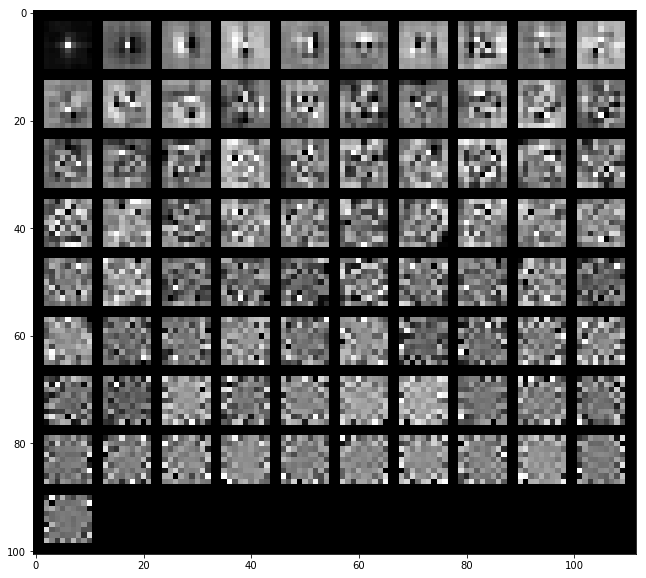

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.18867226 0.29367559 0.35787108 0.4179294  0.46166994 0.50322273
 0.53519499 0.56603891 0.59543668 0.62214217 0.64595844 0.66583555
 0.68479173 0.70166005 0.71739261 0.7321613  0.74666181 0.76043288
 0.77295778 0.7849159 ]


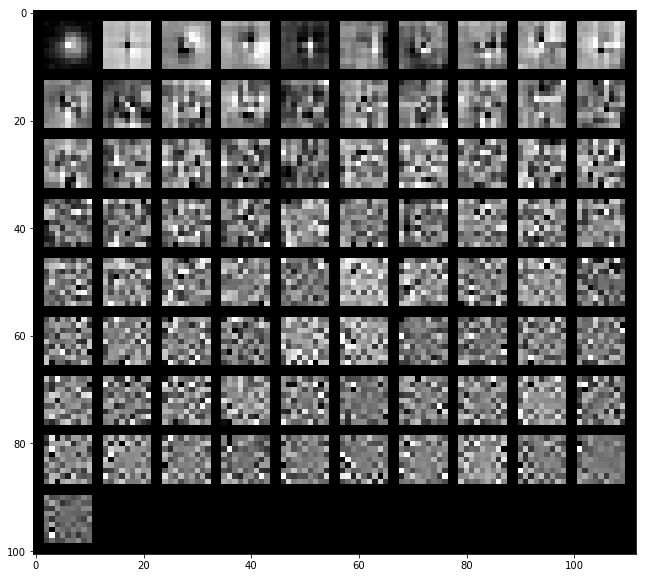

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16430231 0.26575438 0.33315032 0.38066816 0.42390602 0.46394712
 0.49752378 0.52773838 0.55520635 0.58064569 0.60358649 0.62474254
 0.64297345 0.66051721 0.67698485 0.6922757  0.70733596 0.72164995
 0.7347366  0.74732201]


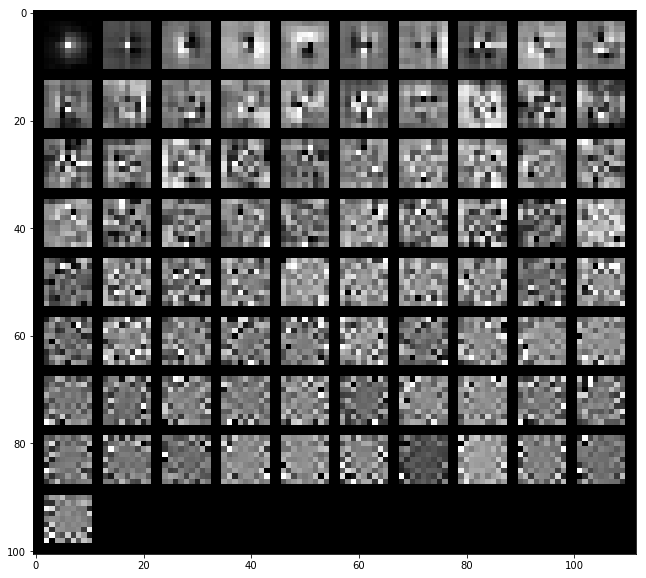

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2183/actsoftplus/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.158264   0.24078988 0.31016786 0.36804167 0.41931713 0.45928323
 0.49751018 0.53250956 0.56321832 0.59072196 0.61623871 0.63845286
 0.65970672 0.6799446  0.69924754 0.71754433 0.73474825 0.74983787
 0.76444996 0.77840309]


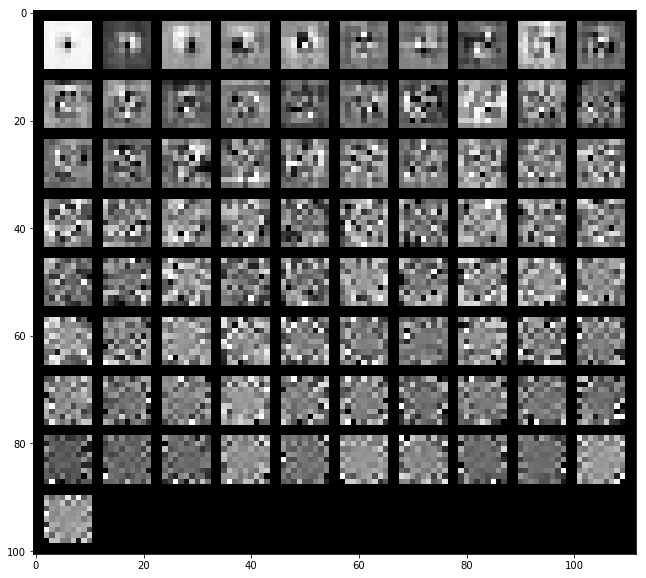

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17388575 0.26547531 0.3379601  0.38971068 0.43284982 0.47414998
 0.50807365 0.53834325 0.5662123  0.59219512 0.61728727 0.64091439
 0.66261353 0.6838909  0.70155767 0.71715193 0.7319593  0.7463704
 0.75992508 0.77298015]


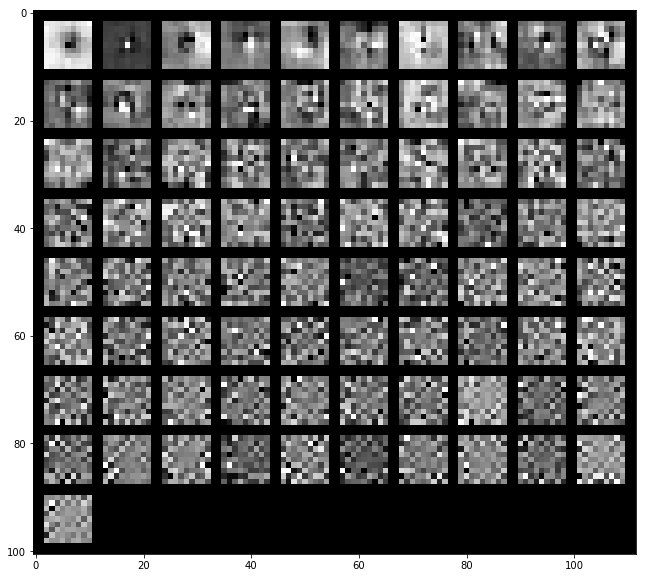

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.14181925 0.24521797 0.30240392 0.35724509 0.40152889 0.43831095
 0.47146554 0.50062531 0.52885869 0.55496311 0.57791788 0.60000185
 0.62168386 0.64183819 0.66025144 0.6774377  0.6931732  0.70859811
 0.72285092 0.73624595]


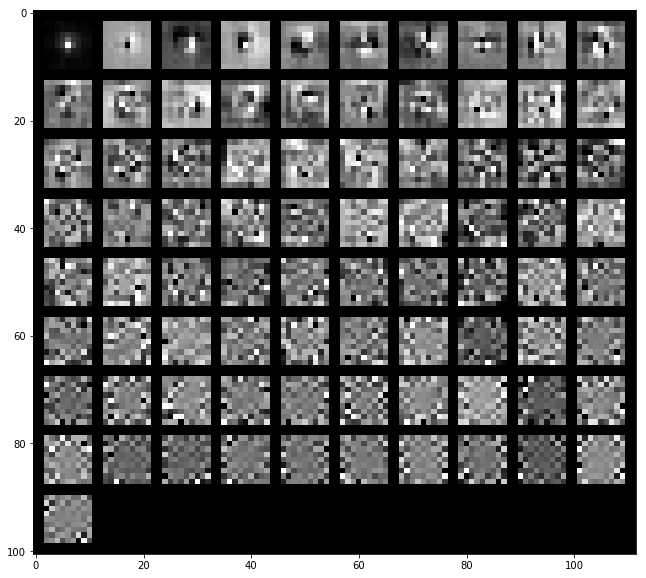

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2194/actsoftplus/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17529709 0.26045523 0.33915077 0.40328222 0.46155064 0.50736262
 0.54428535 0.57831336 0.61133966 0.63847363 0.66306526 0.68661827
 0.70781526 0.7262781  0.74352999 0.75969027 0.77504269 0.78928052
 0.80227355 0.81463265]


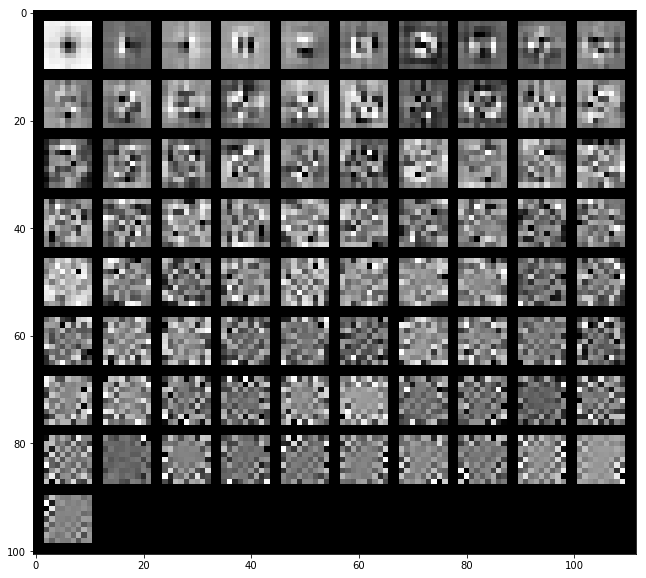

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1508576  0.23009092 0.30402676 0.37209357 0.42968727 0.47678736
 0.5169343  0.55183196 0.58190956 0.61072965 0.63520746 0.65884668
 0.67940417 0.69957477 0.71829796 0.73538947 0.75092917 0.76556346
 0.77996844 0.79327014]


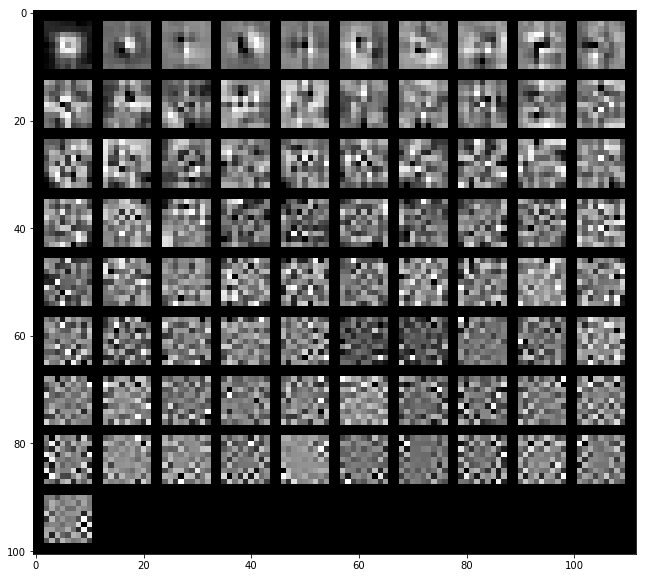

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16939589 0.2536341  0.3220561  0.38403737 0.43916391 0.48050149
 0.51509223 0.54874405 0.57724474 0.60379523 0.62887625 0.65129157
 0.67222745 0.69184959 0.71057374 0.72582914 0.74048173 0.75478053
 0.76823674 0.78088132]


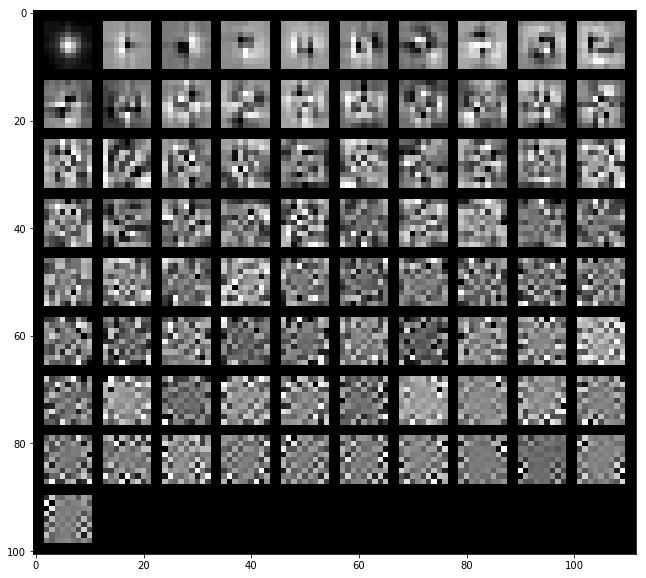

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2206/actrelu/lossmse/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12810295 0.19467383 0.25052724 0.29922799 0.34404394 0.3882879
 0.42784853 0.46281982 0.49426218 0.5243692  0.55077864 0.57512936
 0.59825212 0.62077033 0.64170015 0.6605648  0.67882998 0.6948714
 0.71064018 0.7257883 ]


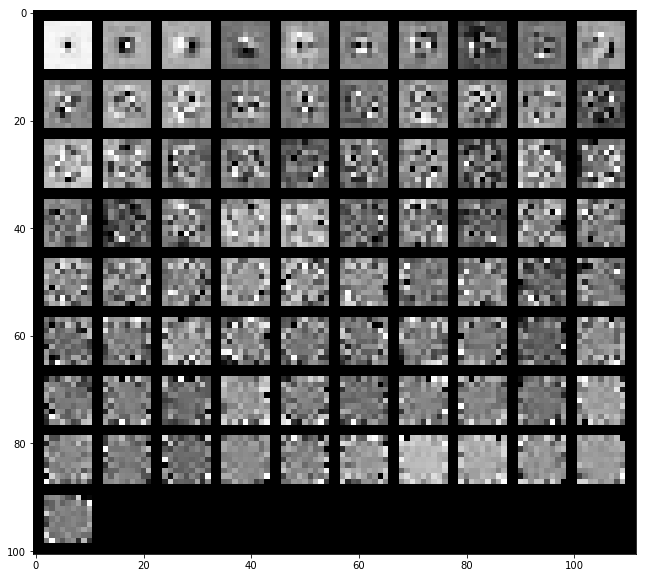

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.12692851 0.21383937 0.27094735 0.31543271 0.35525609 0.3922928
 0.42648726 0.45648044 0.48531315 0.5122586  0.53579985 0.55704056
 0.57778384 0.59756091 0.616373   0.63381945 0.65019536 0.6661398
 0.68103343 0.69581177]


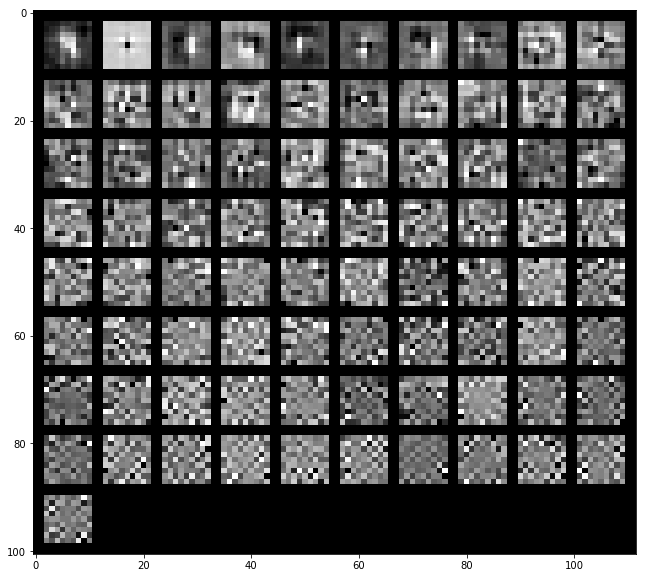

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.11214702 0.19309729 0.24520848 0.290732   0.33179265 0.37010681
 0.40297071 0.43372989 0.4614653  0.48801139 0.51073377 0.53186784
 0.55273819 0.57239202 0.59077714 0.60802858 0.62508231 0.64150873
 0.65697058 0.67199718]


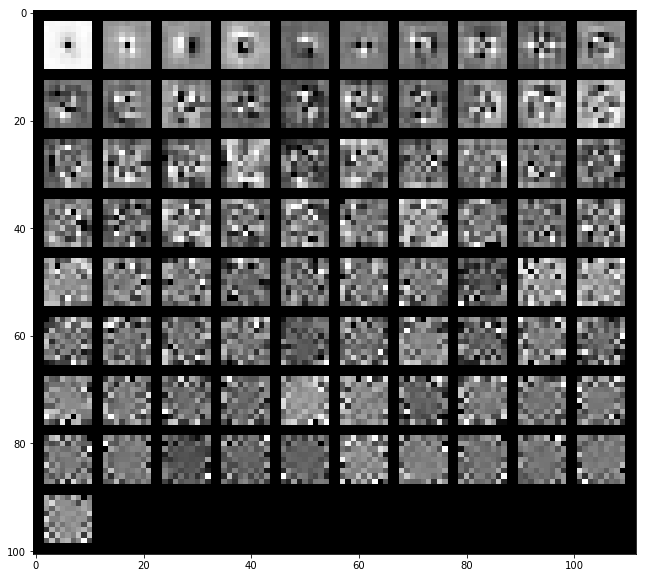

yuanyuan_8k_a_3day/feature_approximation_lpcn_recurrent_sep2/baseidx2207/actrelu/lossl1/k9/bn_preTrue/model_seed0
lateral
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.16455794 0.26188455 0.33358966 0.38597846 0.43695644 0.48357401
 0.51784869 0.54999032 0.58014548 0.60743332 0.63133201 0.65430766
 0.67356684 0.69202527 0.70988594 0.72607282 0.74110677 0.75583551
 0.76932938 0.78164252]


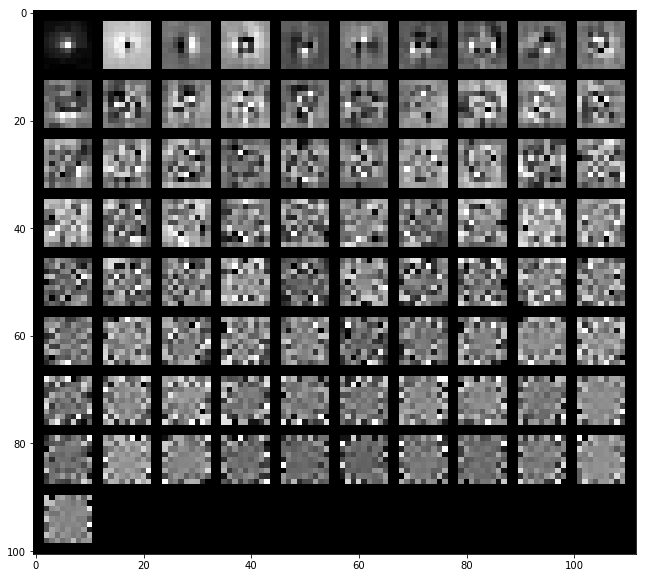

ff
weight_matrix_norm float64 (256, 1)
weight_matrix float64 (256, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.17019657 0.28988631 0.35747175 0.42163905 0.46648992 0.50448017
 0.53882343 0.56769661 0.59248373 0.61601426 0.63847815 0.6594495
 0.67947015 0.69700682 0.713668   0.72919    0.74325903 0.75640372
 0.7691495  0.78106356]


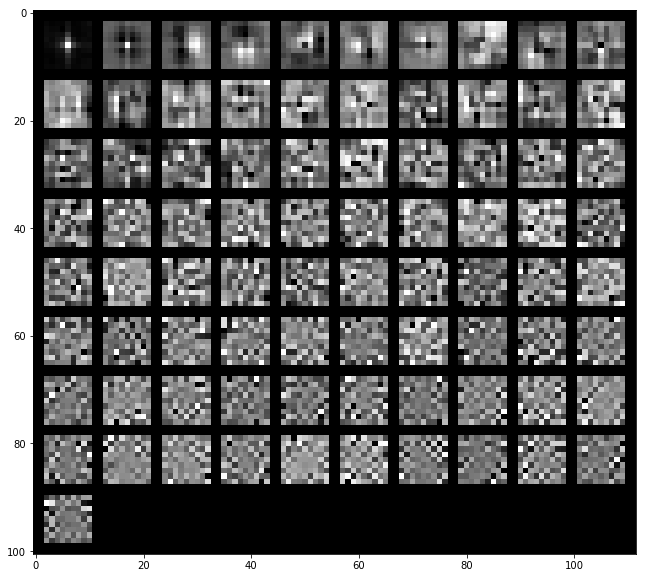

all
weight_matrix_norm float64 (512, 1)
weight_matrix float64 (512, 81)
components float64 (81, 81)
explained_variance_ratio float64 (81,)
[0.1658988  0.27233648 0.33589535 0.38695423 0.43031227 0.46982406
 0.50425682 0.53215658 0.55901413 0.58418535 0.6079419  0.62859517
 0.64823274 0.66538572 0.68131688 0.69636175 0.71070719 0.72447604
 0.7376073  0.75018283]


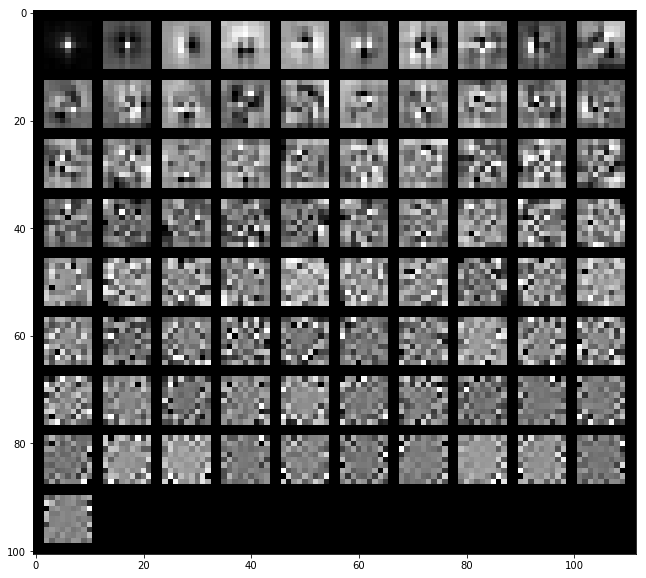

1536


In [12]:
collect_all()